In [64]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import sys

Blank Image


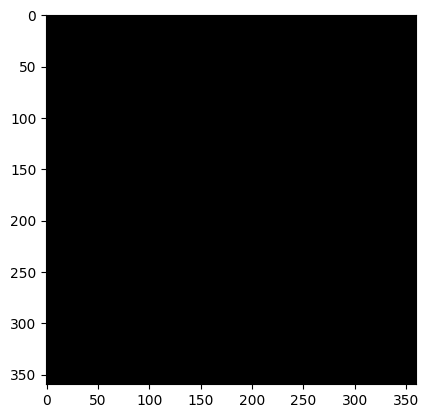

In [65]:
IMG_DIMS = (360,360)
CENTER = (IMG_DIMS[0]//2, IMG_DIMS[1]//2)
RADIUS = 160

WHITE = (255, 255, 255)

image = np.zeros(IMG_DIMS, dtype=np.uint8)

print("Blank Image")
plt.imshow(image, cmap='gray')

For a image, assuming camera is focused in the center of image, find the variances of subcircles of varius radii and try to find the smallest circle outside of which image starts to become blurred.

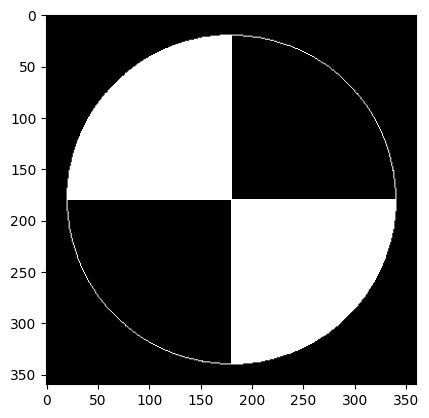

In [66]:
# Draw Quadrants.
image = cv2.ellipse(image, CENTER, axes=(RADIUS, RADIUS), angle=0, startAngle=0, endAngle=90, color=WHITE)
image = cv2.ellipse(image, CENTER, axes=(RADIUS, RADIUS), angle=0, startAngle=90, endAngle=180, color=WHITE)
image = cv2.ellipse(image, CENTER, axes=(RADIUS, RADIUS), angle=0, startAngle=180, endAngle=270, color=WHITE)
image = cv2.ellipse(image, CENTER, axes=(RADIUS, RADIUS), angle=0, startAngle=270, endAngle=360, color=WHITE)


# Draw lines to seperate quadrants.
image = cv2.line(image, (IMG_DIMS[0]//2 - 160, IMG_DIMS[1]//2), (IMG_DIMS[0]//2 + 160, IMG_DIMS[1]//2), color=WHITE)
image = cv2.line(image, (IMG_DIMS[0]//2, IMG_DIMS[1]//2 - RADIUS), (IMG_DIMS[0]//2, IMG_DIMS[1]//2 + RADIUS), color=WHITE)

# Fill in colors.
cv2.floodFill(image, None, (IMG_DIMS[0]//2 - 80, IMG_DIMS[1]//2 - RADIUS//2), 255)
cv2.floodFill(image, None, (IMG_DIMS[0]//2 + 80, IMG_DIMS[1]//2 + RADIUS//2), 255)
plt.imshow(image, cmap='gray')

In [67]:
# Capture the original variances for varius radii.
original_variances = []
laplacian_filter_8 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

for i in range(0, RADIUS, 5):
    edge_mask = cv2.filter2D(image, -1, laplacian_filter_8)
    mask = np.zeros(IMG_DIMS, dtype=np.uint8)
    curr_radius_check_range = cv2.circle(mask, CENTER, i, (255, 255, 255), -1)
    curr_region_to_check = cv2.bitwise_and(edge_mask, curr_radius_check_range)
    original_variances.append(curr_region_to_check.var())

print(original_variances)
            

[0.5017322396905008, 10.534751036844142, 20.564672697509433, 30.59149722168638, 40.61522460937499, 50.63585486057527, 60.65338797528718, 70.6678239535108, 80.67916279524603, 90.68740450049302, 100.69254906925157, 110.6945965015218, 120.69354679730363, 130.6893999565972, 140.68215597940247, 150.67181486571928, 160.65837661554784, 170.64184122888798, 180.62220870573987, 190.59947904610337, 200.57365224997852, 210.54472831736535, 220.51270724826398, 230.47758904267417, 240.43937370059587, 250.39806122202933, 260.3536516069745, 270.3061448554312, 280.2555409673997, 290.2018399428798, 300.1450417818715, 310.0851464843751]


blurred image with box blur kernel :  5  x  5


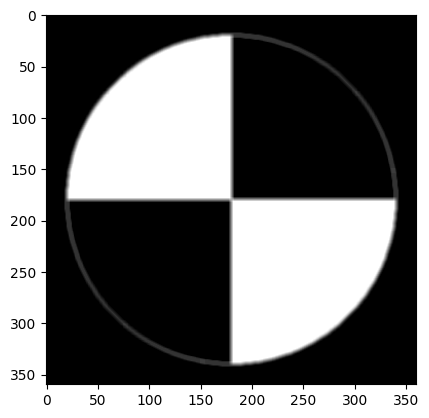

Region with focal radius : 10




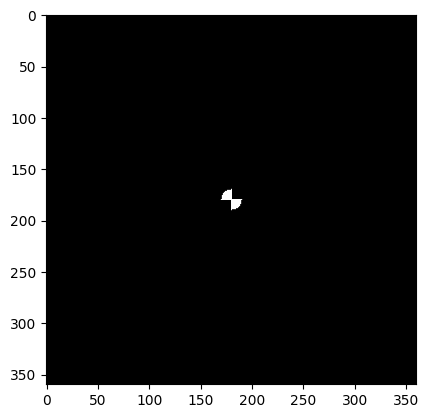

Test image with radius  10  being sharp with rest as blurred


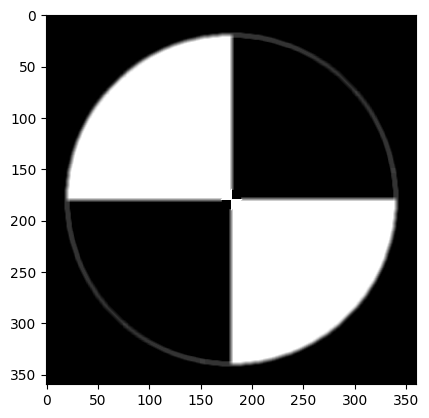

difference in test image and filtered non blurred region (in circular fasion)


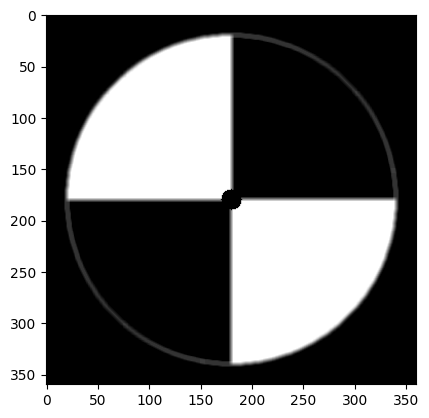

Visualization of separation of non blurred and blurred parts (radius = fr)


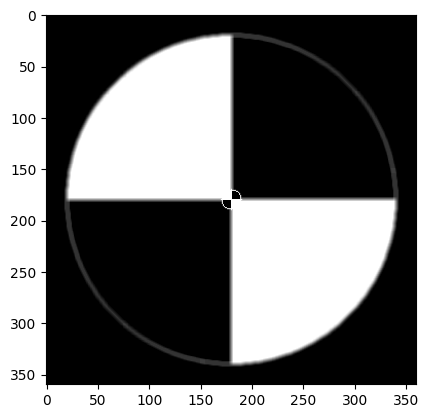

Laplacian Edge Mask


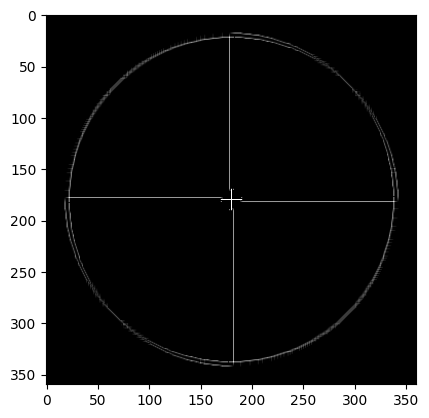

L O G edge mask


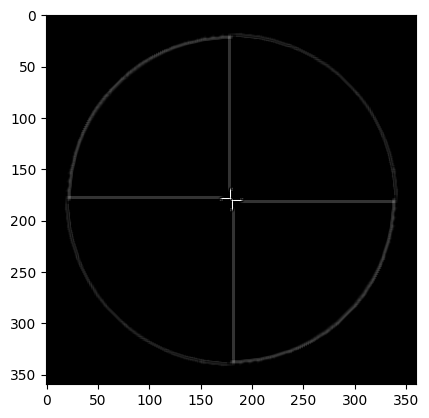

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


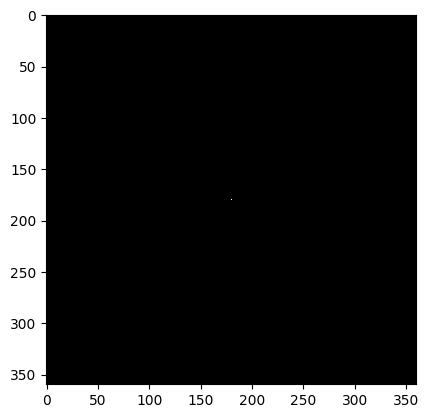

variance difference;  0.0
5   32
Currently checking region with radius :  5


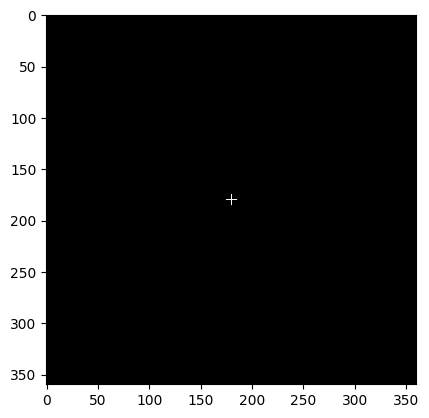

variance difference;  0.0
10   32
Currently checking region with radius :  10


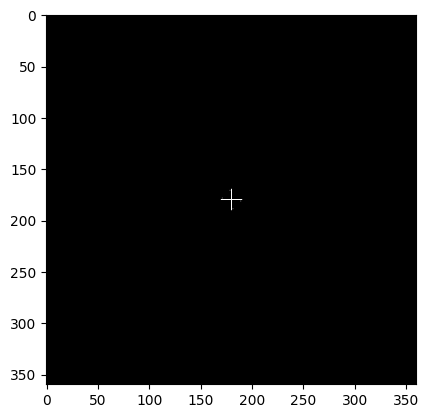

BLUR DETECTED AT RADIUS :  10
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  10
Differnece in variance :  -0.16003771433471314
Region with focal radius : 20




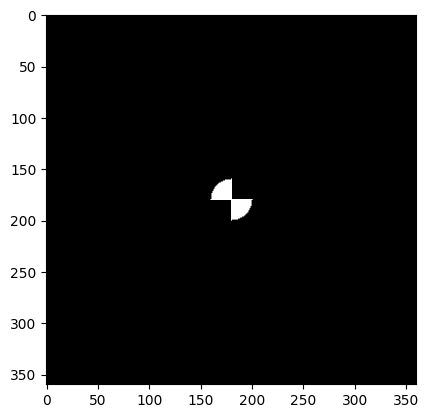

Test image with radius  20  being sharp with rest as blurred


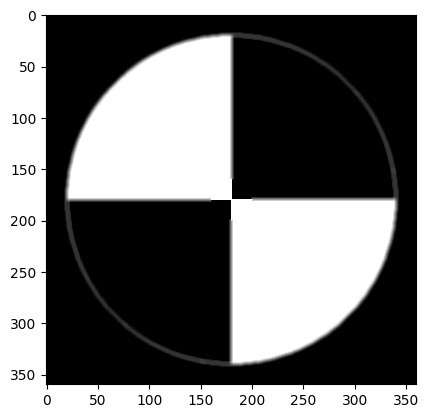

difference in test image and filtered non blurred region (in circular fasion)


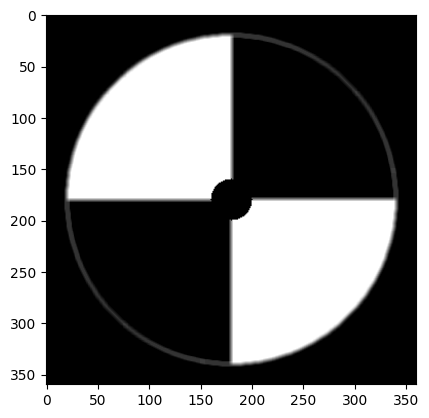

Visualization of separation of non blurred and blurred parts (radius = fr)


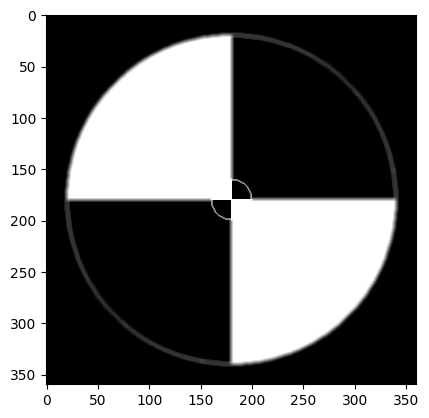

Laplacian Edge Mask


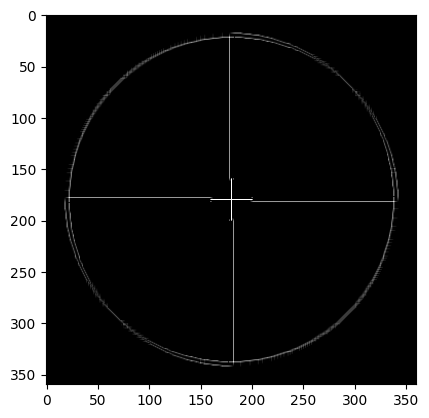

L O G edge mask


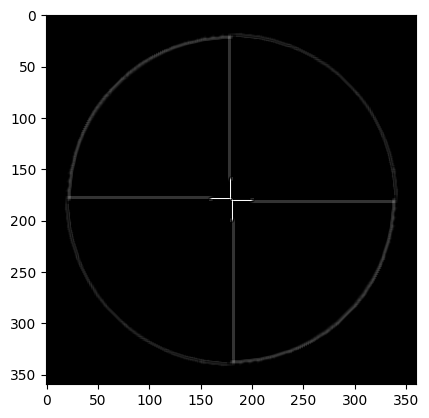

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


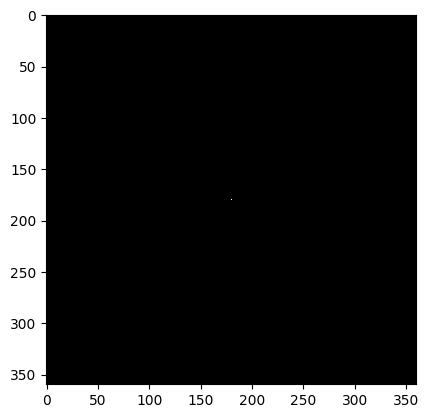

variance difference;  0.0
5   32
Currently checking region with radius :  5


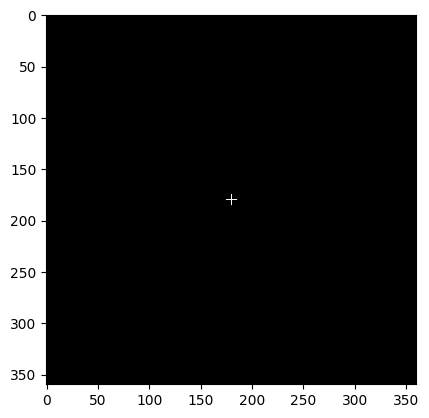

variance difference;  0.0
10   32
Currently checking region with radius :  10


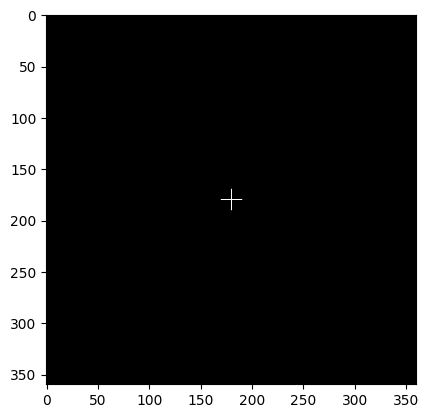

variance difference;  0.0
15   32
Currently checking region with radius :  15


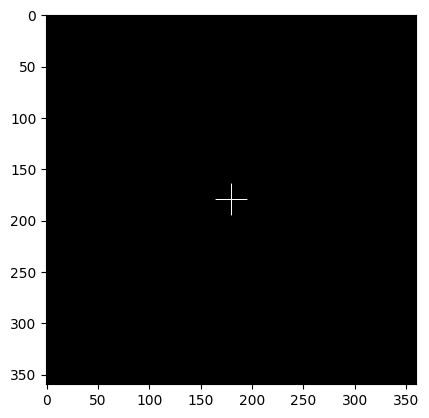

variance difference;  0.0
20   32
Currently checking region with radius :  20


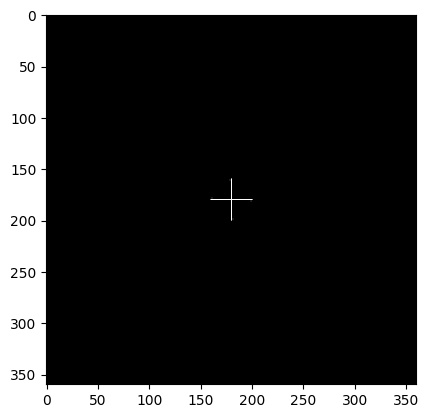

BLUR DETECTED AT RADIUS :  20
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  20
Differnece in variance :  -0.15954217249657887
Region with focal radius : 30




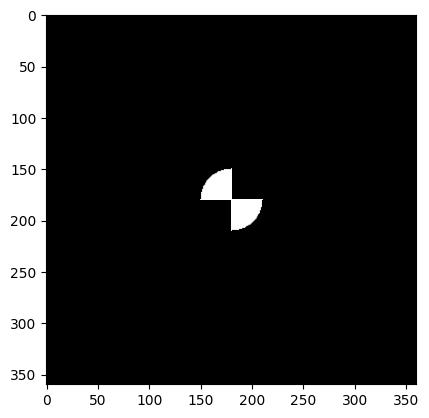

Test image with radius  30  being sharp with rest as blurred


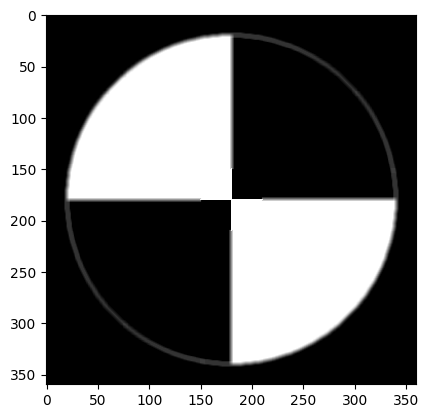

difference in test image and filtered non blurred region (in circular fasion)


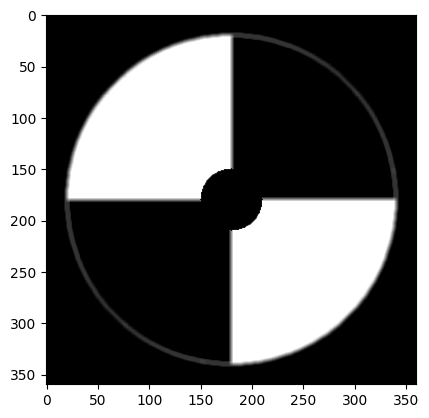

Visualization of separation of non blurred and blurred parts (radius = fr)


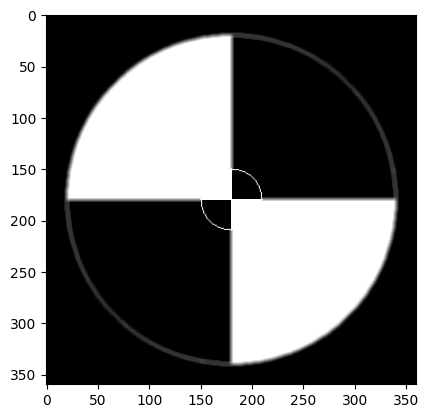

Laplacian Edge Mask


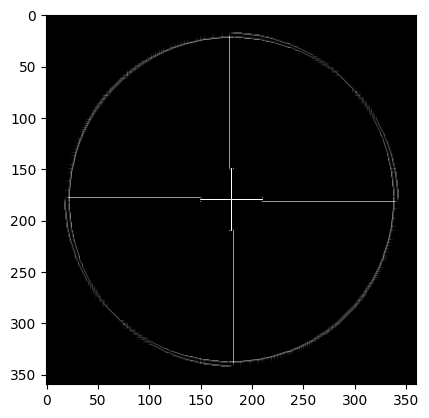

L O G edge mask


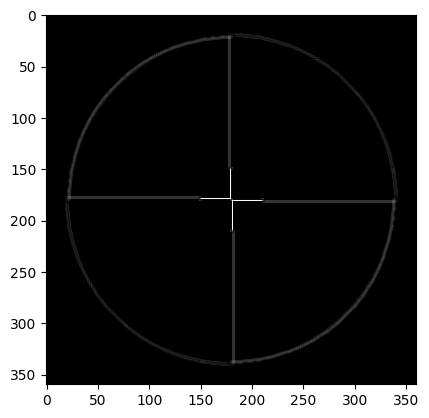

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


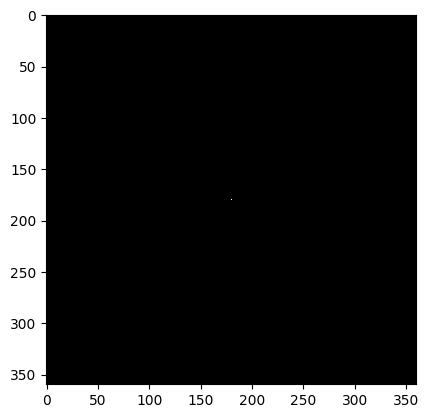

variance difference;  0.0
5   32
Currently checking region with radius :  5


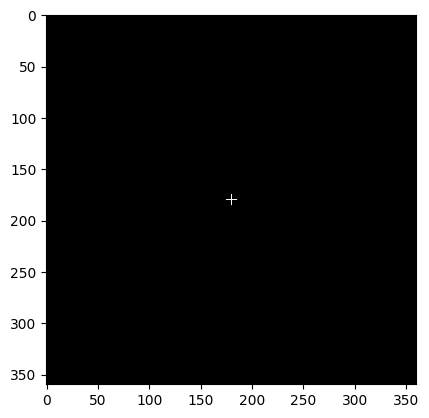

variance difference;  0.0
10   32
Currently checking region with radius :  10


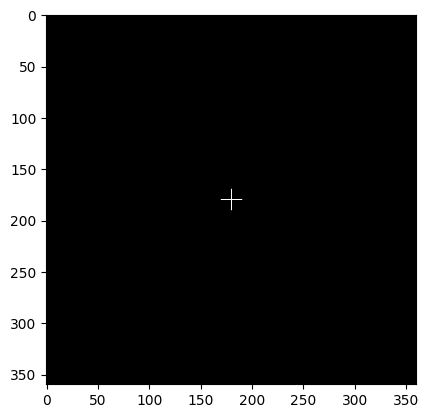

variance difference;  0.0
15   32
Currently checking region with radius :  15


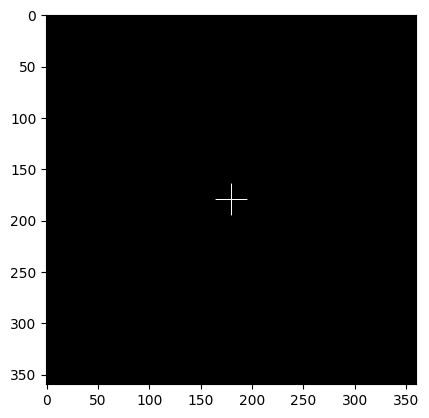

variance difference;  0.0
20   32
Currently checking region with radius :  20


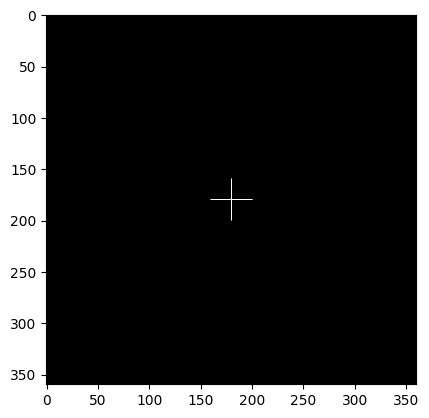

variance difference;  0.0
25   32
Currently checking region with radius :  25


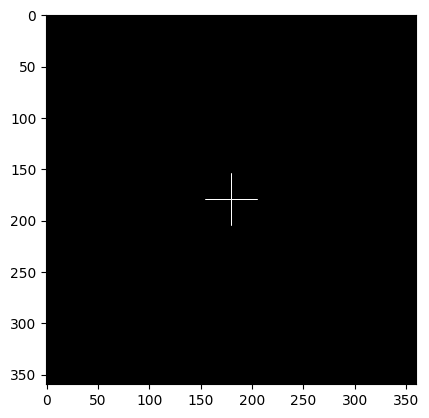

variance difference;  0.0
30   32
Currently checking region with radius :  30


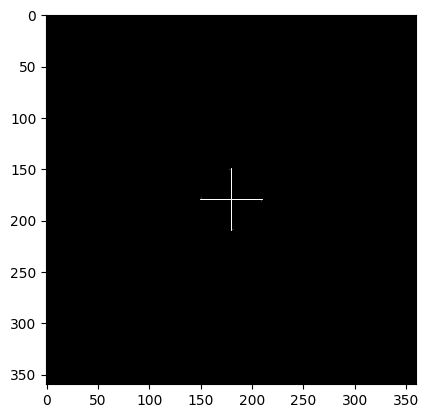

BLUR DETECTED AT RADIUS :  30
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  30
Differnece in variance :  -0.15904663065846592
Region with focal radius : 50




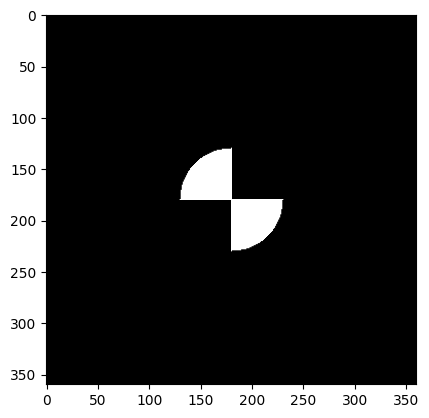

Test image with radius  50  being sharp with rest as blurred


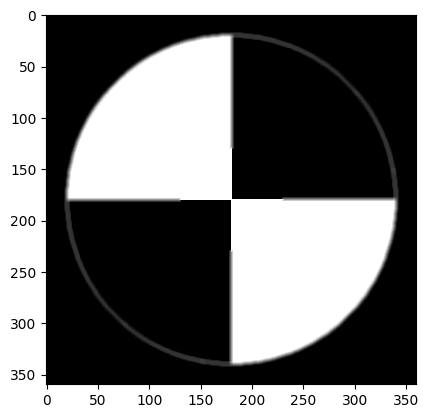

difference in test image and filtered non blurred region (in circular fasion)


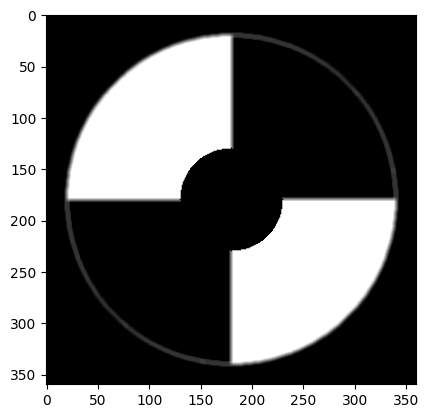

Visualization of separation of non blurred and blurred parts (radius = fr)


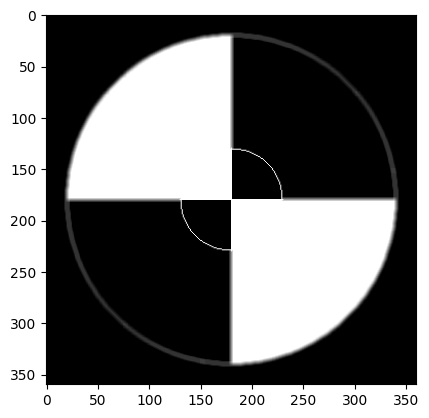

Laplacian Edge Mask


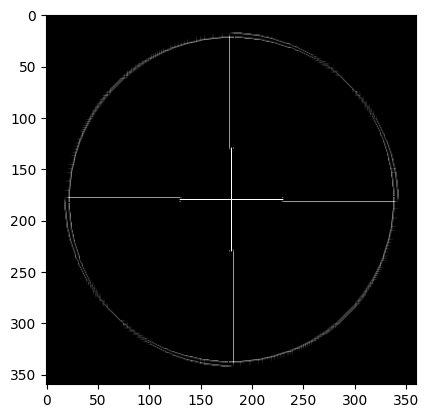

L O G edge mask


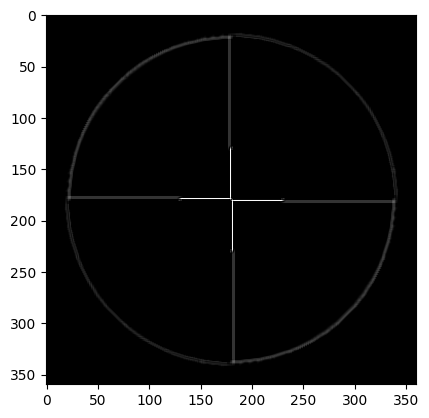

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


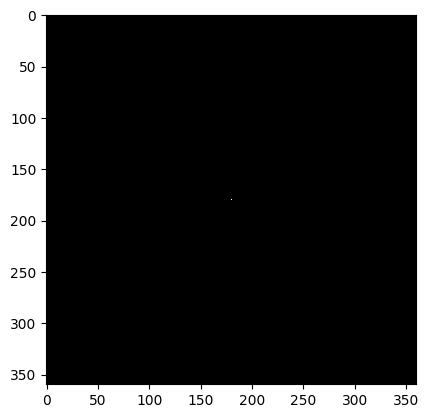

variance difference;  0.0
5   32
Currently checking region with radius :  5


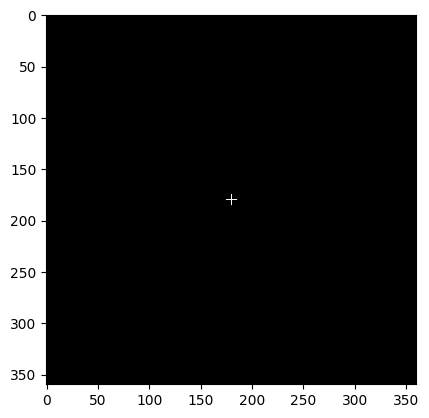

variance difference;  0.0
10   32
Currently checking region with radius :  10


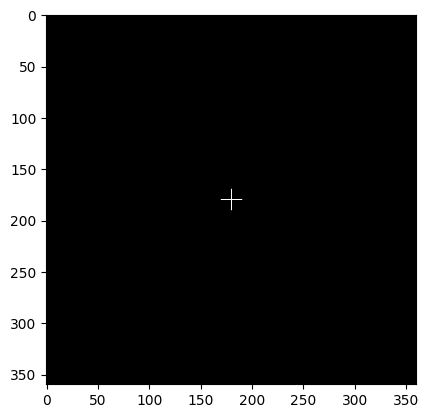

variance difference;  0.0
15   32
Currently checking region with radius :  15


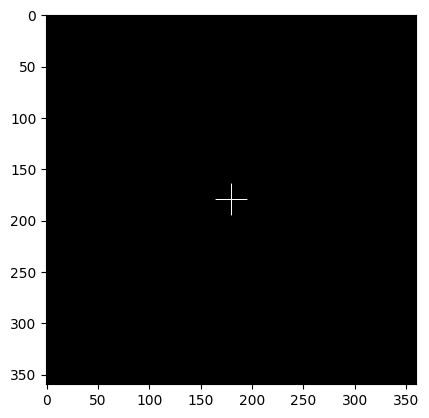

variance difference;  0.0
20   32
Currently checking region with radius :  20


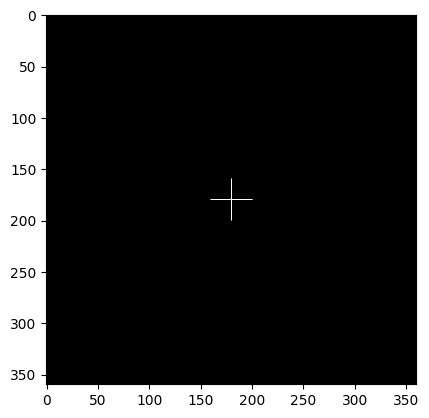

variance difference;  0.0
25   32
Currently checking region with radius :  25


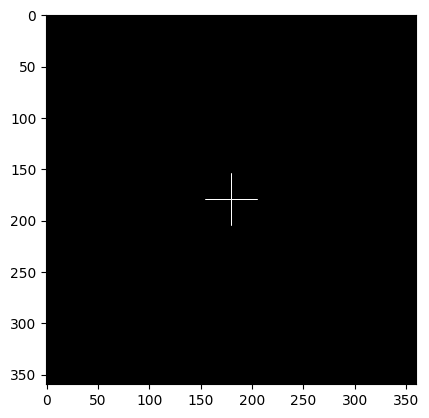

variance difference;  0.0
30   32
Currently checking region with radius :  30


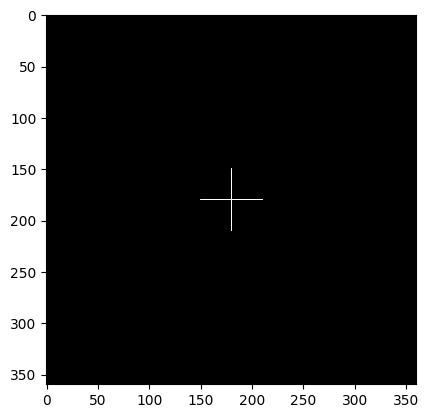

variance difference;  0.0
35   32
Currently checking region with radius :  35


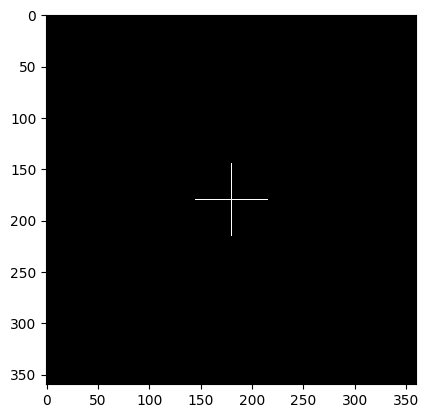

variance difference;  0.0
40   32
Currently checking region with radius :  40


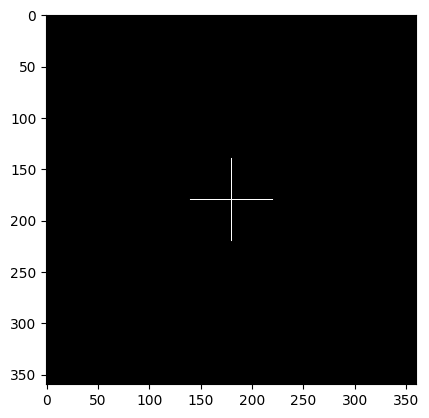

variance difference;  0.0
45   32
Currently checking region with radius :  45


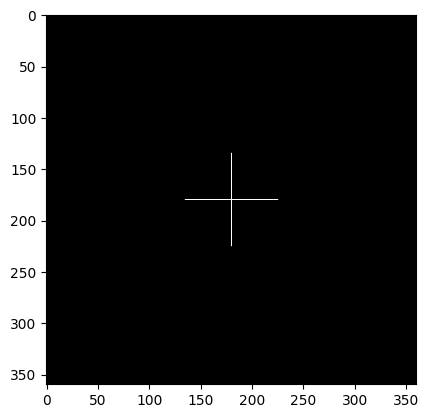

variance difference;  0.0
50   32
Currently checking region with radius :  50


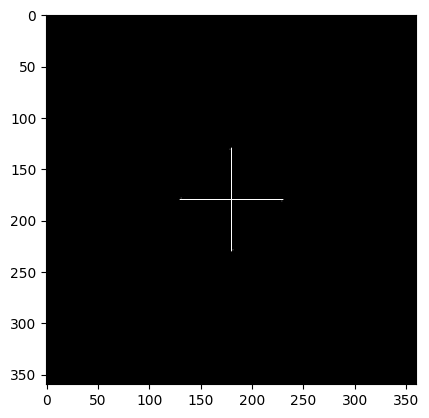

BLUR DETECTED AT RADIUS :  50
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  50
Differnece in variance :  -0.15805554698215474
Region with focal radius : 70




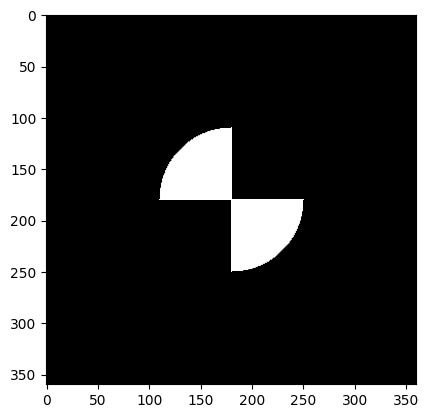

Test image with radius  70  being sharp with rest as blurred


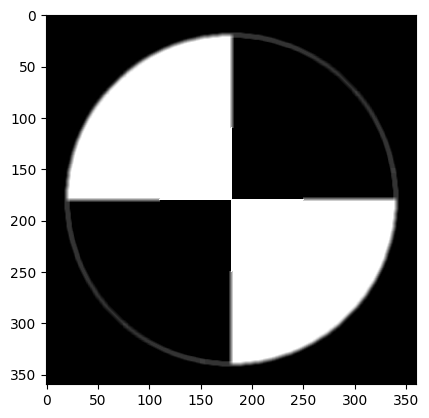

difference in test image and filtered non blurred region (in circular fasion)


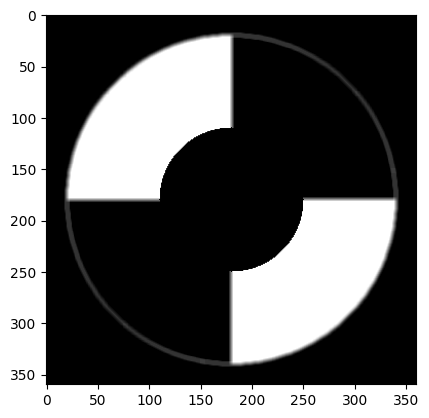

Visualization of separation of non blurred and blurred parts (radius = fr)


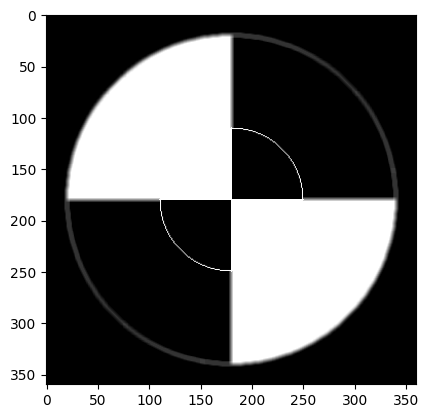

Laplacian Edge Mask


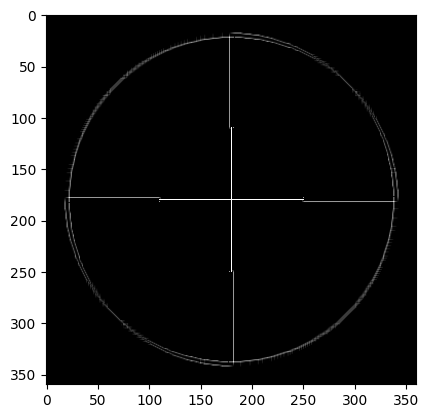

L O G edge mask


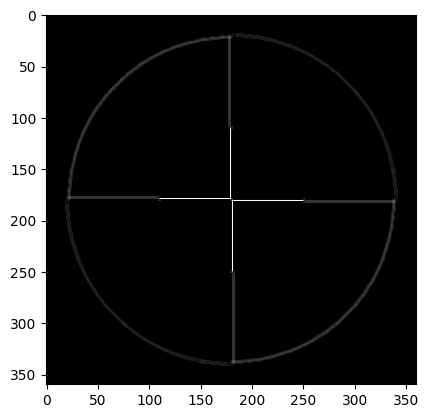

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


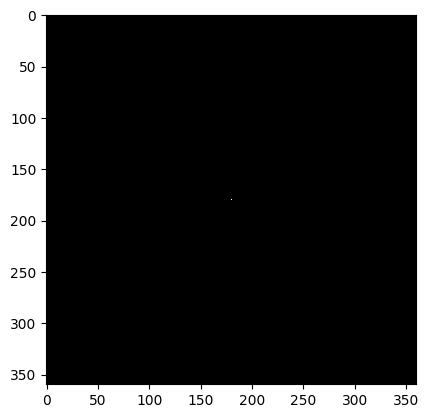

variance difference;  0.0
5   32
Currently checking region with radius :  5


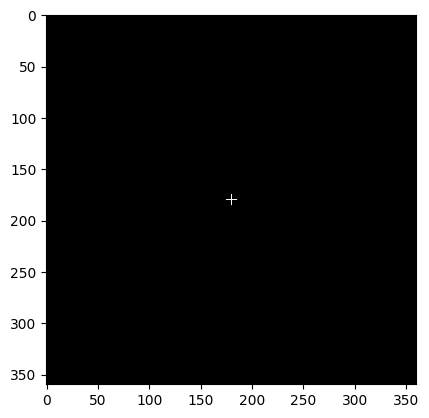

variance difference;  0.0
10   32
Currently checking region with radius :  10


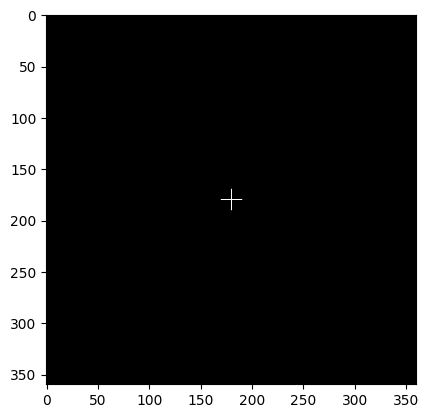

variance difference;  0.0
15   32
Currently checking region with radius :  15


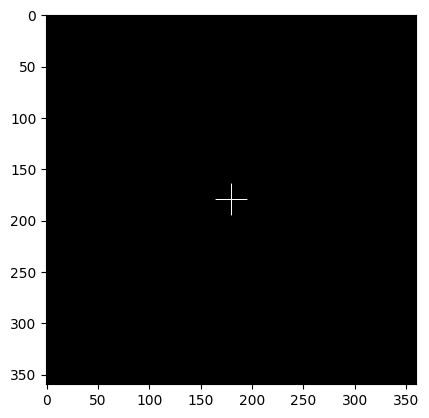

variance difference;  0.0
20   32
Currently checking region with radius :  20


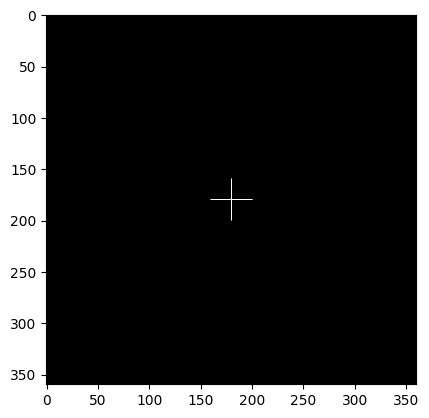

variance difference;  0.0
25   32
Currently checking region with radius :  25


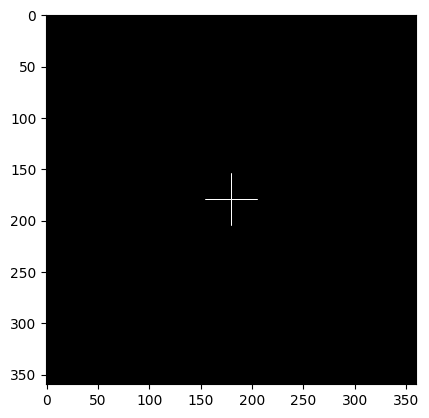

variance difference;  0.0
30   32
Currently checking region with radius :  30


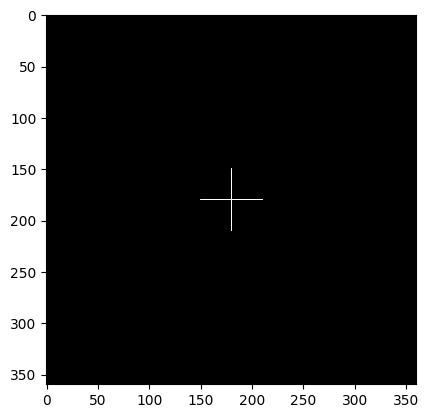

variance difference;  0.0
35   32
Currently checking region with radius :  35


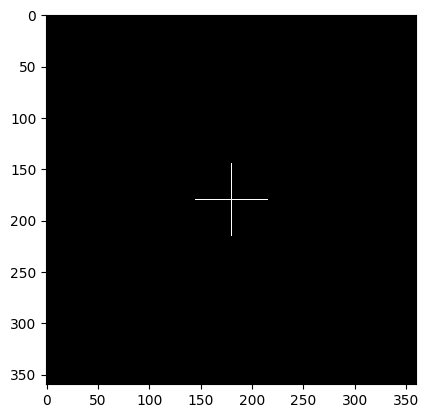

variance difference;  0.0
40   32
Currently checking region with radius :  40


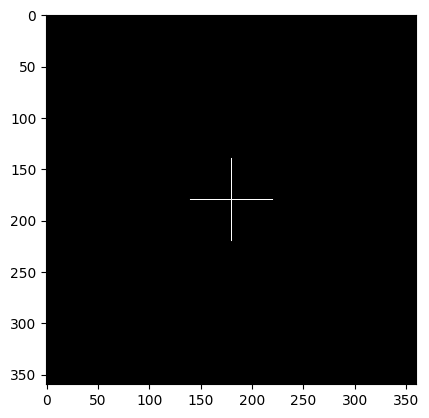

variance difference;  0.0
45   32
Currently checking region with radius :  45


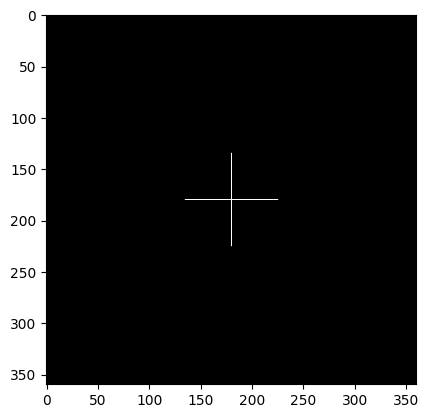

variance difference;  0.0
50   32
Currently checking region with radius :  50


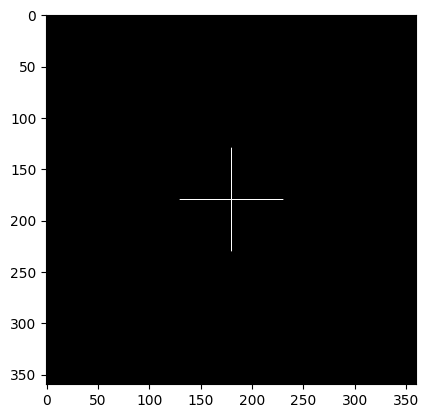

variance difference;  0.0
55   32
Currently checking region with radius :  55


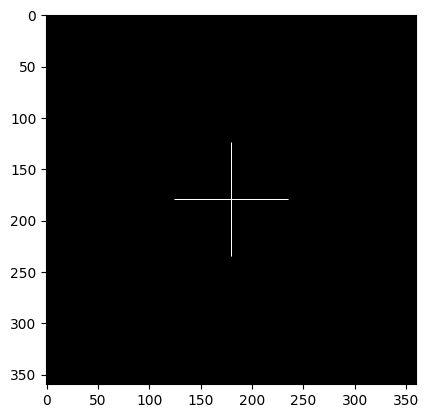

variance difference;  0.0
60   32
Currently checking region with radius :  60


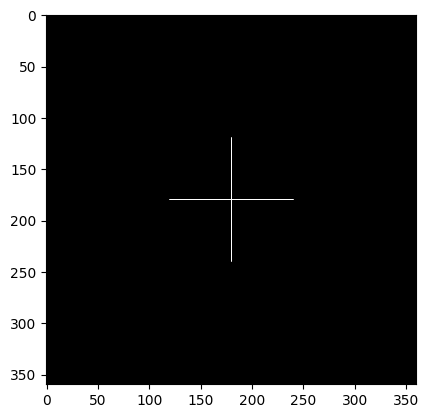

variance difference;  0.0
65   32
Currently checking region with radius :  65


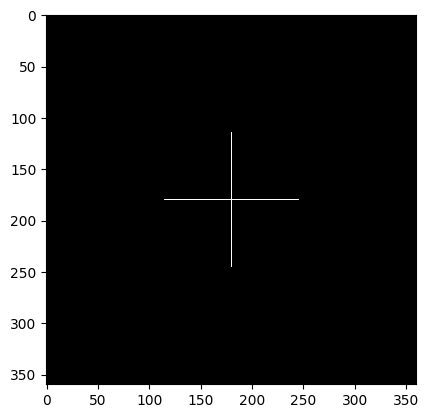

variance difference;  0.0
70   32
Currently checking region with radius :  70


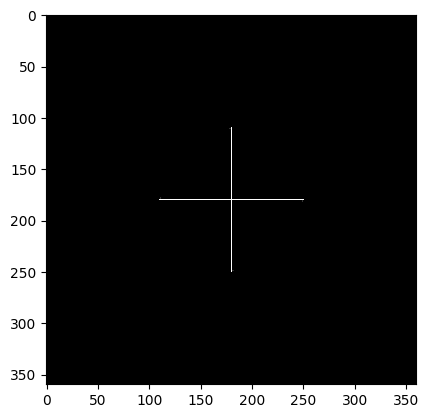

BLUR DETECTED AT RADIUS :  70
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  70
Differnece in variance :  -0.1570644633058862
Region with focal radius : 90




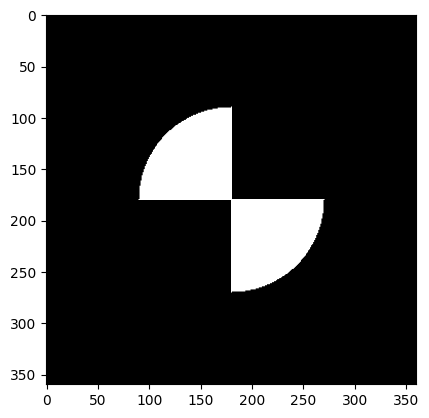

Test image with radius  90  being sharp with rest as blurred


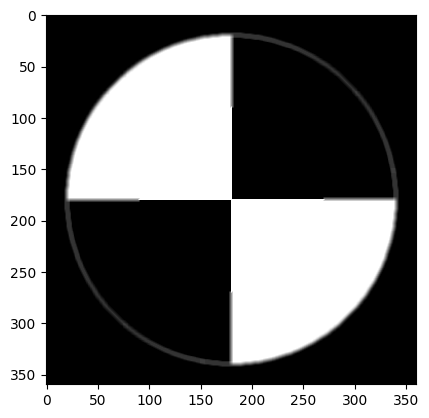

difference in test image and filtered non blurred region (in circular fasion)


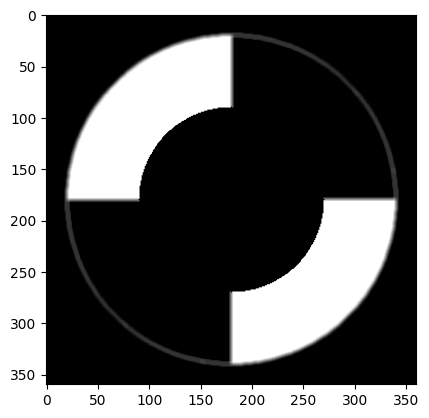

Visualization of separation of non blurred and blurred parts (radius = fr)


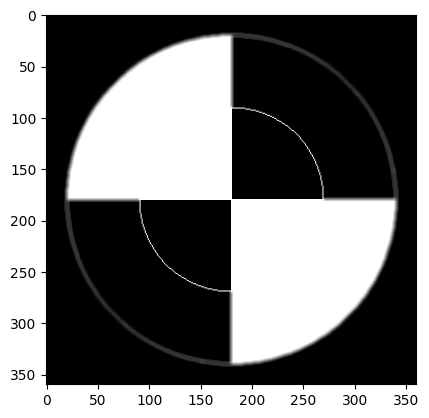

Laplacian Edge Mask


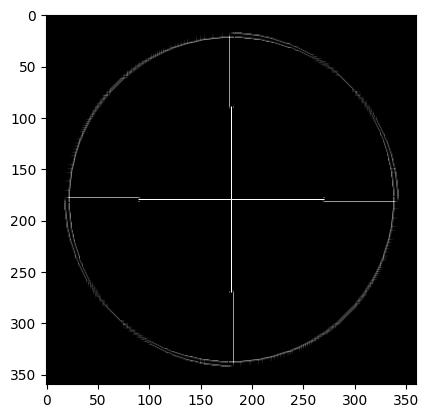

L O G edge mask


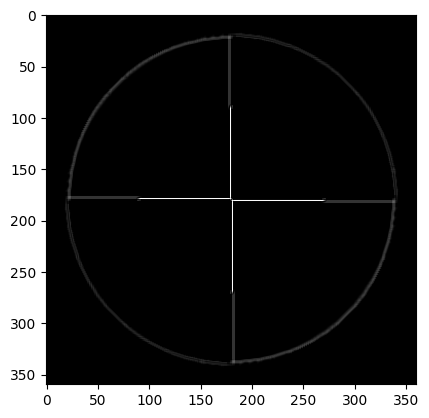

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


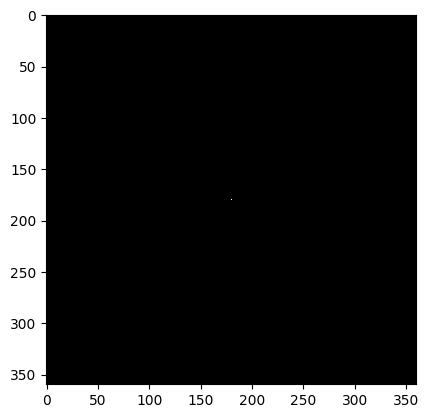

variance difference;  0.0
5   32
Currently checking region with radius :  5


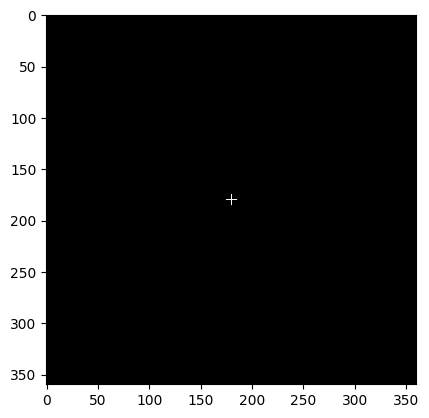

variance difference;  0.0
10   32
Currently checking region with radius :  10


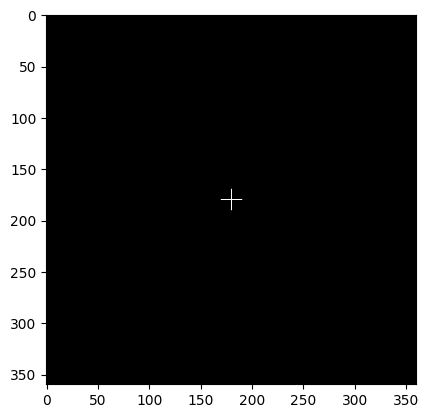

variance difference;  0.0
15   32
Currently checking region with radius :  15


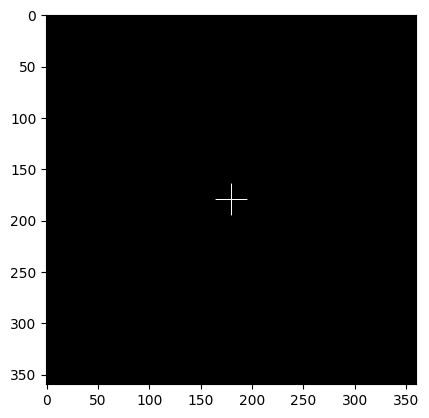

variance difference;  0.0
20   32
Currently checking region with radius :  20


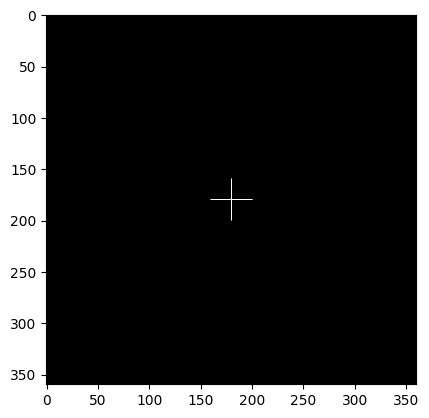

variance difference;  0.0
25   32
Currently checking region with radius :  25


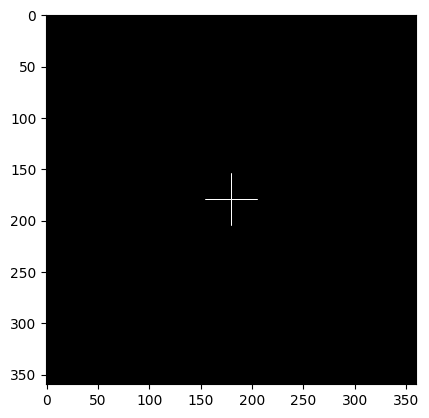

variance difference;  0.0
30   32
Currently checking region with radius :  30


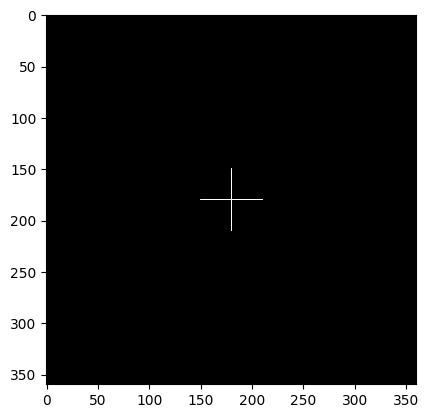

variance difference;  0.0
35   32
Currently checking region with radius :  35


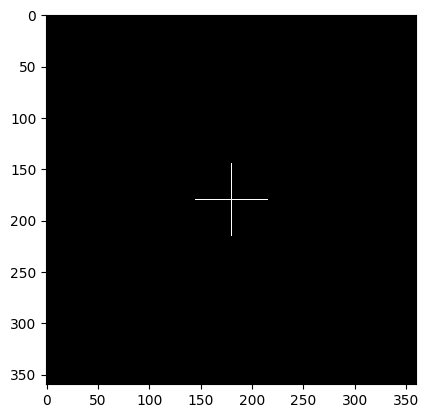

variance difference;  0.0
40   32
Currently checking region with radius :  40


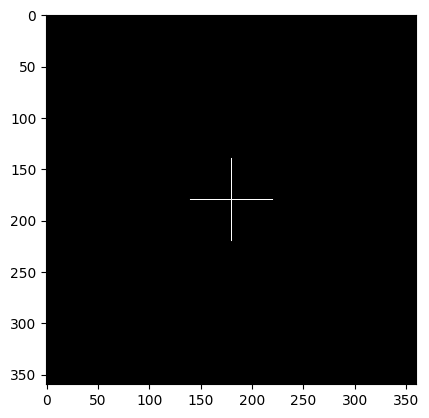

variance difference;  0.0
45   32
Currently checking region with radius :  45


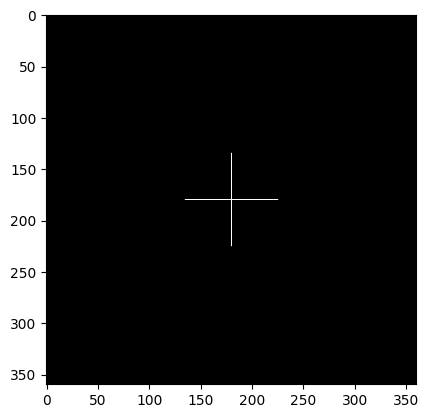

variance difference;  0.0
50   32
Currently checking region with radius :  50


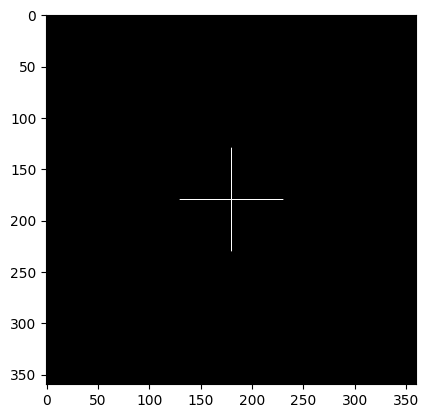

variance difference;  0.0
55   32
Currently checking region with radius :  55


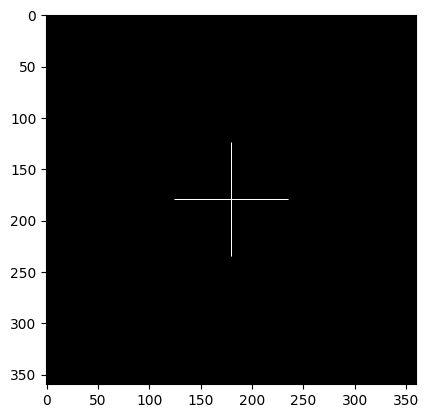

variance difference;  0.0
60   32
Currently checking region with radius :  60


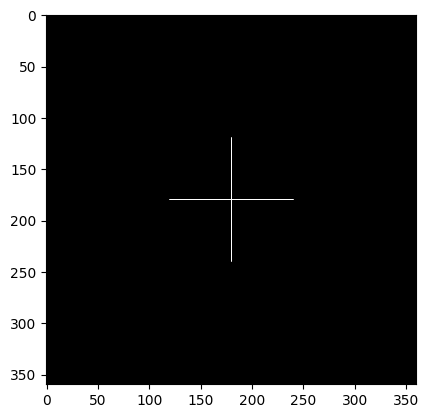

variance difference;  0.0
65   32
Currently checking region with radius :  65


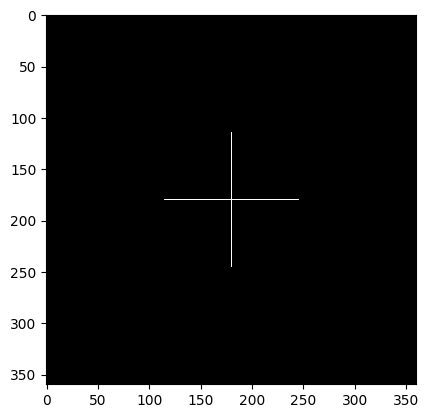

variance difference;  0.0
70   32
Currently checking region with radius :  70


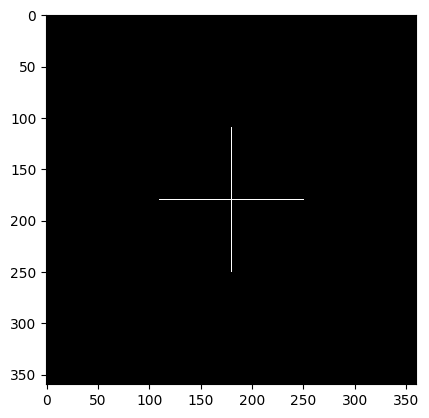

variance difference;  0.0
75   32
Currently checking region with radius :  75


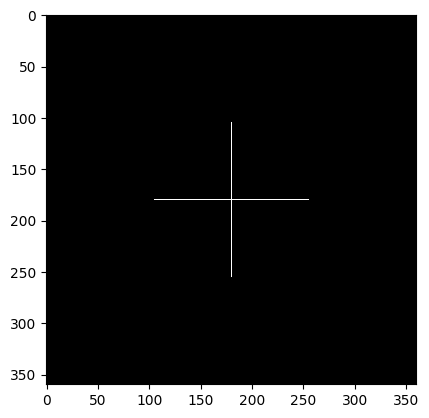

variance difference;  0.0
80   32
Currently checking region with radius :  80


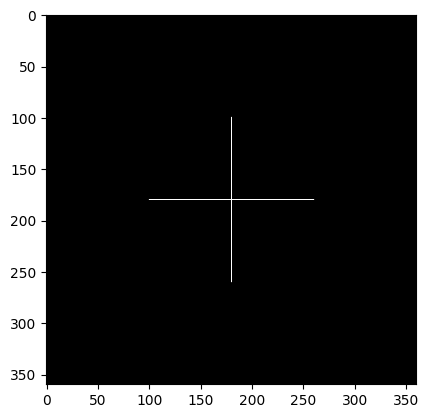

variance difference;  0.0
85   32
Currently checking region with radius :  85


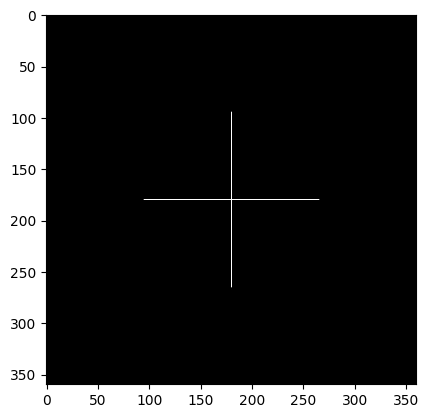

variance difference;  0.0
90   32
Currently checking region with radius :  90


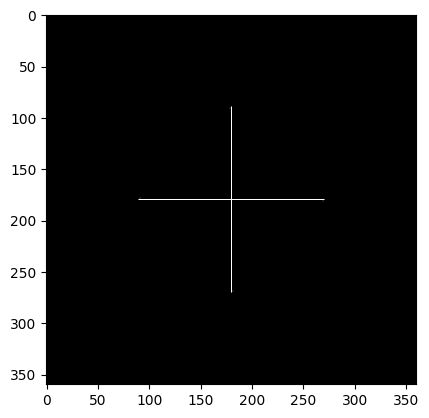

BLUR DETECTED AT RADIUS :  90
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  90
Differnece in variance :  -0.15607337962964607
Region with focal radius : 100




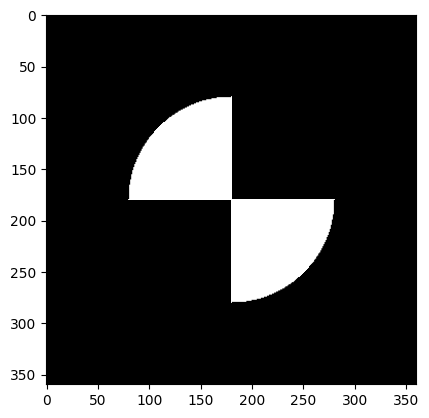

Test image with radius  100  being sharp with rest as blurred


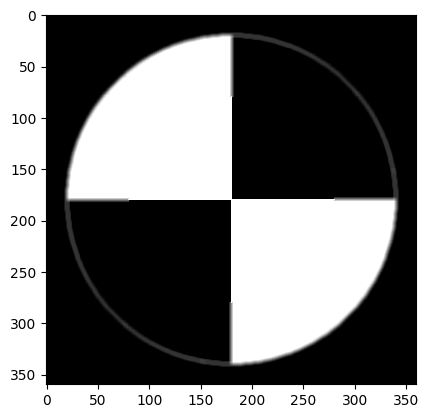

difference in test image and filtered non blurred region (in circular fasion)


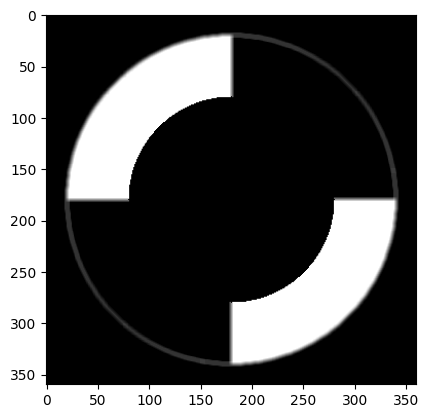

Visualization of separation of non blurred and blurred parts (radius = fr)


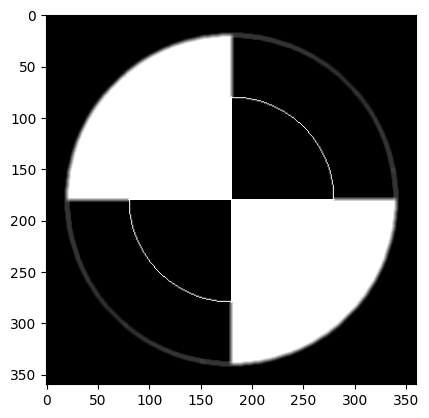

Laplacian Edge Mask


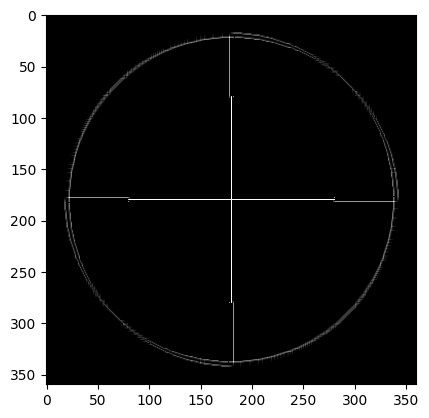

L O G edge mask


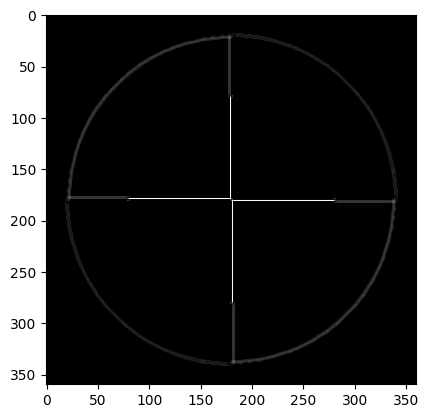

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


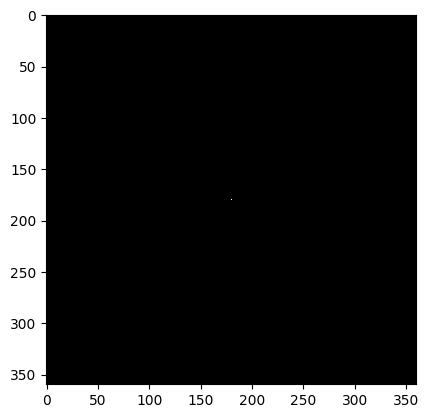

variance difference;  0.0
5   32
Currently checking region with radius :  5


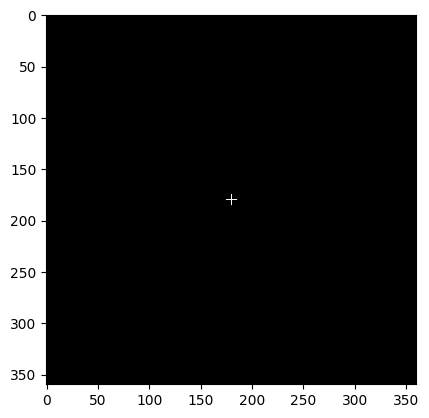

variance difference;  0.0
10   32
Currently checking region with radius :  10


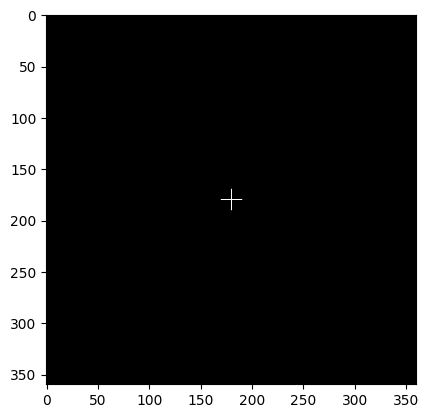

variance difference;  0.0
15   32
Currently checking region with radius :  15


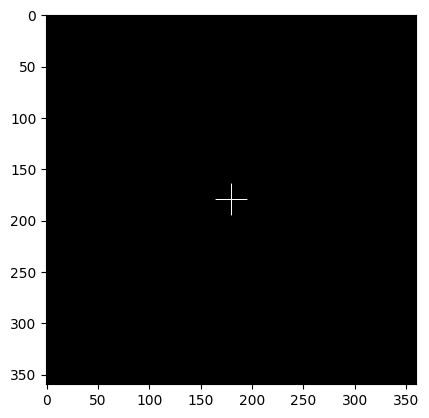

variance difference;  0.0
20   32
Currently checking region with radius :  20


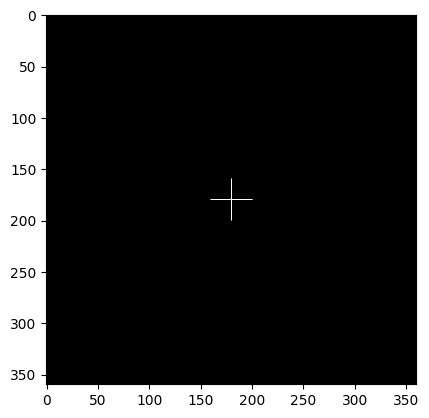

variance difference;  0.0
25   32
Currently checking region with radius :  25


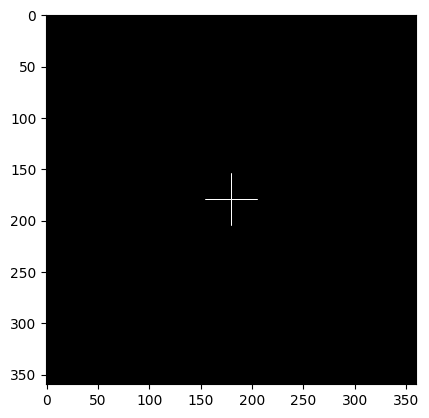

variance difference;  0.0
30   32
Currently checking region with radius :  30


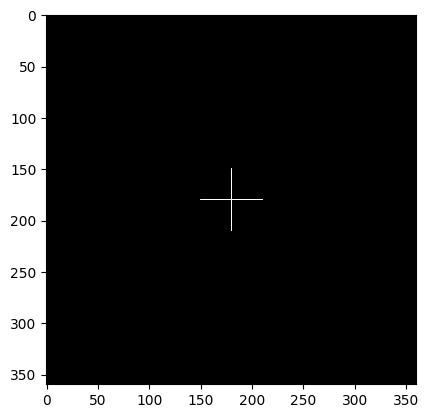

variance difference;  0.0
35   32
Currently checking region with radius :  35


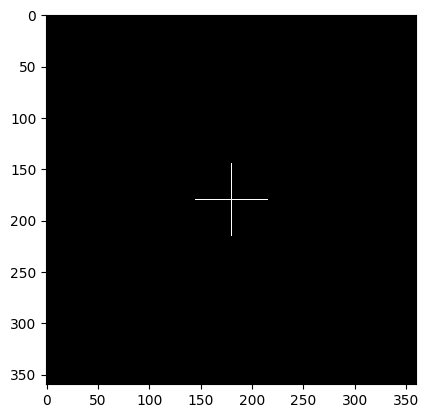

variance difference;  0.0
40   32
Currently checking region with radius :  40


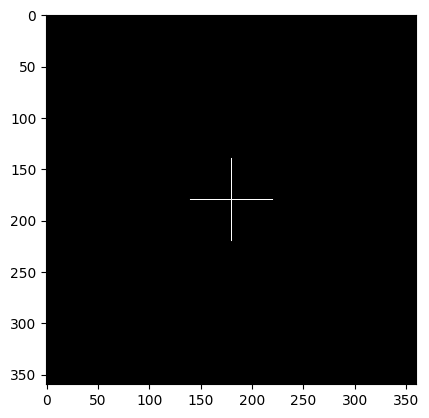

variance difference;  0.0
45   32
Currently checking region with radius :  45


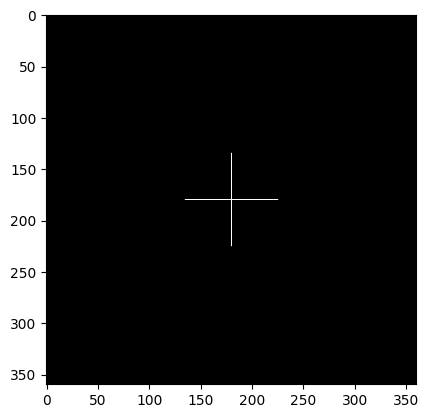

variance difference;  0.0
50   32
Currently checking region with radius :  50


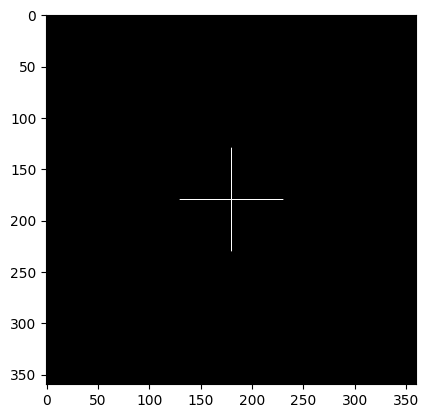

variance difference;  0.0
55   32
Currently checking region with radius :  55


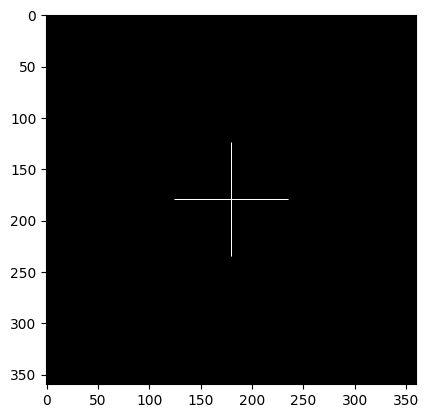

variance difference;  0.0
60   32
Currently checking region with radius :  60


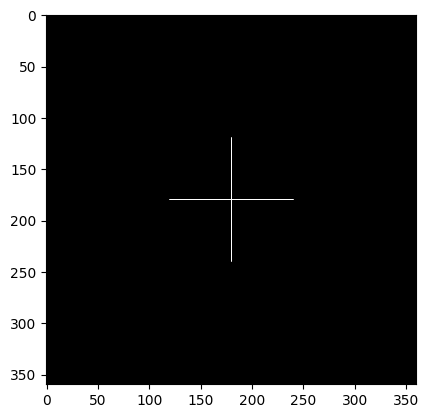

variance difference;  0.0
65   32
Currently checking region with radius :  65


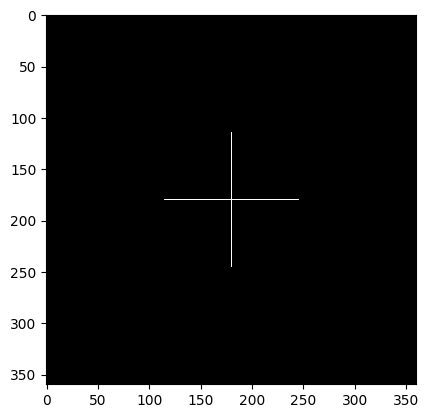

variance difference;  0.0
70   32
Currently checking region with radius :  70


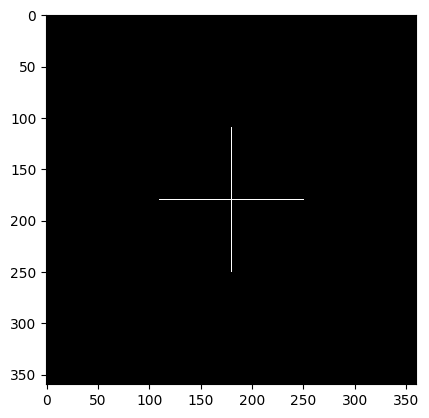

variance difference;  0.0
75   32
Currently checking region with radius :  75


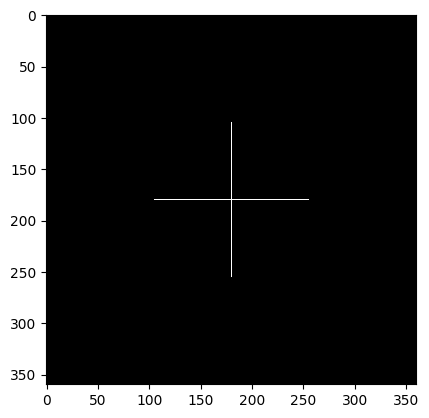

variance difference;  0.0
80   32
Currently checking region with radius :  80


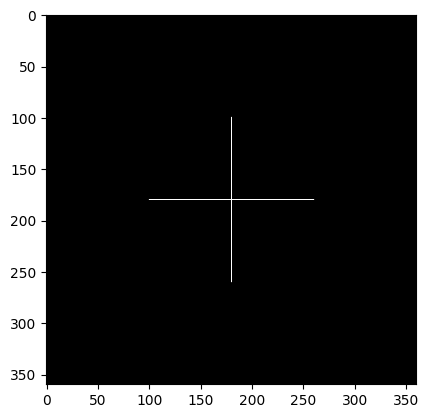

variance difference;  0.0
85   32
Currently checking region with radius :  85


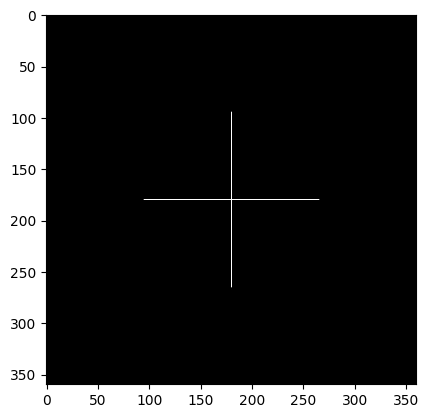

variance difference;  0.0
90   32
Currently checking region with radius :  90


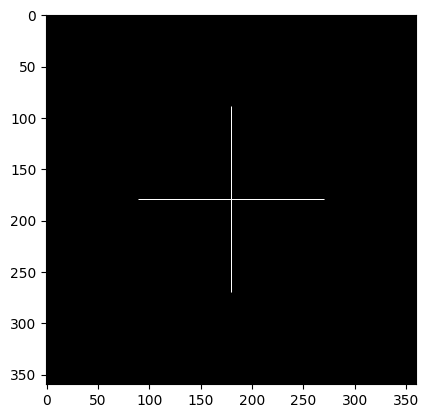

variance difference;  0.0
95   32
Currently checking region with radius :  95


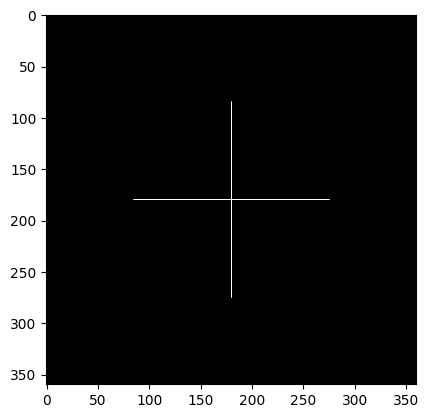

variance difference;  0.0
100   32
Currently checking region with radius :  100


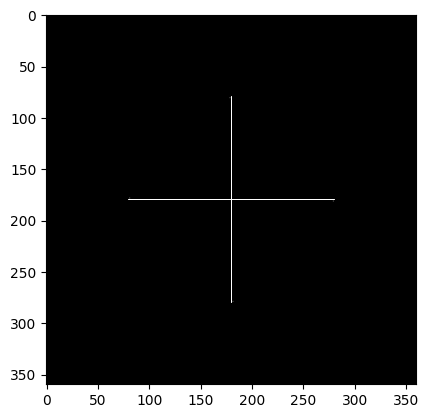

BLUR DETECTED AT RADIUS :  100
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  100
Differnece in variance :  -0.155577837791526
------------------------------------------------------












blurred image with box blur kernel :  15  x  15


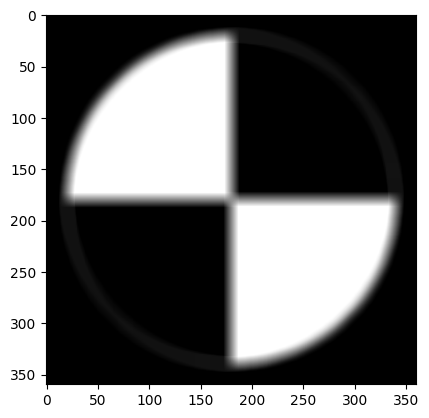

Region with focal radius : 10




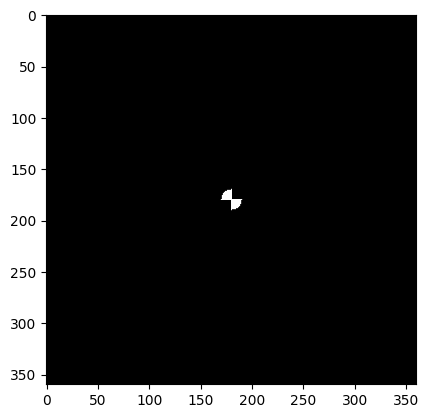

Test image with radius  10  being sharp with rest as blurred


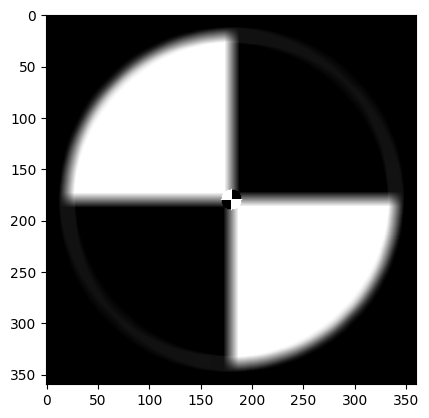

difference in test image and filtered non blurred region (in circular fasion)


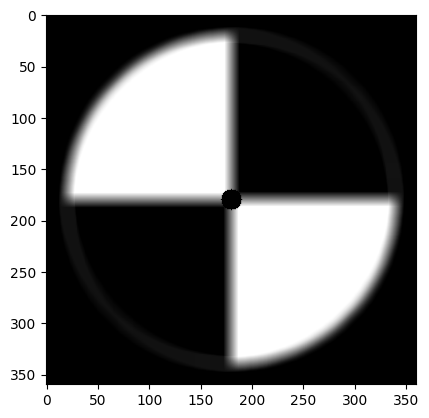

Visualization of separation of non blurred and blurred parts (radius = fr)


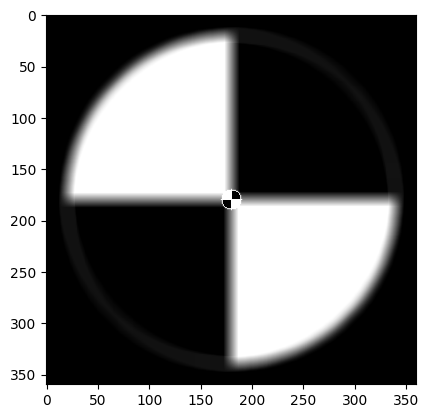

Laplacian Edge Mask


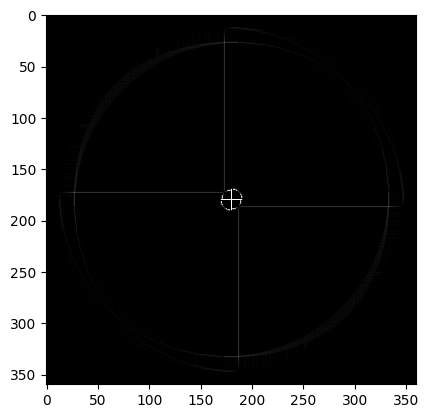

L O G edge mask


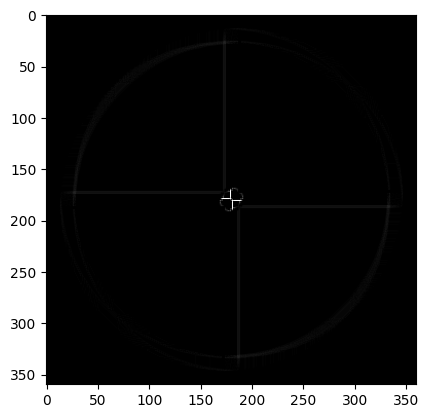

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


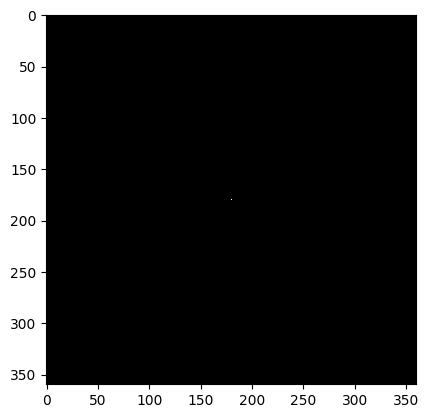

variance difference;  0.0
5   32
Currently checking region with radius :  5


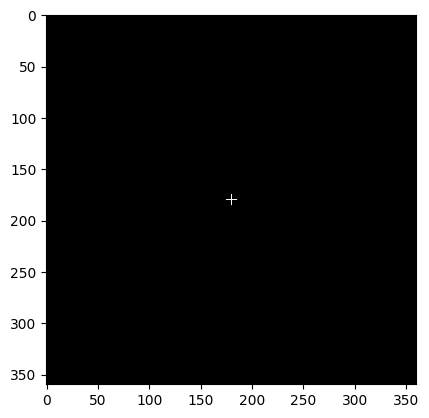

variance difference;  0.0
10   32
Currently checking region with radius :  10


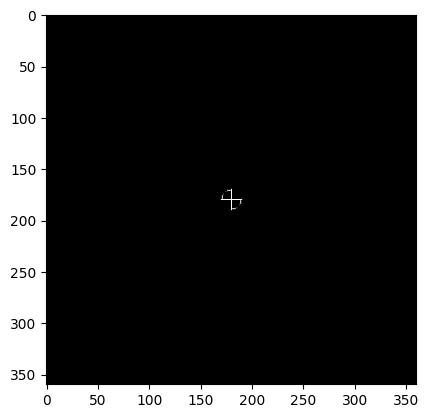

BLUR DETECTED AT RADIUS :  10
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  10
Differnece in variance :  -5.640483912037027
Region with focal radius : 20




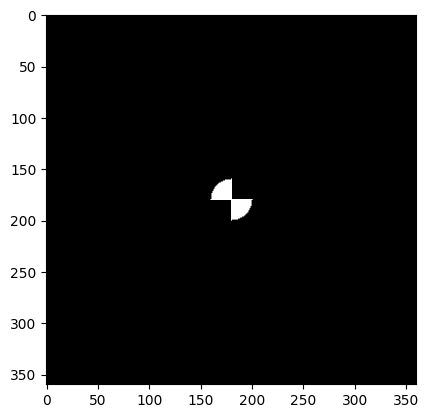

Test image with radius  20  being sharp with rest as blurred


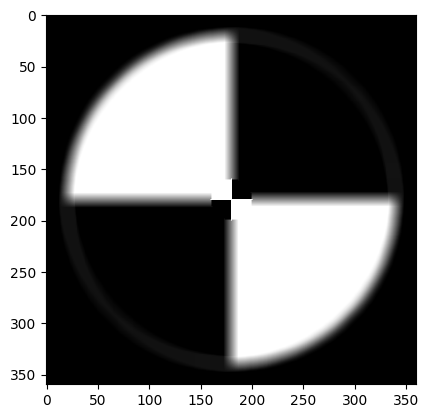

difference in test image and filtered non blurred region (in circular fasion)


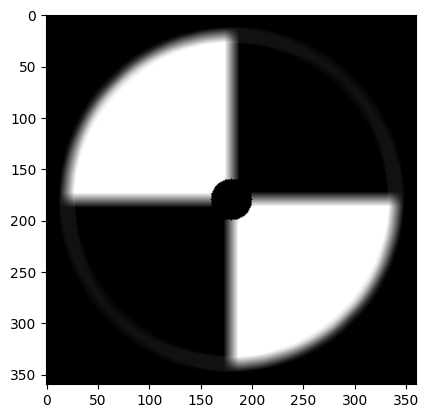

Visualization of separation of non blurred and blurred parts (radius = fr)


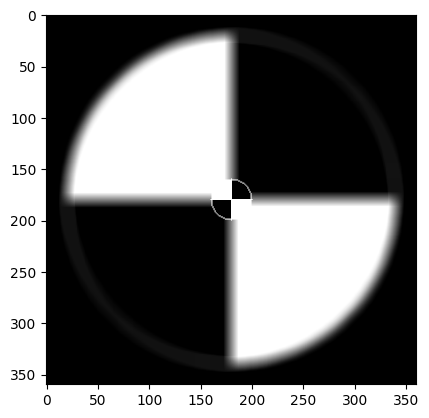

Laplacian Edge Mask


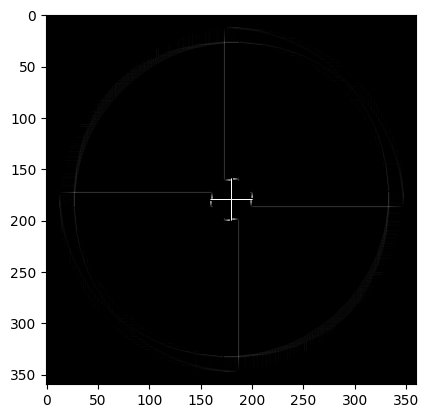

L O G edge mask


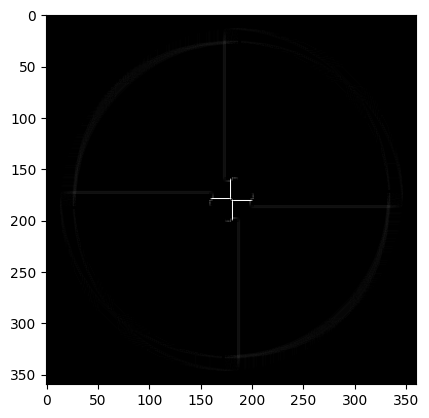

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


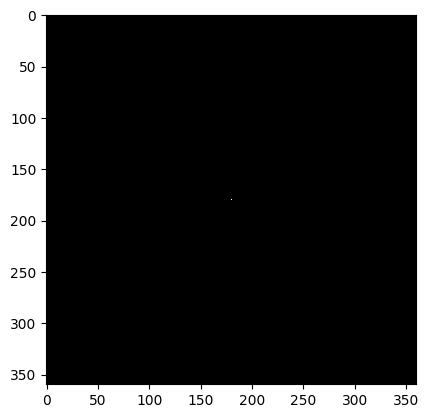

variance difference;  0.0
5   32
Currently checking region with radius :  5


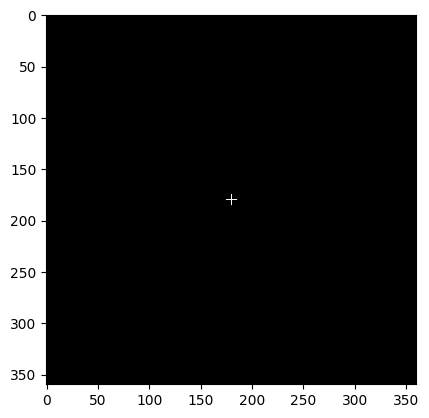

variance difference;  0.0
10   32
Currently checking region with radius :  10


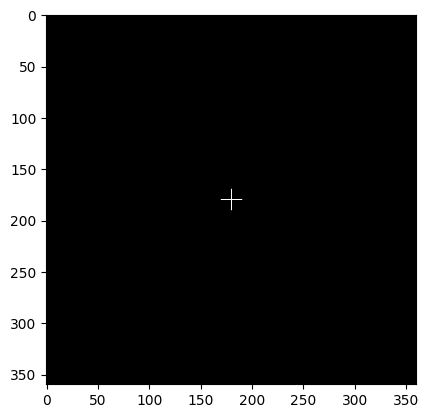

variance difference;  0.0
15   32
Currently checking region with radius :  15


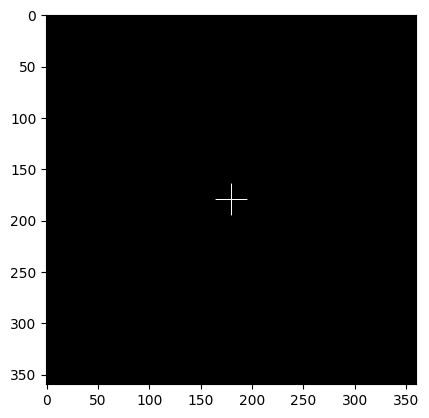

variance difference;  0.0
20   32
Currently checking region with radius :  20


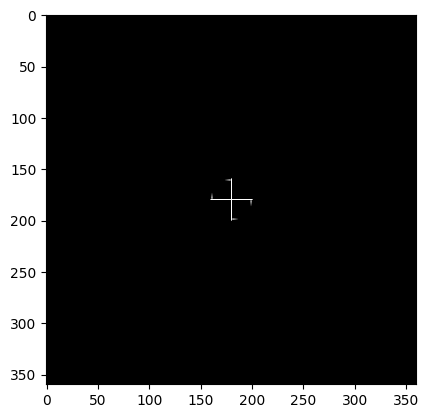

BLUR DETECTED AT RADIUS :  20
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  20
Differnece in variance :  -5.4843388164913875
Region with focal radius : 30




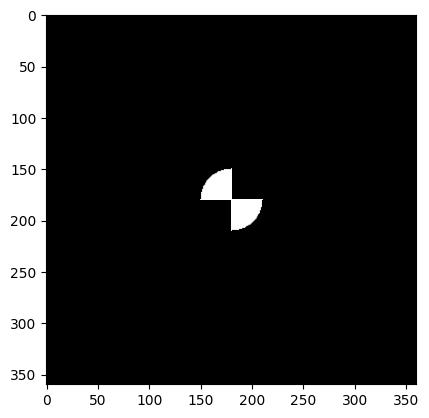

Test image with radius  30  being sharp with rest as blurred


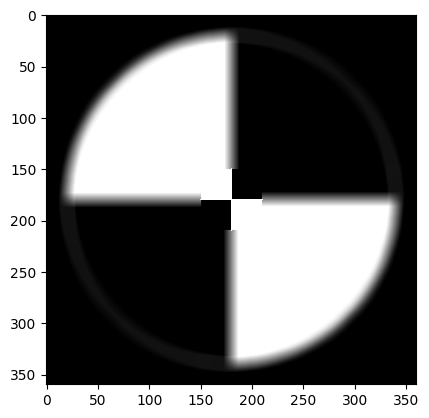

difference in test image and filtered non blurred region (in circular fasion)


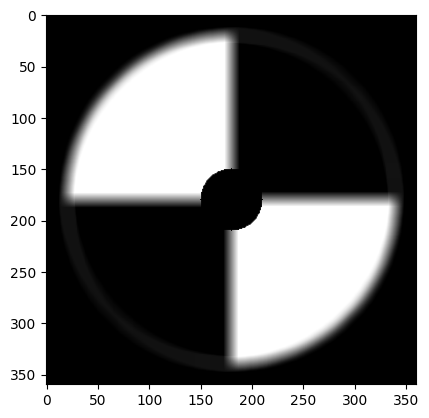

Visualization of separation of non blurred and blurred parts (radius = fr)


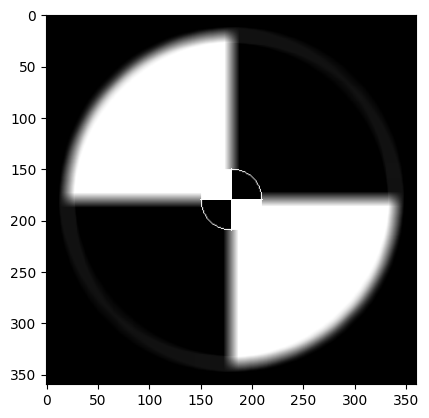

Laplacian Edge Mask


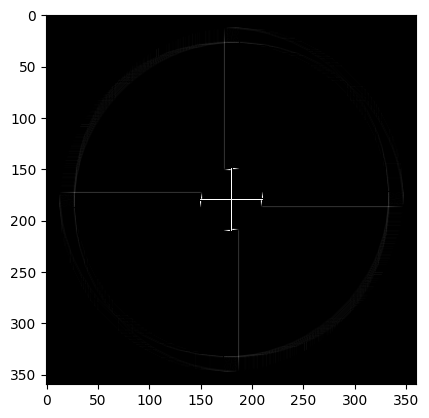

L O G edge mask


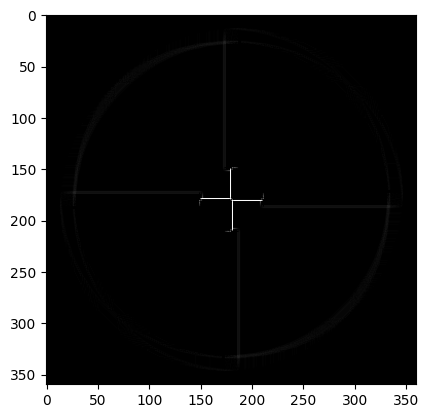

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


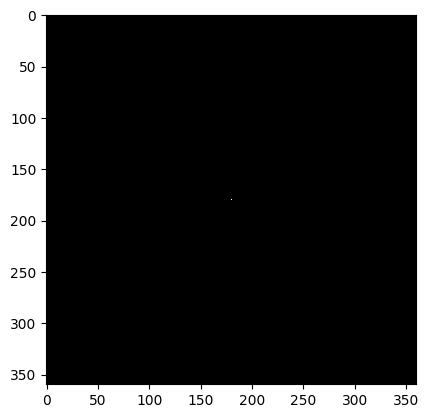

variance difference;  0.0
5   32
Currently checking region with radius :  5


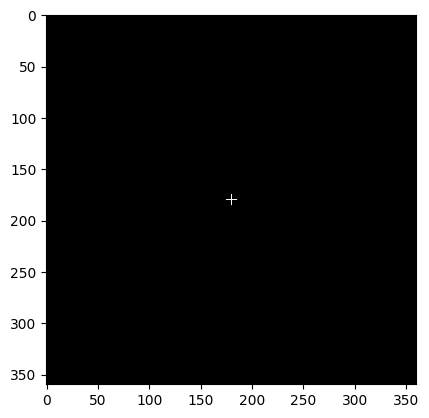

variance difference;  0.0
10   32
Currently checking region with radius :  10


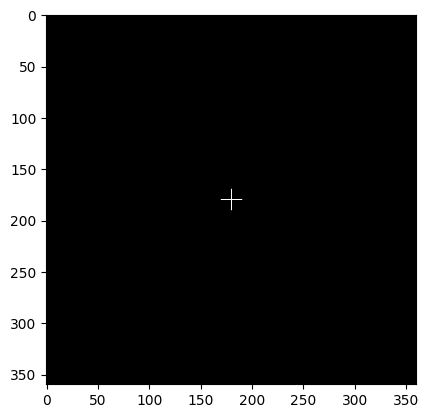

variance difference;  0.0
15   32
Currently checking region with radius :  15


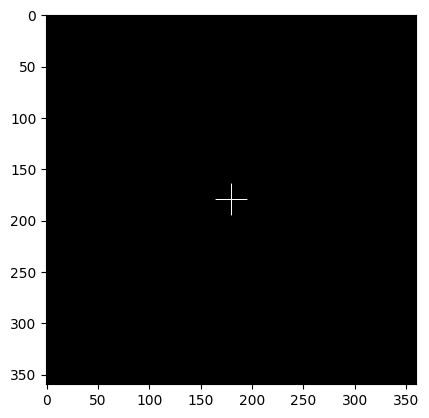

variance difference;  0.0
20   32
Currently checking region with radius :  20


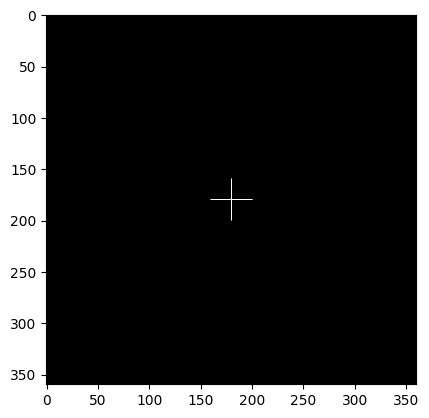

variance difference;  0.0
25   32
Currently checking region with radius :  25


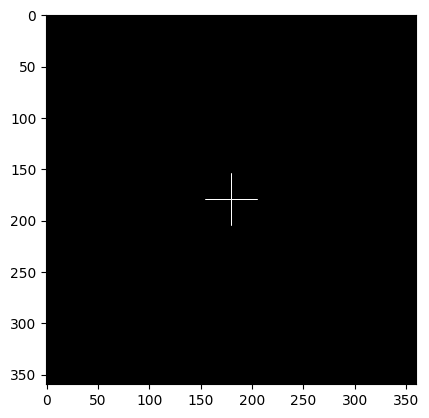

variance difference;  0.0
30   32
Currently checking region with radius :  30


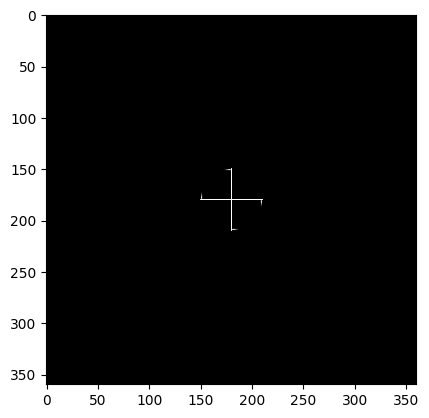

BLUR DETECTED AT RADIUS :  30
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  30
Differnece in variance :  -5.488352567729798
Region with focal radius : 50




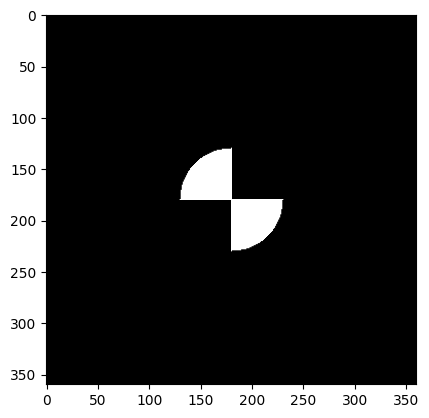

Test image with radius  50  being sharp with rest as blurred


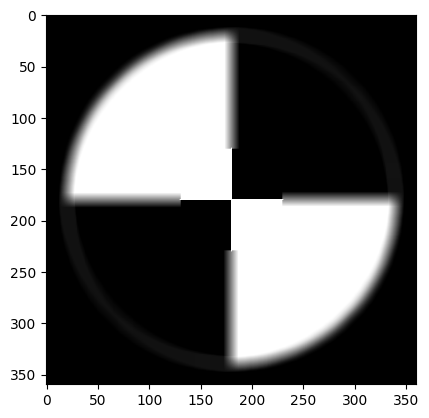

difference in test image and filtered non blurred region (in circular fasion)


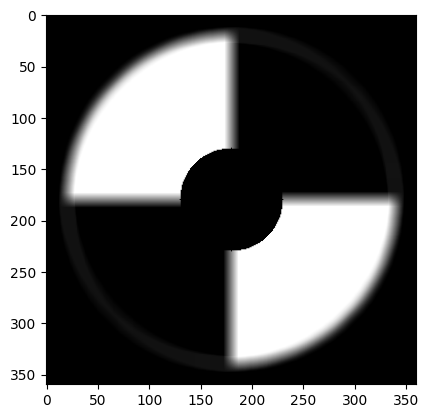

Visualization of separation of non blurred and blurred parts (radius = fr)


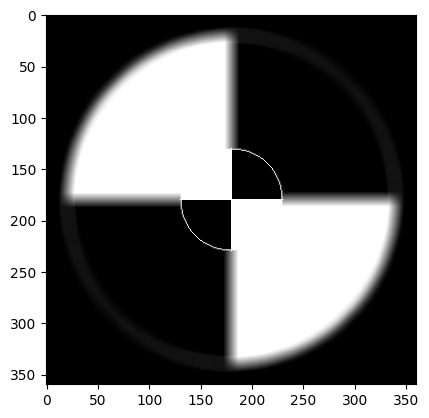

Laplacian Edge Mask


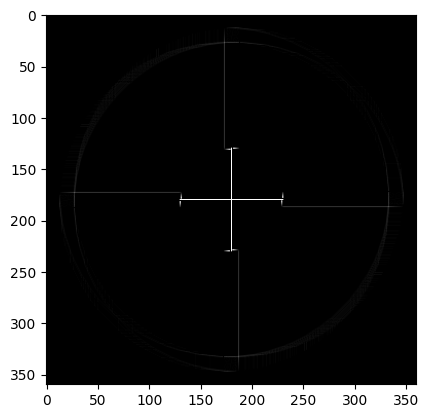

L O G edge mask


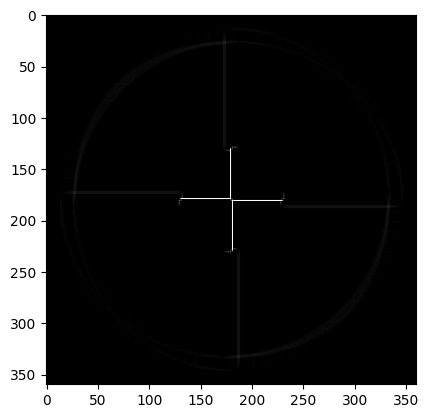

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


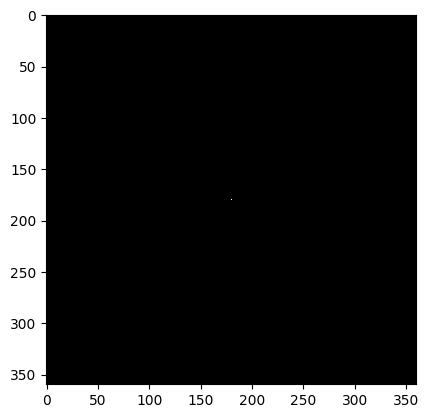

variance difference;  0.0
5   32
Currently checking region with radius :  5


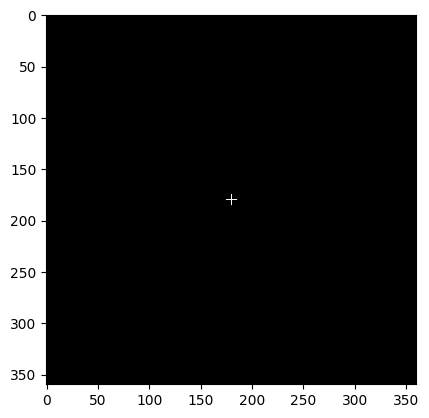

variance difference;  0.0
10   32
Currently checking region with radius :  10


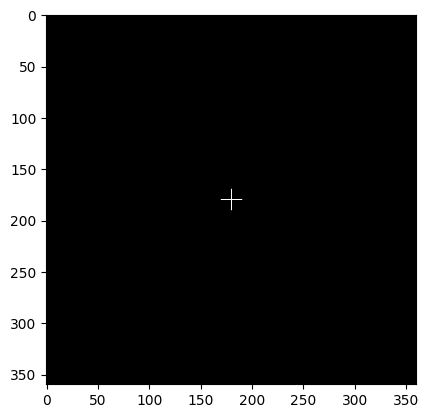

variance difference;  0.0
15   32
Currently checking region with radius :  15


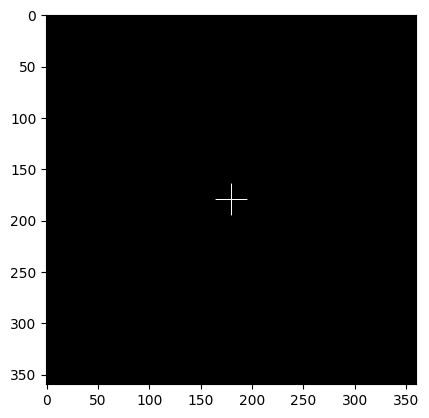

variance difference;  0.0
20   32
Currently checking region with radius :  20


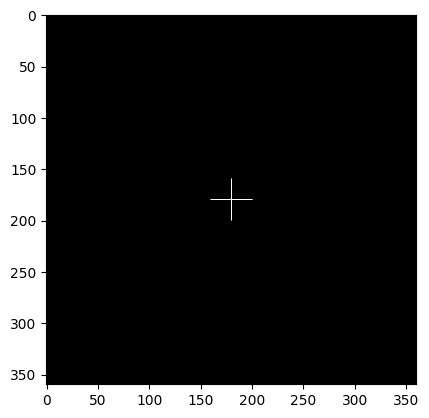

variance difference;  0.0
25   32
Currently checking region with radius :  25


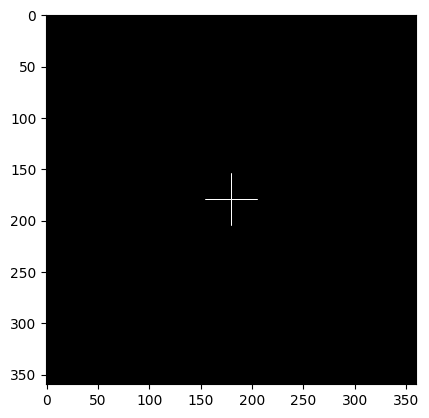

variance difference;  0.0
30   32
Currently checking region with radius :  30


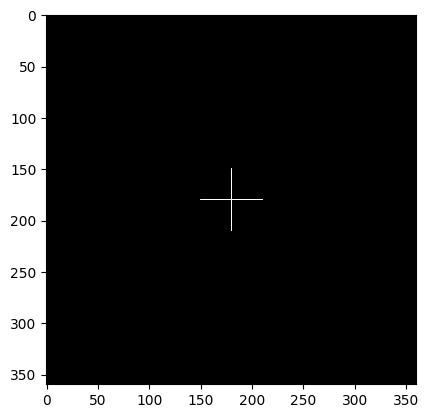

variance difference;  0.0
35   32
Currently checking region with radius :  35


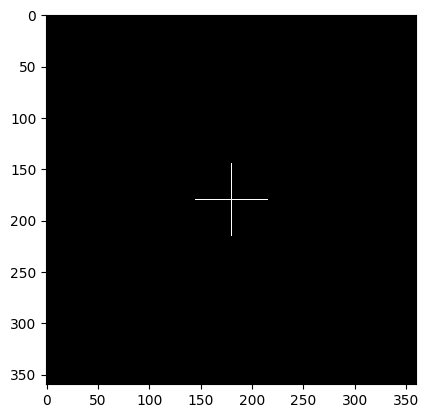

variance difference;  0.0
40   32
Currently checking region with radius :  40


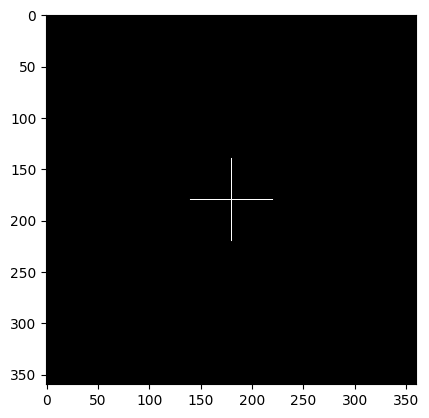

variance difference;  0.0
45   32
Currently checking region with radius :  45


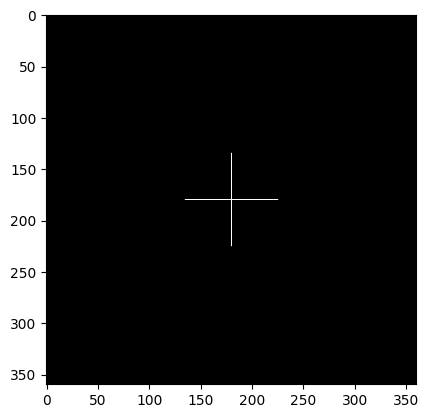

variance difference;  0.0
50   32
Currently checking region with radius :  50


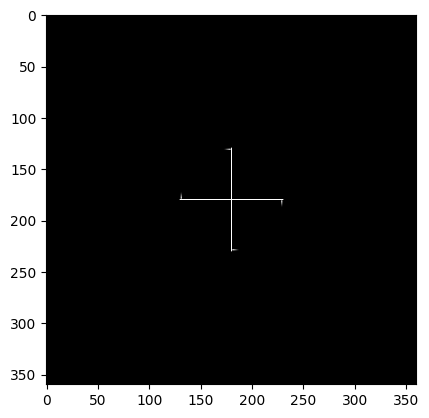

BLUR DETECTED AT RADIUS :  50
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  50
Differnece in variance :  -5.478937272805197
Region with focal radius : 70




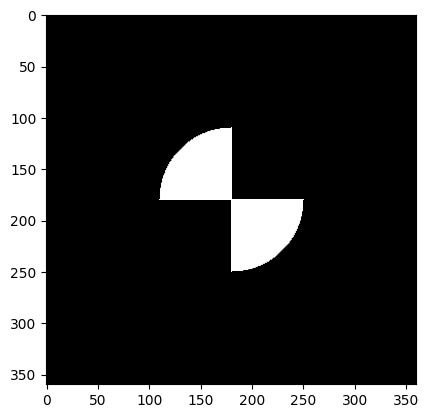

Test image with radius  70  being sharp with rest as blurred


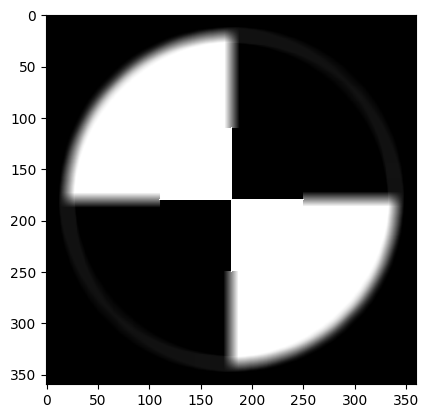

difference in test image and filtered non blurred region (in circular fasion)


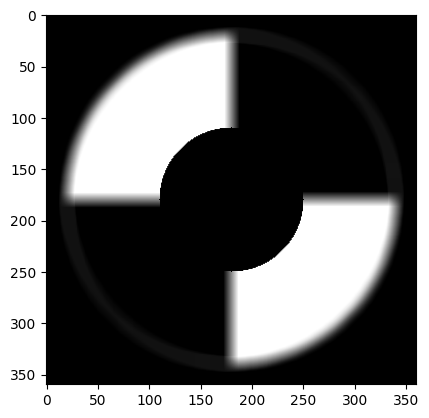

Visualization of separation of non blurred and blurred parts (radius = fr)


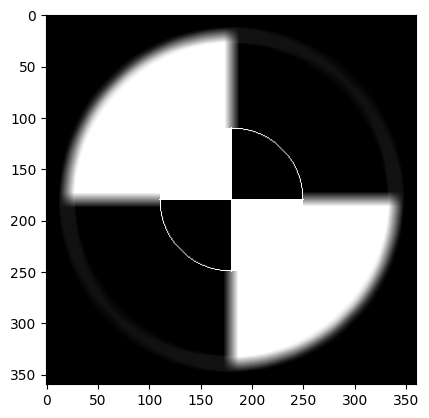

Laplacian Edge Mask


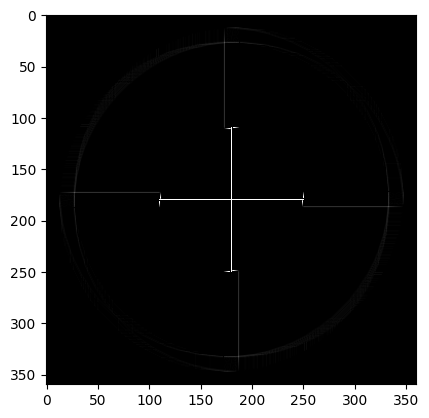

L O G edge mask


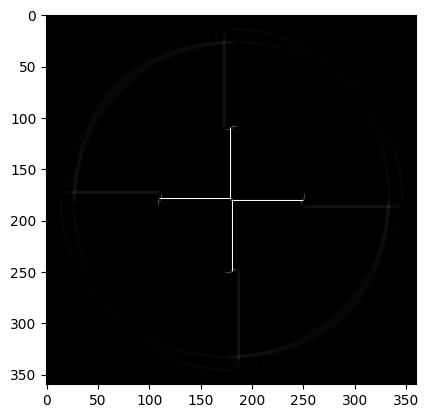

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


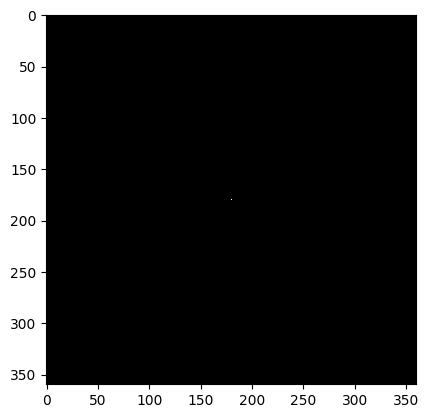

variance difference;  0.0
5   32
Currently checking region with radius :  5


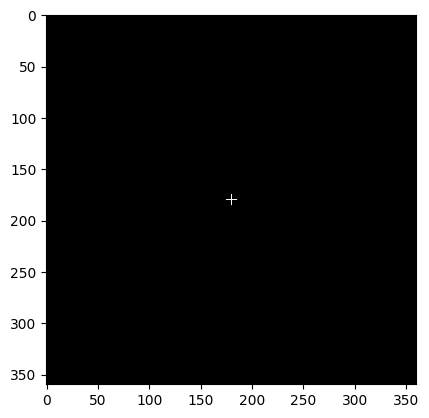

variance difference;  0.0
10   32
Currently checking region with radius :  10


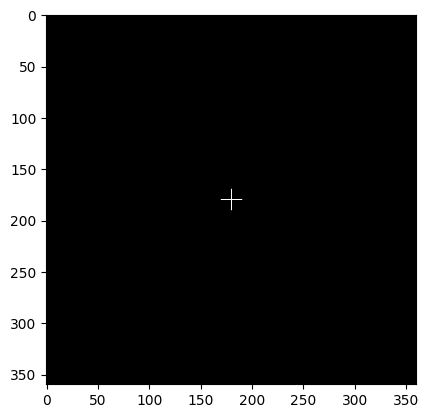

variance difference;  0.0
15   32
Currently checking region with radius :  15


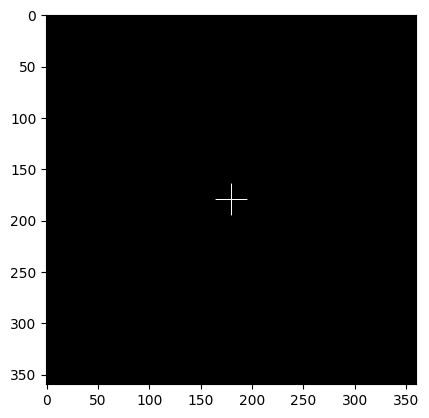

variance difference;  0.0
20   32
Currently checking region with radius :  20


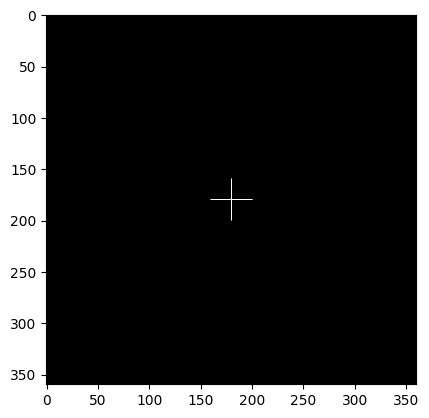

variance difference;  0.0
25   32
Currently checking region with radius :  25


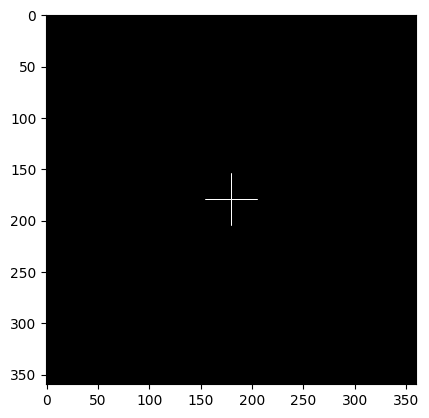

variance difference;  0.0
30   32
Currently checking region with radius :  30


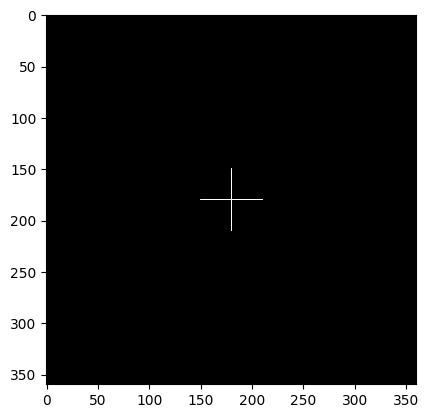

variance difference;  0.0
35   32
Currently checking region with radius :  35


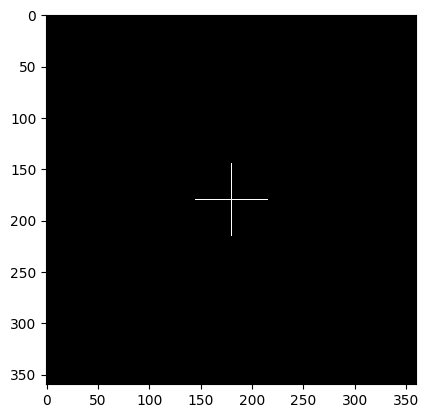

variance difference;  0.0
40   32
Currently checking region with radius :  40


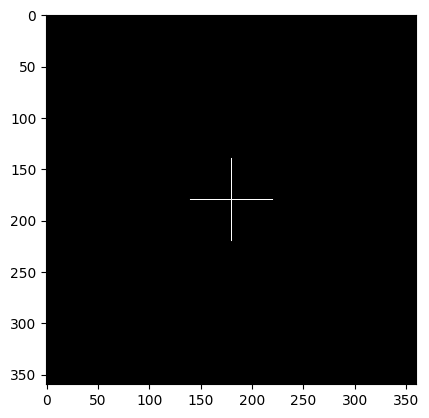

variance difference;  0.0
45   32
Currently checking region with radius :  45


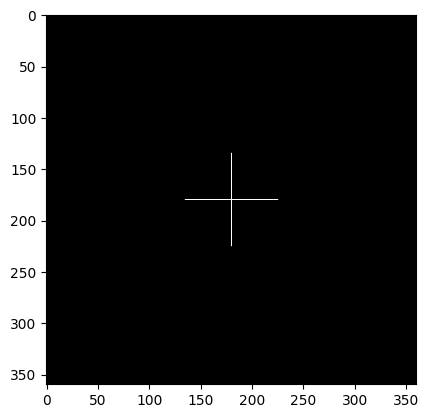

variance difference;  0.0
50   32
Currently checking region with radius :  50


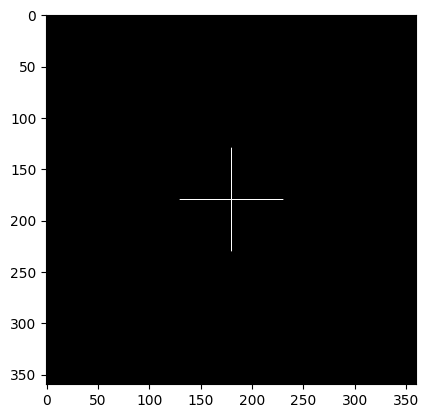

variance difference;  0.0
55   32
Currently checking region with radius :  55


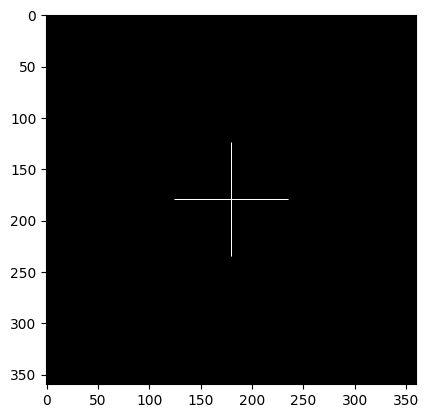

variance difference;  0.0
60   32
Currently checking region with radius :  60


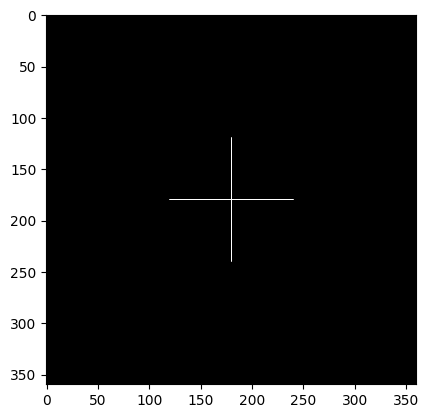

variance difference;  0.0
65   32
Currently checking region with radius :  65


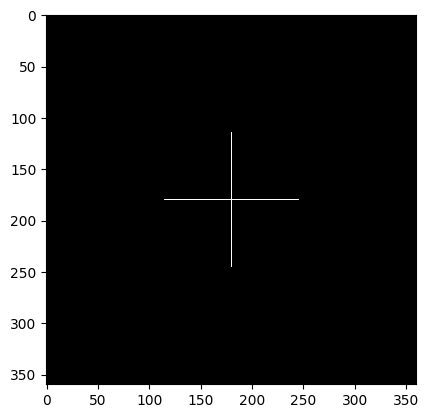

variance difference;  0.0
70   32
Currently checking region with radius :  70


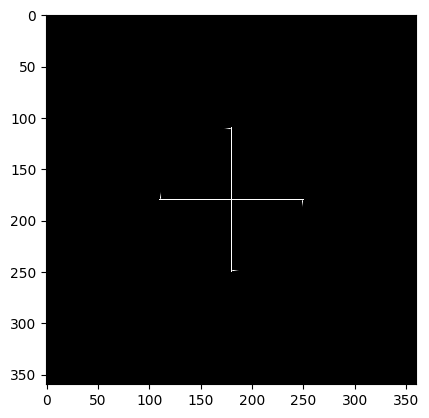

BLUR DETECTED AT RADIUS :  70
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  70
Differnece in variance :  -5.469521977880618
Region with focal radius : 90




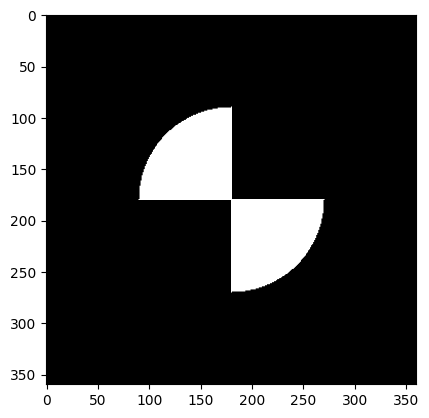

Test image with radius  90  being sharp with rest as blurred


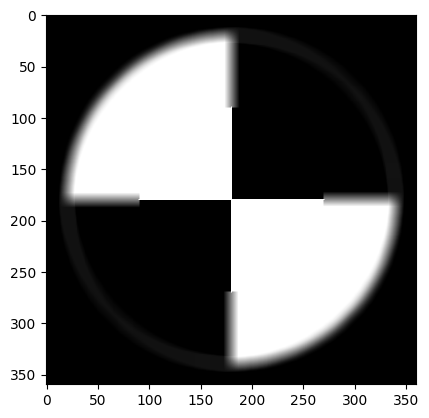

difference in test image and filtered non blurred region (in circular fasion)


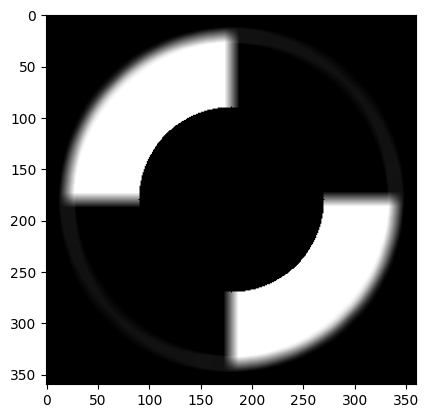

Visualization of separation of non blurred and blurred parts (radius = fr)


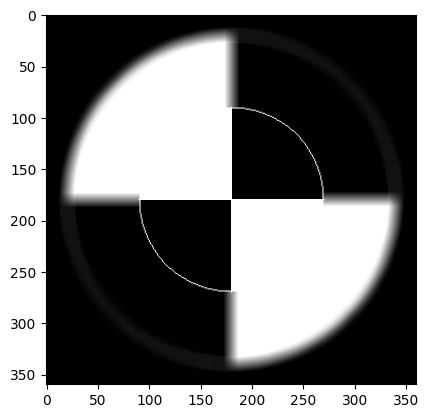

Laplacian Edge Mask


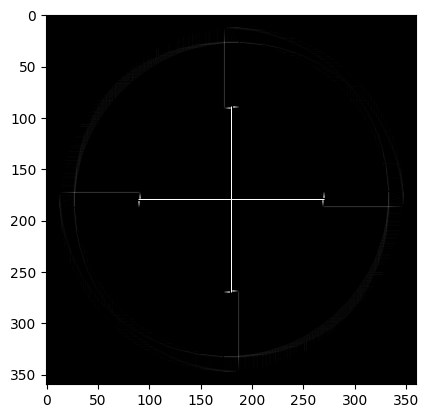

L O G edge mask


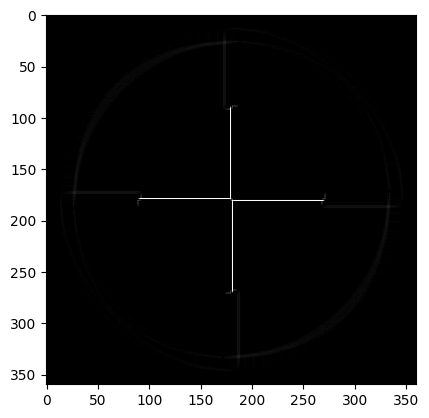

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


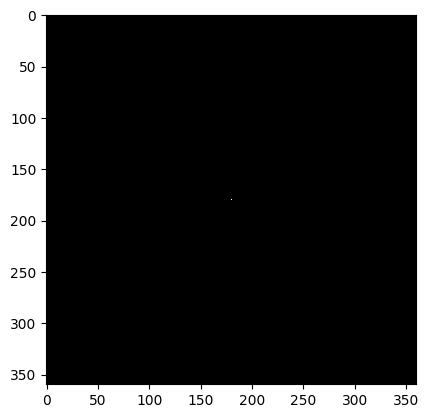

variance difference;  0.0
5   32
Currently checking region with radius :  5


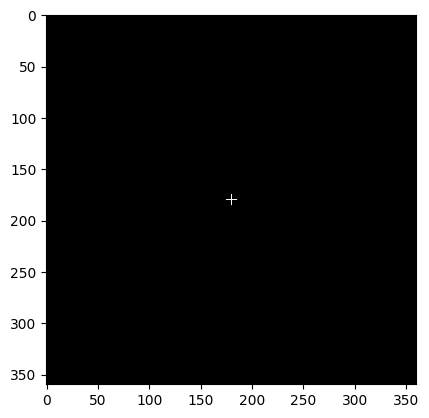

variance difference;  0.0
10   32
Currently checking region with radius :  10


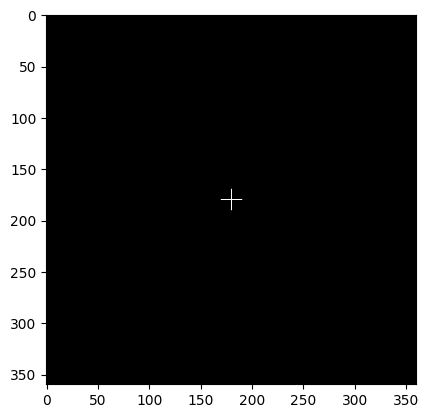

variance difference;  0.0
15   32
Currently checking region with radius :  15


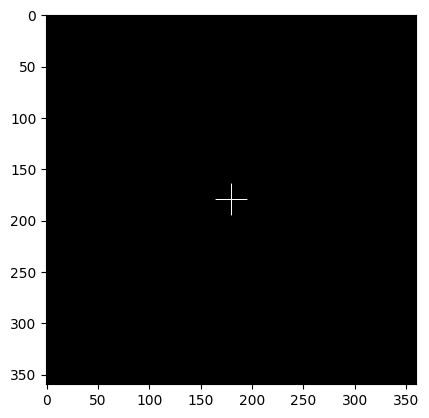

variance difference;  0.0
20   32
Currently checking region with radius :  20


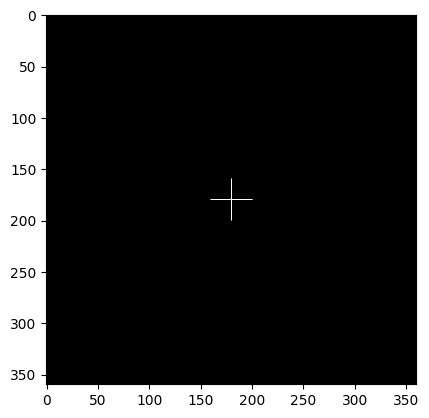

variance difference;  0.0
25   32
Currently checking region with radius :  25


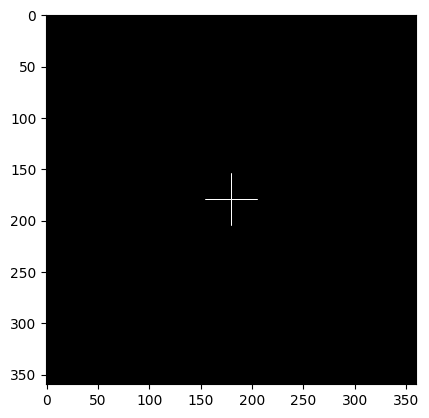

variance difference;  0.0
30   32
Currently checking region with radius :  30


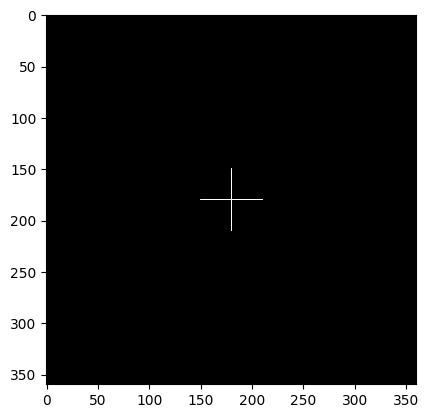

variance difference;  0.0
35   32
Currently checking region with radius :  35


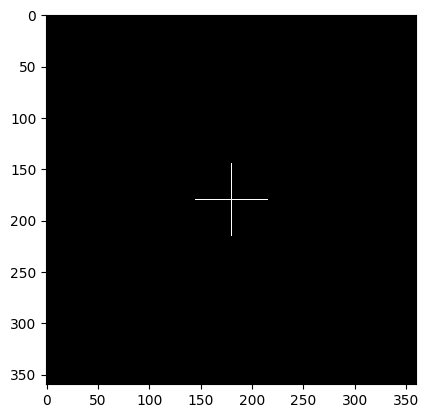

variance difference;  0.0
40   32
Currently checking region with radius :  40


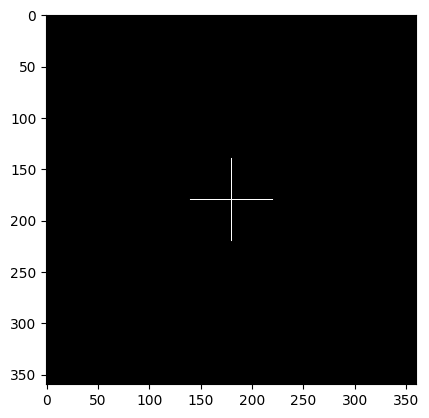

variance difference;  0.0
45   32
Currently checking region with radius :  45


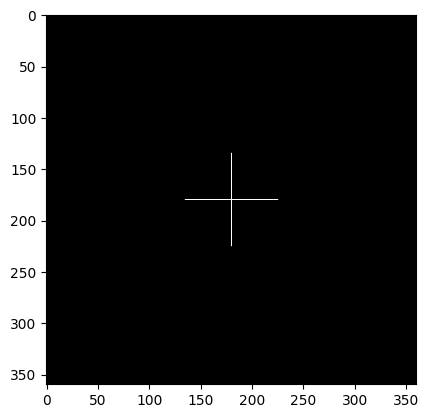

variance difference;  0.0
50   32
Currently checking region with radius :  50


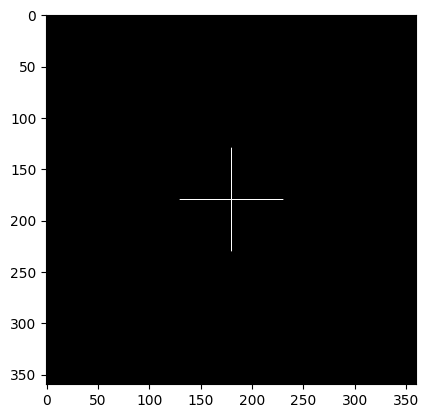

variance difference;  0.0
55   32
Currently checking region with radius :  55


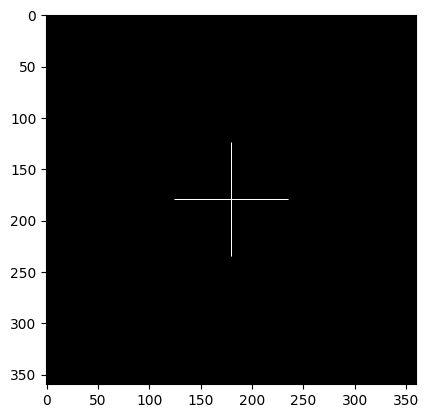

variance difference;  0.0
60   32
Currently checking region with radius :  60


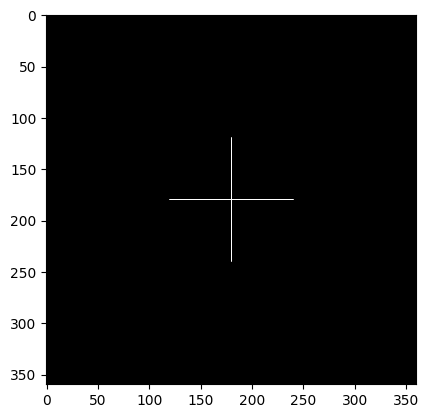

variance difference;  0.0
65   32
Currently checking region with radius :  65


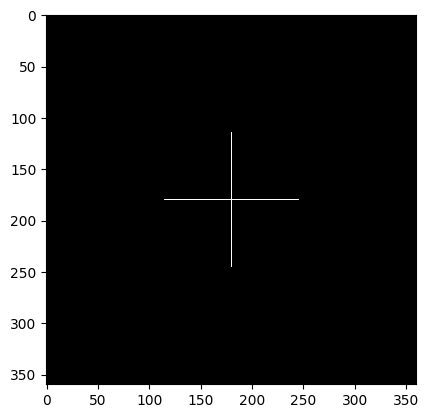

variance difference;  0.0
70   32
Currently checking region with radius :  70


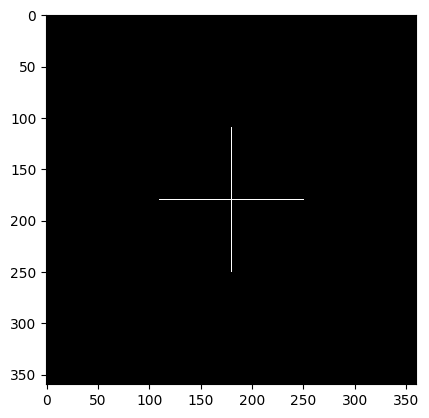

variance difference;  0.0
75   32
Currently checking region with radius :  75


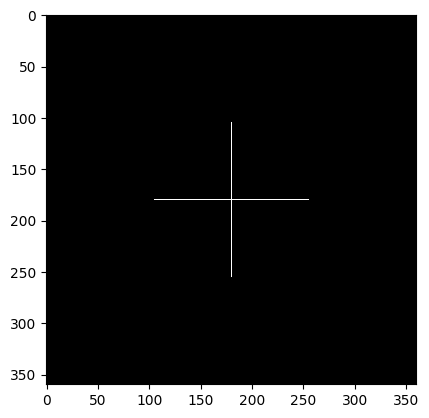

variance difference;  0.0
80   32
Currently checking region with radius :  80


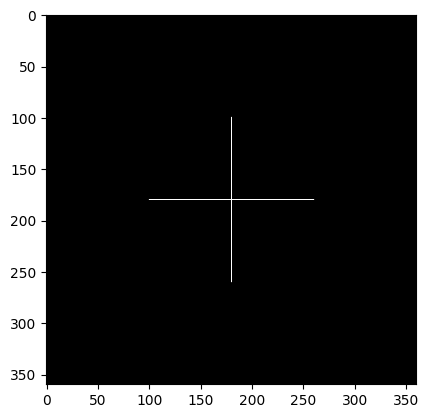

variance difference;  0.0
85   32
Currently checking region with radius :  85


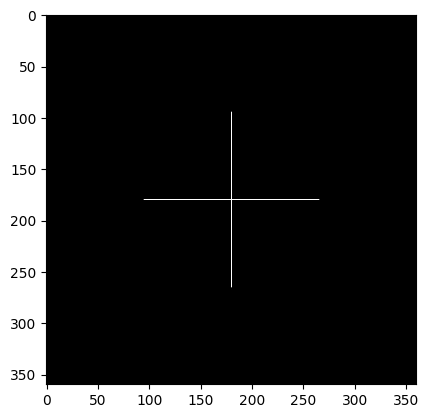

variance difference;  0.0
90   32
Currently checking region with radius :  90


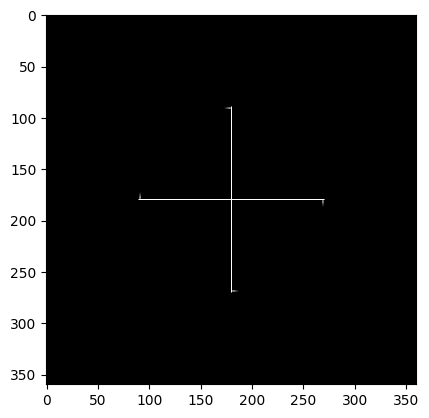

BLUR DETECTED AT RADIUS :  90
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  90
Differnece in variance :  -5.460106682956052
Region with focal radius : 100




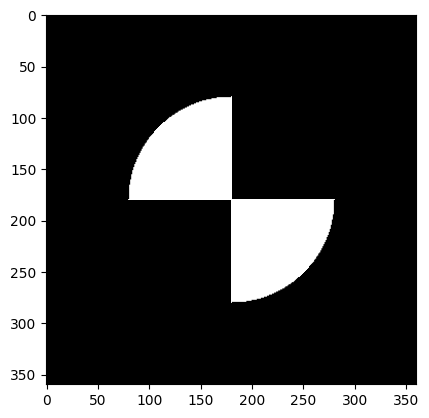

Test image with radius  100  being sharp with rest as blurred


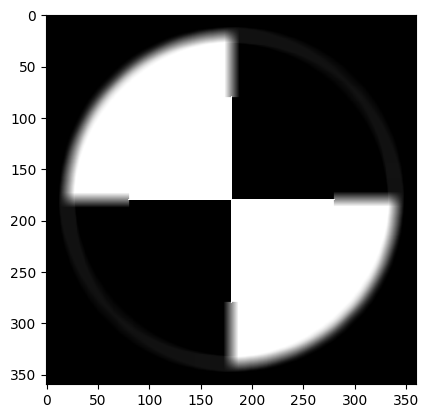

difference in test image and filtered non blurred region (in circular fasion)


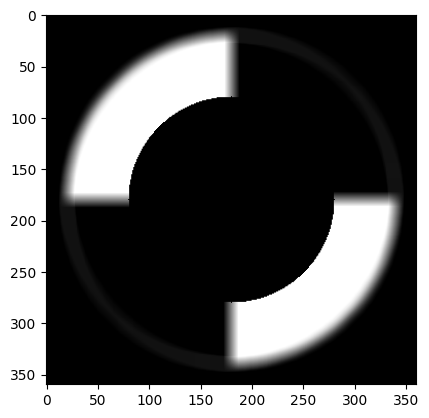

Visualization of separation of non blurred and blurred parts (radius = fr)


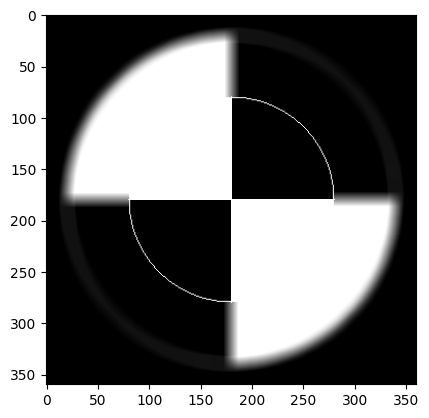

Laplacian Edge Mask


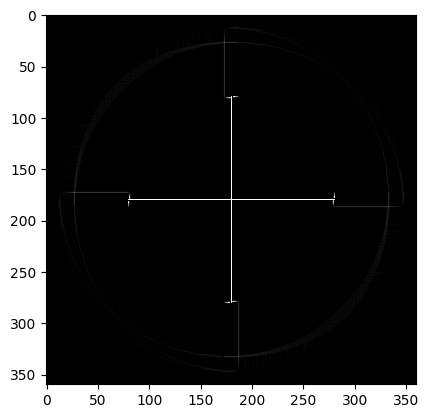

L O G edge mask


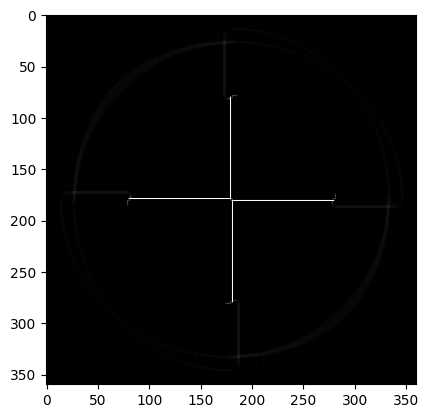

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


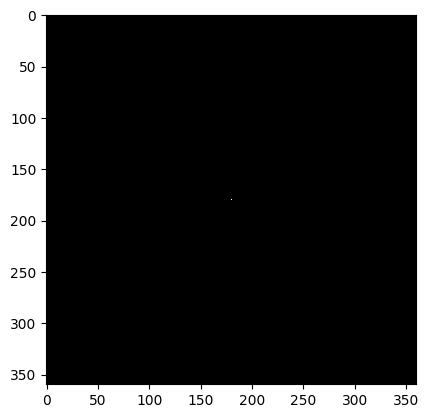

variance difference;  0.0
5   32
Currently checking region with radius :  5


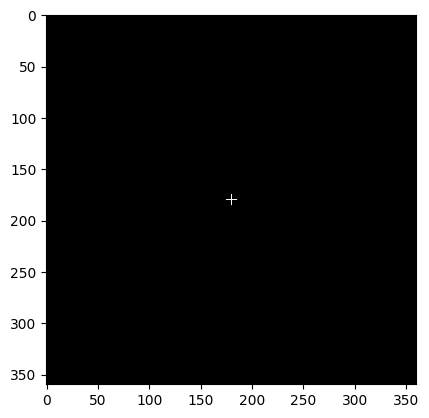

variance difference;  0.0
10   32
Currently checking region with radius :  10


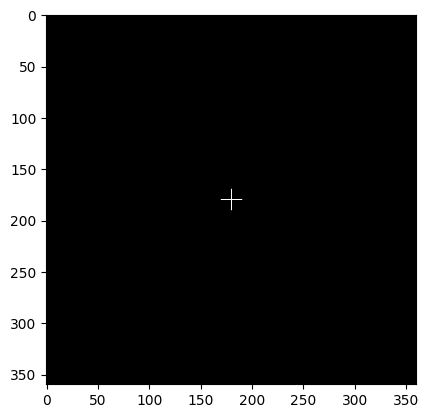

variance difference;  0.0
15   32
Currently checking region with radius :  15


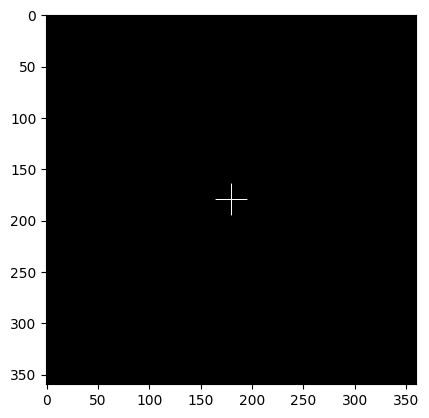

variance difference;  0.0
20   32
Currently checking region with radius :  20


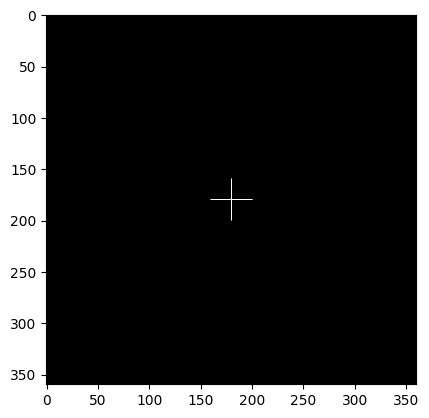

variance difference;  0.0
25   32
Currently checking region with radius :  25


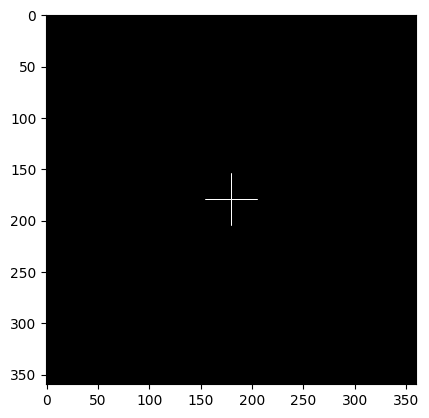

variance difference;  0.0
30   32
Currently checking region with radius :  30


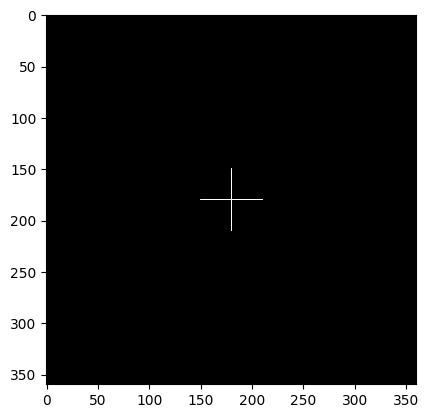

variance difference;  0.0
35   32
Currently checking region with radius :  35


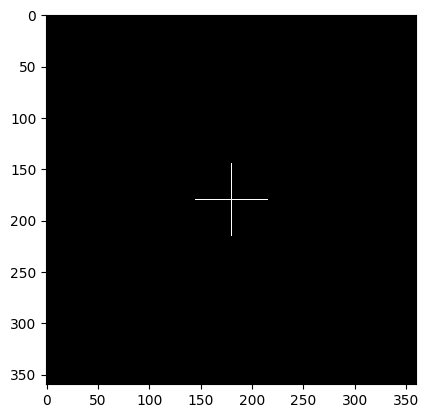

variance difference;  0.0
40   32
Currently checking region with radius :  40


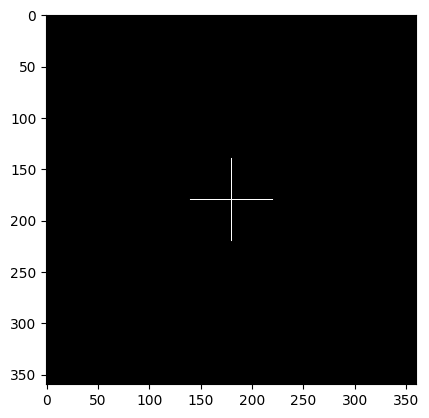

variance difference;  0.0
45   32
Currently checking region with radius :  45


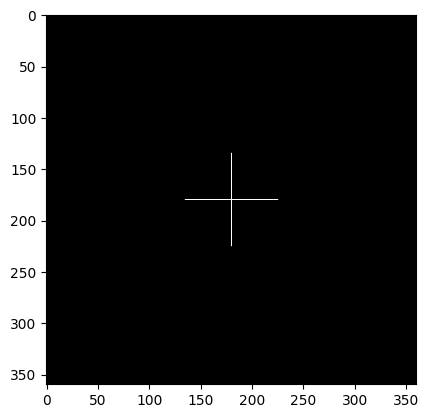

variance difference;  0.0
50   32
Currently checking region with radius :  50


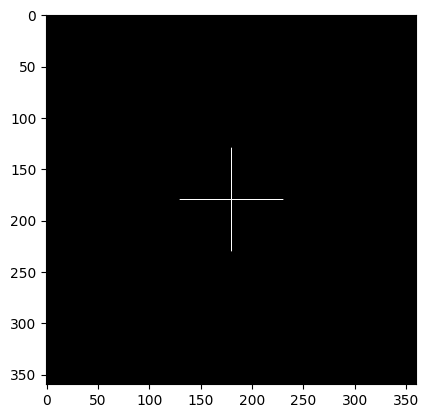

variance difference;  0.0
55   32
Currently checking region with radius :  55


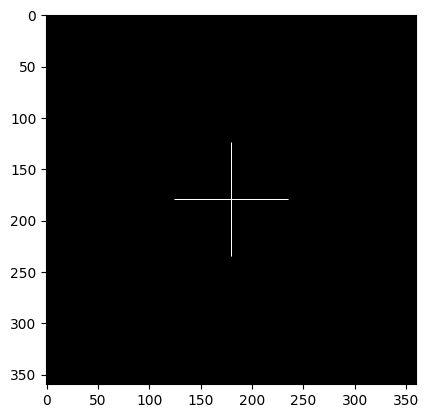

variance difference;  0.0
60   32
Currently checking region with radius :  60


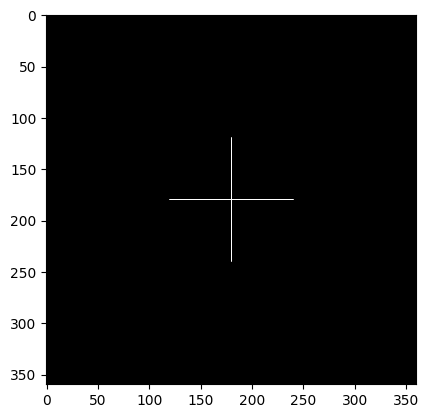

variance difference;  0.0
65   32
Currently checking region with radius :  65


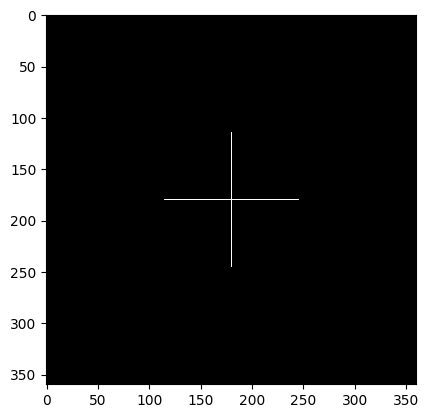

variance difference;  0.0
70   32
Currently checking region with radius :  70


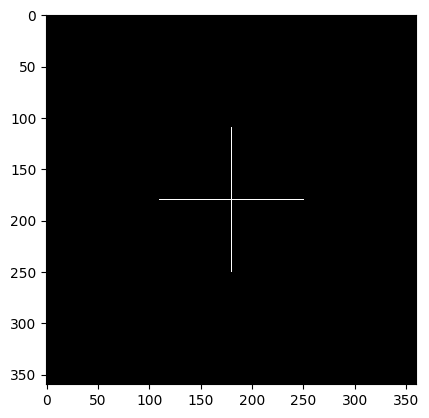

variance difference;  0.0
75   32
Currently checking region with radius :  75


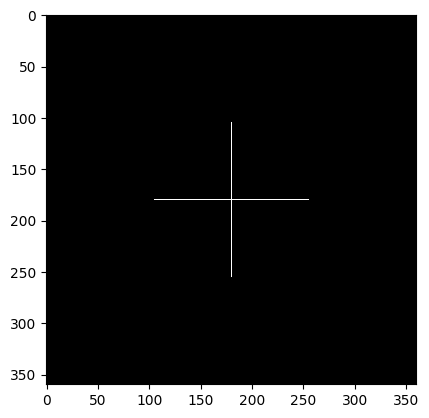

variance difference;  0.0
80   32
Currently checking region with radius :  80


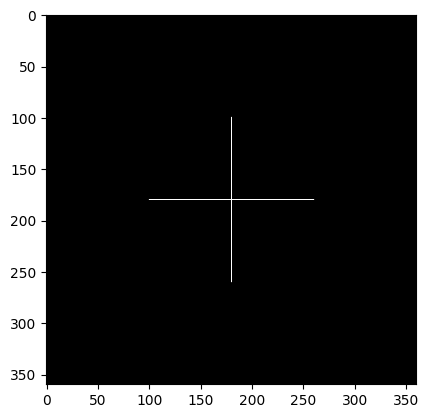

variance difference;  0.0
85   32
Currently checking region with radius :  85


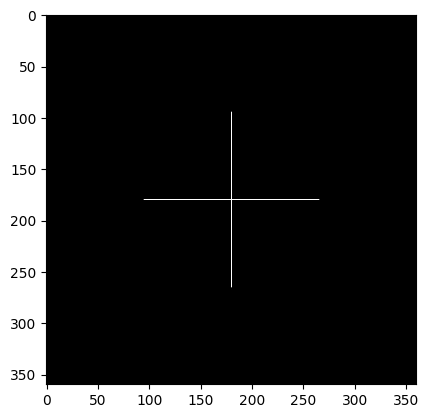

variance difference;  0.0
90   32
Currently checking region with radius :  90


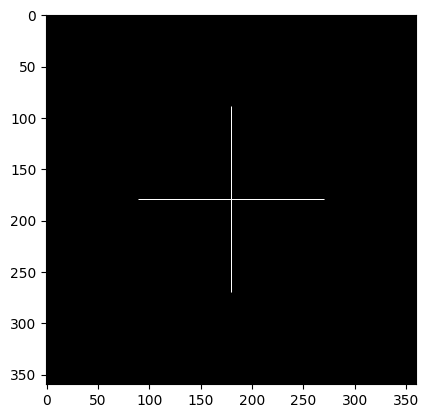

variance difference;  0.0
95   32
Currently checking region with radius :  95


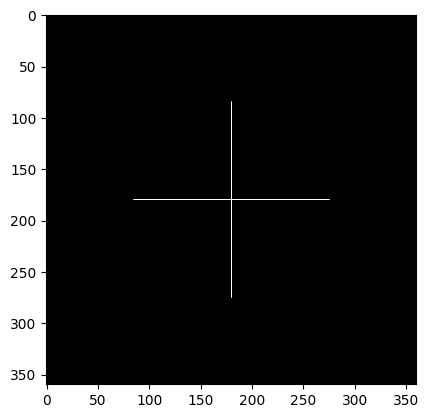

variance difference;  0.0
100   32
Currently checking region with radius :  100


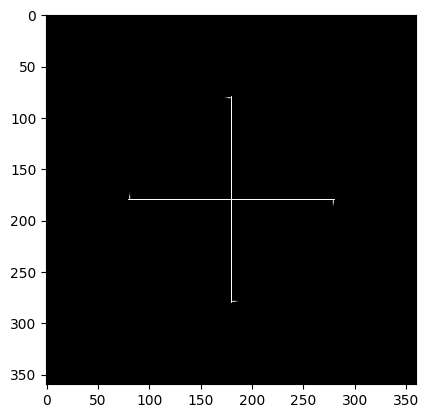

BLUR DETECTED AT RADIUS :  100
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  100
Differnece in variance :  -5.455399035493883
------------------------------------------------------












blurred image with box blur kernel :  20  x  20


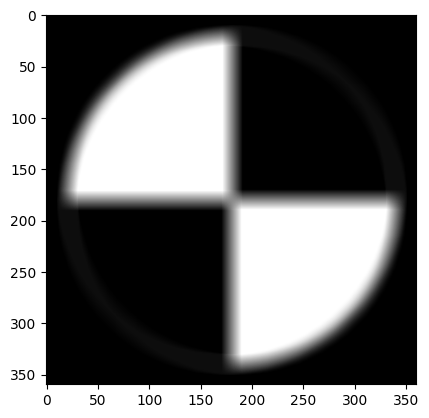

Region with focal radius : 10




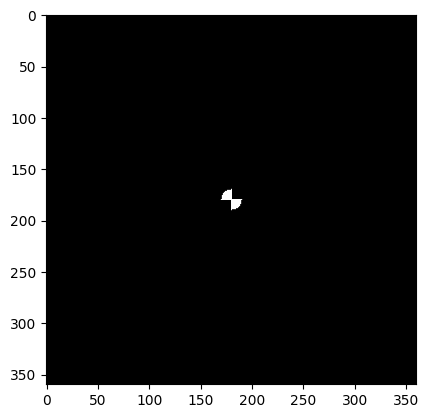

Test image with radius  10  being sharp with rest as blurred


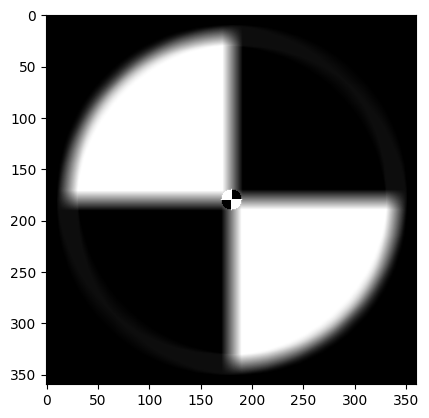

difference in test image and filtered non blurred region (in circular fasion)


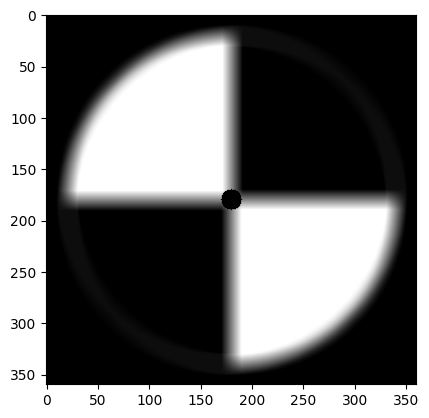

Visualization of separation of non blurred and blurred parts (radius = fr)


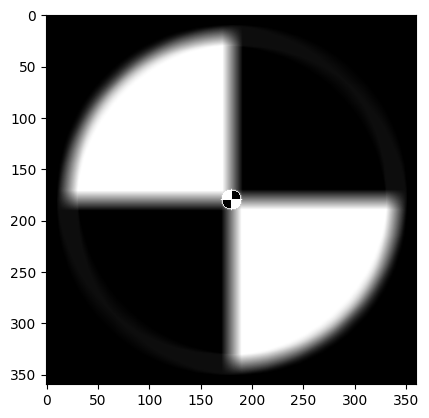

Laplacian Edge Mask


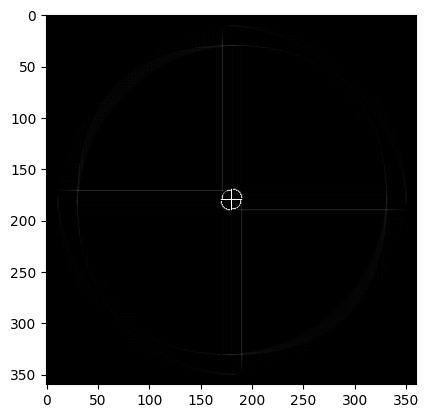

L O G edge mask


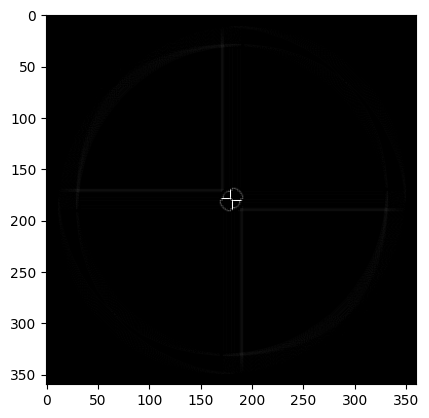

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


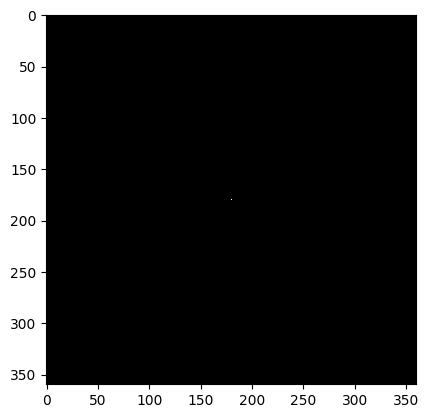

variance difference;  0.0
5   32
Currently checking region with radius :  5


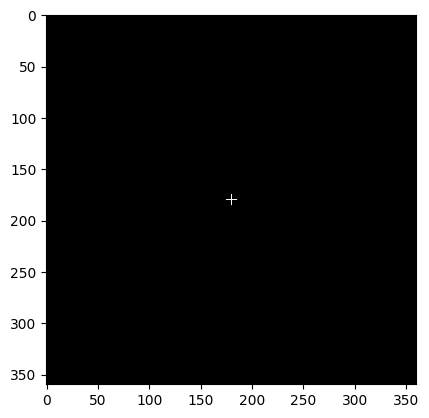

variance difference;  0.0
10   32
Currently checking region with radius :  10


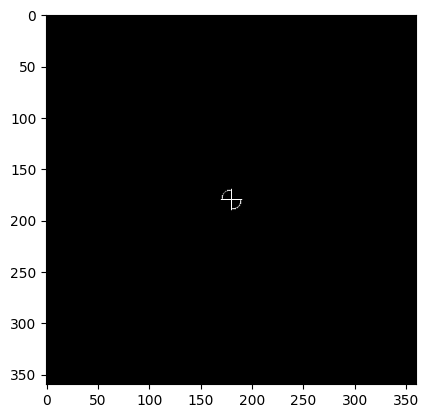

BLUR DETECTED AT RADIUS :  10
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  10
Differnece in variance :  -8.713559945606615
Region with focal radius : 20




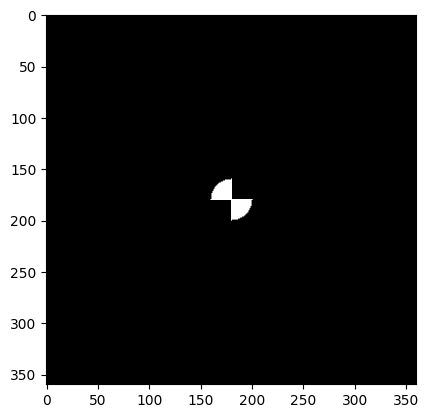

Test image with radius  20  being sharp with rest as blurred


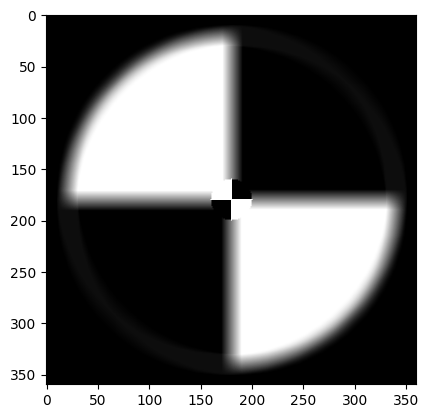

difference in test image and filtered non blurred region (in circular fasion)


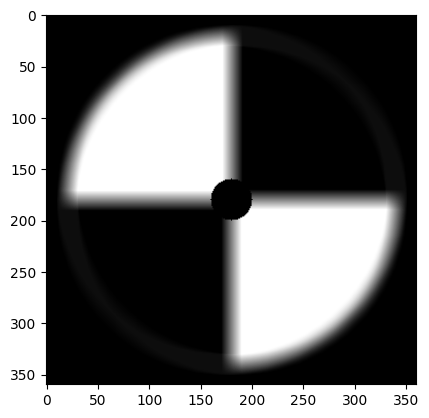

Visualization of separation of non blurred and blurred parts (radius = fr)


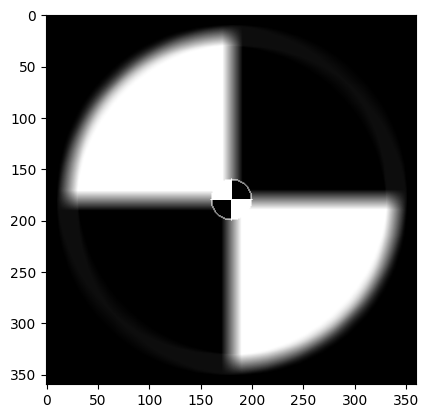

Laplacian Edge Mask


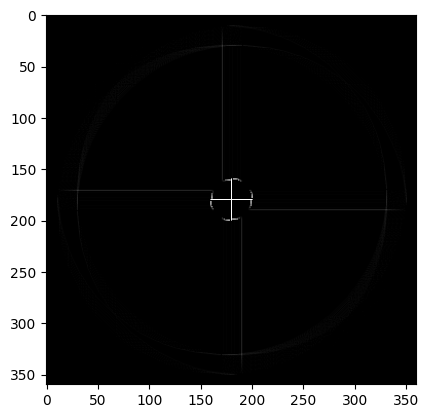

L O G edge mask


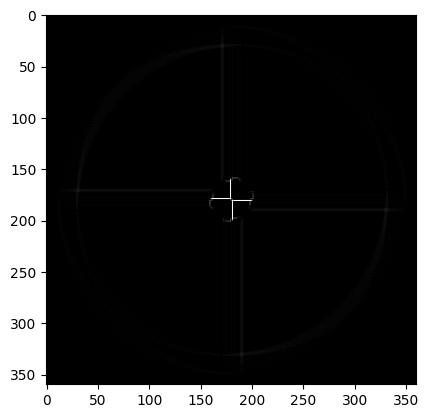

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


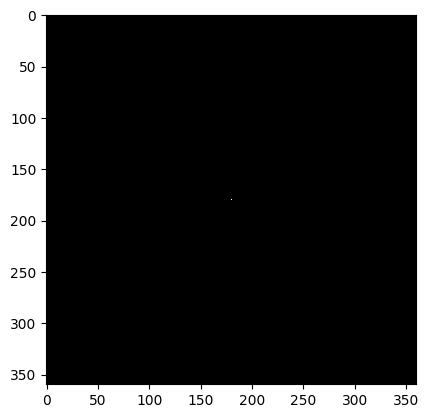

variance difference;  0.0
5   32
Currently checking region with radius :  5


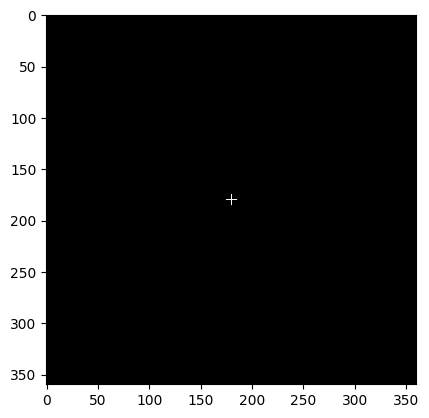

variance difference;  0.0
10   32
Currently checking region with radius :  10


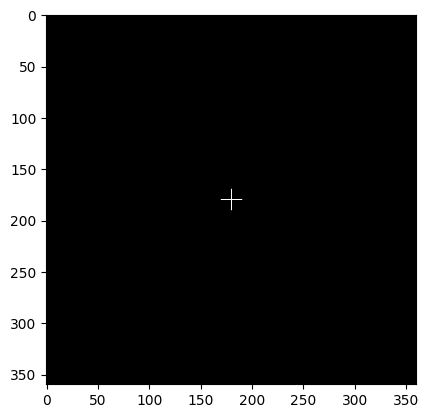

variance difference;  0.0
15   32
Currently checking region with radius :  15


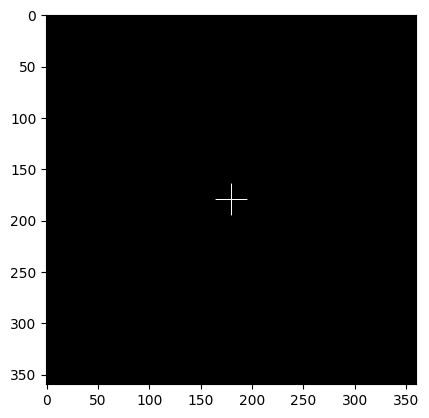

variance difference;  0.0
20   32
Currently checking region with radius :  20


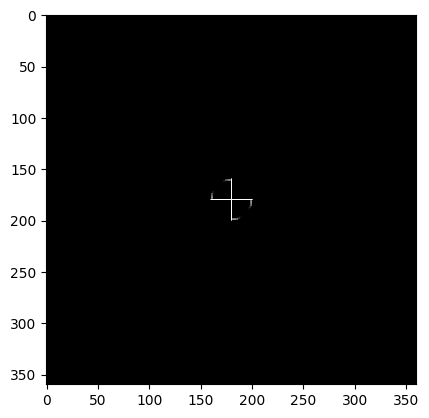

BLUR DETECTED AT RADIUS :  20
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  20
Differnece in variance :  -8.544943570435152
Region with focal radius : 30




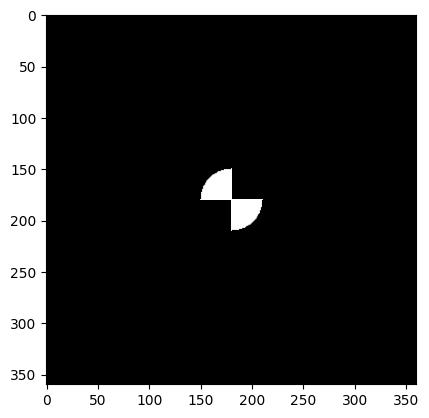

Test image with radius  30  being sharp with rest as blurred


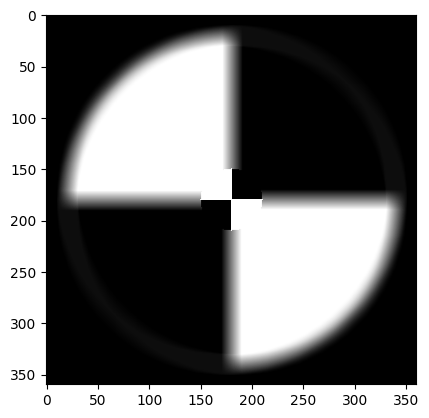

difference in test image and filtered non blurred region (in circular fasion)


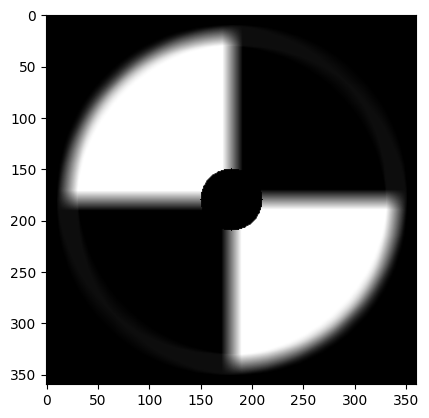

Visualization of separation of non blurred and blurred parts (radius = fr)


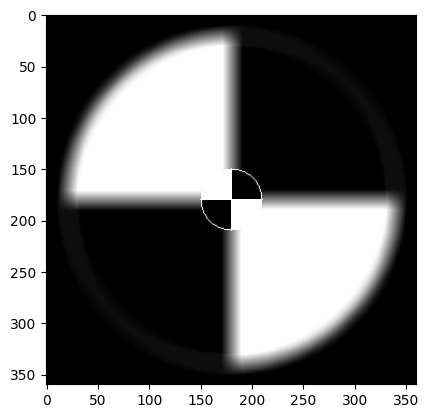

Laplacian Edge Mask


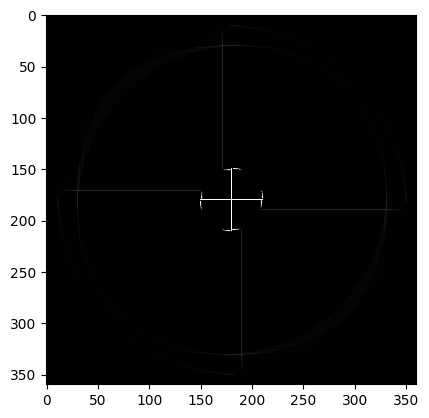

L O G edge mask


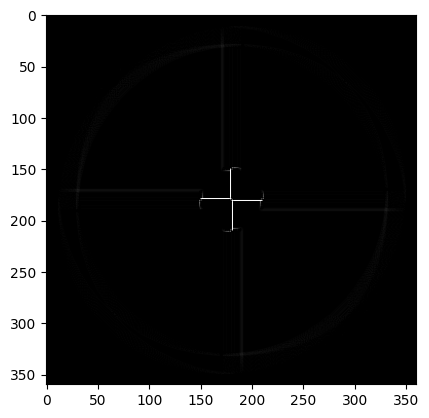

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


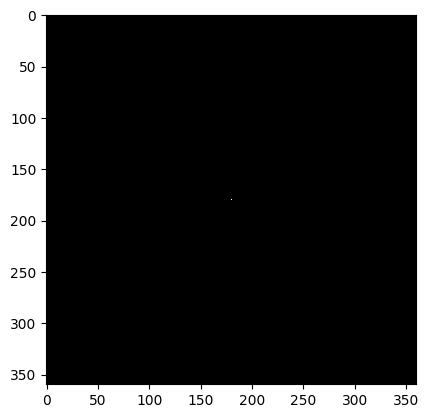

variance difference;  0.0
5   32
Currently checking region with radius :  5


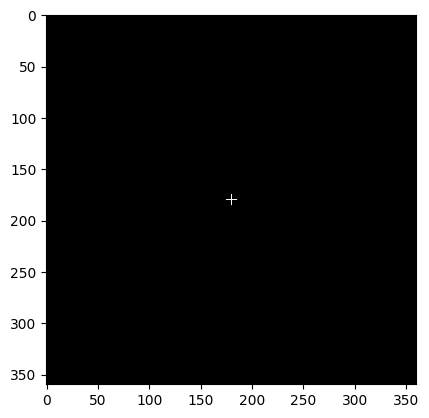

variance difference;  0.0
10   32
Currently checking region with radius :  10


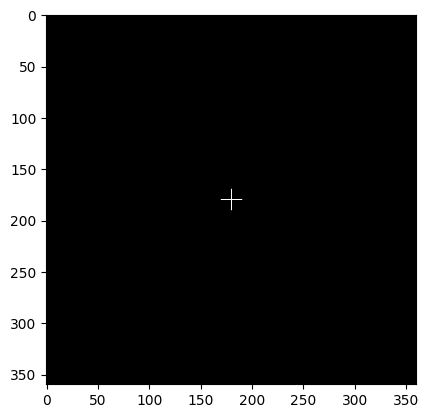

variance difference;  0.0
15   32
Currently checking region with radius :  15


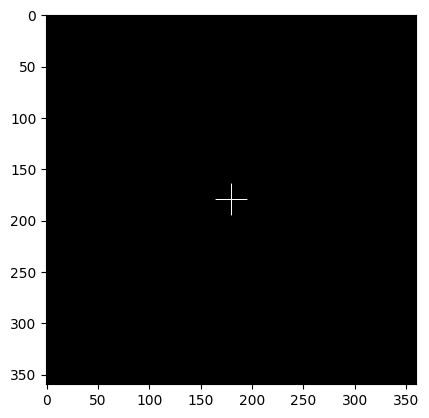

variance difference;  0.0
20   32
Currently checking region with radius :  20


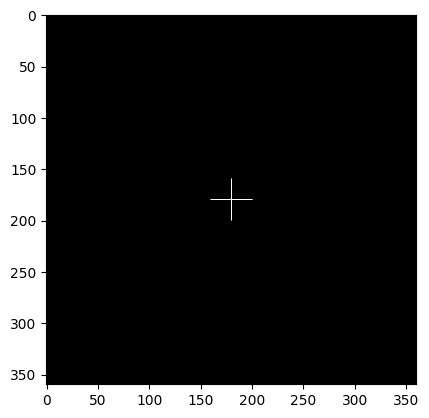

variance difference;  0.0
25   32
Currently checking region with radius :  25


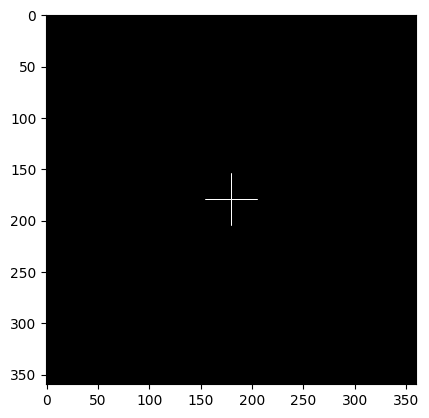

variance difference;  0.0
30   32
Currently checking region with radius :  30


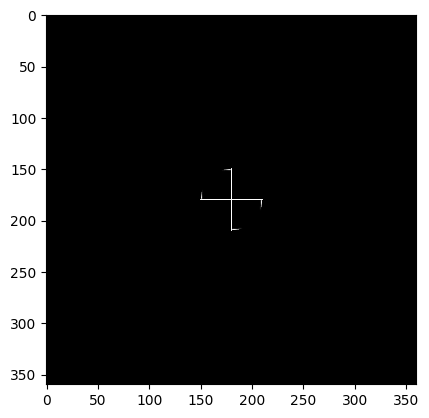

BLUR DETECTED AT RADIUS :  30
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  30
Differnece in variance :  -8.456074694692141
Region with focal radius : 50




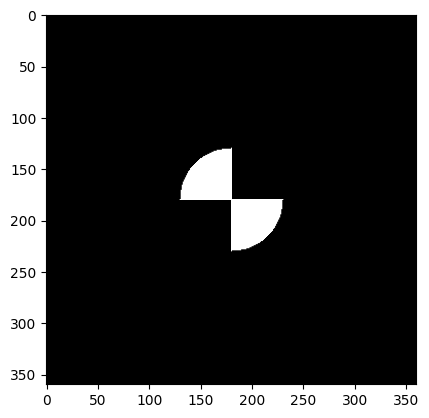

Test image with radius  50  being sharp with rest as blurred


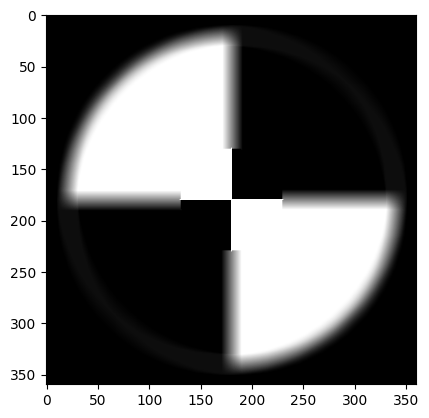

difference in test image and filtered non blurred region (in circular fasion)


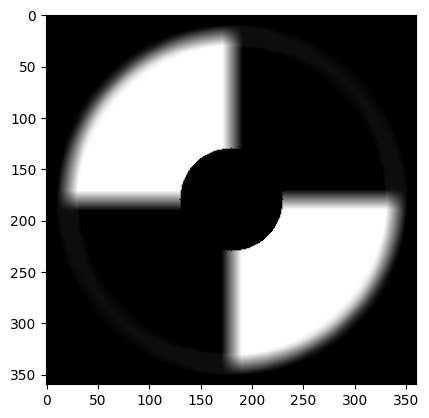

Visualization of separation of non blurred and blurred parts (radius = fr)


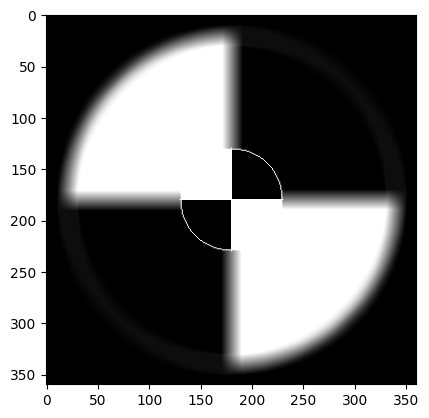

Laplacian Edge Mask


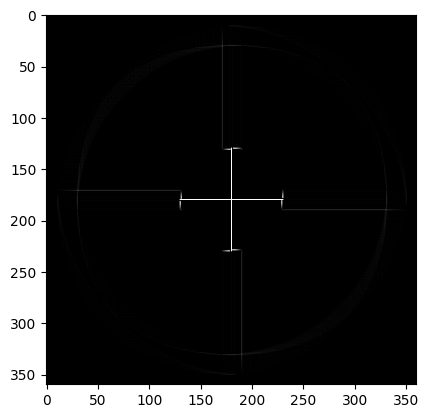

L O G edge mask


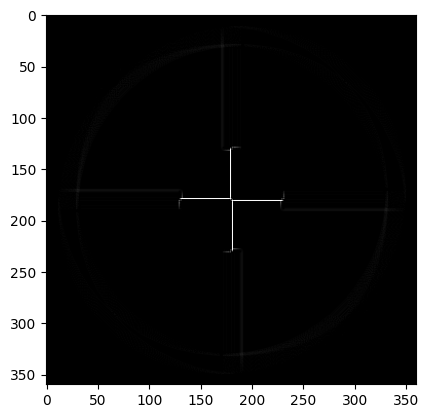

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


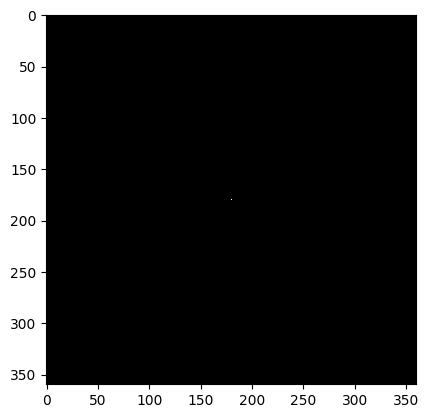

variance difference;  0.0
5   32
Currently checking region with radius :  5


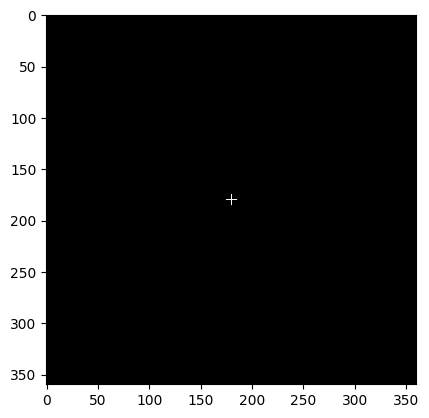

variance difference;  0.0
10   32
Currently checking region with radius :  10


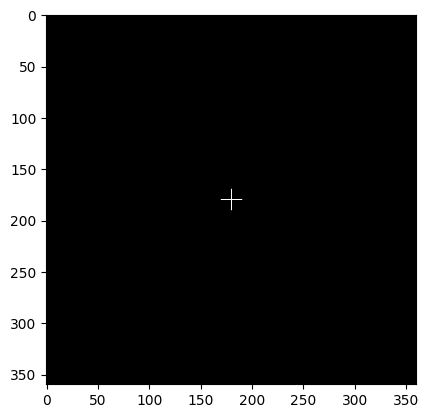

variance difference;  0.0
15   32
Currently checking region with radius :  15


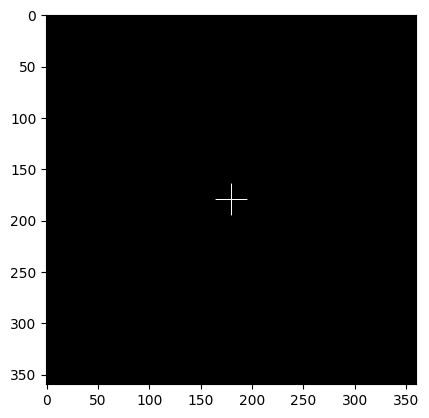

variance difference;  0.0
20   32
Currently checking region with radius :  20


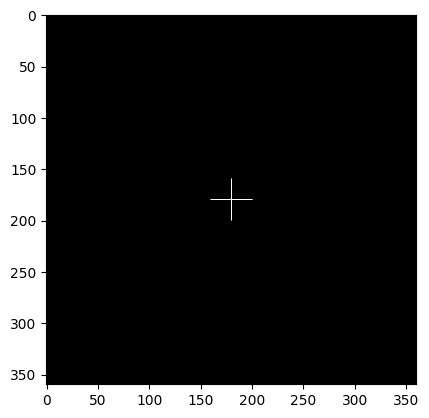

variance difference;  0.0
25   32
Currently checking region with radius :  25


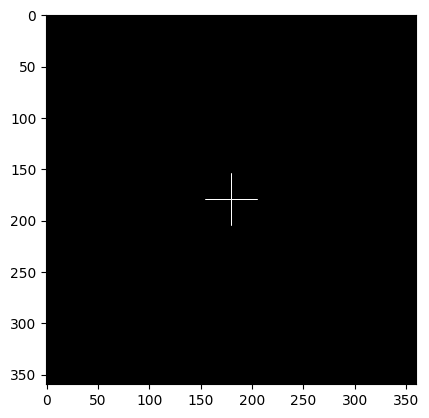

variance difference;  0.0
30   32
Currently checking region with radius :  30


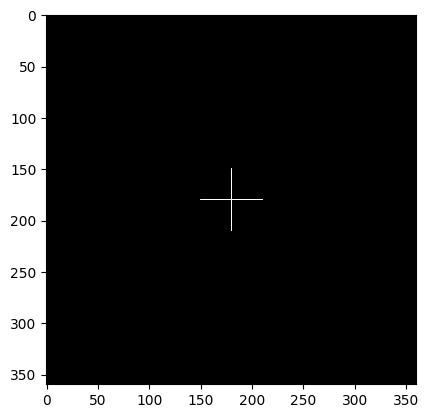

variance difference;  0.0
35   32
Currently checking region with radius :  35


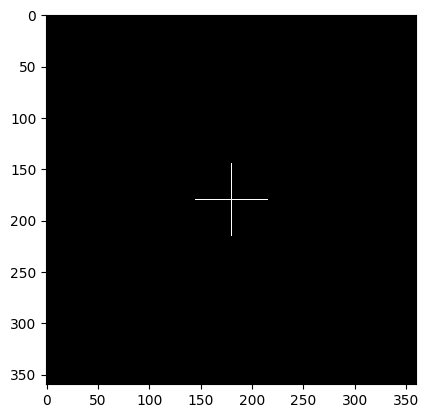

variance difference;  0.0
40   32
Currently checking region with radius :  40


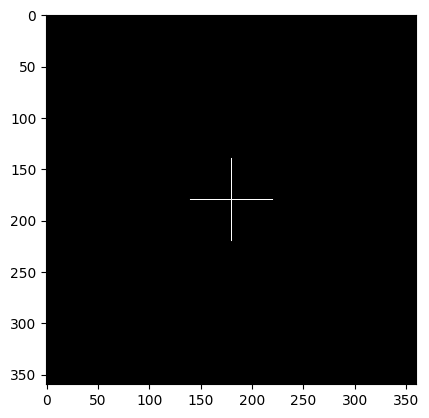

variance difference;  0.0
45   32
Currently checking region with radius :  45


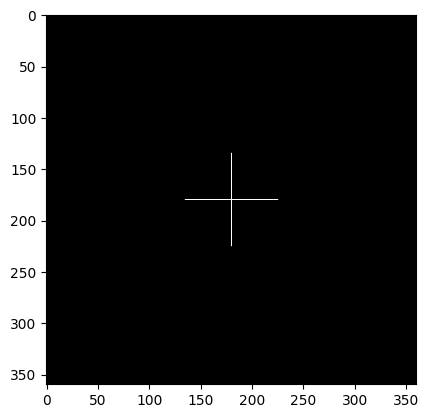

variance difference;  0.0
50   32
Currently checking region with radius :  50


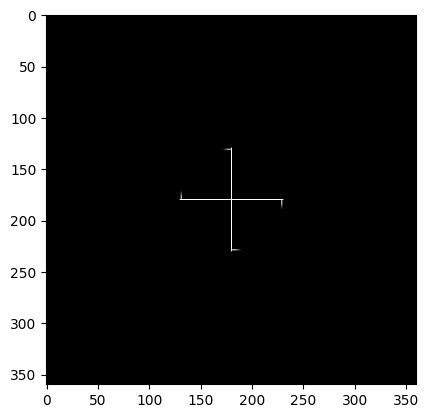

BLUR DETECTED AT RADIUS :  50
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  50
Differnece in variance :  -8.383693028882774
Region with focal radius : 70




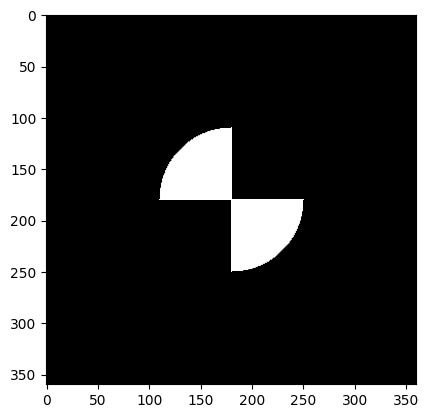

Test image with radius  70  being sharp with rest as blurred


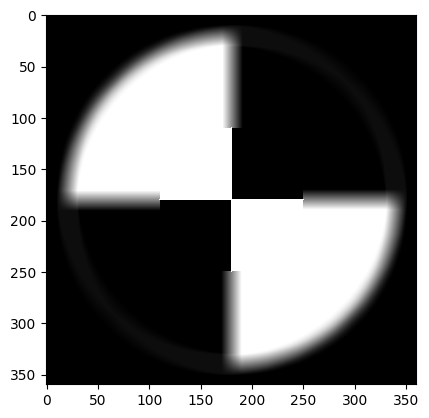

difference in test image and filtered non blurred region (in circular fasion)


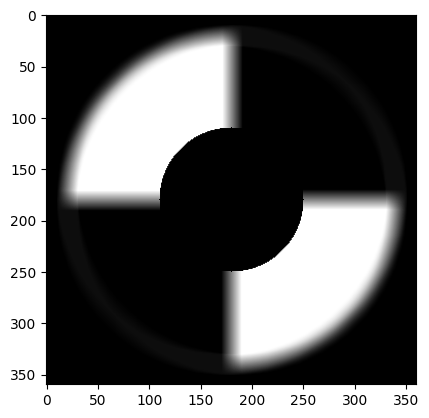

Visualization of separation of non blurred and blurred parts (radius = fr)


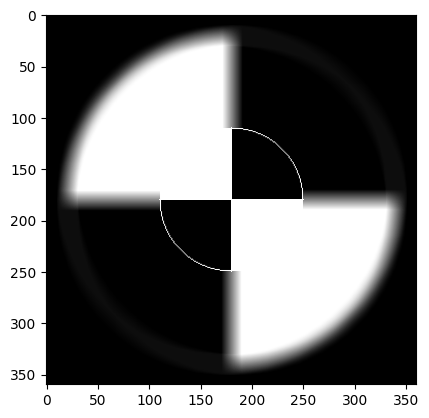

Laplacian Edge Mask


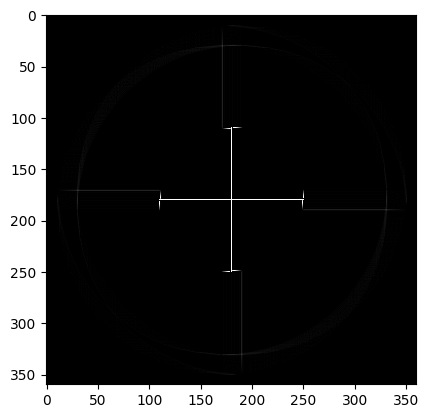

L O G edge mask


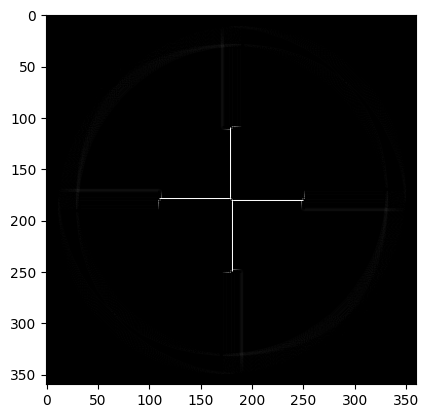

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


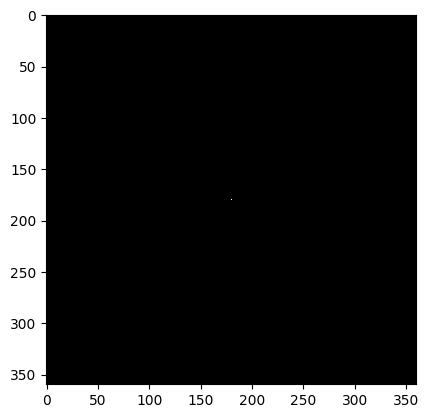

variance difference;  0.0
5   32
Currently checking region with radius :  5


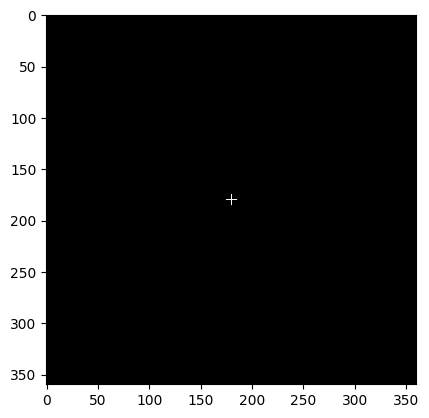

variance difference;  0.0
10   32
Currently checking region with radius :  10


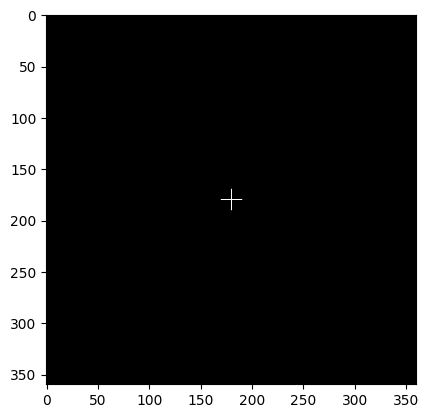

variance difference;  0.0
15   32
Currently checking region with radius :  15


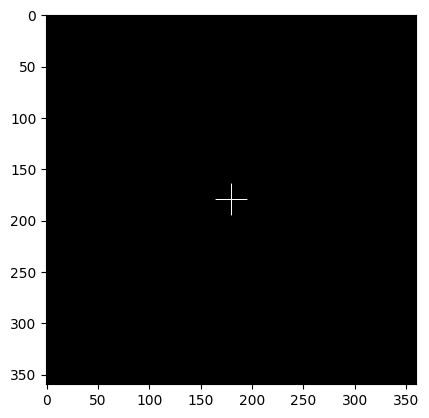

variance difference;  0.0
20   32
Currently checking region with radius :  20


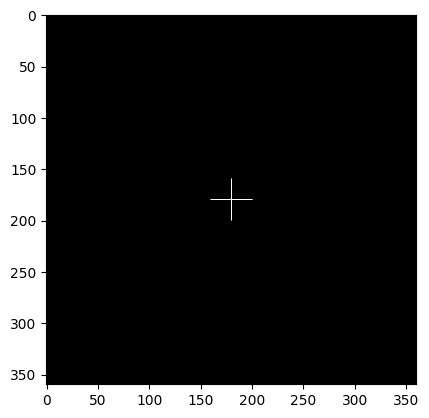

variance difference;  0.0
25   32
Currently checking region with radius :  25


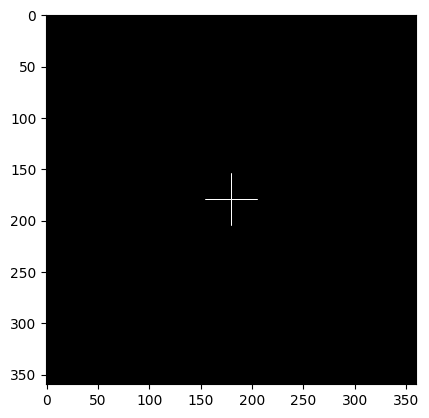

variance difference;  0.0
30   32
Currently checking region with radius :  30


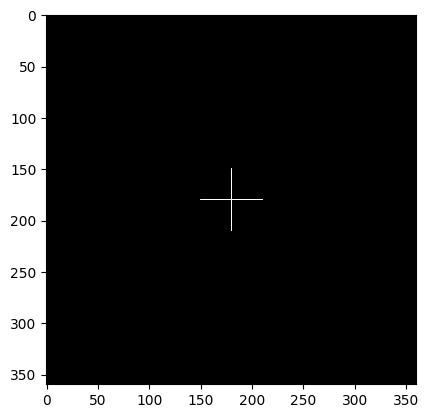

variance difference;  0.0
35   32
Currently checking region with radius :  35


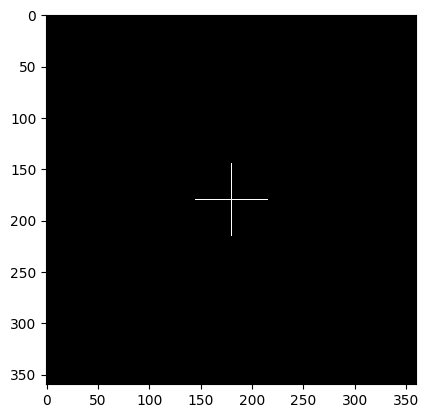

variance difference;  0.0
40   32
Currently checking region with radius :  40


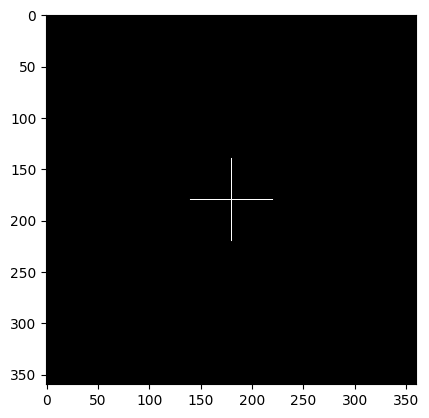

variance difference;  0.0
45   32
Currently checking region with radius :  45


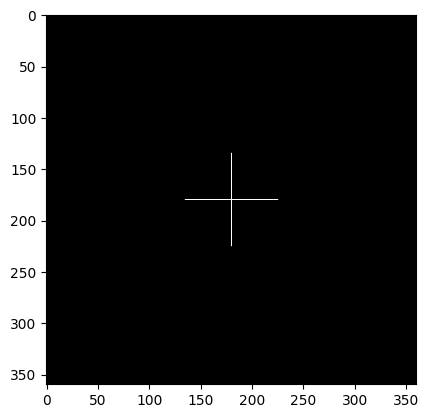

variance difference;  0.0
50   32
Currently checking region with radius :  50


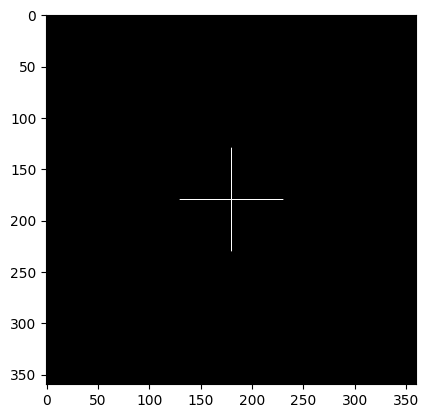

variance difference;  0.0
55   32
Currently checking region with radius :  55


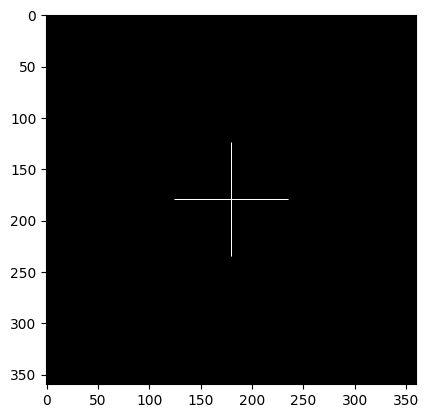

variance difference;  0.0
60   32
Currently checking region with radius :  60


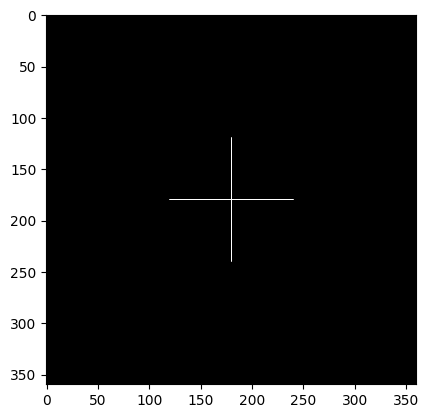

variance difference;  0.0
65   32
Currently checking region with radius :  65


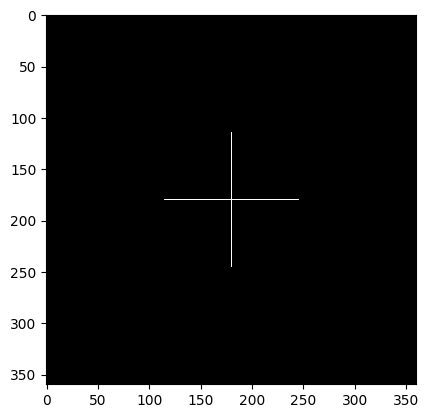

variance difference;  0.0
70   32
Currently checking region with radius :  70


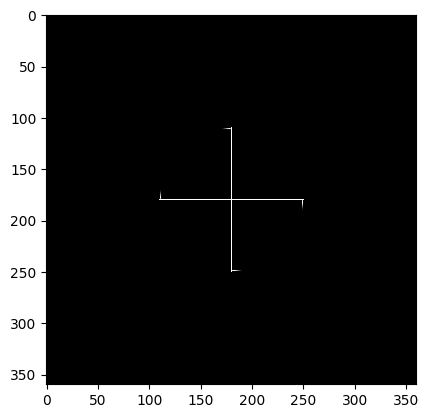

BLUR DETECTED AT RADIUS :  70
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  70
Differnece in variance :  -8.372497642318223
Region with focal radius : 90




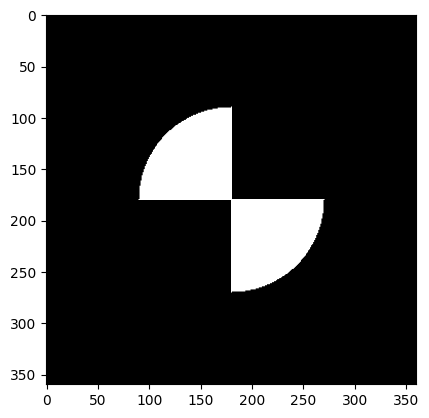

Test image with radius  90  being sharp with rest as blurred


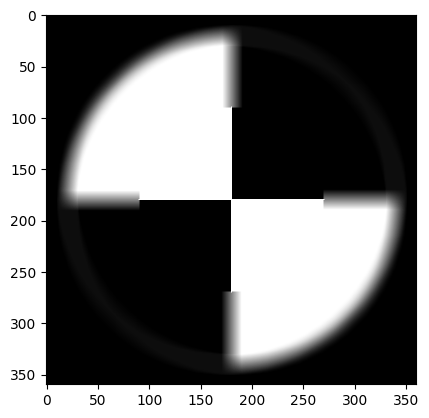

difference in test image and filtered non blurred region (in circular fasion)


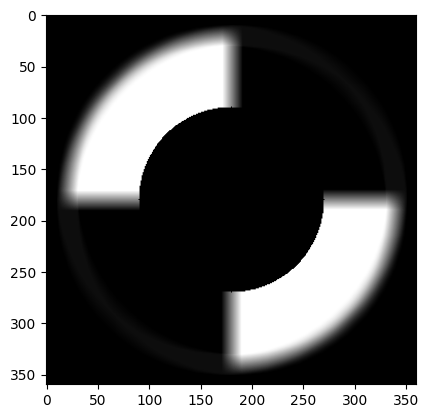

Visualization of separation of non blurred and blurred parts (radius = fr)


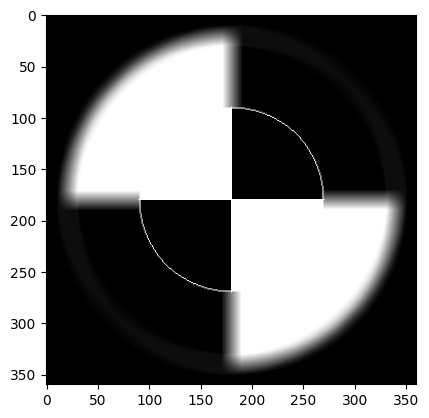

Laplacian Edge Mask


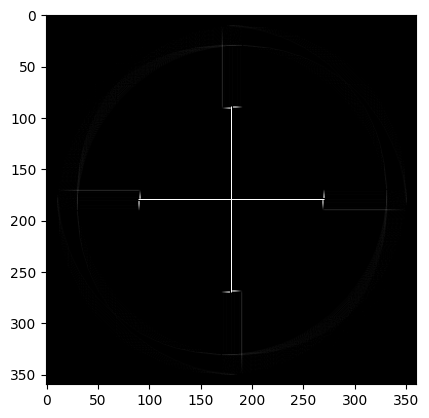

L O G edge mask


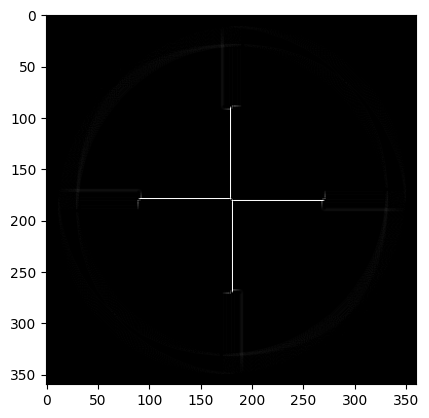

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


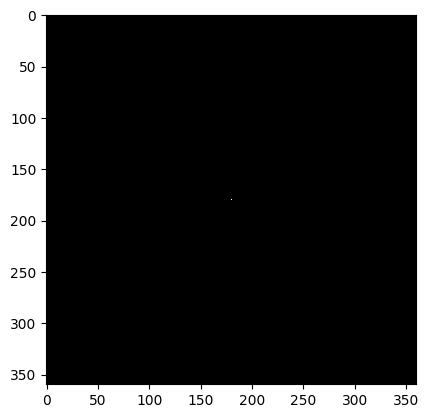

variance difference;  0.0
5   32
Currently checking region with radius :  5


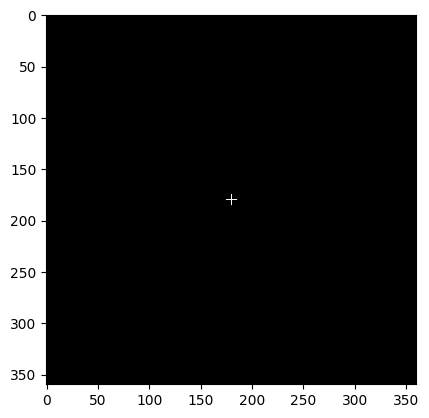

variance difference;  0.0
10   32
Currently checking region with radius :  10


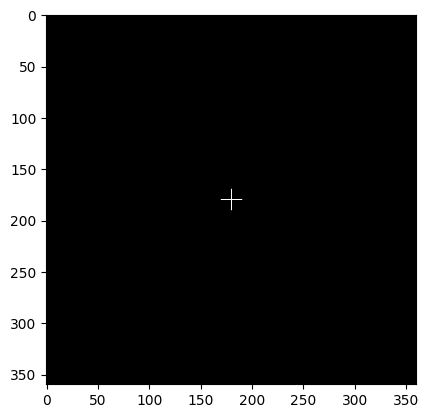

variance difference;  0.0
15   32
Currently checking region with radius :  15


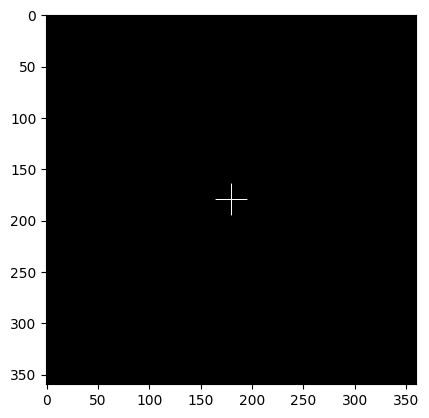

variance difference;  0.0
20   32
Currently checking region with radius :  20


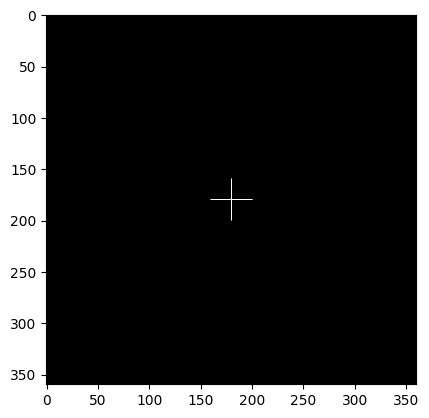

variance difference;  0.0
25   32
Currently checking region with radius :  25


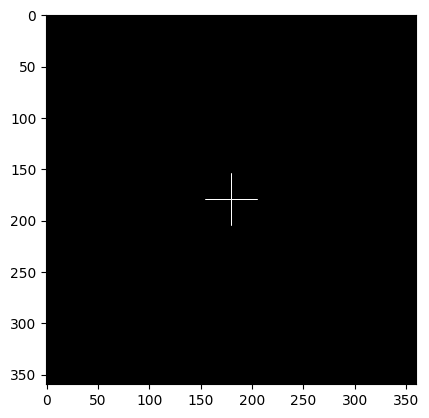

variance difference;  0.0
30   32
Currently checking region with radius :  30


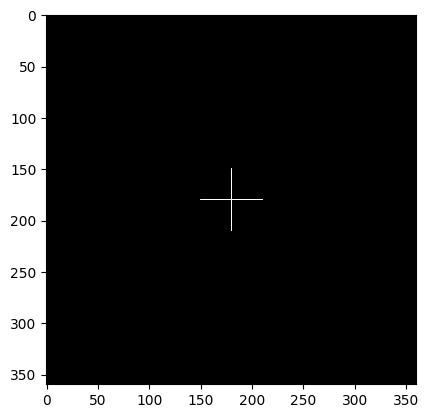

variance difference;  0.0
35   32
Currently checking region with radius :  35


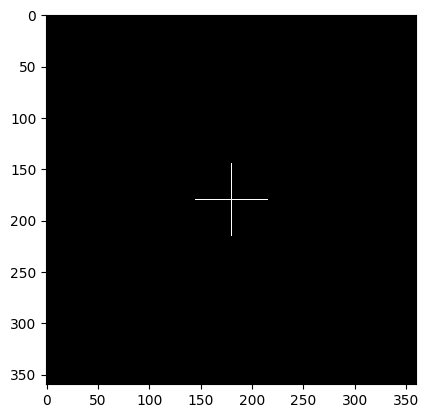

variance difference;  0.0
40   32
Currently checking region with radius :  40


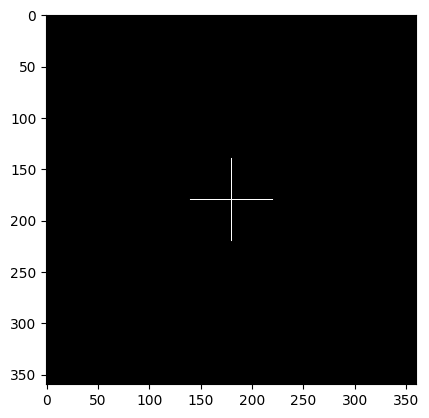

variance difference;  0.0
45   32
Currently checking region with radius :  45


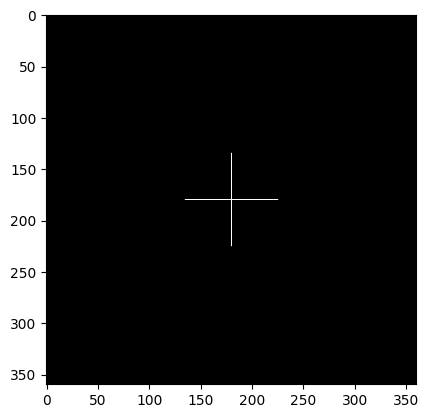

variance difference;  0.0
50   32
Currently checking region with radius :  50


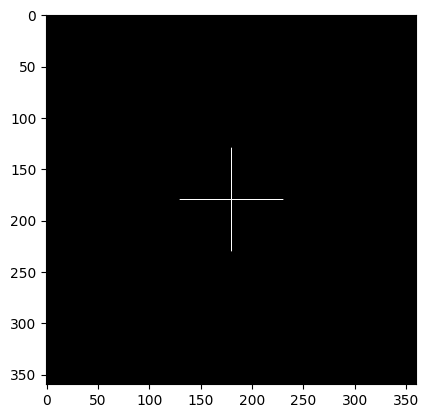

variance difference;  0.0
55   32
Currently checking region with radius :  55


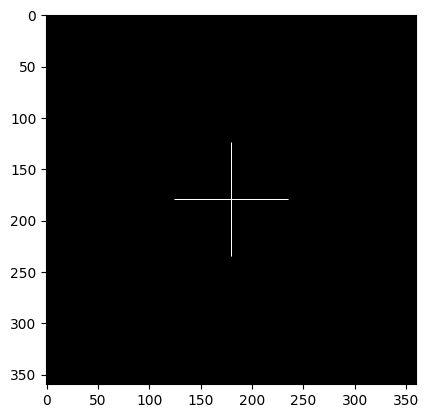

variance difference;  0.0
60   32
Currently checking region with radius :  60


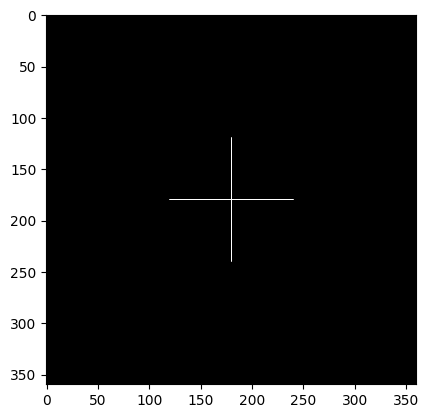

variance difference;  0.0
65   32
Currently checking region with radius :  65


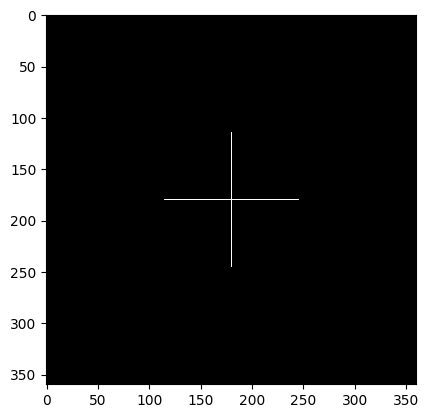

variance difference;  0.0
70   32
Currently checking region with radius :  70


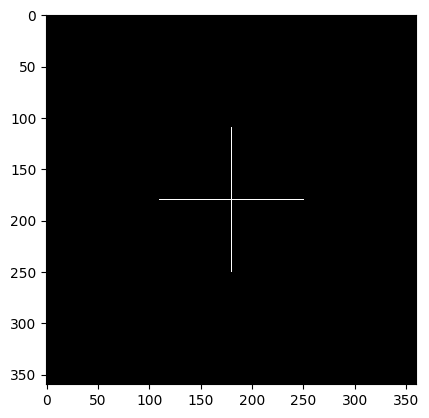

variance difference;  0.0
75   32
Currently checking region with radius :  75


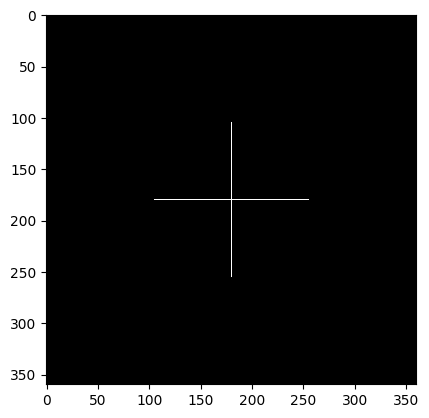

variance difference;  0.0
80   32
Currently checking region with radius :  80


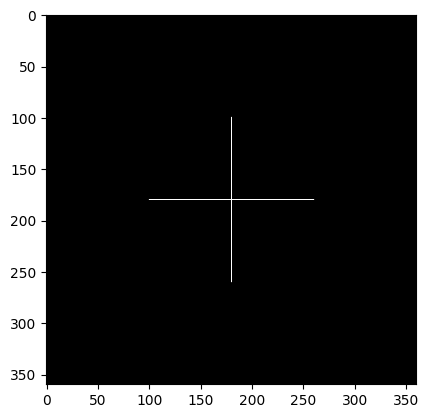

variance difference;  0.0
85   32
Currently checking region with radius :  85


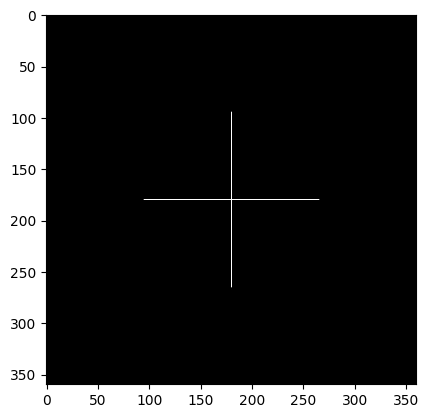

variance difference;  0.0
90   32
Currently checking region with radius :  90


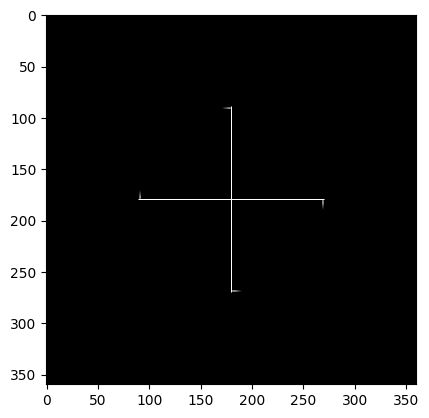

BLUR DETECTED AT RADIUS :  90
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  90
Differnece in variance :  -8.358870241769438
Region with focal radius : 100




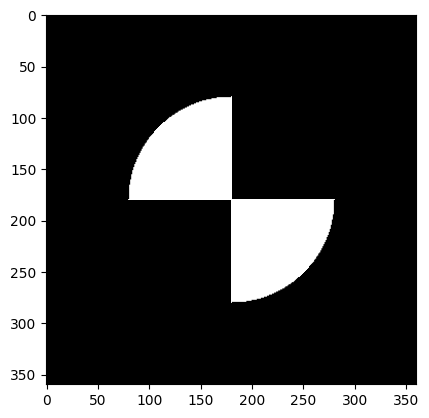

Test image with radius  100  being sharp with rest as blurred


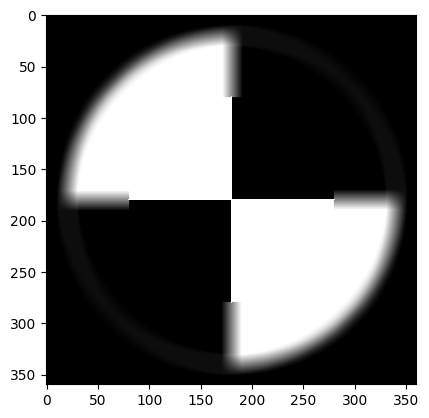

difference in test image and filtered non blurred region (in circular fasion)


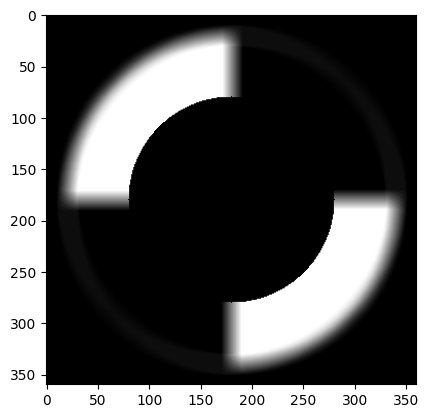

Visualization of separation of non blurred and blurred parts (radius = fr)


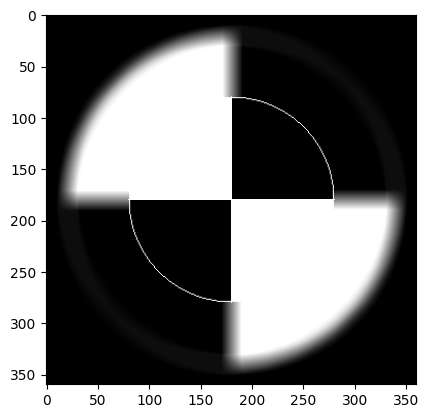

Laplacian Edge Mask


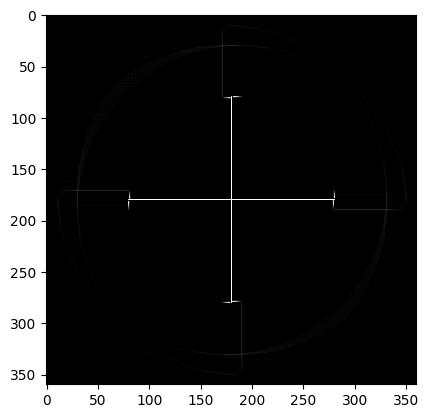

L O G edge mask


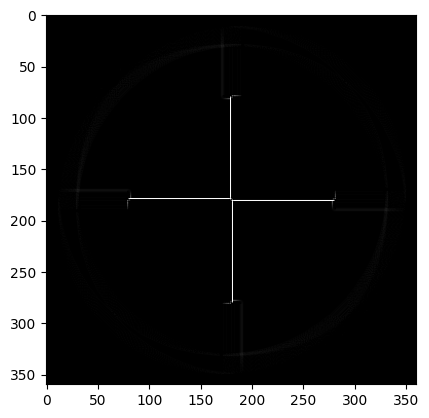

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


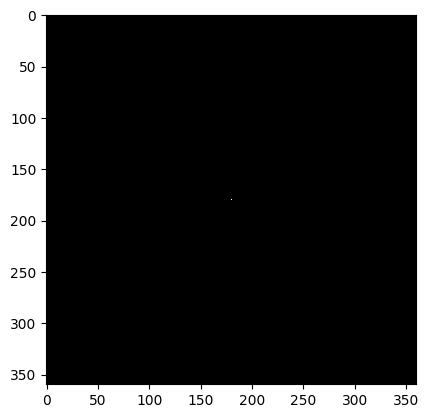

variance difference;  0.0
5   32
Currently checking region with radius :  5


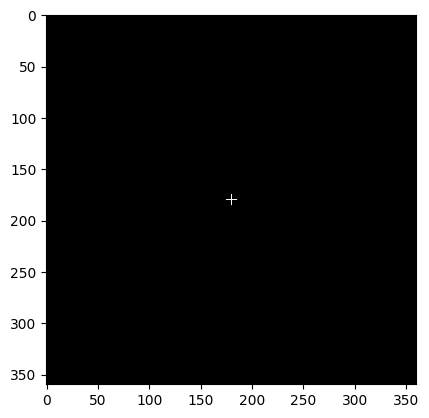

variance difference;  0.0
10   32
Currently checking region with radius :  10


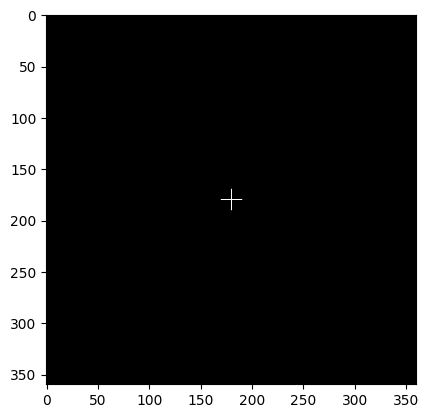

variance difference;  0.0
15   32
Currently checking region with radius :  15


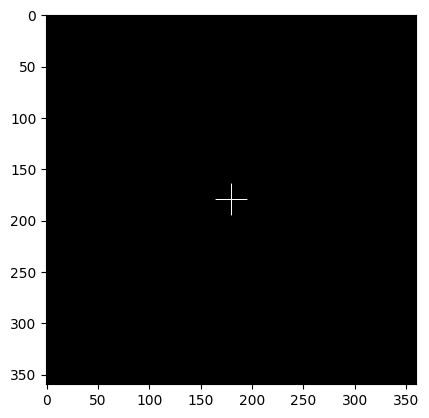

variance difference;  0.0
20   32
Currently checking region with radius :  20


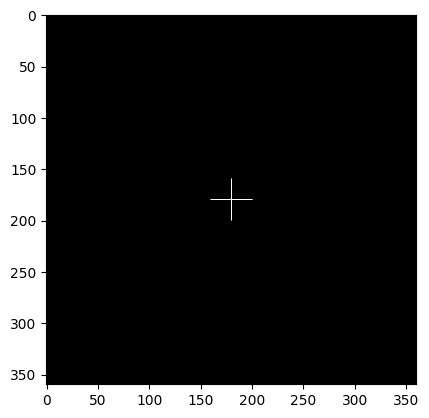

variance difference;  0.0
25   32
Currently checking region with radius :  25


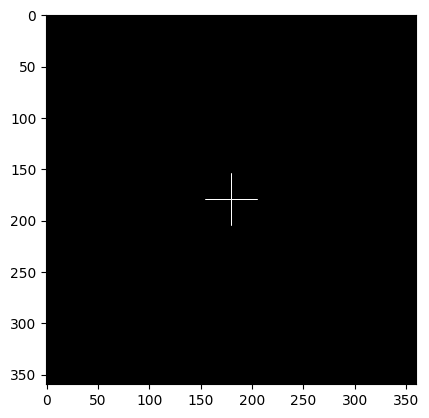

variance difference;  0.0
30   32
Currently checking region with radius :  30


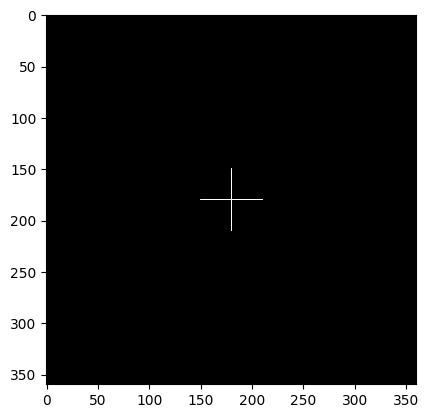

variance difference;  0.0
35   32
Currently checking region with radius :  35


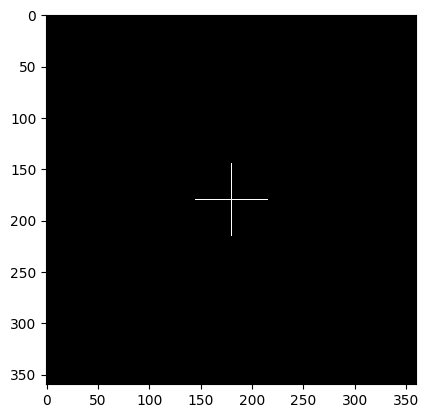

variance difference;  0.0
40   32
Currently checking region with radius :  40


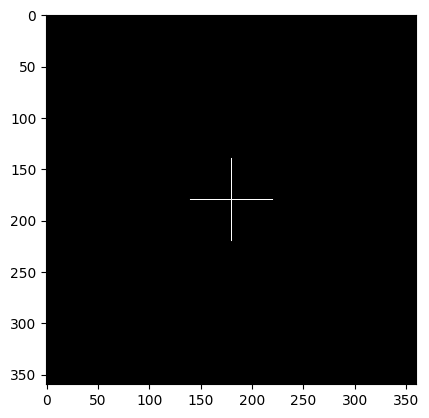

variance difference;  0.0
45   32
Currently checking region with radius :  45


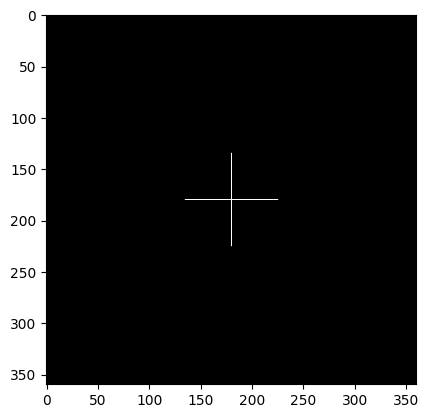

variance difference;  0.0
50   32
Currently checking region with radius :  50


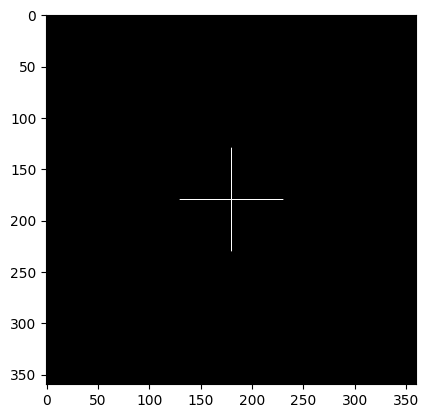

variance difference;  0.0
55   32
Currently checking region with radius :  55


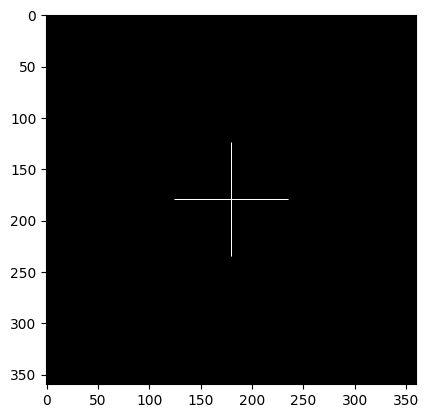

variance difference;  0.0
60   32
Currently checking region with radius :  60


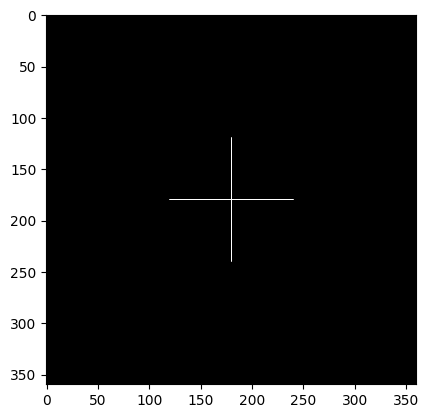

variance difference;  0.0
65   32
Currently checking region with radius :  65


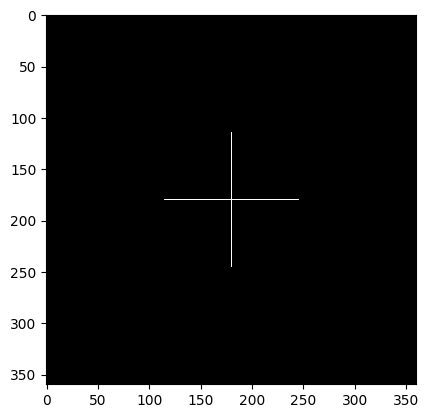

variance difference;  0.0
70   32
Currently checking region with radius :  70


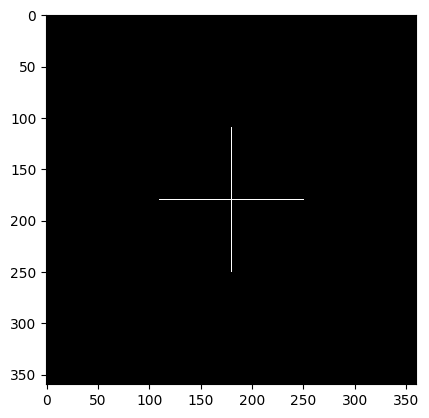

variance difference;  0.0
75   32
Currently checking region with radius :  75


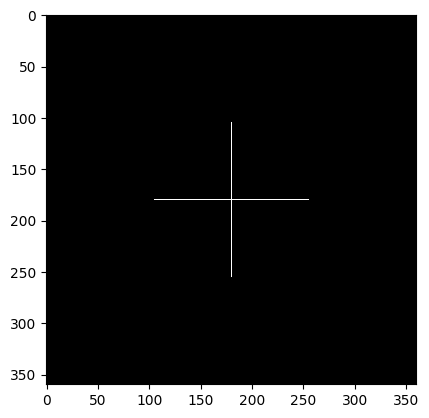

variance difference;  0.0
80   32
Currently checking region with radius :  80


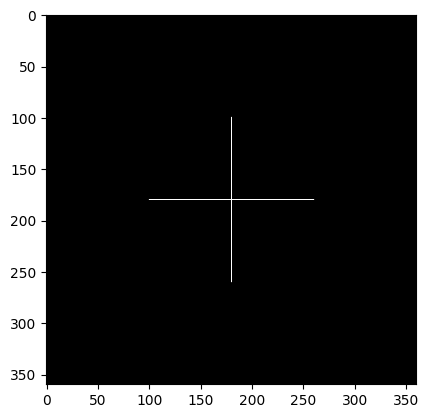

variance difference;  0.0
85   32
Currently checking region with radius :  85


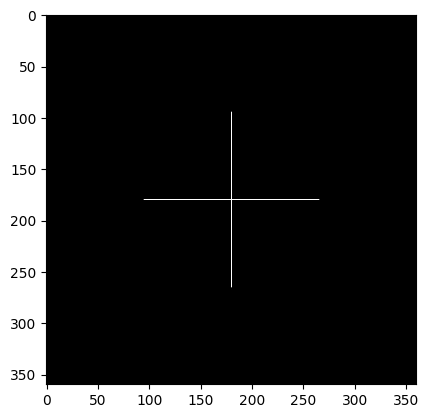

variance difference;  0.0
90   32
Currently checking region with radius :  90


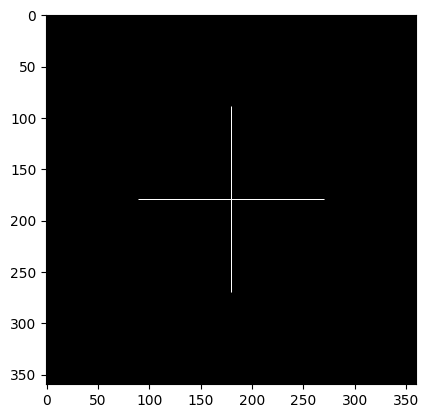

variance difference;  0.0
95   32
Currently checking region with radius :  95


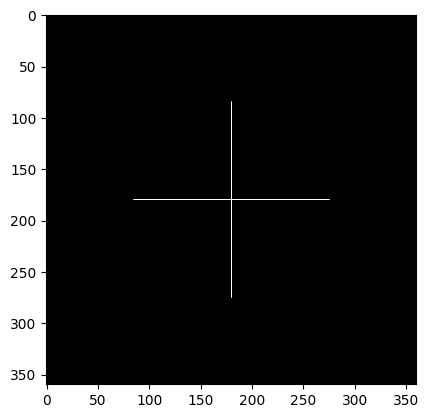

variance difference;  0.0
100   32
Currently checking region with radius :  100


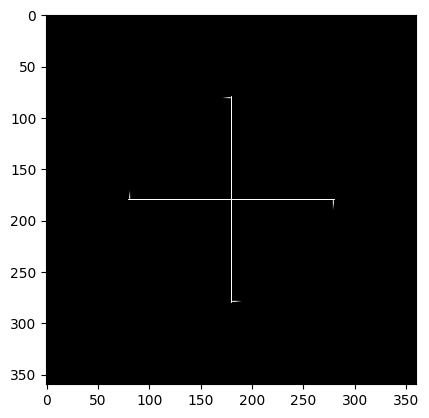

BLUR DETECTED AT RADIUS :  100
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  100
Differnece in variance :  -8.352056541495244
------------------------------------------------------














In [68]:
focal_radiis = [10, 20, 30, 50, 70, 90, 100]
images = []
blur_kernels = [5, 15, 20]

for blur_kernel in blur_kernels:
    print('blurred image with box blur kernel : ', blur_kernel, ' x ', blur_kernel)
    blurred_image = cv2.blur(image, (blur_kernel,blur_kernel))
    plt.imshow(blurred_image, cmap='gray')
    plt.show()
    
    # Blur the original image using simple box blur, and create new images where from the center ro radius fr, the image is not blurred.

    for fr in focal_radiis:
        mask = np.zeros(IMG_DIMS, dtype=np.uint8)
        non_blurred_region = cv2.circle(mask, CENTER, fr, (255, 255, 255), -1)
        non_blurred_region = cv2.bitwise_and(non_blurred_region, image)
        print('Region with focal radius : ' + str(fr) + '\n\n')
        plt.imshow(non_blurred_region, cmap='gray')
        plt.show()

        blurred_image_copy = blurred_image.copy()
        blurred_image_copy = cv2.circle(blurred_image_copy, CENTER, fr, (0, 0, 0), -1)
        test_image = blurred_image_copy +  non_blurred_region
            
        print('Test image with radius ', fr, ' being sharp with rest as blurred')
        plt.imshow(test_image, cmap='gray')
        plt.show()

        print('difference in test image and filtered non blurred region (in circular fasion)')
        plt.imshow(test_image - non_blurred_region, cmap='gray')
        plt.show()

        print('Visualization of separation of non blurred and blurred parts (radius = fr)')
        test_image_copy = test_image.copy()
        plt.imshow(cv2.circle(test_image_copy, CENTER, fr, (255, 0, 0), 1), cmap='gray')
        plt.show()

        laplacian_filter_8 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
        edge_mask = cv2.filter2D(test_image, -1, laplacian_filter_8)
        
        print('Laplacian Edge Mask')
        plt.imshow(edge_mask, cmap='gray')
        plt.show()

        gaussian_image = cv2.GaussianBlur(test_image, (3, 3), 3)
        g_edge_mask = cv2.filter2D(gaussian_image, -1, laplacian_filter_8)
        print('L O G edge mask')
        plt.imshow(g_edge_mask, cmap='gray')
        plt.show()

        print("Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask")

        # Just using large variance for initial test case.
        variances = []
        previous_variance = 999999999999999 
        comparison_index = 0
        for i in range(0, RADIUS, 5):
            print(i, ' ', len(original_variances))
            mask = np.zeros(IMG_DIMS, dtype=np.uint8)
            curr_radius_check_range = cv2.circle(mask, CENTER, i, (255, 255, 255), -1)
            curr_region_to_check = cv2.bitwise_and(edge_mask, curr_radius_check_range)
            print('Currently checking region with radius : ', i)
            plt.imshow(curr_region_to_check, cmap='gray')
            plt.show()
            
            var = curr_region_to_check.var()
            if var != original_variances[comparison_index]:
                print('BLUR DETECTED AT RADIUS : ', i)
                print('FOR VERIFICATION : CORRECT fr WAS AT RADIUS : ', fr)
                print('Differnece in variance : ', original_variances[comparison_index] - var)
                break
            print('variance difference; ', original_variances[comparison_index] - var)
            variances.append(var)
            comparison_index += 1

        #print(variances)
        
    print('------------------------------------------------------\n\n\n\n\n\n\n\n\n\n\n\n')

#print(original_variances)

In [69]:
# Capture the original variances for varius radii.
original_variances = []
laplacian_filter_8 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

for i in range(0, RADIUS, 5):
    edge_mask = cv2.filter2D(cv2.GaussianBlur(image, (3, 3), 5), -1, laplacian_filter_8)
    mask = np.zeros(IMG_DIMS, dtype=np.uint8)
    curr_radius_check_range = cv2.circle(mask, CENTER, i, (255, 255, 255), -1)
    curr_region_to_check = cv2.bitwise_and(edge_mask, curr_radius_check_range)
    original_variances.append(curr_region_to_check.var())

print(original_variances)
            

[0.00049382335009907, 6.828163464982471, 16.85900272824264, 26.886744855014474, 36.91138984529799, 46.93293769909312, 56.95138841639993, 66.9667419972184, 76.97899844154857, 86.98815774939031, 96.99421992074377, 106.9971849556089, 116.99705285398564, 126.99382361587409, 136.9874972412742, 146.97807373018597, 156.96555308260938, 166.9499352985445, 176.93122037799108, 186.90940832094947, 196.8844991274195, 206.85649279740133, 216.82538933089475, 226.7911887278997, 236.7538909884164, 246.71349611244466, 256.6700040999848, 266.62341495103647, 276.57372866559984, 286.52094524367476, 296.4650646852614, 306.4060869903596]


blurred image with box blur kernel :  5  x  5


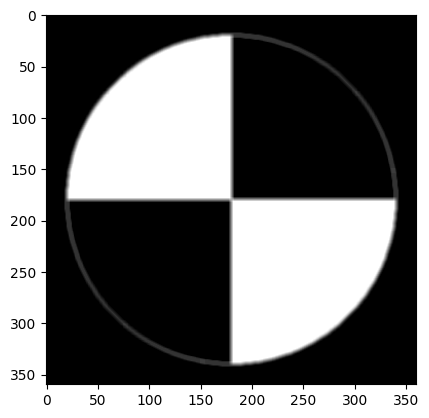

Region with focal radius : 10




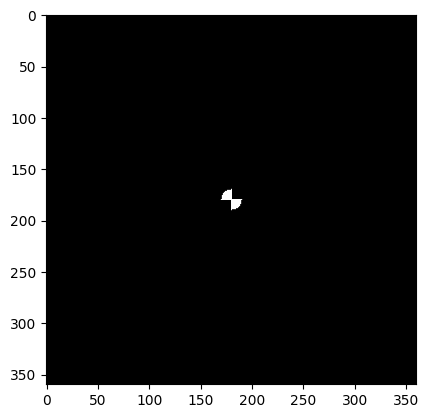

Test image with radius  10  being sharp with rest as blurred


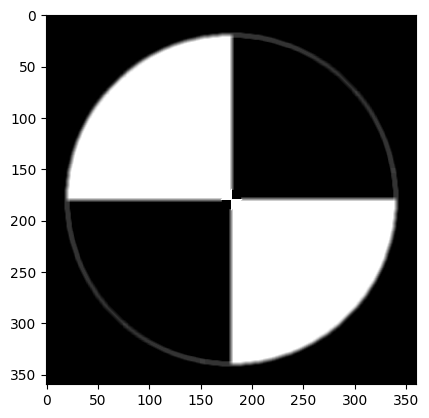

difference in test image and filtered non blurred region (in circular fasion)


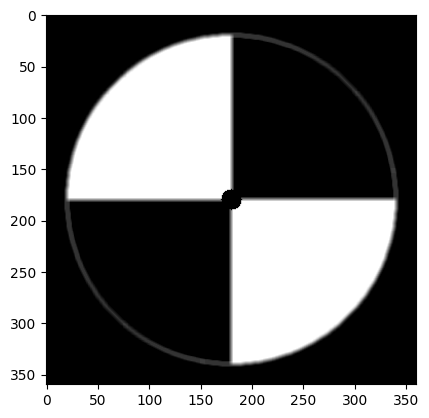

Visualization of separation of non blurred and blurred parts (radius = fr)


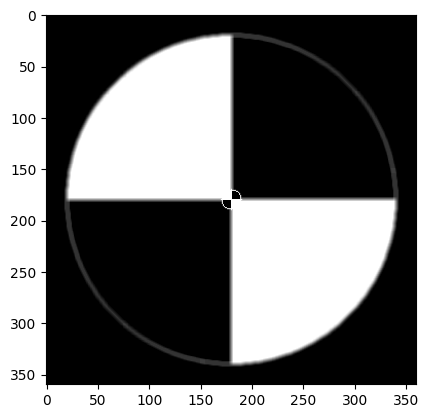

Laplacian Edge Mask


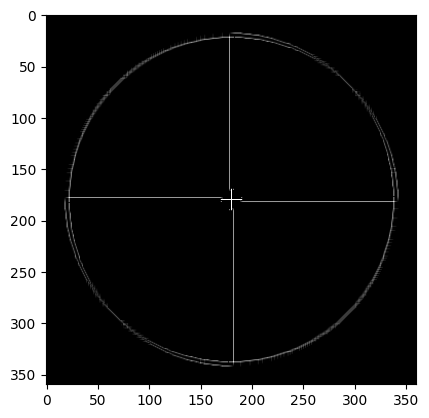

L O G edge mask


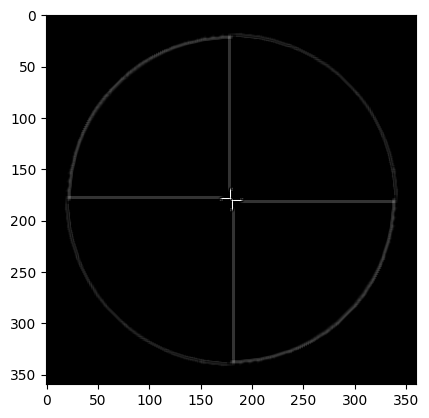

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


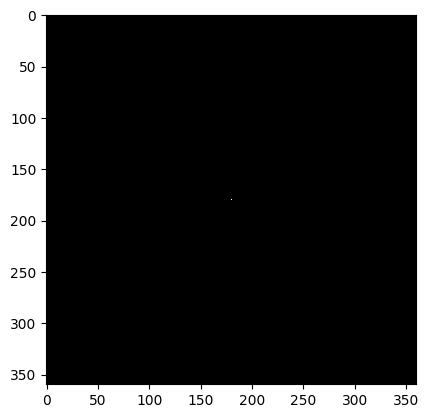

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


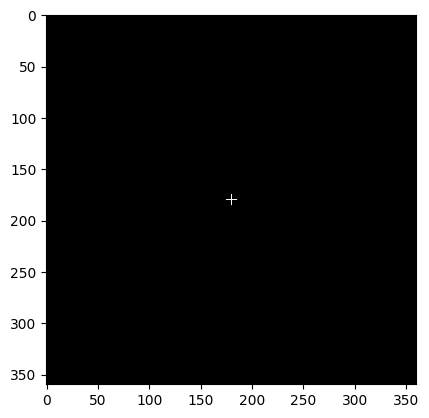

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


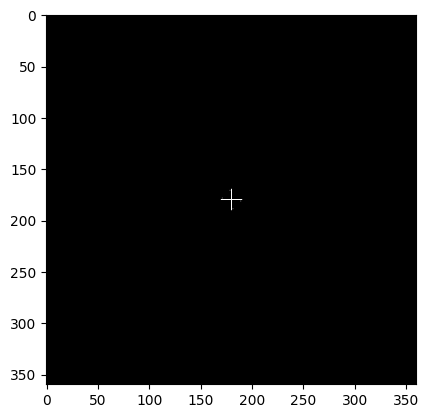

variance difference;  -3.8657076836015065
15   32
Currently checking region with radius :  15


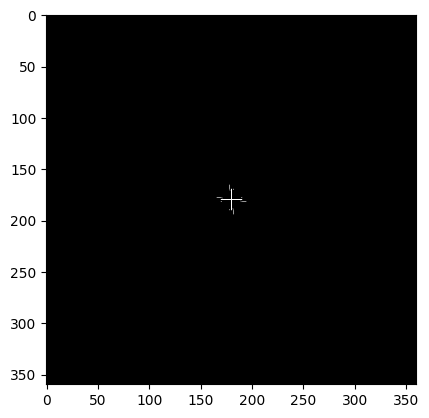

BLUR DETECTED AT RADIUS :  15
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  10
Differnece in variance :  2.2336252825050487
Region with focal radius : 20




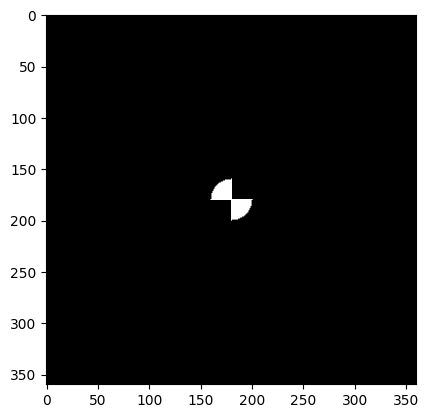

Test image with radius  20  being sharp with rest as blurred


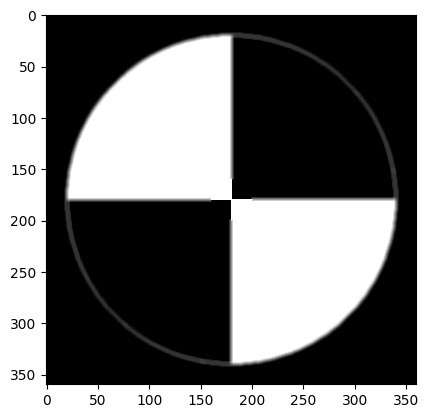

difference in test image and filtered non blurred region (in circular fasion)


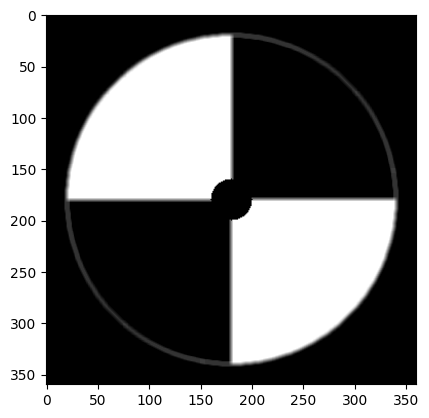

Visualization of separation of non blurred and blurred parts (radius = fr)


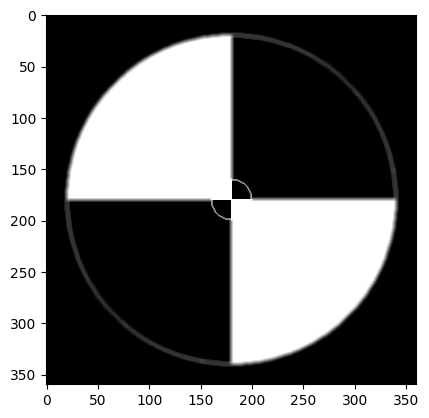

Laplacian Edge Mask


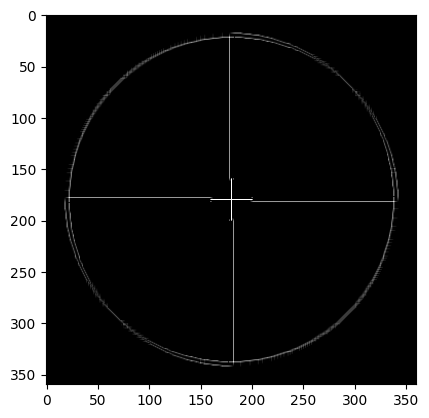

L O G edge mask


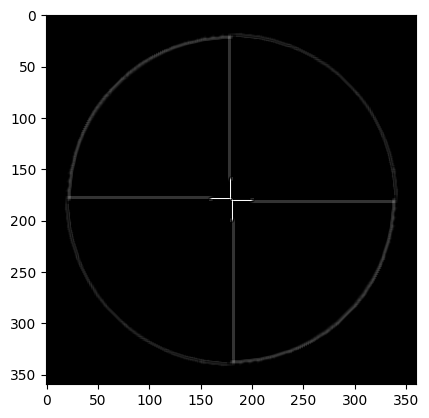

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


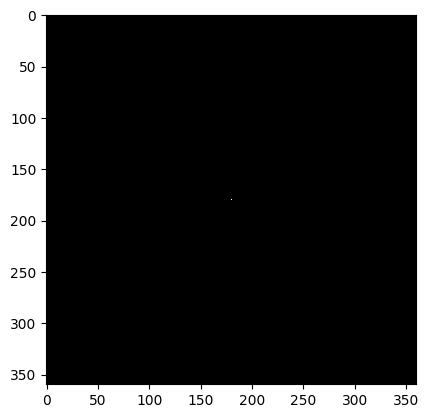

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


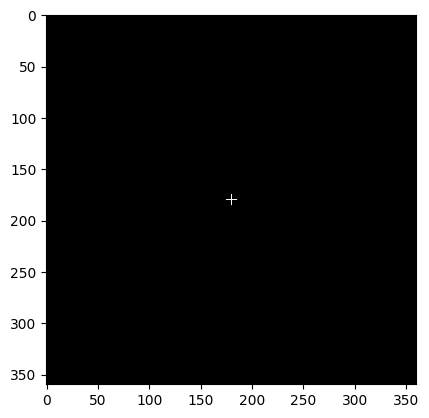

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


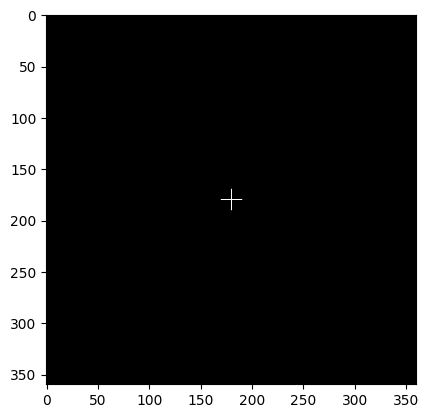

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


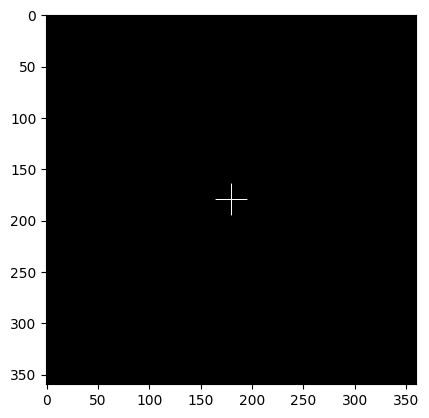

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


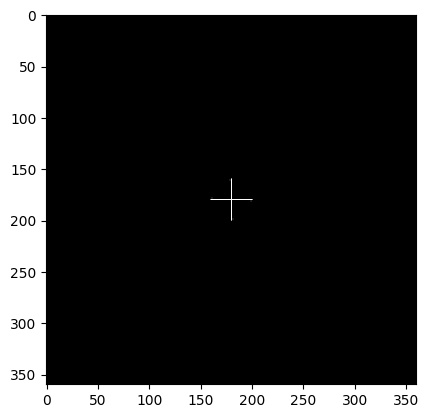

variance difference;  -3.86337693657358
25   32
Currently checking region with radius :  25


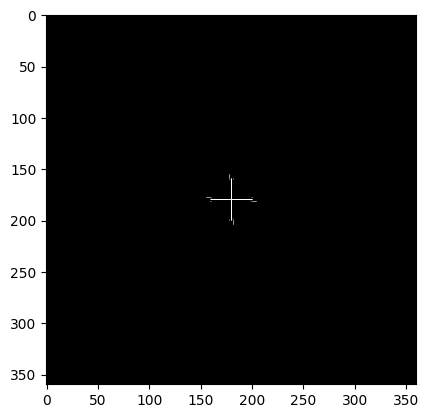

BLUR DETECTED AT RADIUS :  25
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  20
Differnece in variance :  2.2339738621803633
Region with focal radius : 30




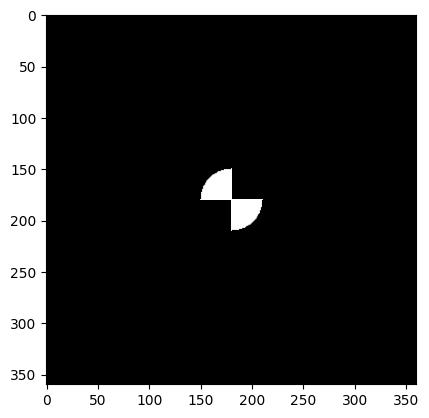

Test image with radius  30  being sharp with rest as blurred


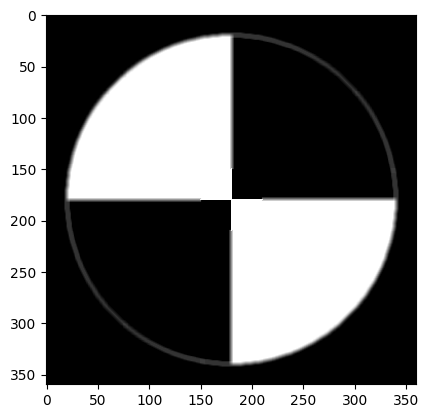

difference in test image and filtered non blurred region (in circular fasion)


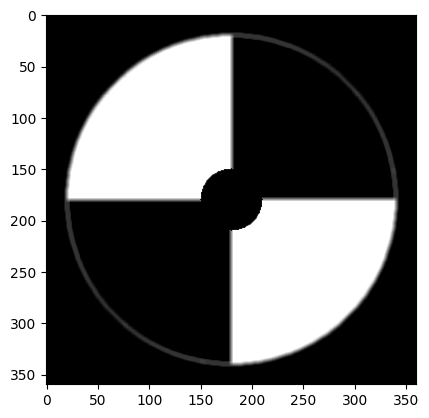

Visualization of separation of non blurred and blurred parts (radius = fr)


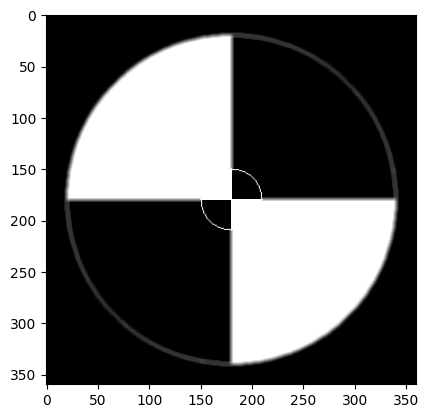

Laplacian Edge Mask


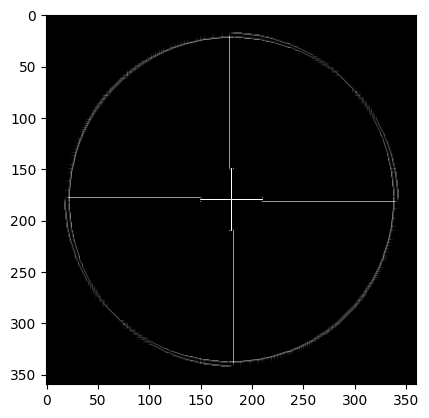

L O G edge mask


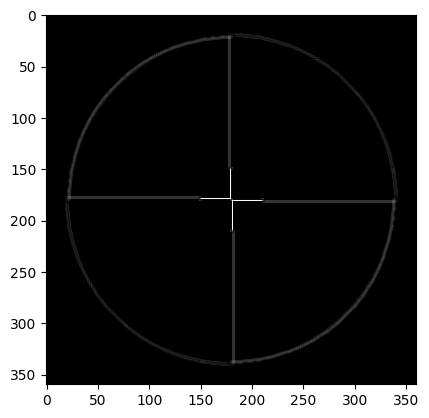

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


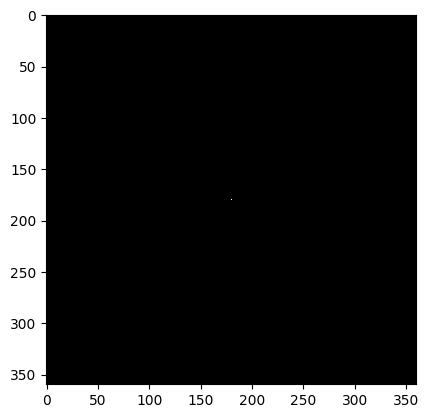

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


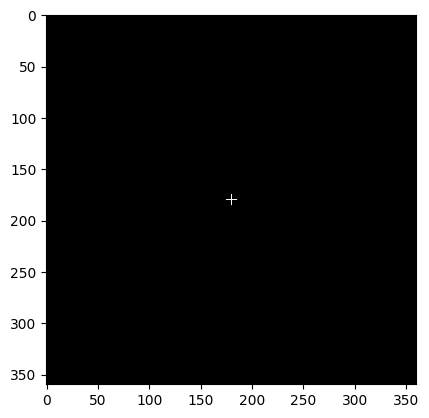

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


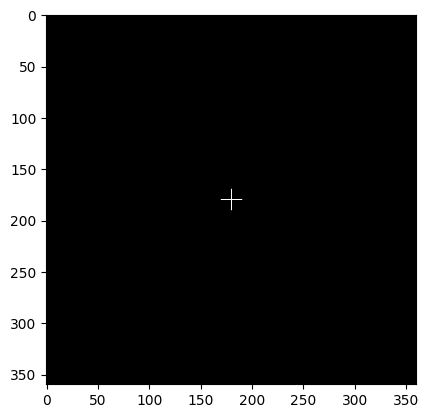

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


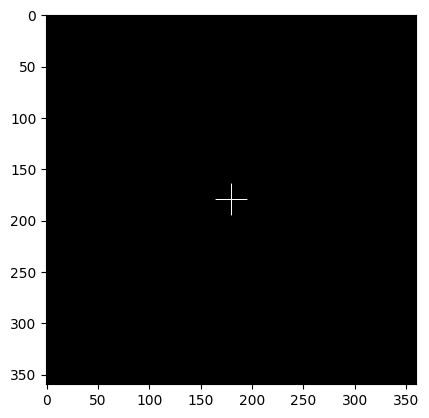

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


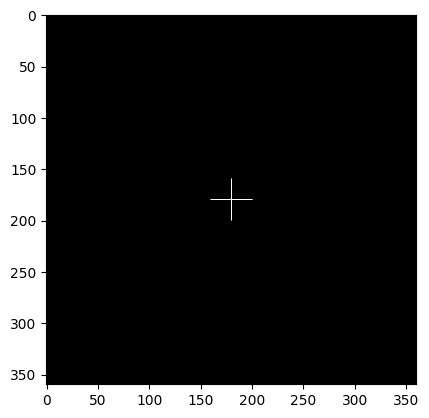

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


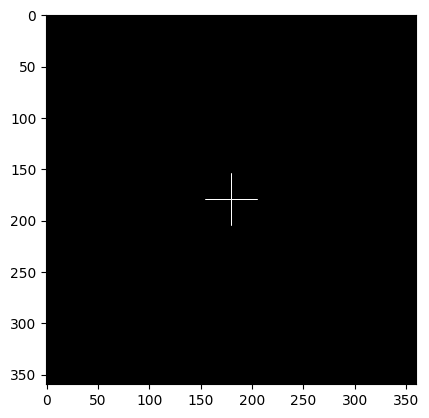

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


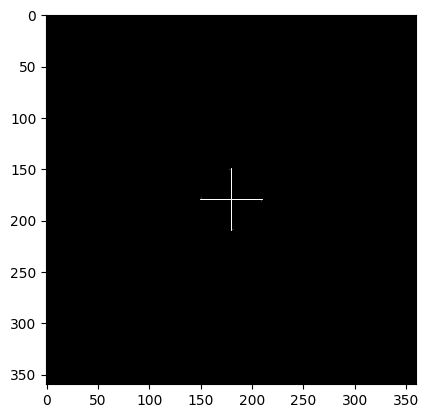

variance difference;  -3.8610461895457178
35   32
Currently checking region with radius :  35


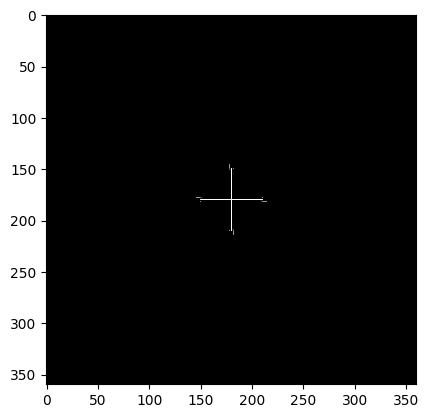

BLUR DETECTED AT RADIUS :  35
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  30
Differnece in variance :  2.2343224418557526
Region with focal radius : 50




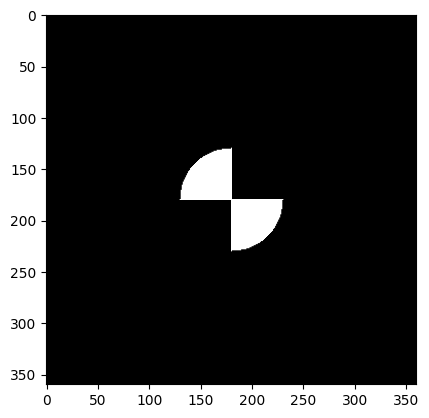

Test image with radius  50  being sharp with rest as blurred


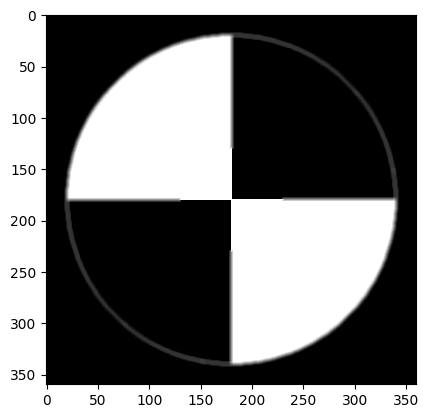

difference in test image and filtered non blurred region (in circular fasion)


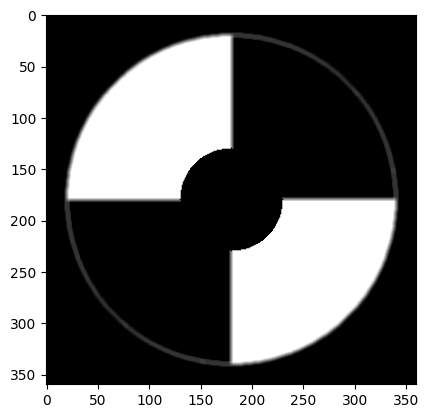

Visualization of separation of non blurred and blurred parts (radius = fr)


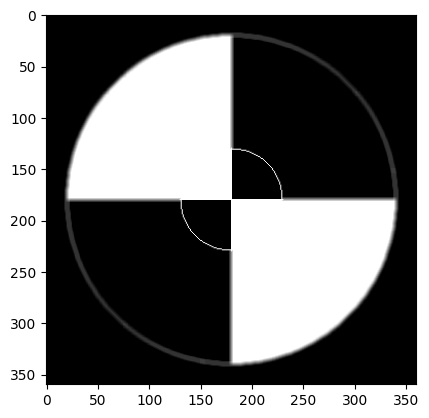

Laplacian Edge Mask


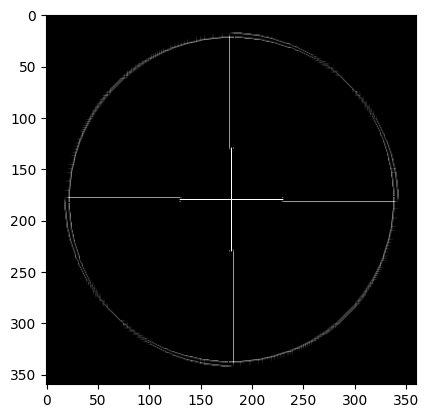

L O G edge mask


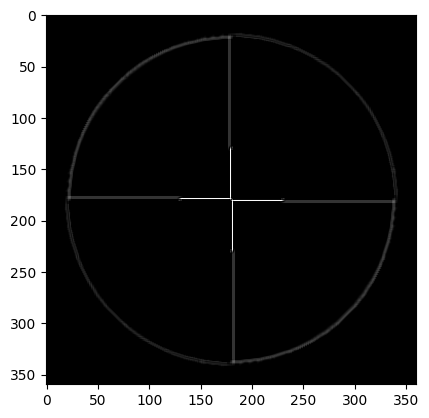

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


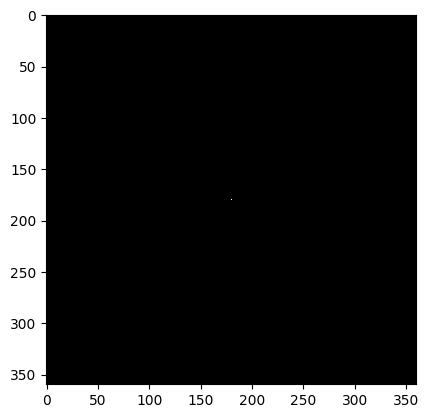

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


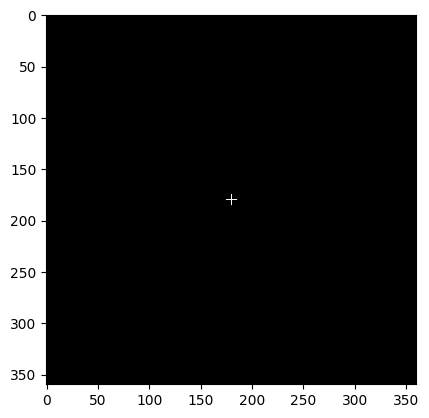

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


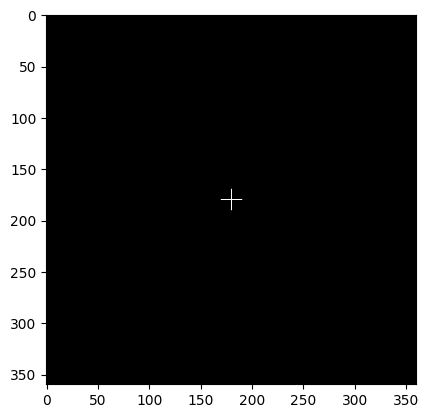

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


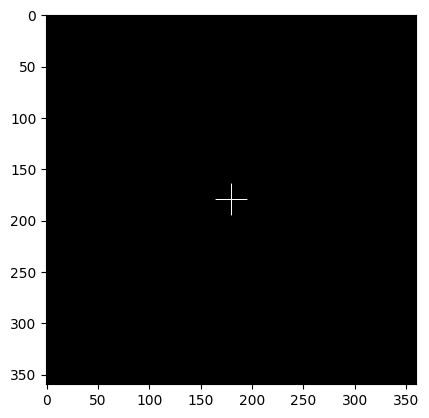

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


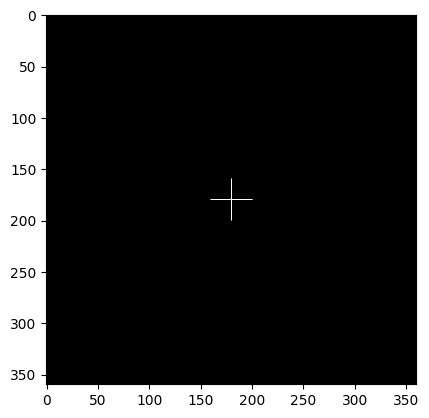

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


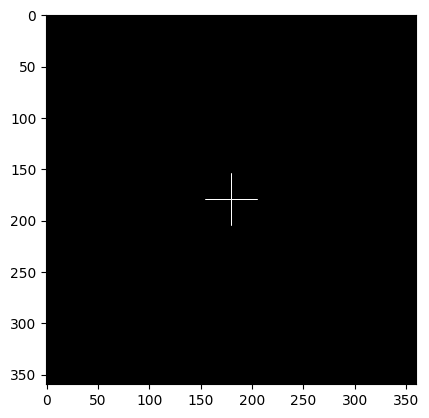

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


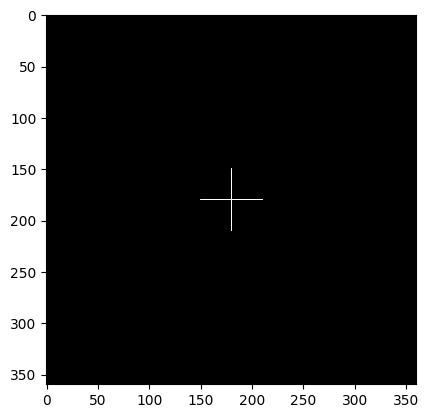

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


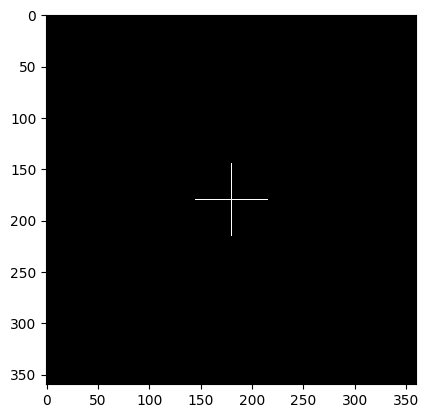

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


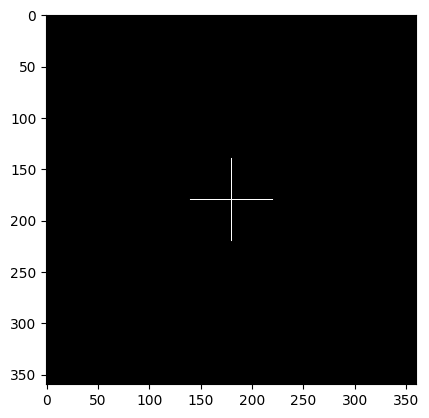

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


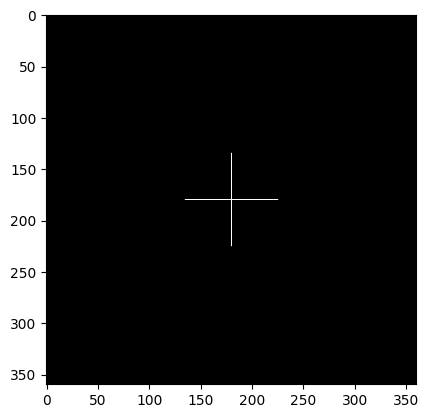

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


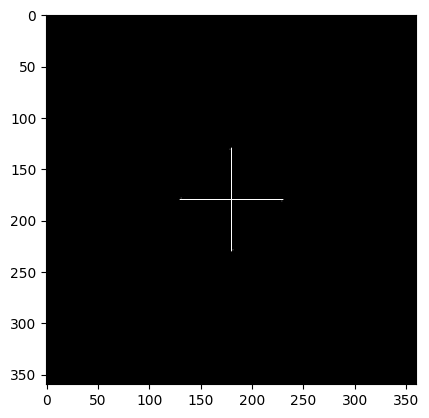

variance difference;  -3.8563846954899503
55   32
Currently checking region with radius :  55


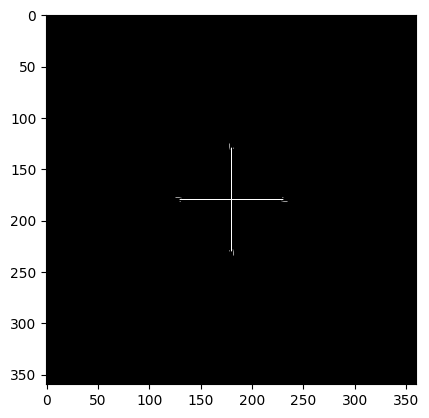

BLUR DETECTED AT RADIUS :  55
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  50
Differnece in variance :  2.235019601206446
Region with focal radius : 70




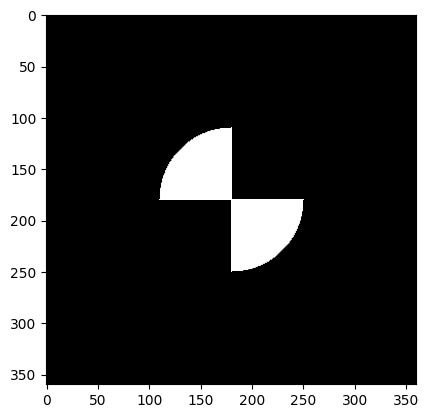

Test image with radius  70  being sharp with rest as blurred


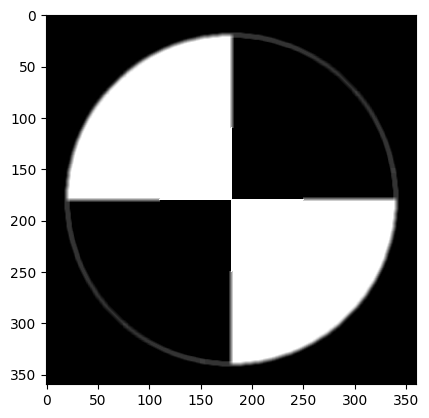

difference in test image and filtered non blurred region (in circular fasion)


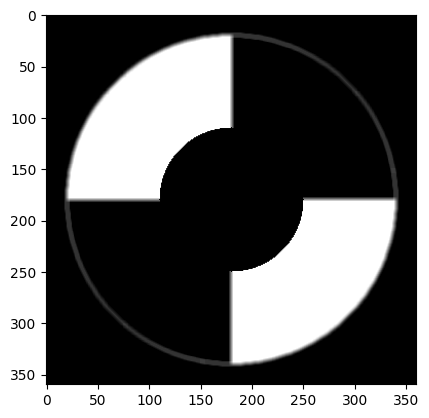

Visualization of separation of non blurred and blurred parts (radius = fr)


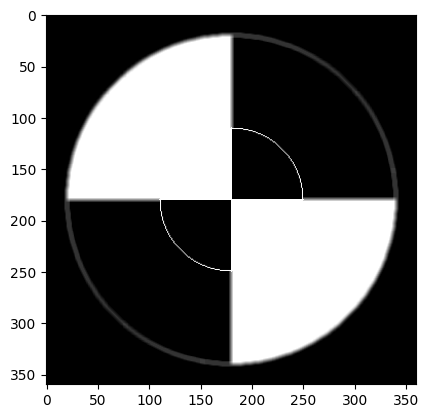

Laplacian Edge Mask


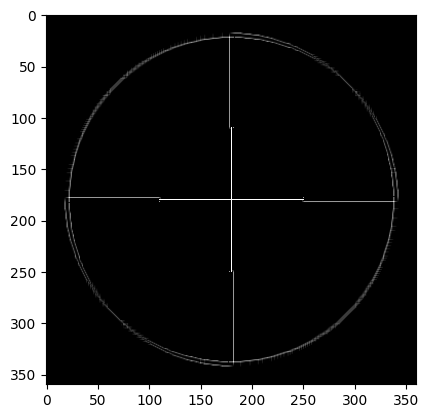

L O G edge mask


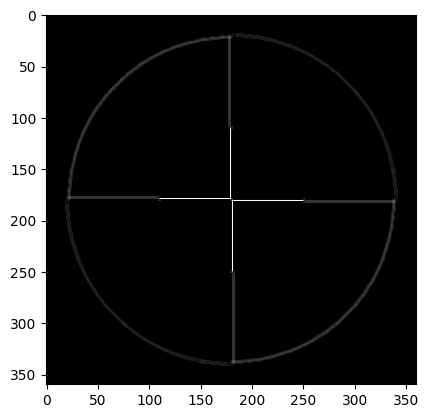

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


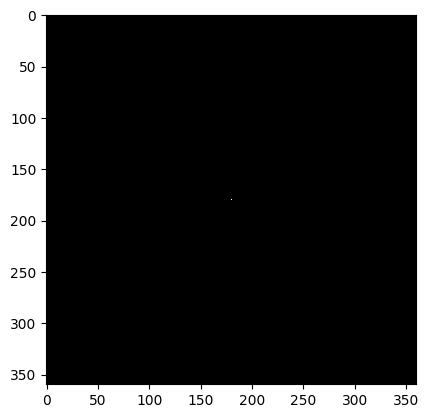

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


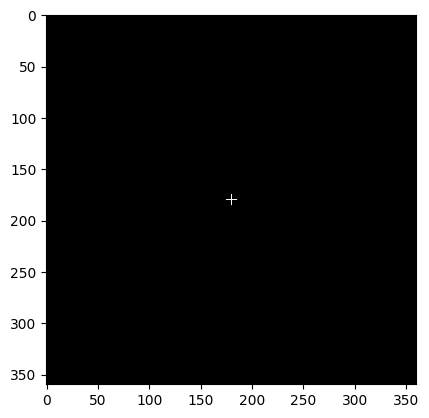

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


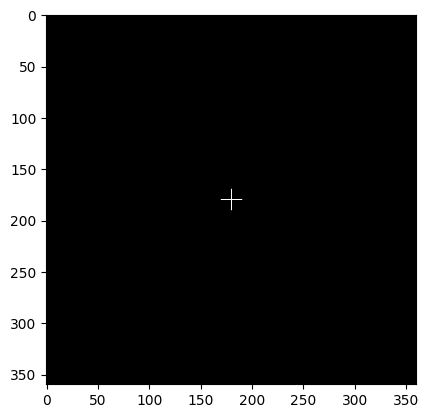

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


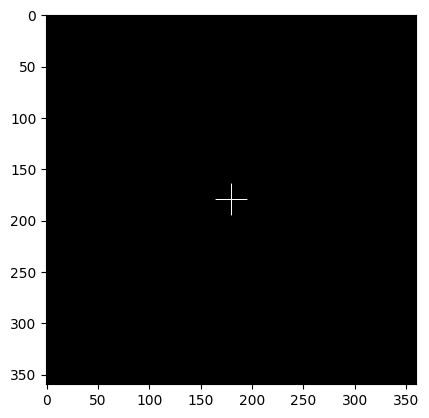

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


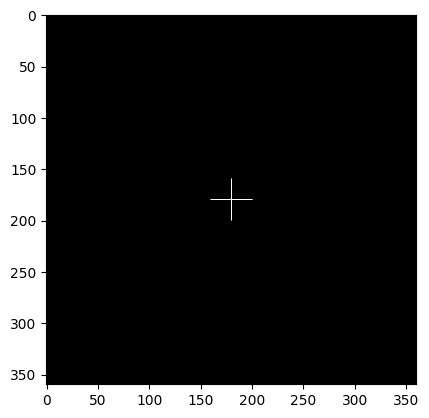

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


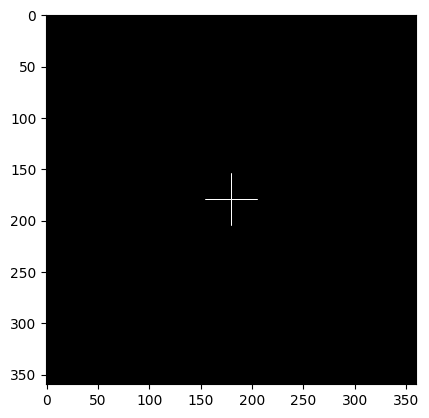

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


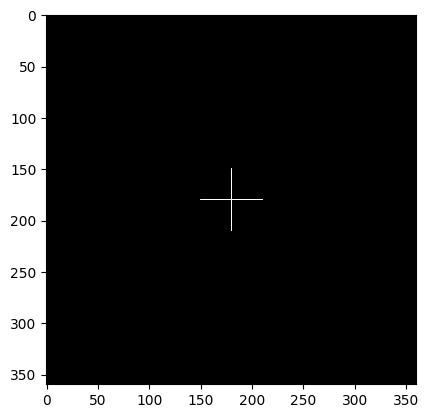

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


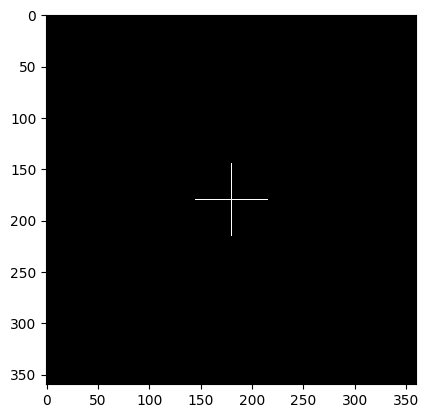

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


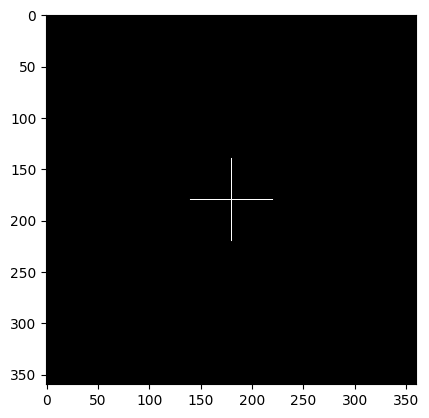

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


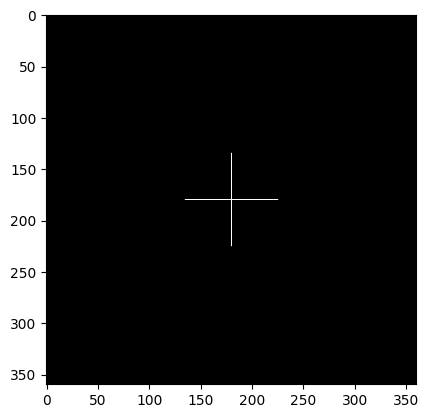

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


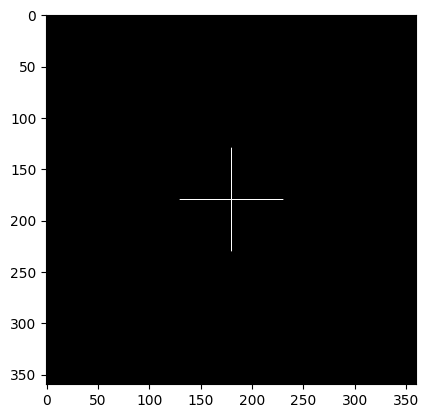

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


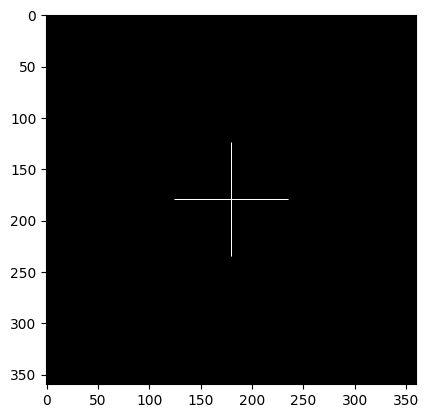

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


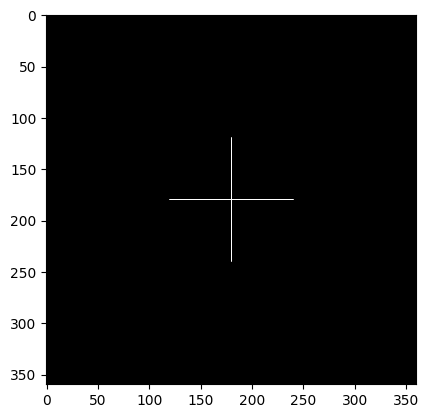

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


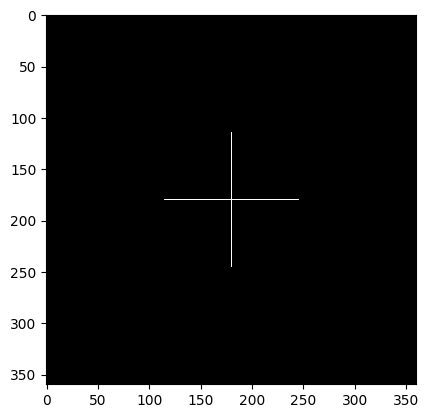

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


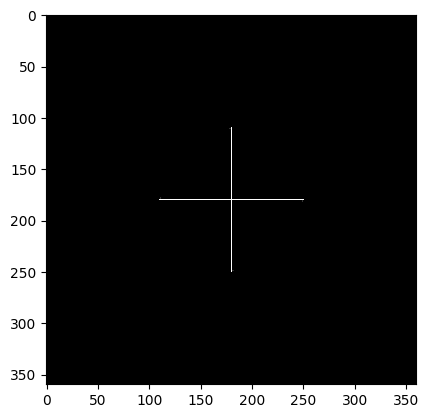

variance difference;  -3.8517232014341403
75   32
Currently checking region with radius :  75


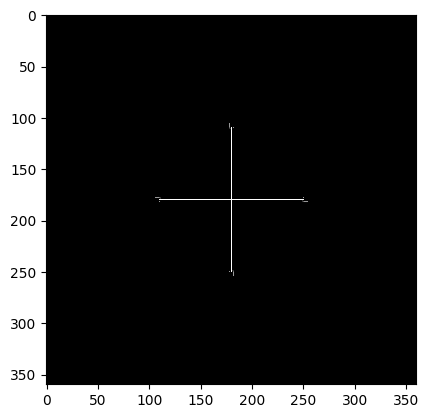

BLUR DETECTED AT RADIUS :  75
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  70
Differnece in variance :  2.2357167605571817
Region with focal radius : 90




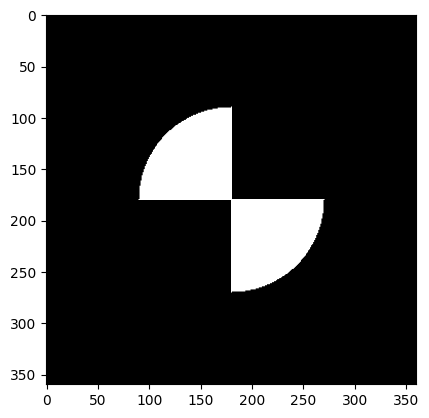

Test image with radius  90  being sharp with rest as blurred


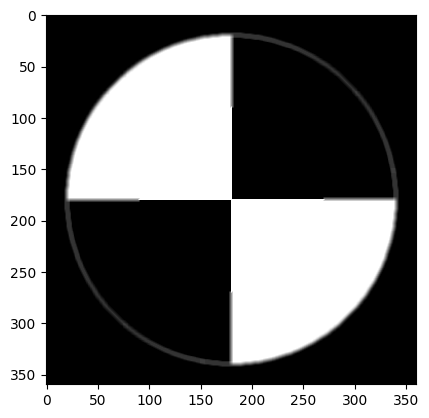

difference in test image and filtered non blurred region (in circular fasion)


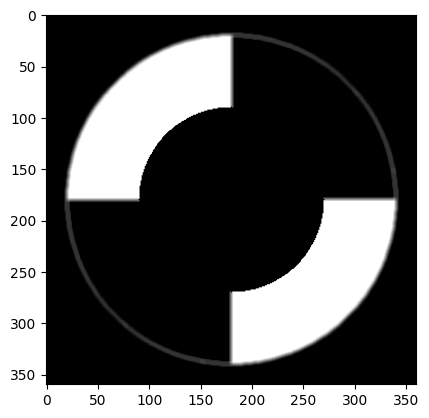

Visualization of separation of non blurred and blurred parts (radius = fr)


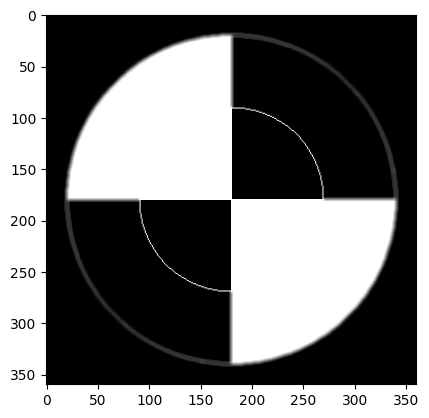

Laplacian Edge Mask


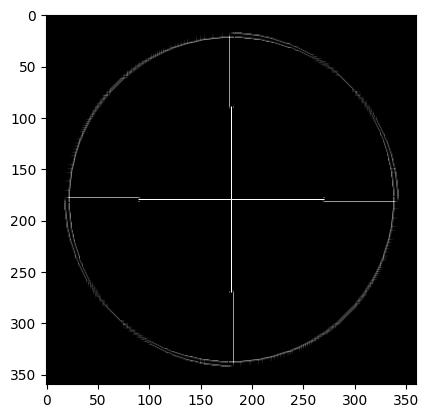

L O G edge mask


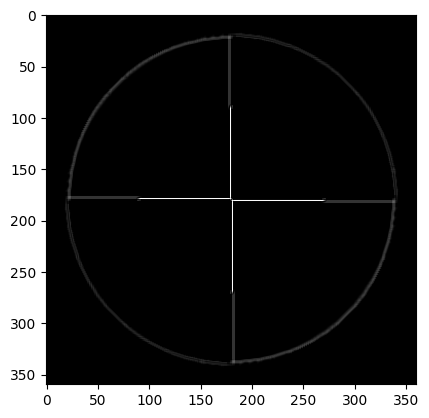

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


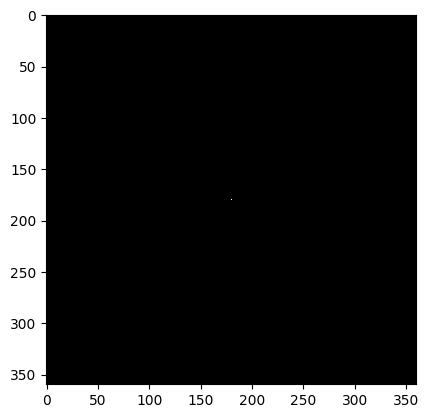

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


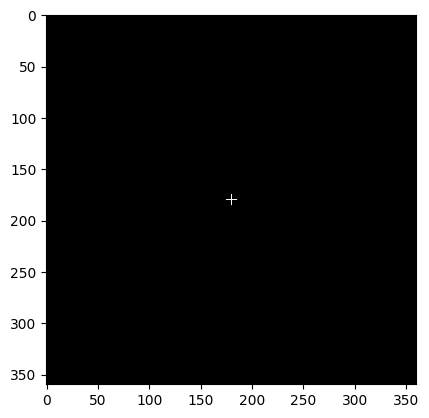

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


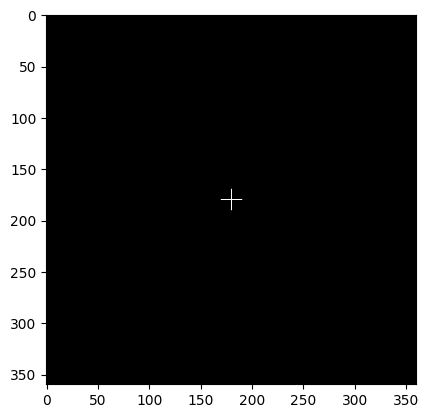

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


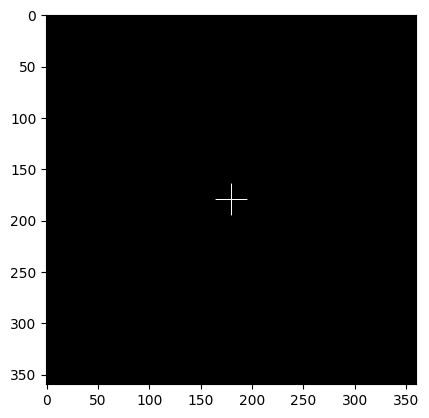

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


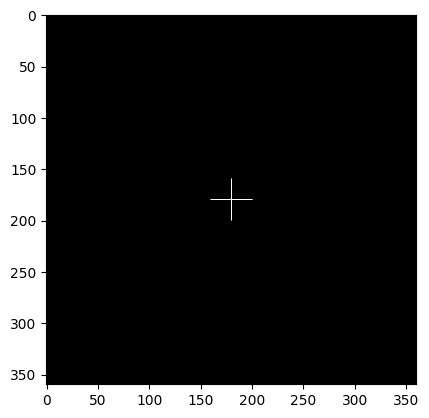

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


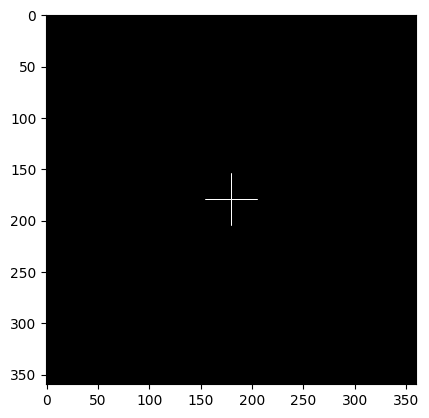

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


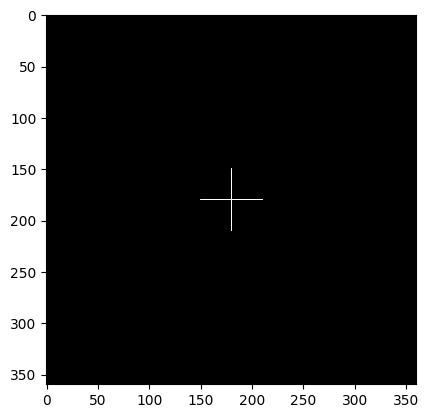

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


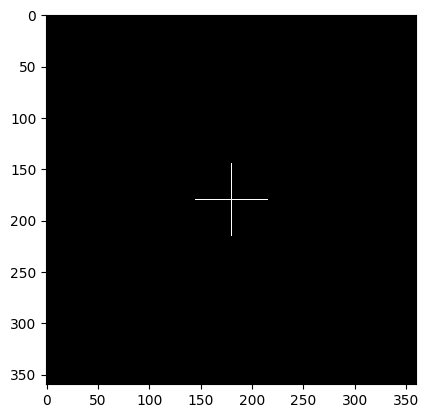

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


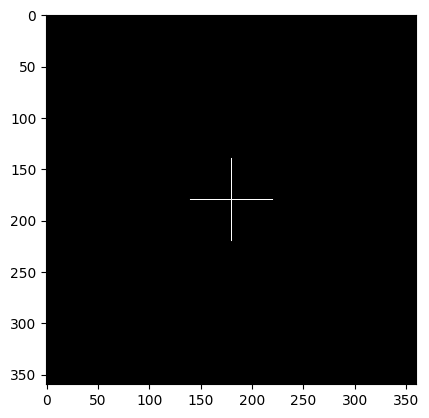

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


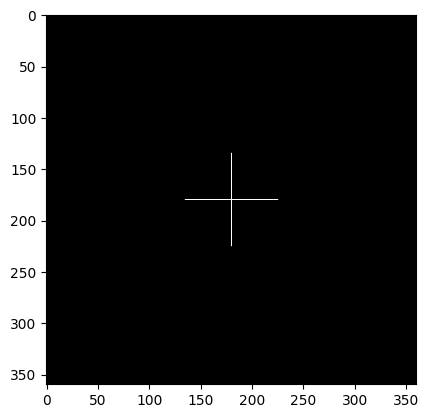

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


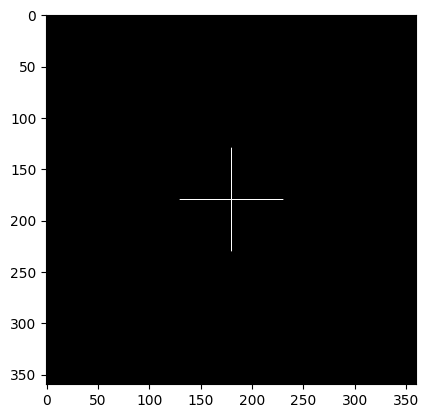

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


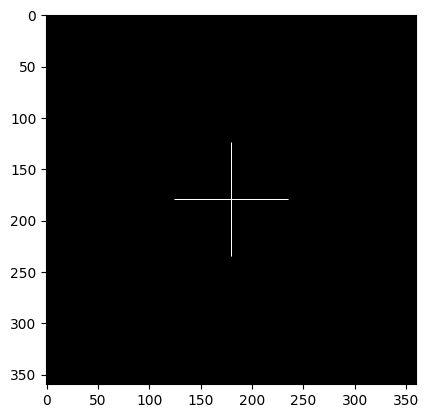

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


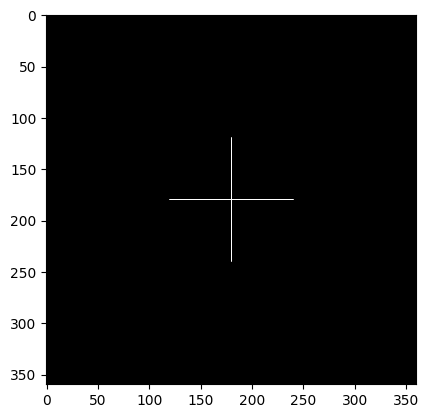

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


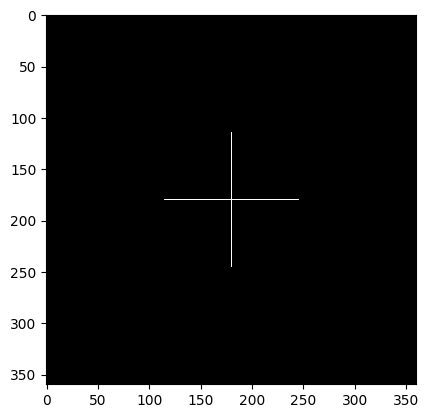

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


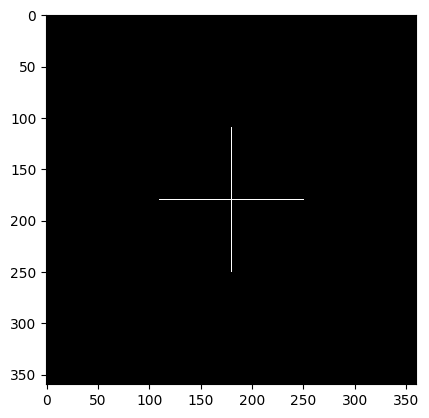

variance difference;  -3.694658738128254
75   32
Currently checking region with radius :  75


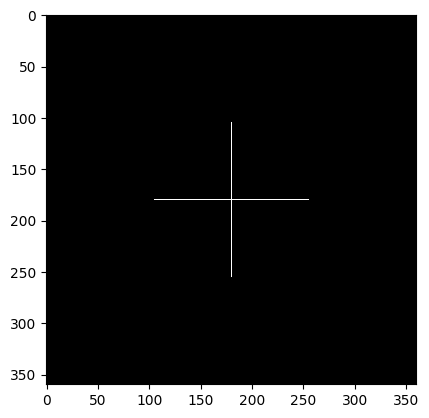

variance difference;  -3.6937411355333154
80   32
Currently checking region with radius :  80


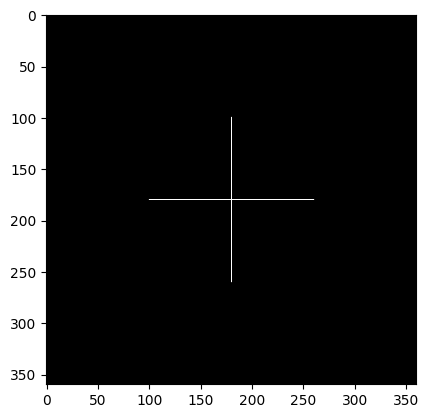

variance difference;  -3.692823532938462
85   32
Currently checking region with radius :  85


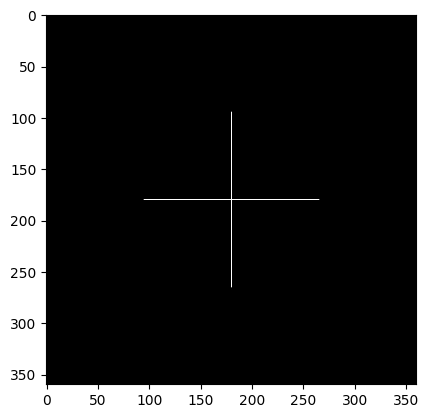

variance difference;  -3.691905930343495
90   32
Currently checking region with radius :  90


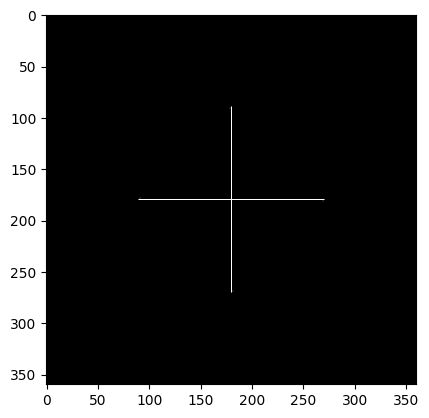

variance difference;  -3.8470617073784297
95   32
Currently checking region with radius :  95


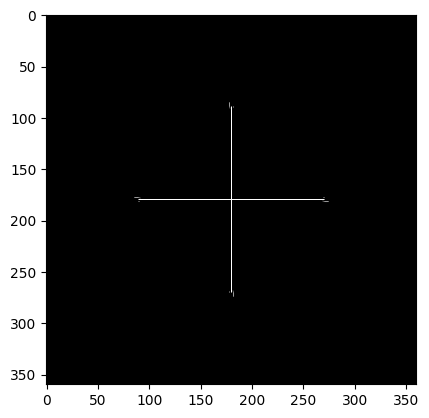

BLUR DETECTED AT RADIUS :  95
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  90
Differnece in variance :  2.2364139199078465
Region with focal radius : 100




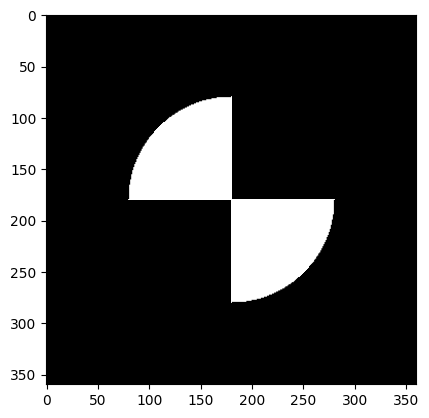

Test image with radius  100  being sharp with rest as blurred


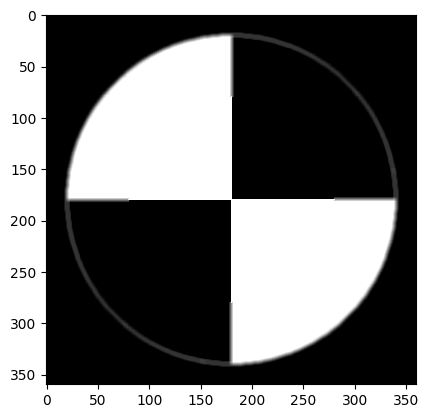

difference in test image and filtered non blurred region (in circular fasion)


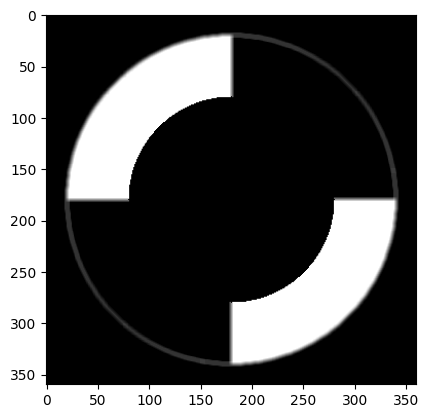

Visualization of separation of non blurred and blurred parts (radius = fr)


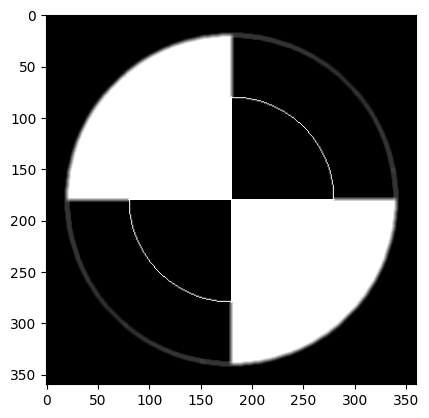

Laplacian Edge Mask


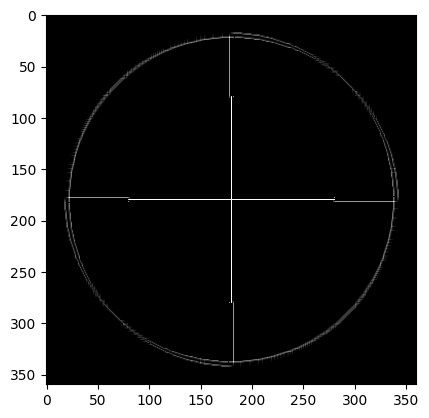

L O G edge mask


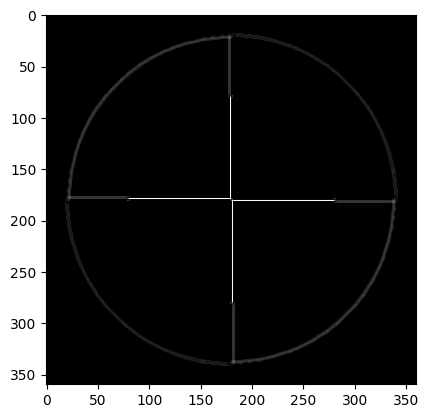

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


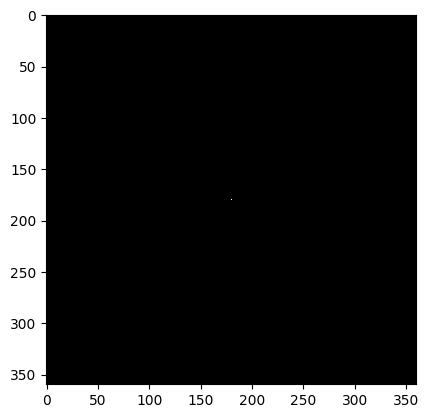

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


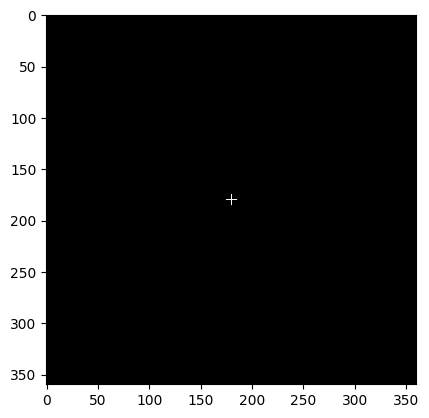

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


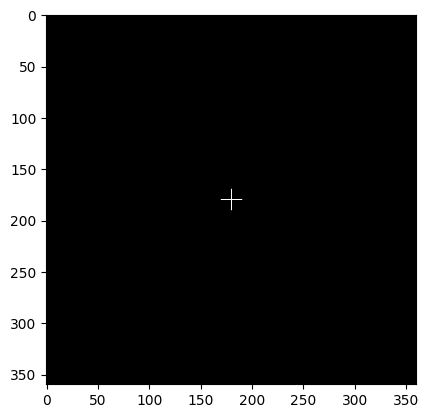

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


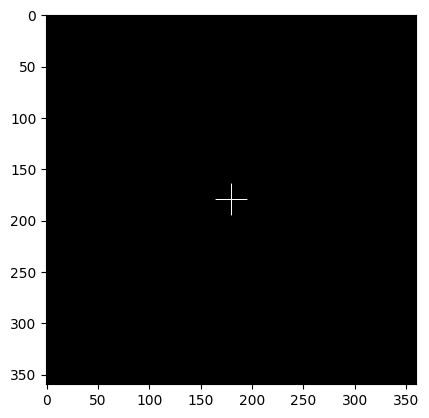

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


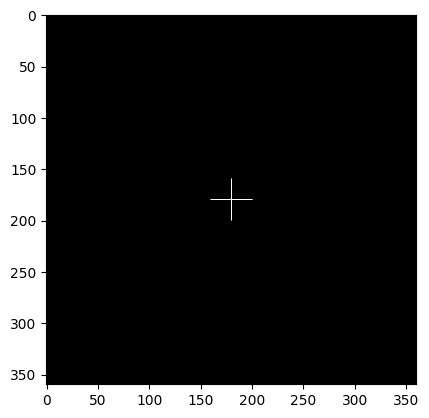

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


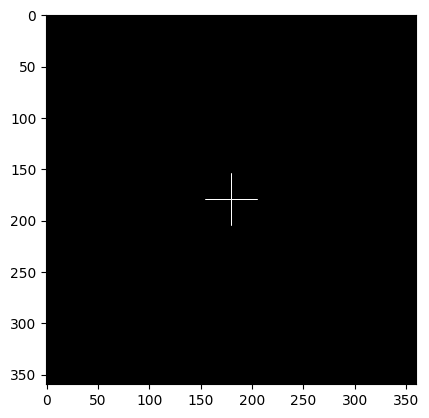

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


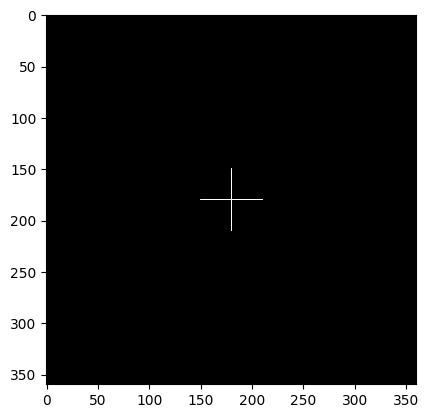

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


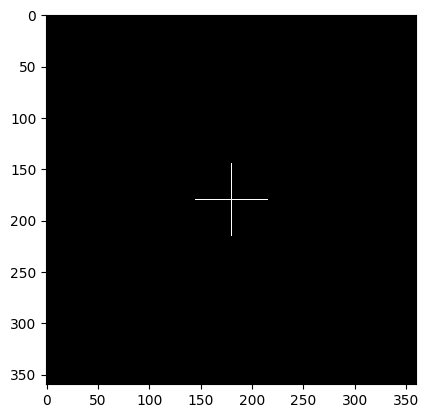

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


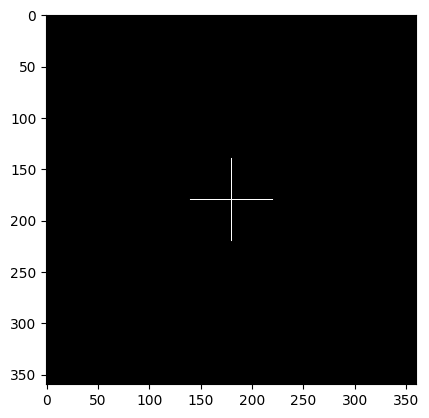

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


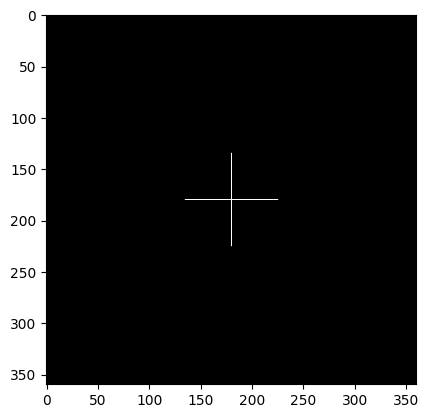

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


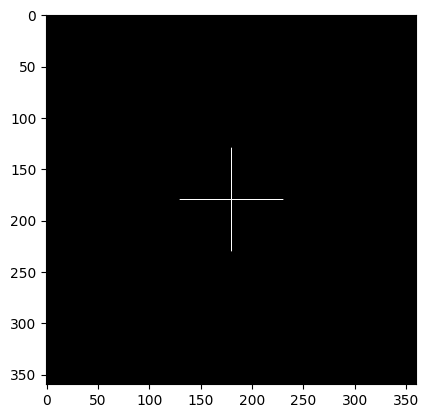

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


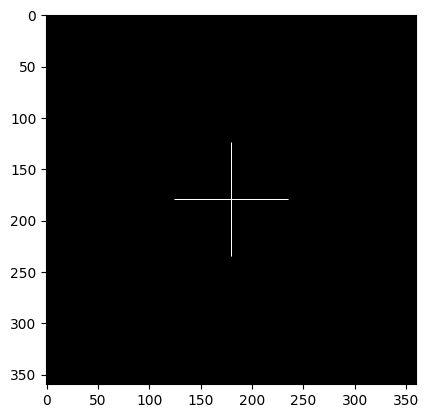

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


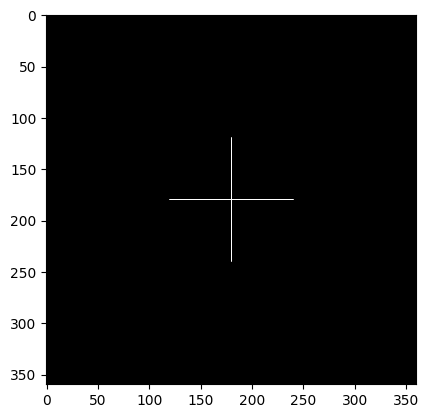

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


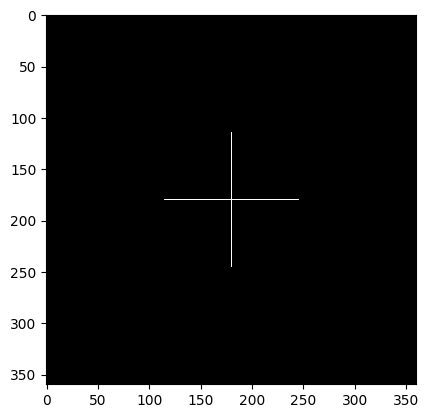

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


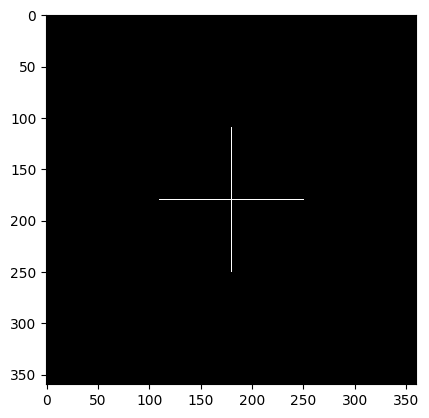

variance difference;  -3.694658738128254
75   32
Currently checking region with radius :  75


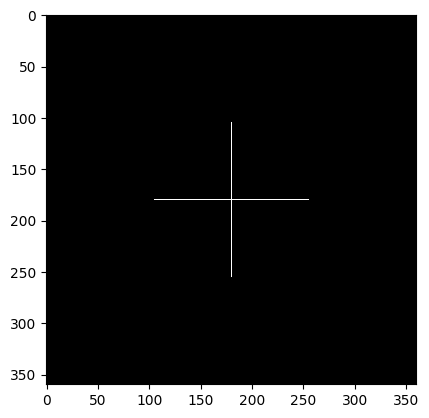

variance difference;  -3.6937411355333154
80   32
Currently checking region with radius :  80


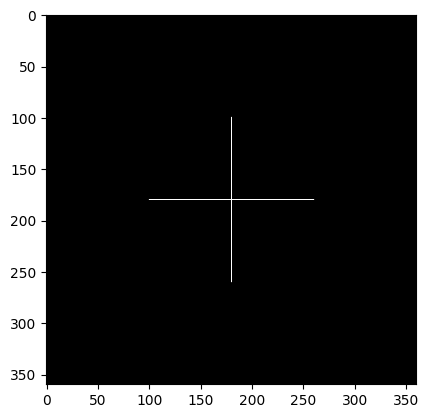

variance difference;  -3.692823532938462
85   32
Currently checking region with radius :  85


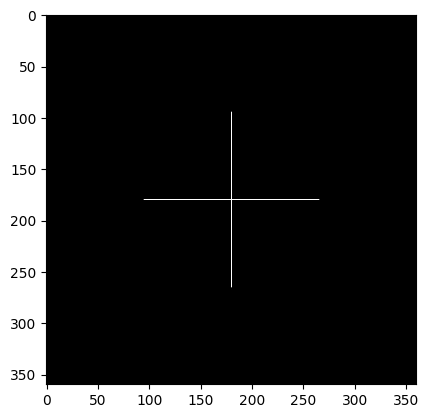

variance difference;  -3.691905930343495
90   32
Currently checking region with radius :  90


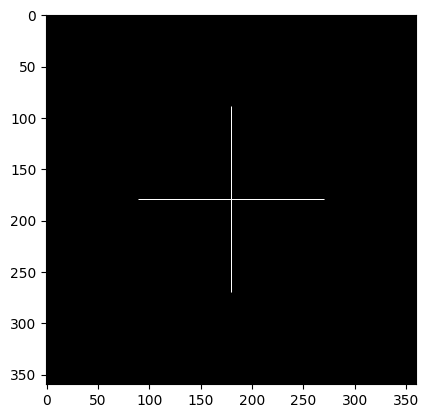

variance difference;  -3.6909883277487836
95   32
Currently checking region with radius :  95


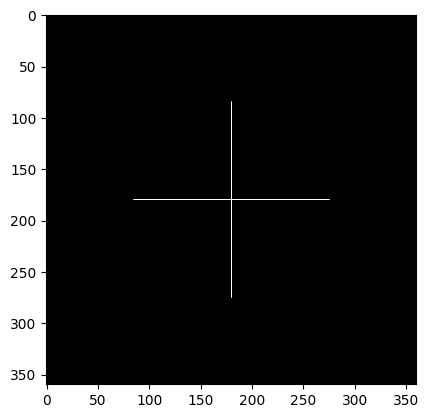

variance difference;  -3.6900707251539018
100   32
Currently checking region with radius :  100


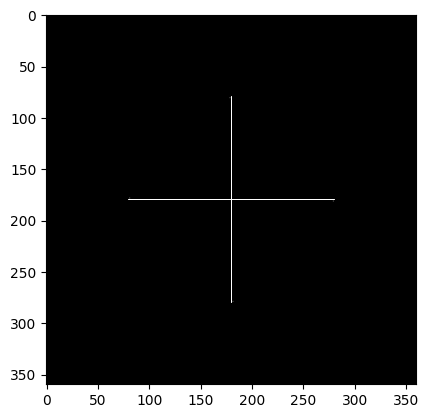

variance difference;  -3.844730960350546
105   32
Currently checking region with radius :  105


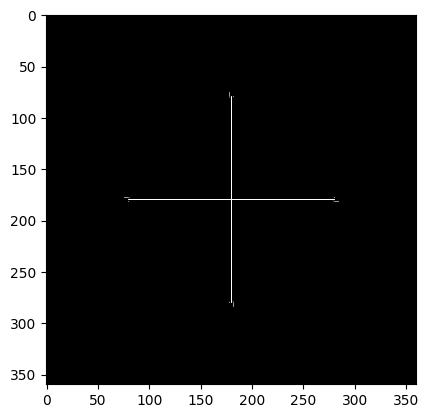

BLUR DETECTED AT RADIUS :  105
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  100
Differnece in variance :  2.236762499583193
------------------------------------------------------












blurred image with box blur kernel :  15  x  15


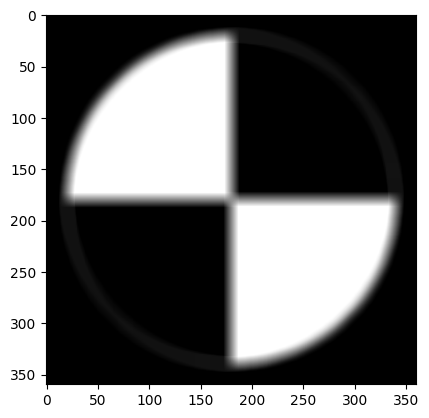

Region with focal radius : 10




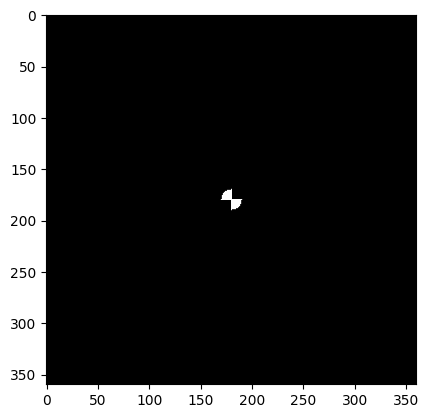

Test image with radius  10  being sharp with rest as blurred


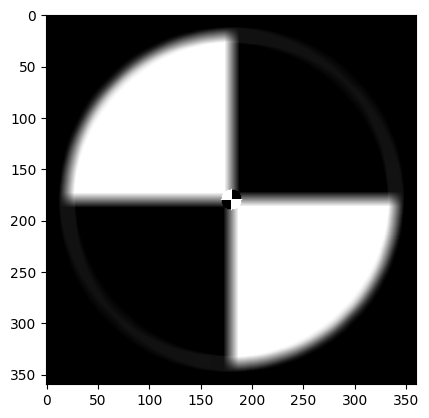

difference in test image and filtered non blurred region (in circular fasion)


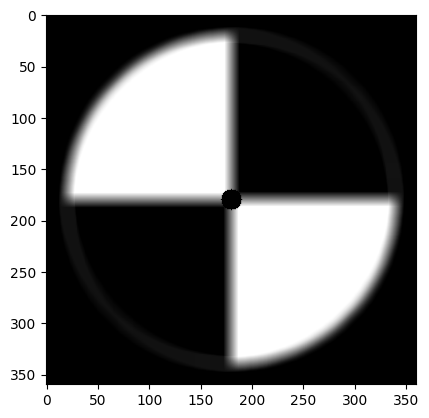

Visualization of separation of non blurred and blurred parts (radius = fr)


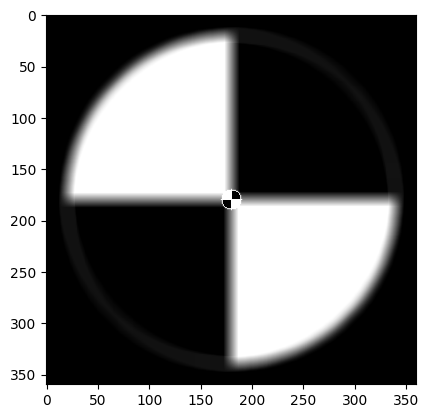

Laplacian Edge Mask


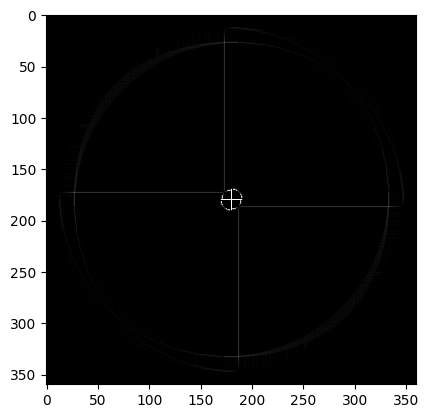

L O G edge mask


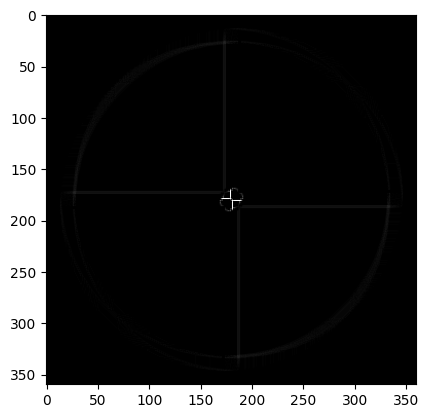

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


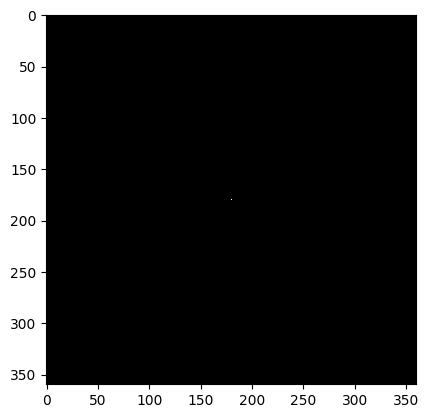

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


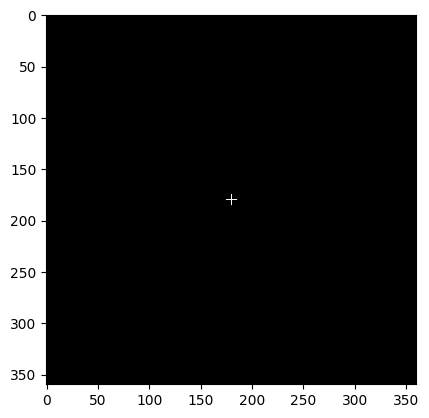

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


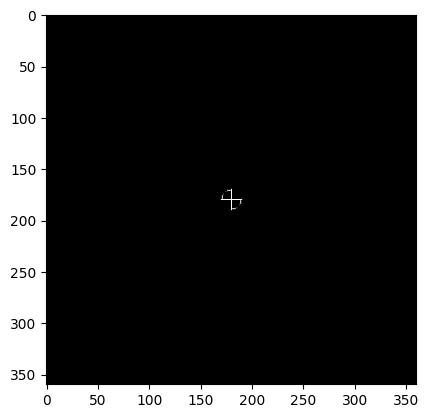

variance difference;  -9.34615388130382
15   32
Currently checking region with radius :  15


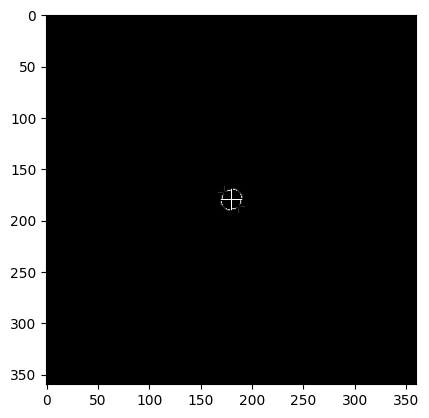

variance difference;  -6.460687376578942
20   32
Currently checking region with radius :  20


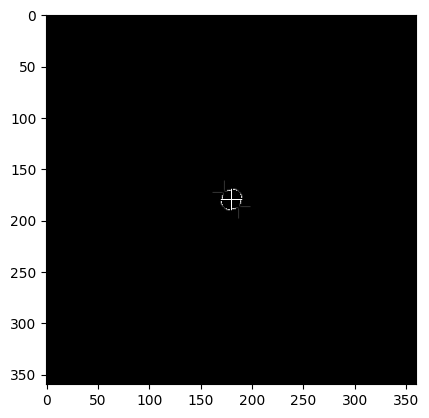

BLUR DETECTED AT RADIUS :  20
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  10
Differnece in variance :  3.165048498764044
Region with focal radius : 20




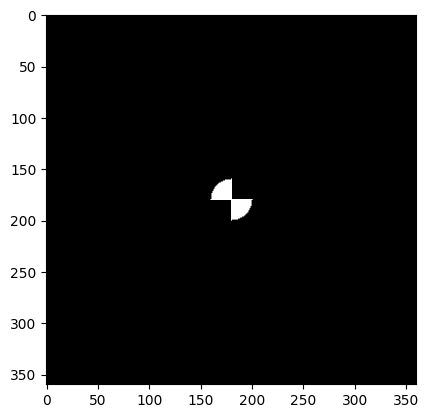

Test image with radius  20  being sharp with rest as blurred


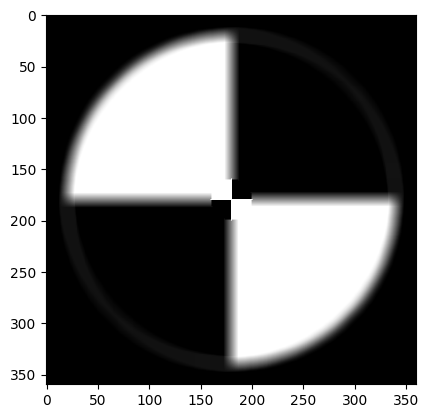

difference in test image and filtered non blurred region (in circular fasion)


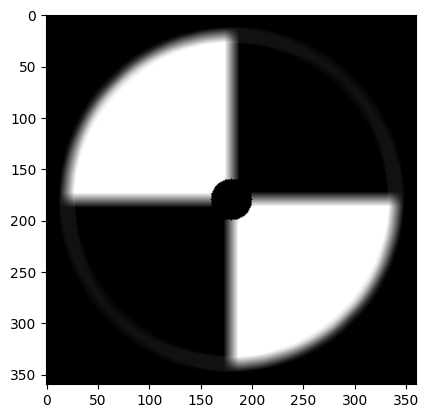

Visualization of separation of non blurred and blurred parts (radius = fr)


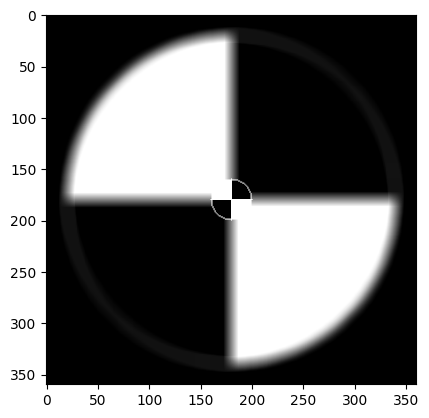

Laplacian Edge Mask


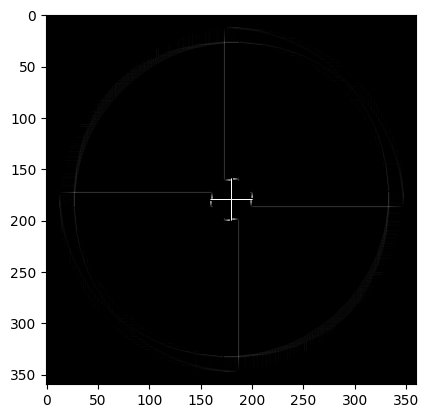

L O G edge mask


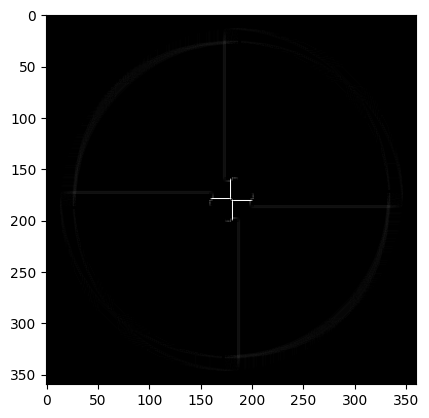

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


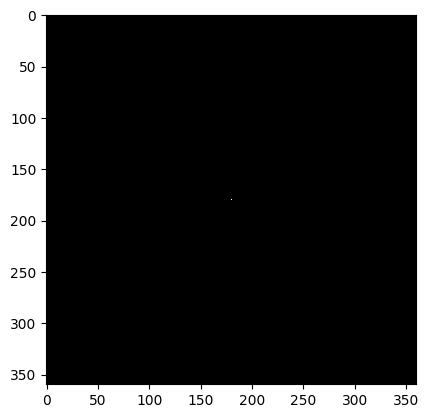

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


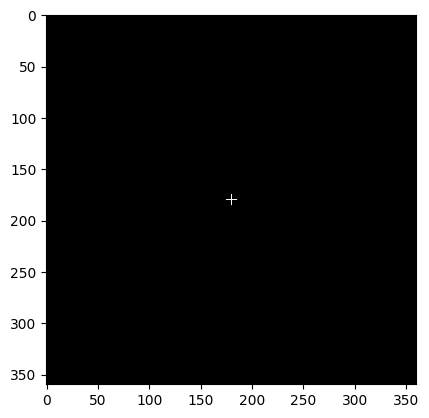

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


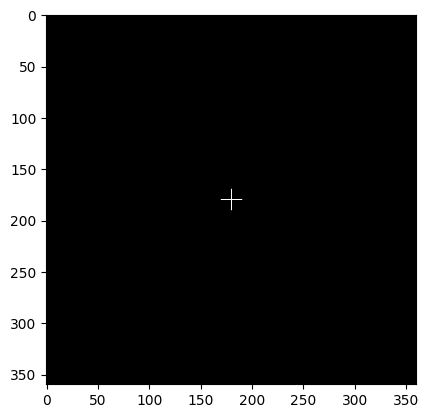

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


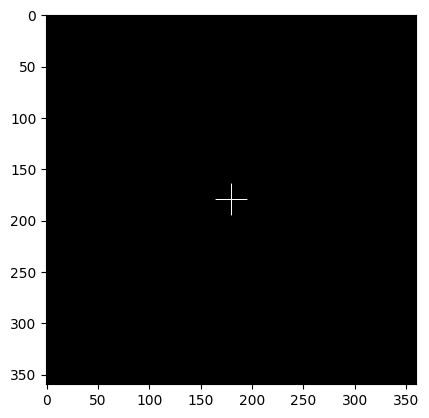

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


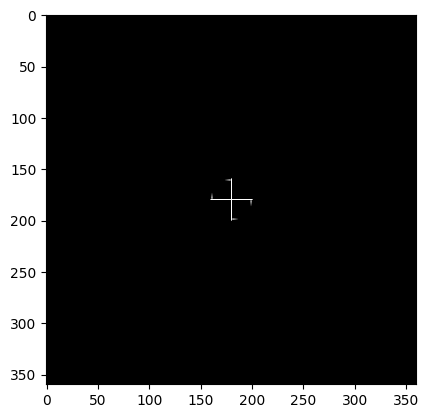

variance difference;  -9.188173580568389
25   32
Currently checking region with radius :  25


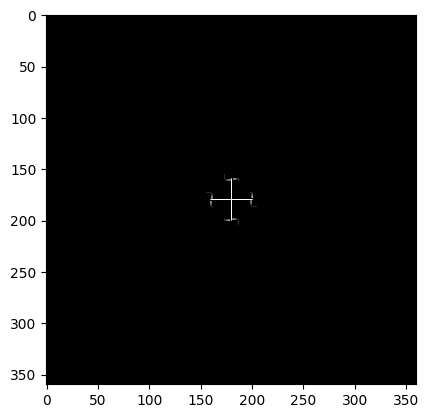

variance difference;  -6.017710503293642
30   32
Currently checking region with radius :  30


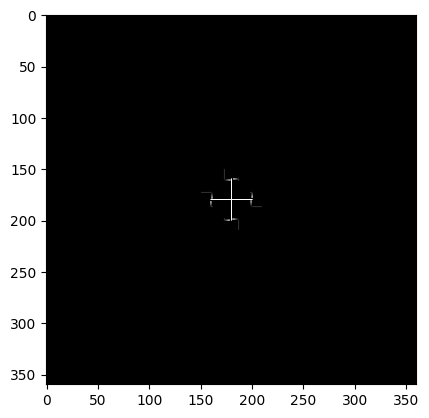

BLUR DETECTED AT RADIUS :  30
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  20
Differnece in variance :  3.603028658514795
Region with focal radius : 30




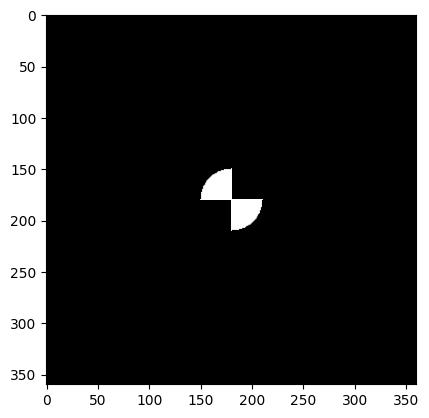

Test image with radius  30  being sharp with rest as blurred


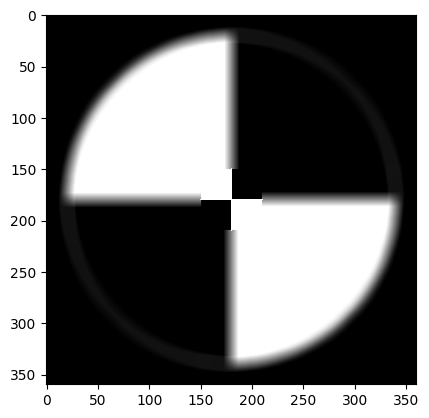

difference in test image and filtered non blurred region (in circular fasion)


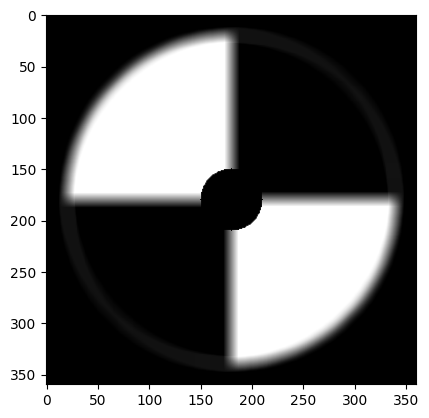

Visualization of separation of non blurred and blurred parts (radius = fr)


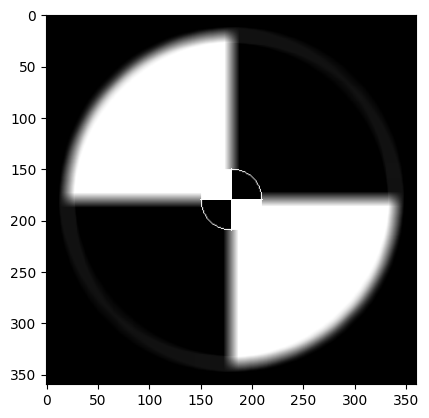

Laplacian Edge Mask


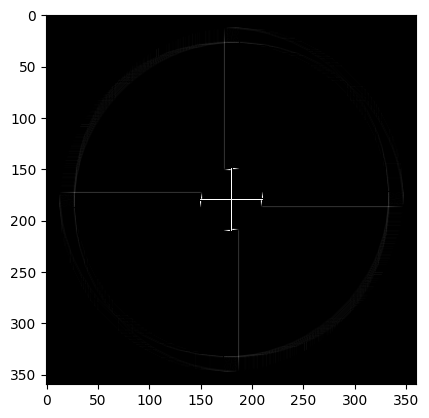

L O G edge mask


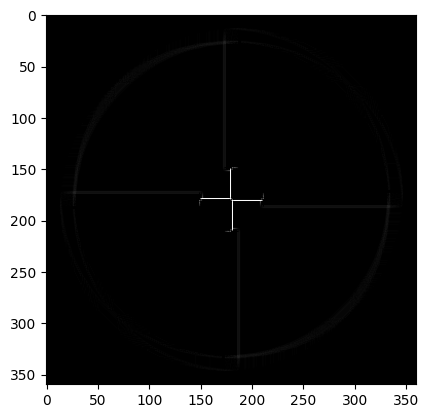

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


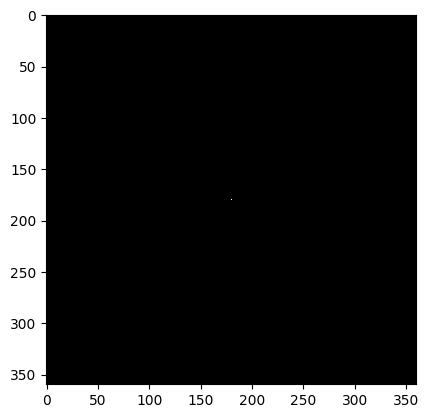

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


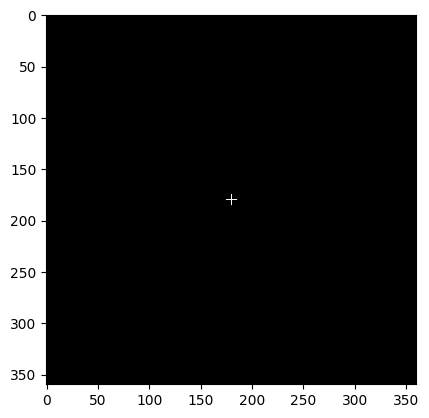

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


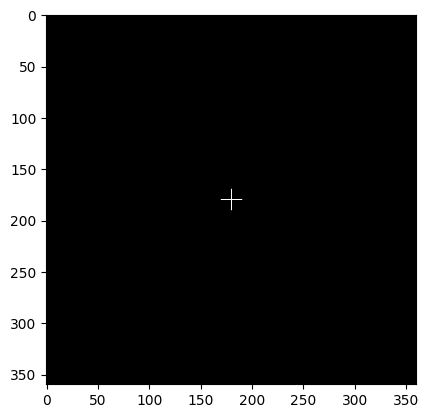

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


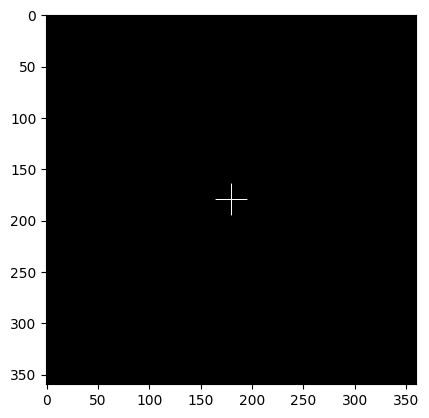

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


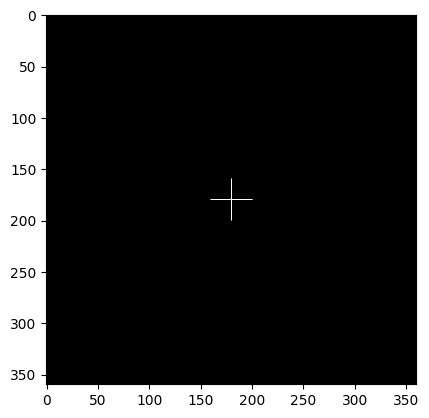

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


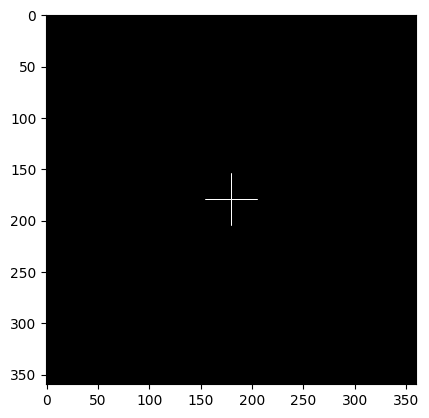

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


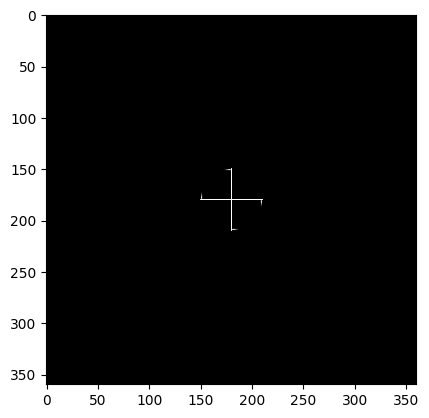

variance difference;  -9.19035212661705
35   32
Currently checking region with radius :  35


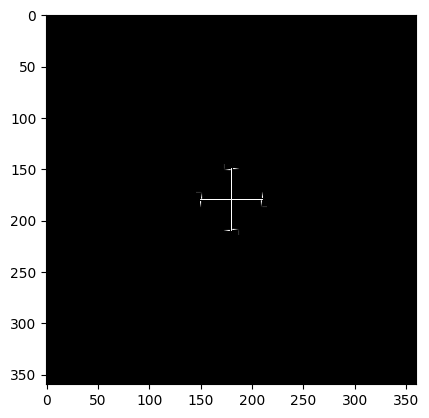

variance difference;  -5.93169306359313
40   32
Currently checking region with radius :  40


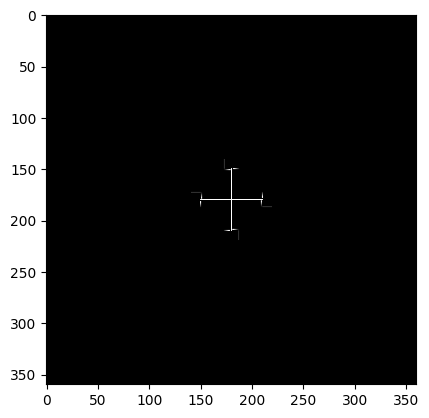

BLUR DETECTED AT RADIUS :  40
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  30
Differnece in variance :  3.6840659027420486
Region with focal radius : 50




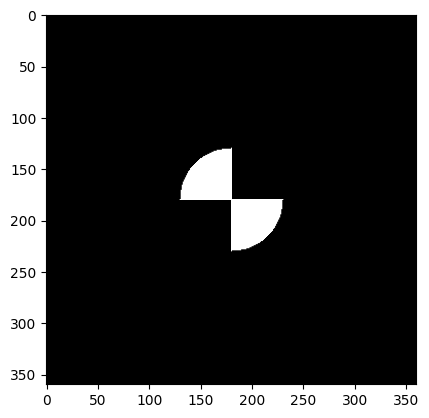

Test image with radius  50  being sharp with rest as blurred


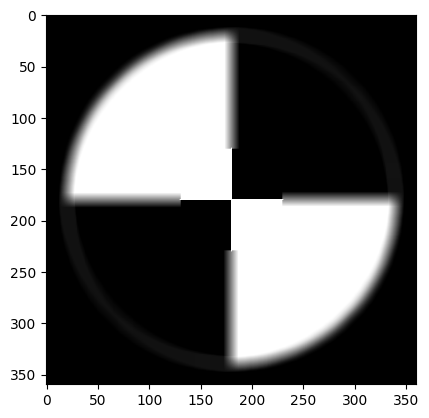

difference in test image and filtered non blurred region (in circular fasion)


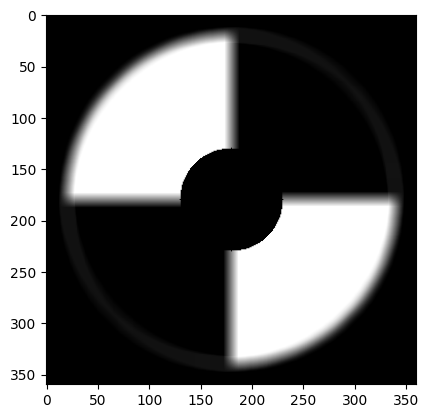

Visualization of separation of non blurred and blurred parts (radius = fr)


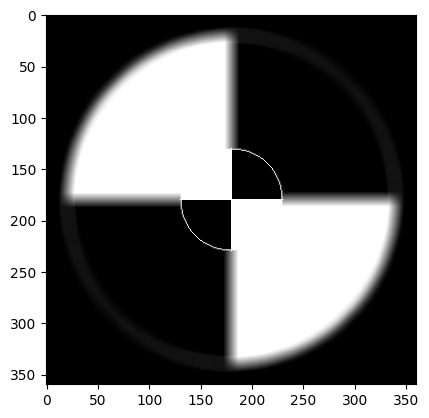

Laplacian Edge Mask


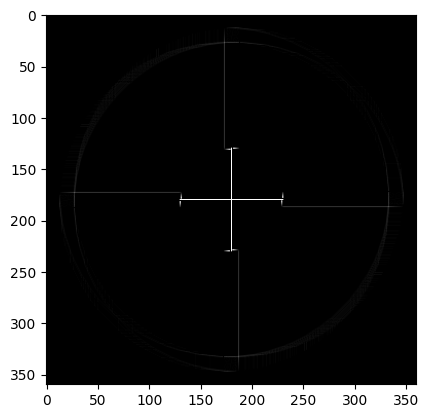

L O G edge mask


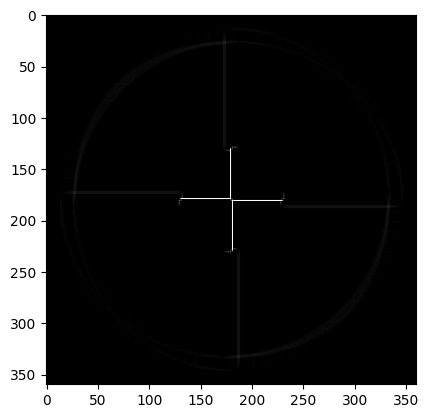

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


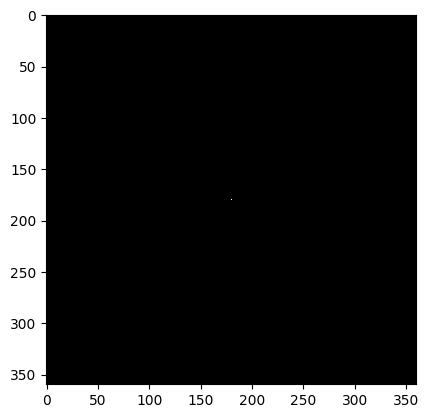

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


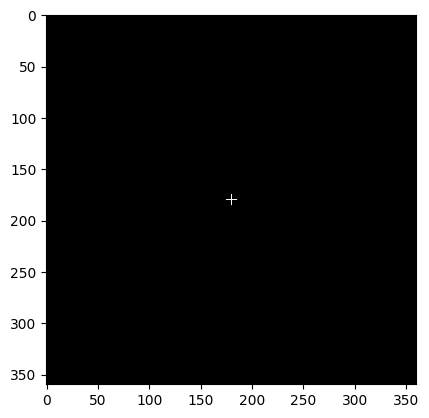

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


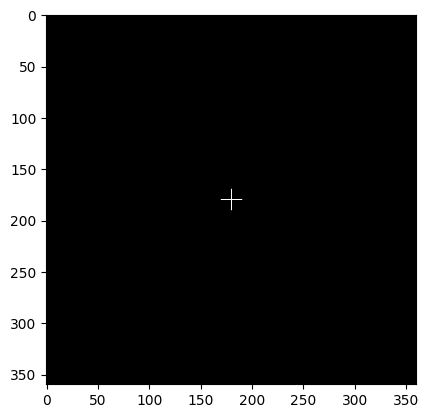

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


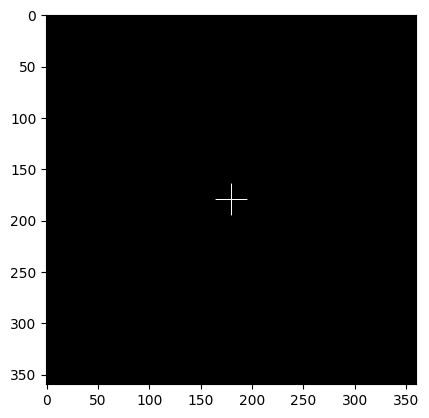

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


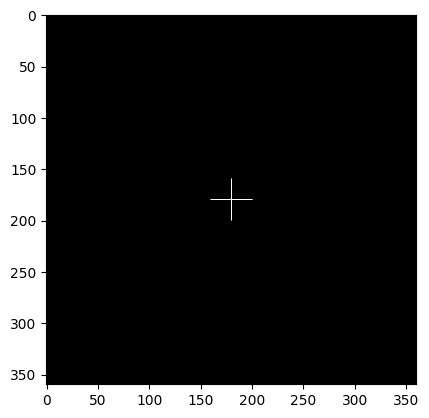

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


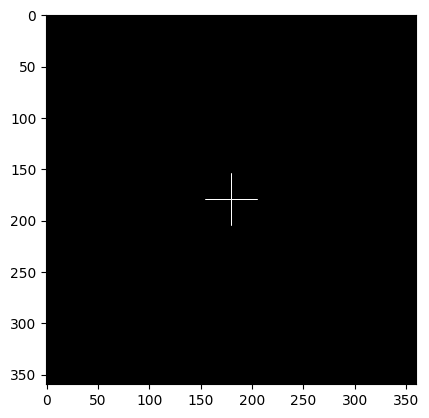

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


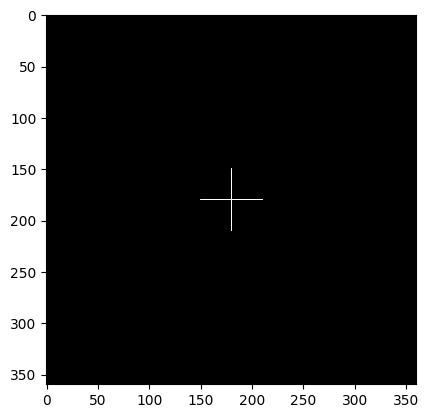

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


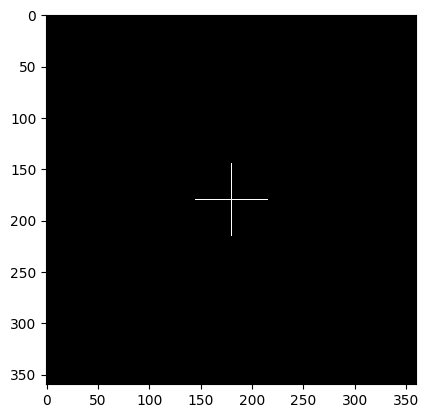

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


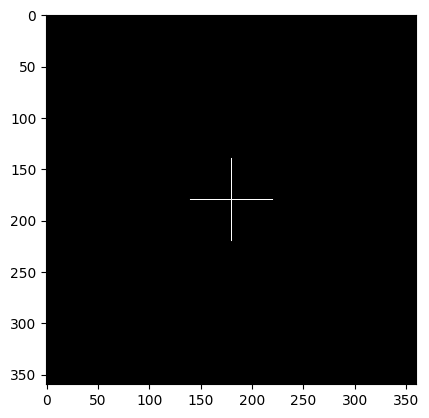

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


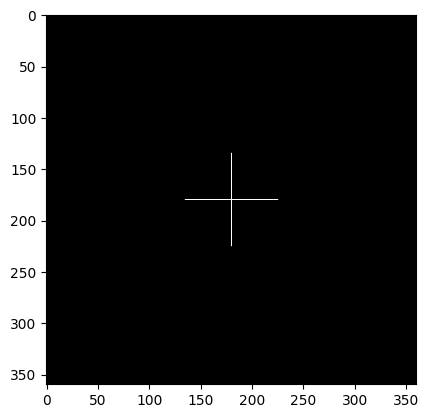

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


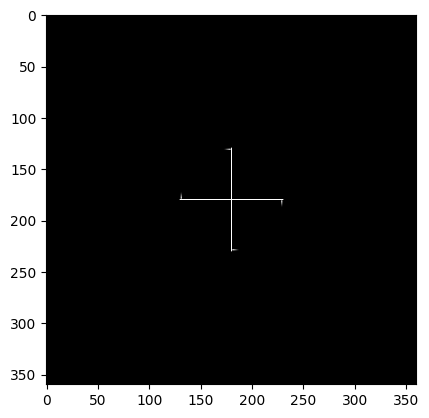

variance difference;  -9.177266421312993
55   32
Currently checking region with radius :  55


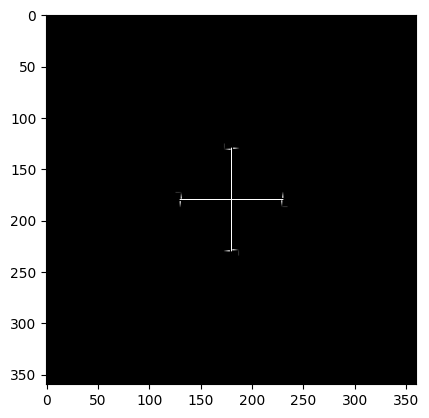

variance difference;  -5.918772538901706
60   32
Currently checking region with radius :  60


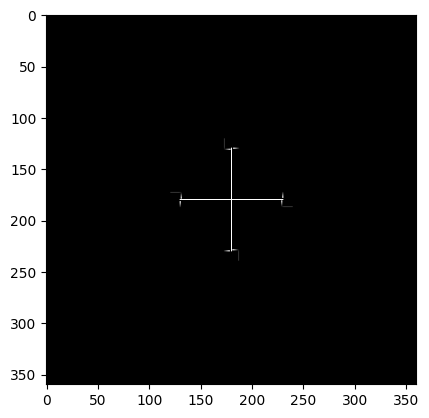

BLUR DETECTED AT RADIUS :  60
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  50
Differnece in variance :  3.687075590670659
Region with focal radius : 70




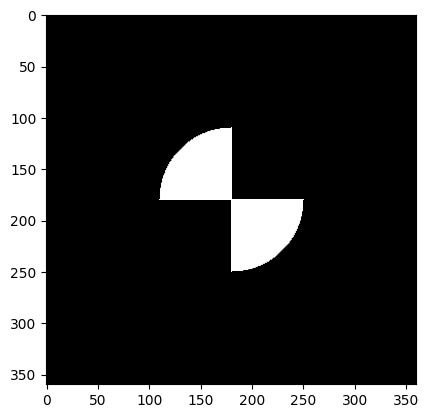

Test image with radius  70  being sharp with rest as blurred


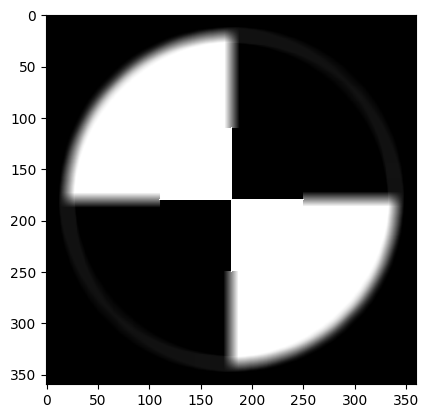

difference in test image and filtered non blurred region (in circular fasion)


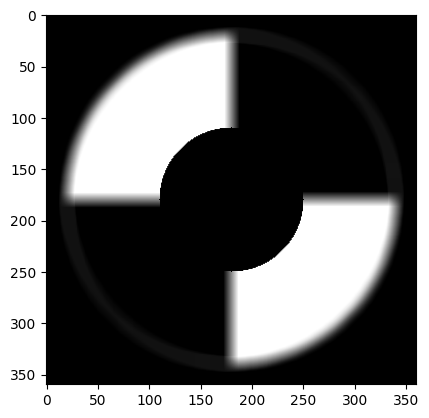

Visualization of separation of non blurred and blurred parts (radius = fr)


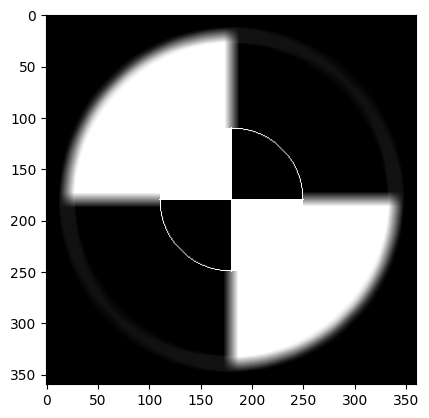

Laplacian Edge Mask


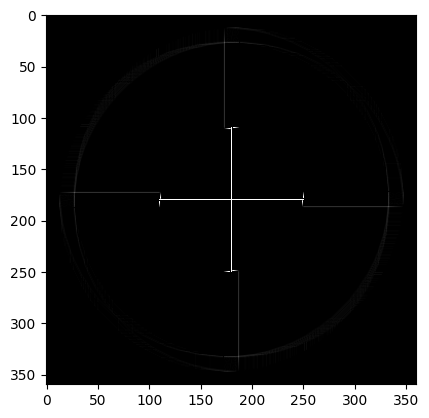

L O G edge mask


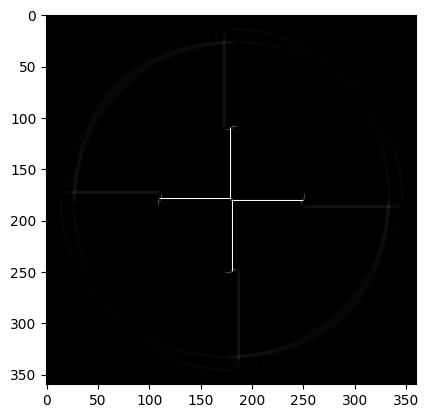

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


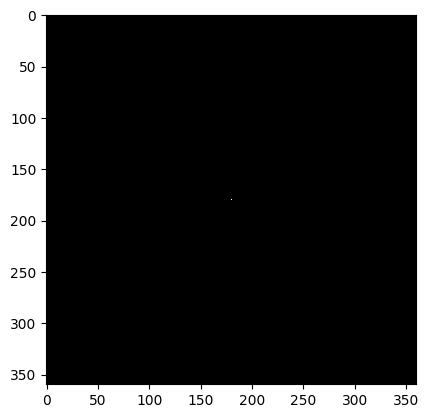

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


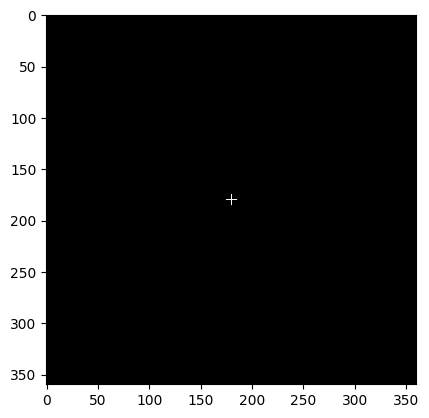

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


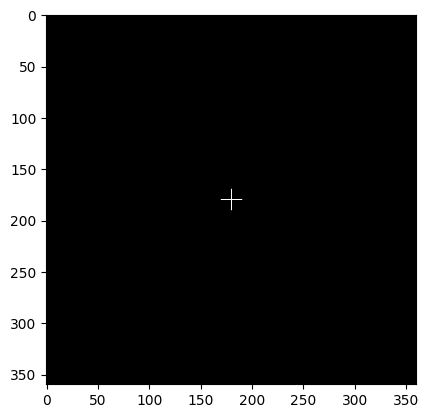

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


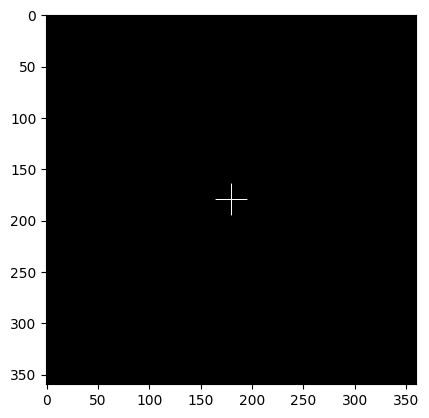

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


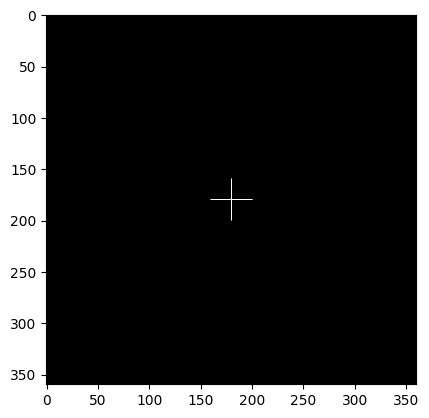

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


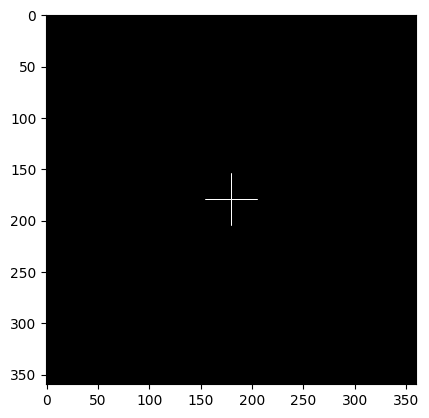

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


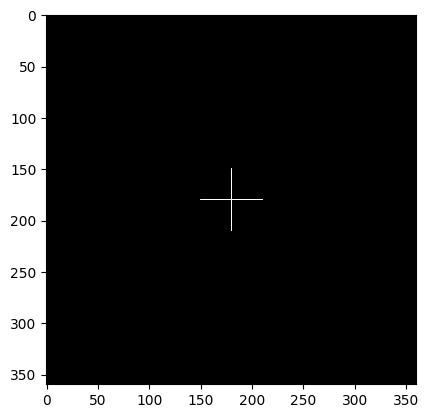

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


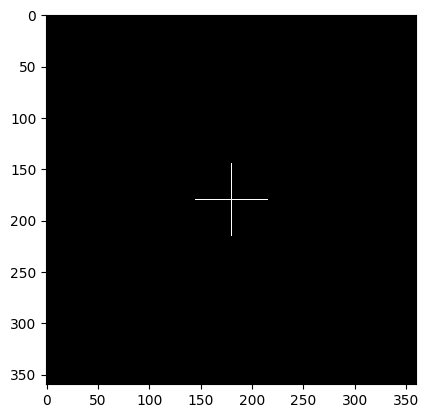

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


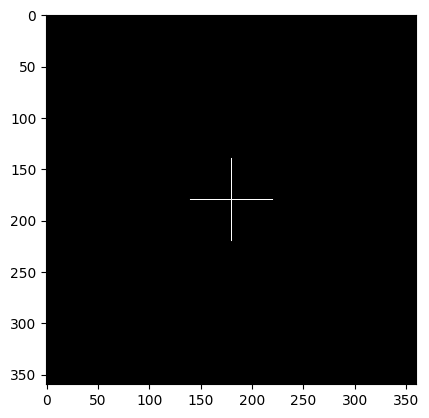

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


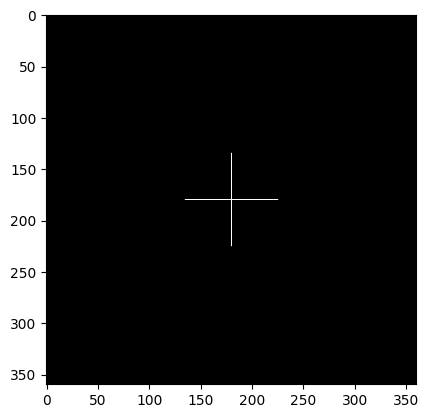

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


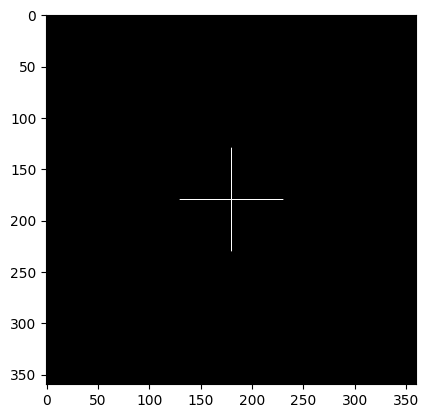

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


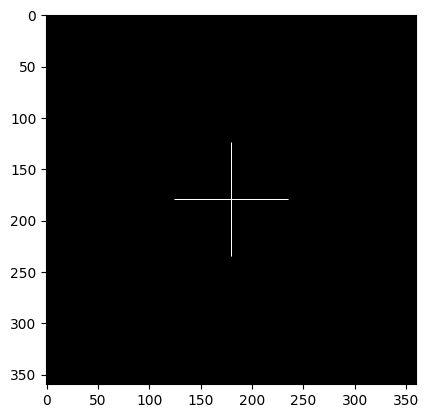

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


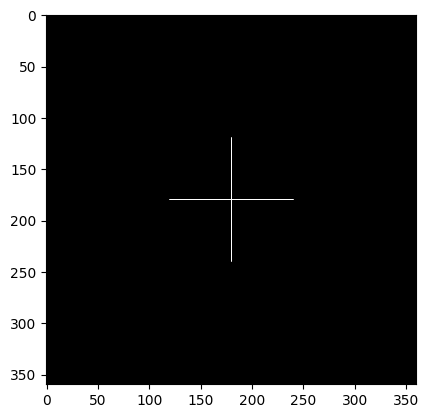

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


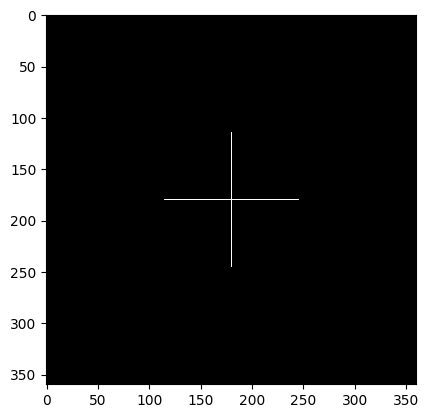

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


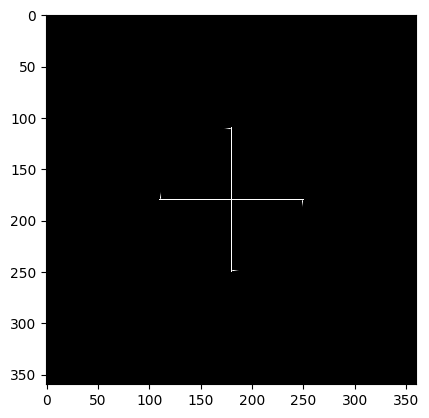

variance difference;  -9.164180716008872
75   32
Currently checking region with radius :  75


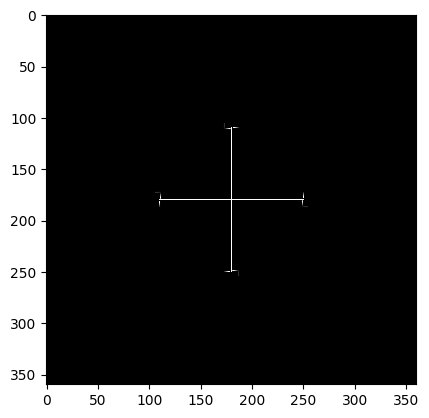

variance difference;  -5.905852014210353
80   32
Currently checking region with radius :  80


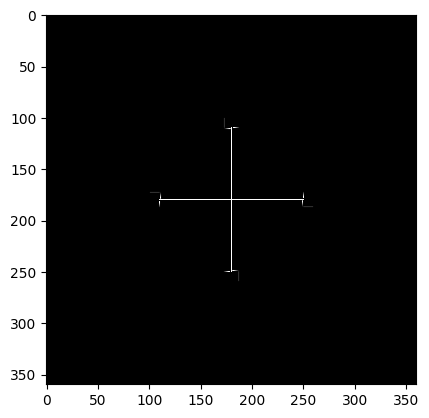

BLUR DETECTED AT RADIUS :  80
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  70
Differnece in variance :  3.690085278599355
Region with focal radius : 90




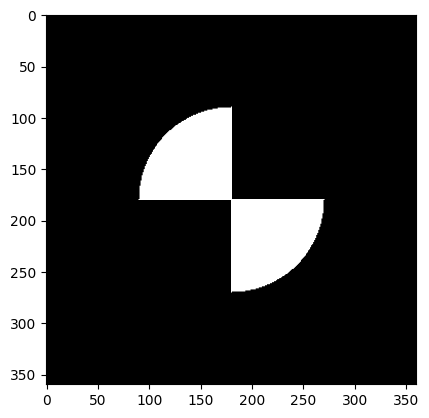

Test image with radius  90  being sharp with rest as blurred


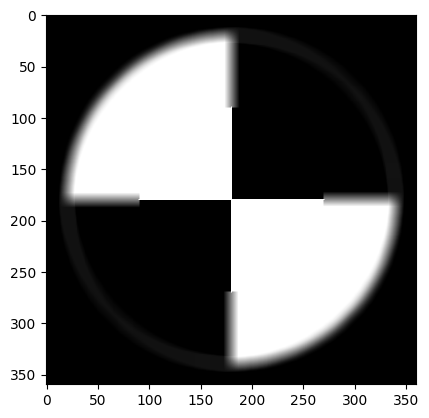

difference in test image and filtered non blurred region (in circular fasion)


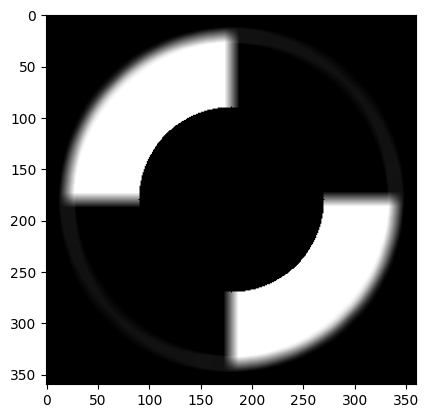

Visualization of separation of non blurred and blurred parts (radius = fr)


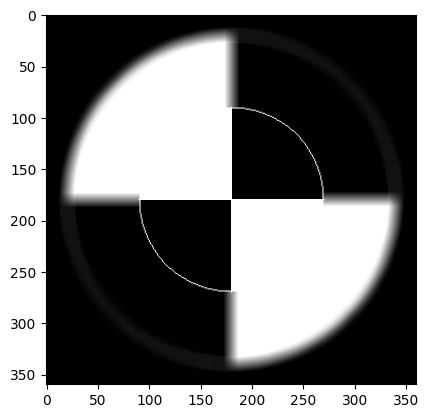

Laplacian Edge Mask


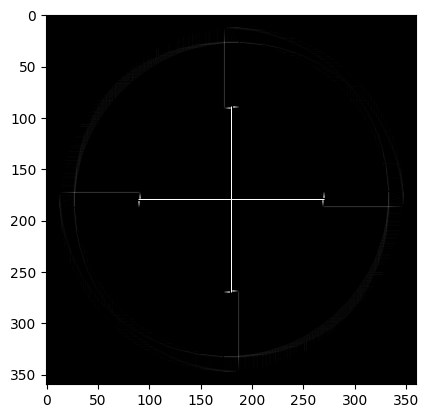

L O G edge mask


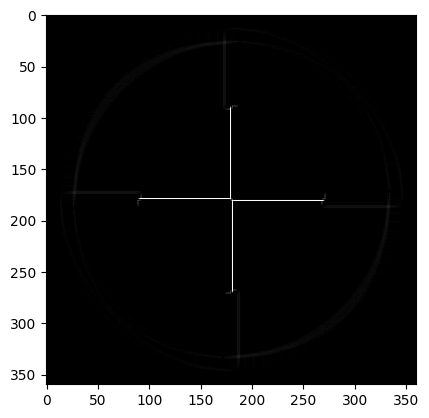

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


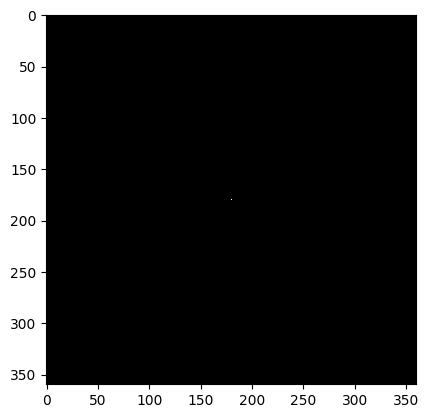

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


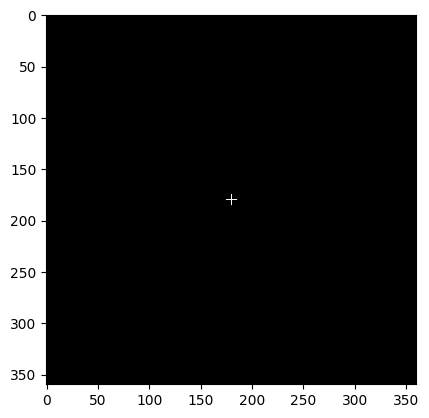

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


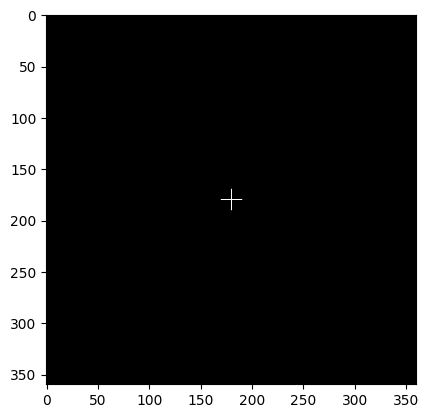

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


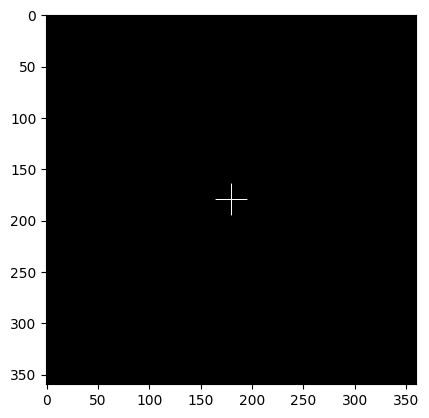

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


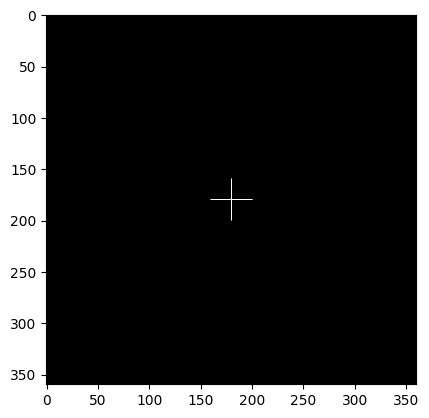

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


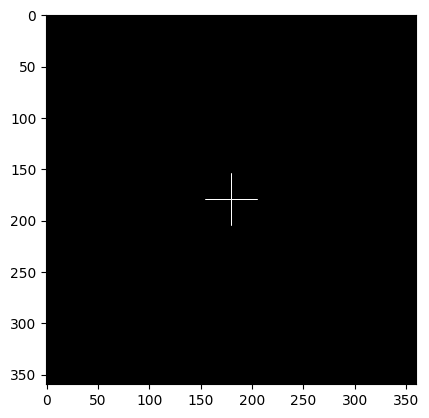

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


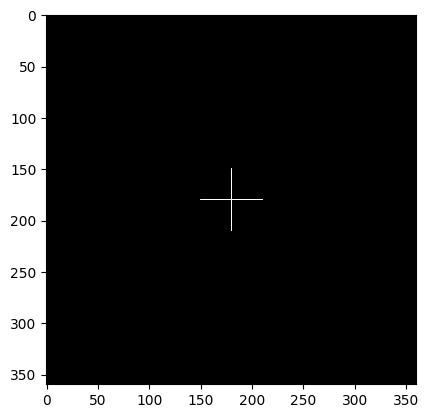

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


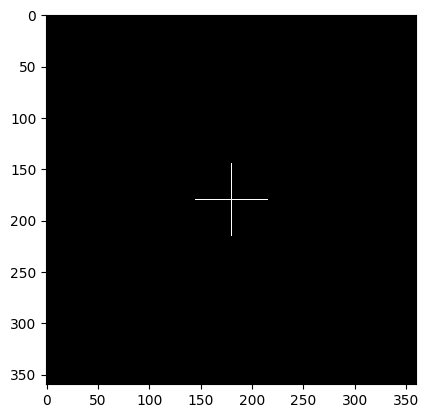

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


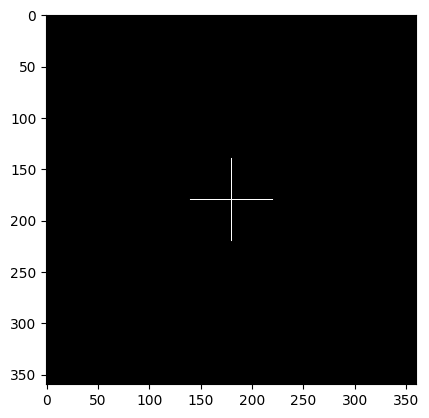

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


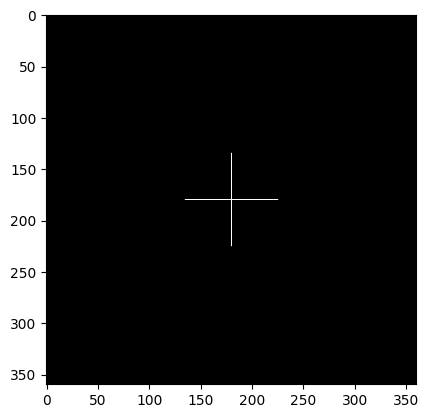

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


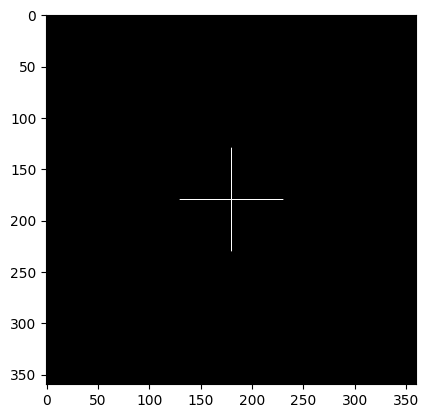

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


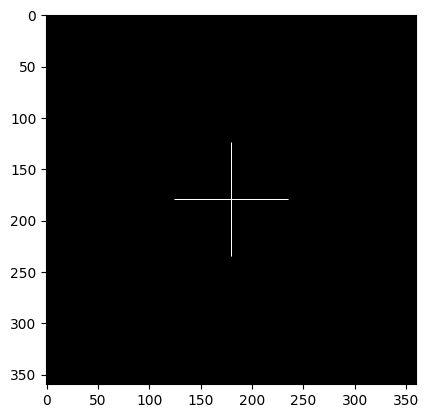

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


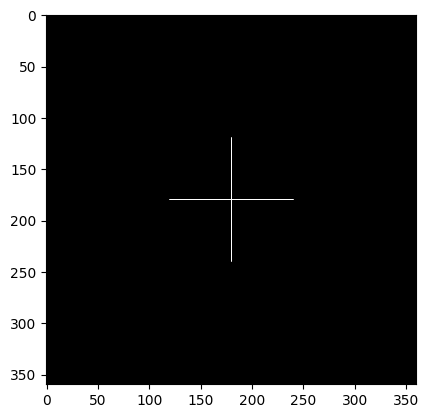

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


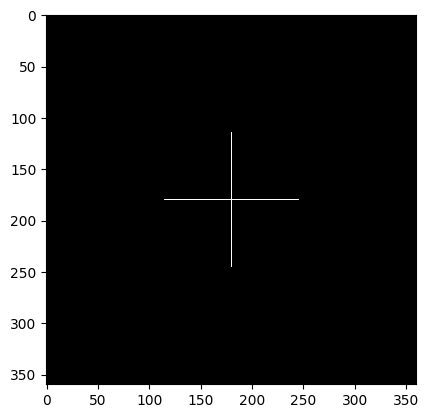

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


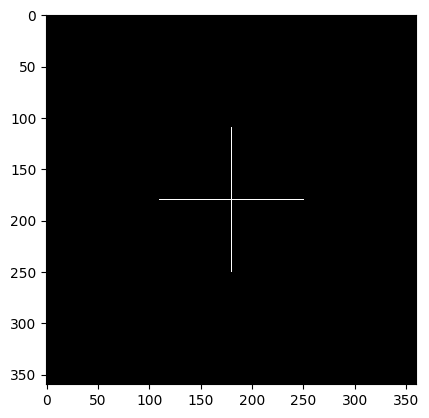

variance difference;  -3.694658738128254
75   32
Currently checking region with radius :  75


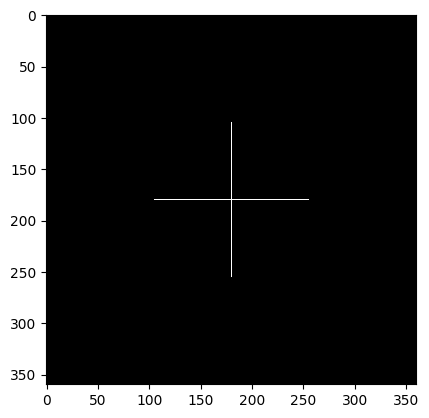

variance difference;  -3.6937411355333154
80   32
Currently checking region with radius :  80


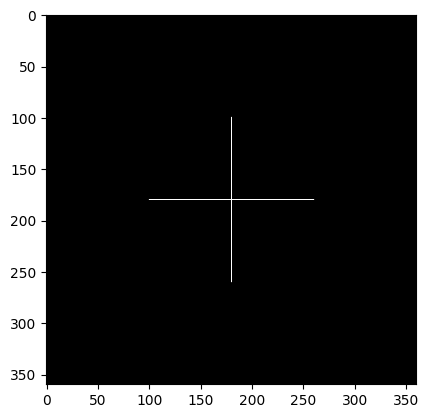

variance difference;  -3.692823532938462
85   32
Currently checking region with radius :  85


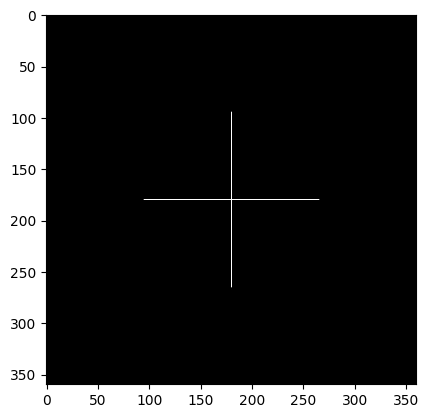

variance difference;  -3.691905930343495
90   32
Currently checking region with radius :  90


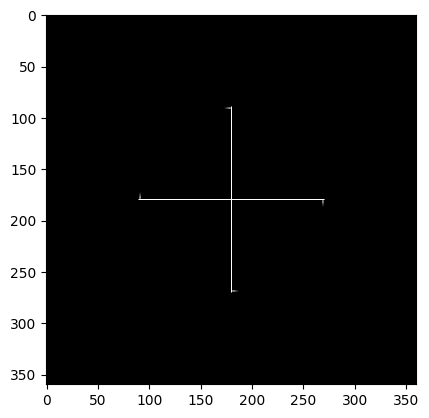

variance difference;  -9.151095010704836
95   32
Currently checking region with radius :  95


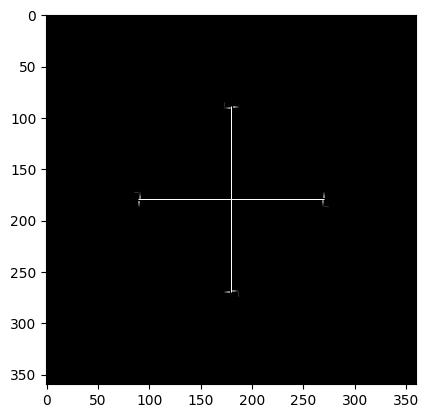

variance difference;  -5.892931489519071
100   32
Currently checking region with radius :  100


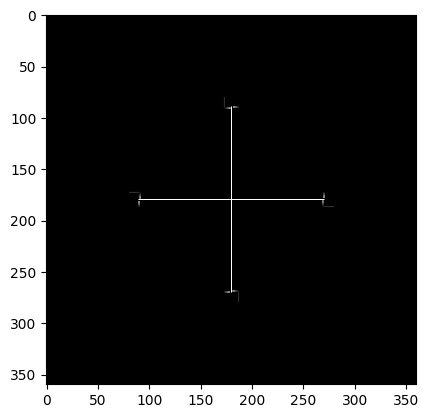

BLUR DETECTED AT RADIUS :  100
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  90
Differnece in variance :  3.6930949665279513
Region with focal radius : 100




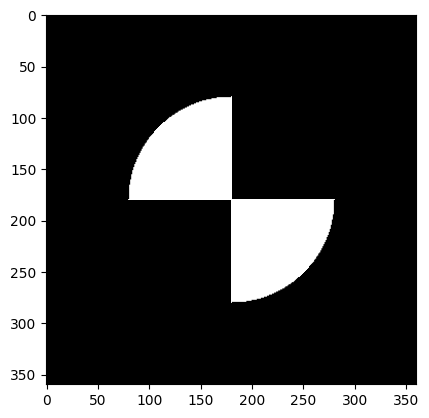

Test image with radius  100  being sharp with rest as blurred


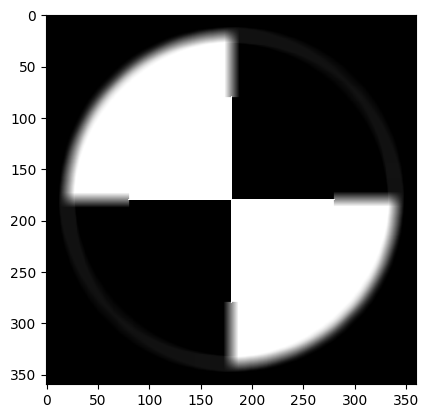

difference in test image and filtered non blurred region (in circular fasion)


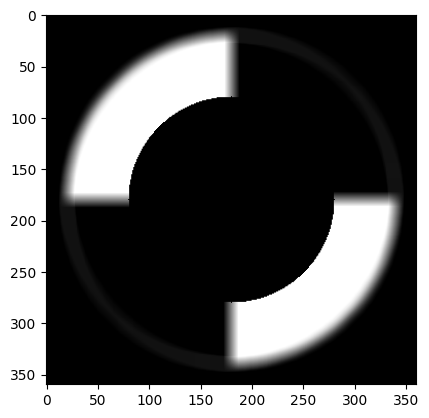

Visualization of separation of non blurred and blurred parts (radius = fr)


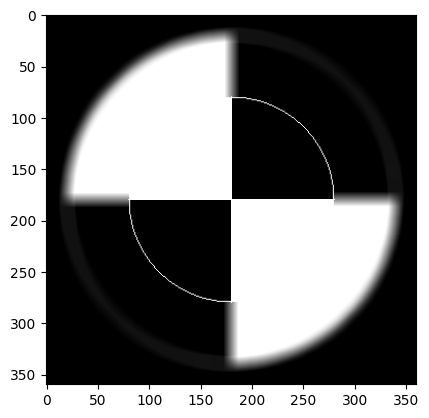

Laplacian Edge Mask


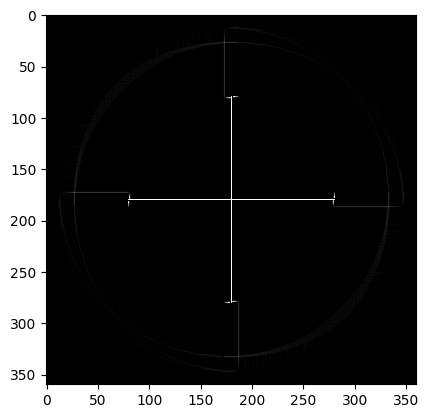

L O G edge mask


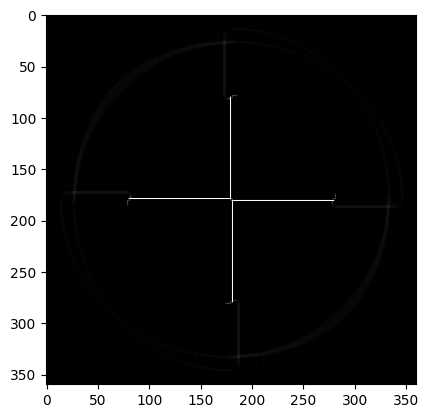

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


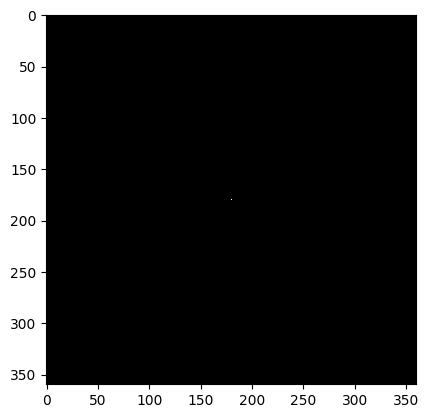

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


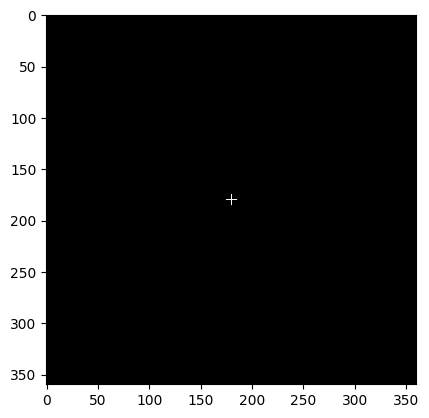

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


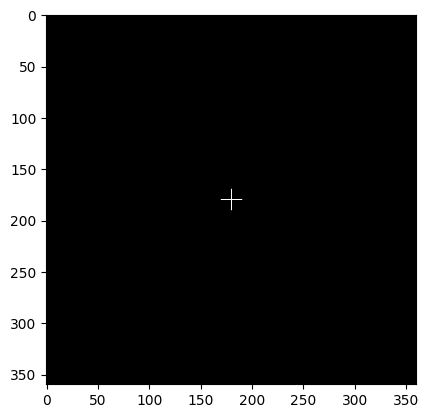

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


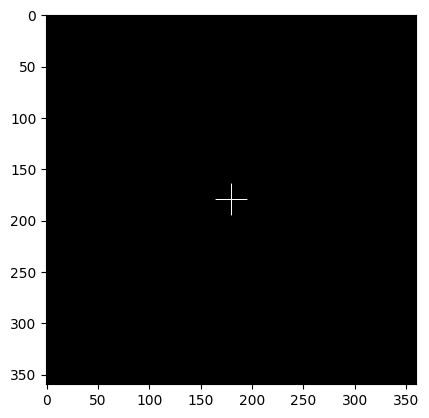

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


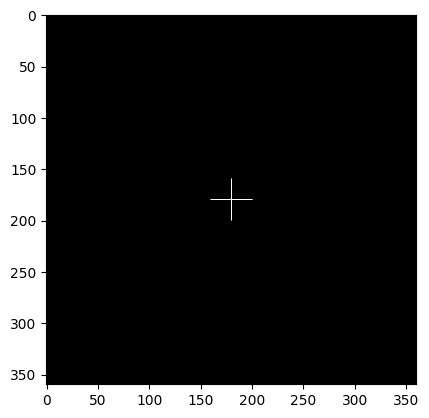

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


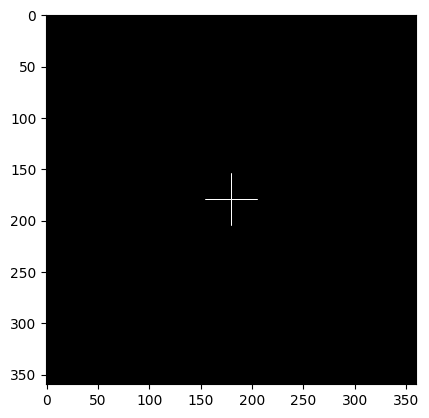

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


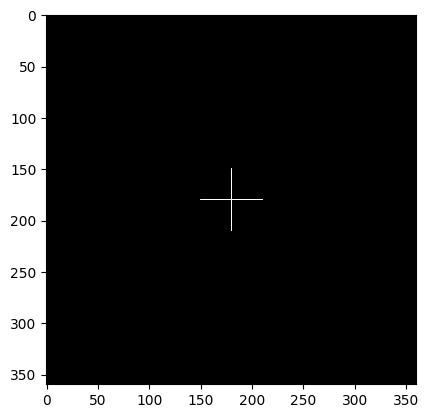

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


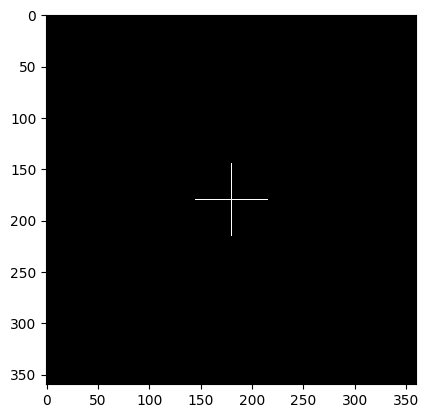

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


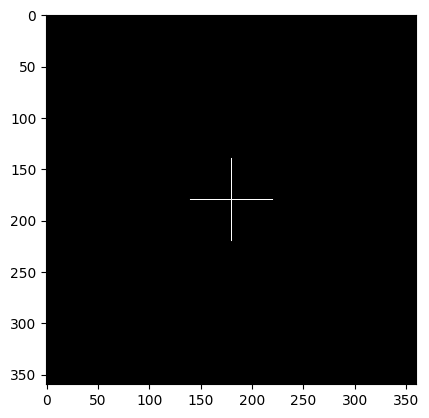

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


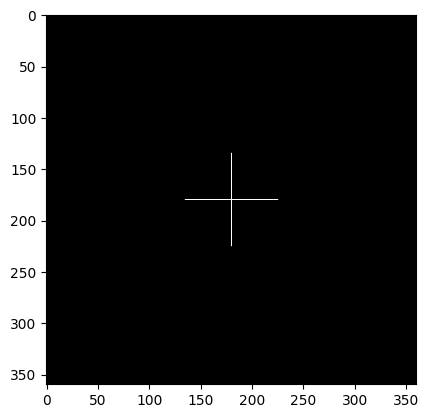

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


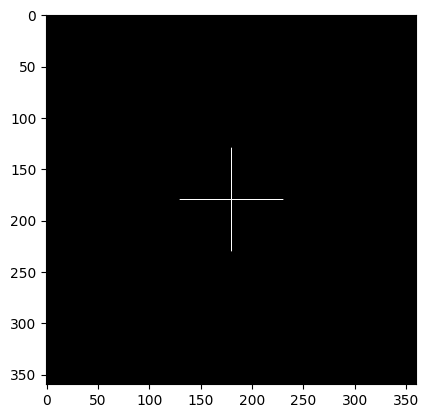

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


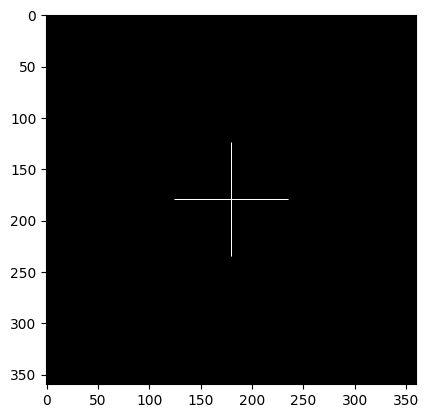

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


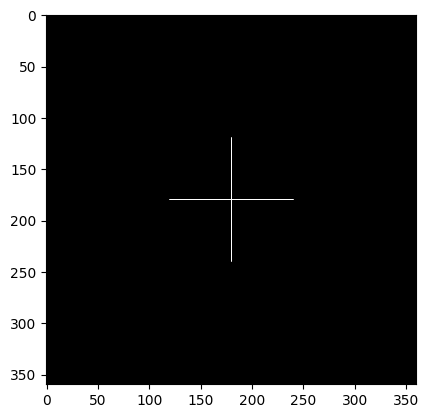

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


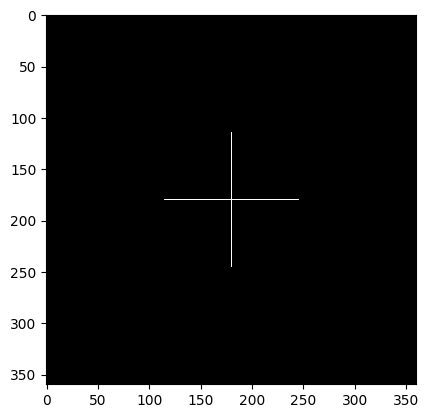

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


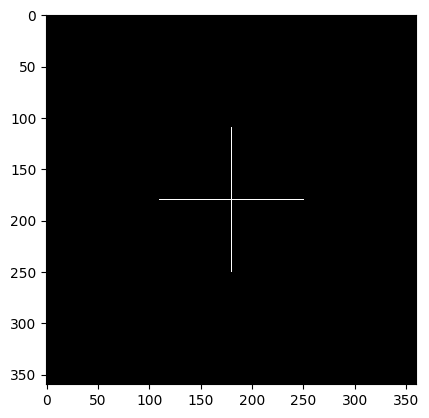

variance difference;  -3.694658738128254
75   32
Currently checking region with radius :  75


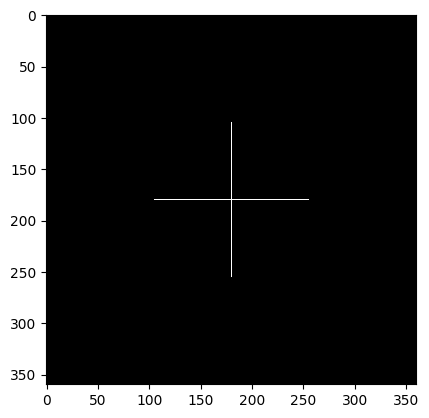

variance difference;  -3.6937411355333154
80   32
Currently checking region with radius :  80


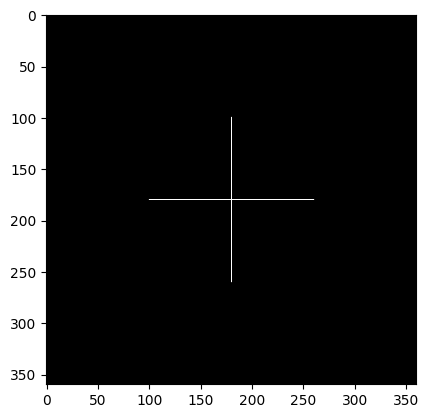

variance difference;  -3.692823532938462
85   32
Currently checking region with radius :  85


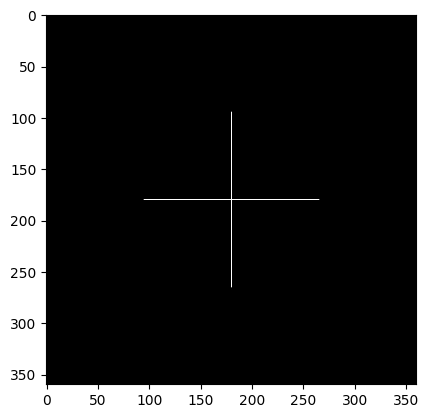

variance difference;  -3.691905930343495
90   32
Currently checking region with radius :  90


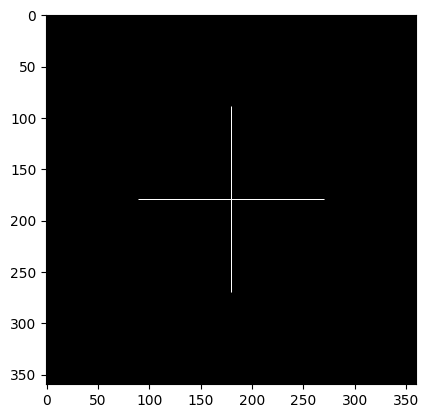

variance difference;  -3.6909883277487836
95   32
Currently checking region with radius :  95


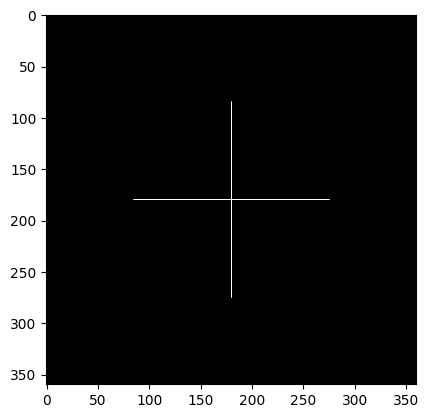

variance difference;  -3.6900707251539018
100   32
Currently checking region with radius :  100


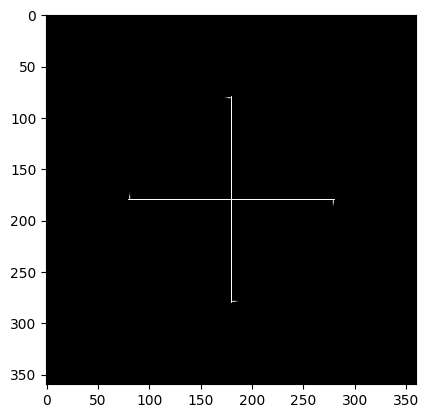

variance difference;  -9.144552158052903
105   32
Currently checking region with radius :  105


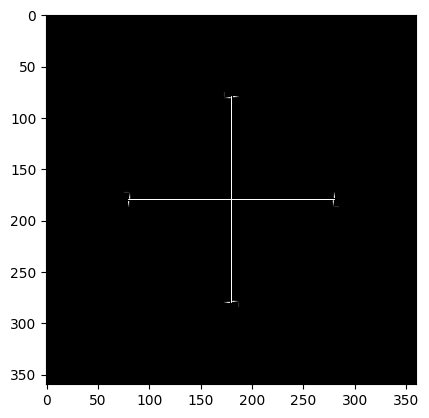

variance difference;  -5.886471227173331
110   32
Currently checking region with radius :  110


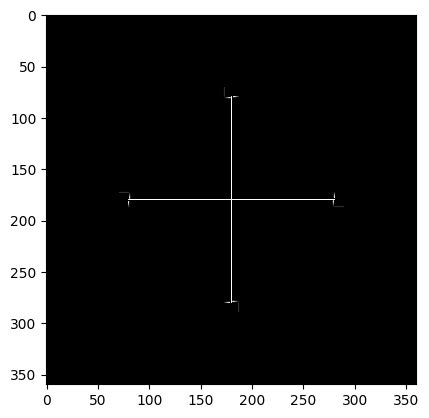

BLUR DETECTED AT RADIUS :  110
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  100
Differnece in variance :  3.6945998104924627
------------------------------------------------------












blurred image with box blur kernel :  20  x  20


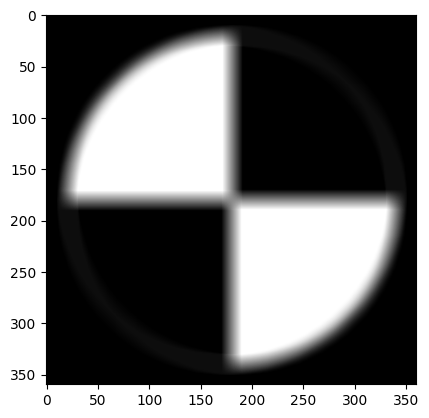

Region with focal radius : 10




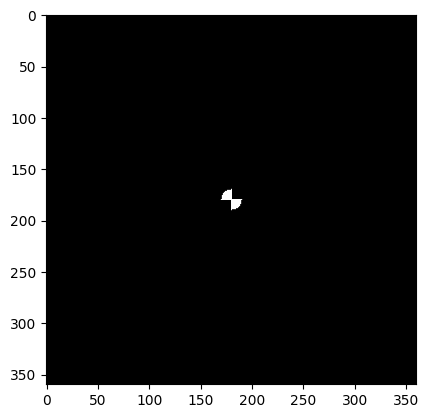

Test image with radius  10  being sharp with rest as blurred


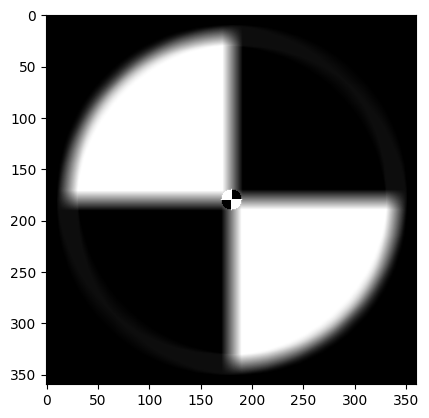

difference in test image and filtered non blurred region (in circular fasion)


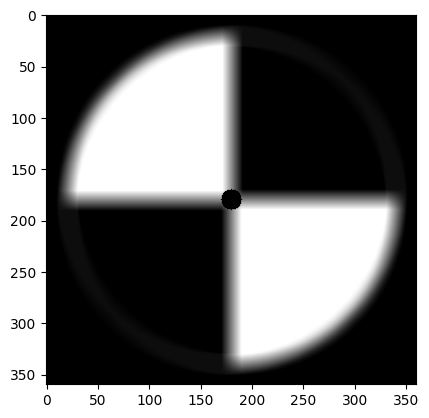

Visualization of separation of non blurred and blurred parts (radius = fr)


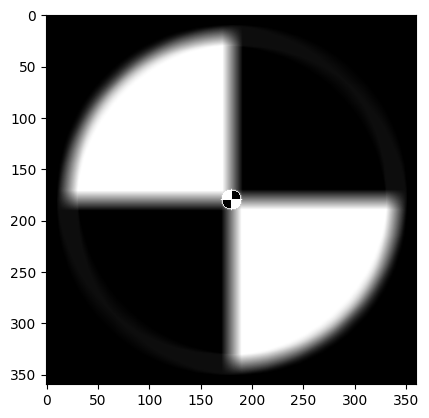

Laplacian Edge Mask


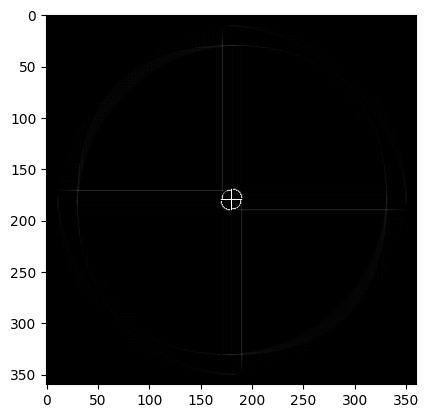

L O G edge mask


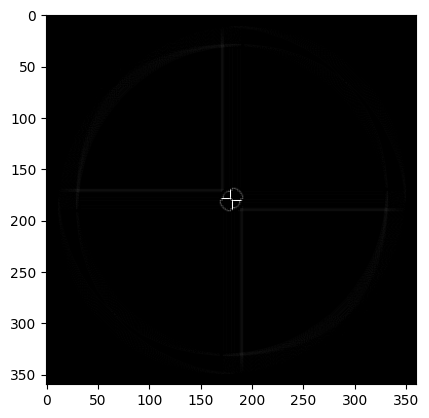

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


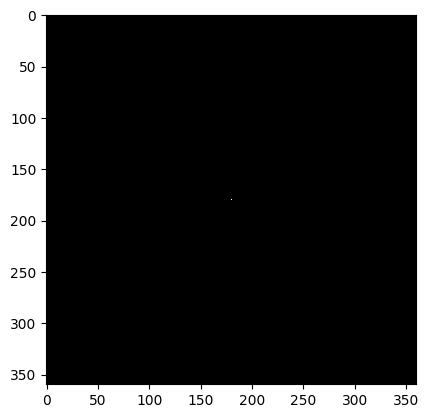

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


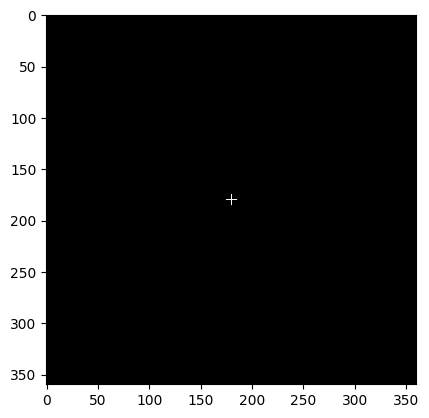

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


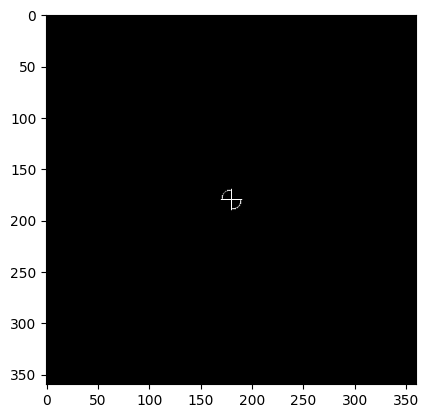

variance difference;  -12.419229914873409
15   32
Currently checking region with radius :  15


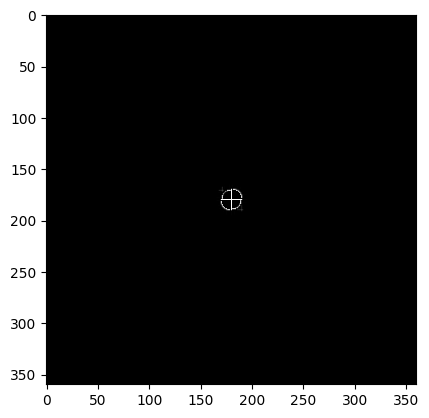

variance difference;  -13.015067490128704
20   32
Currently checking region with radius :  20


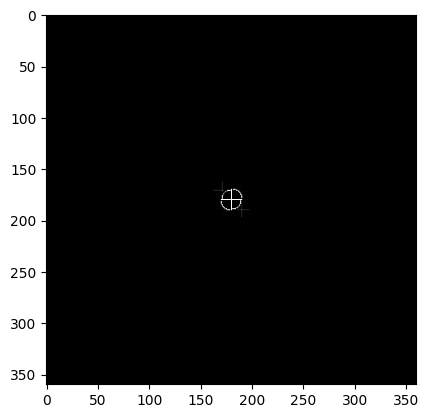

variance difference;  -3.2526286298177567
25   32
Currently checking region with radius :  25


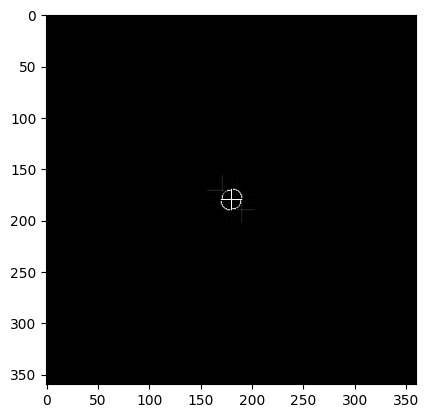

BLUR DETECTED AT RADIUS :  25
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  10
Differnece in variance :  6.50699831348355
Region with focal radius : 20




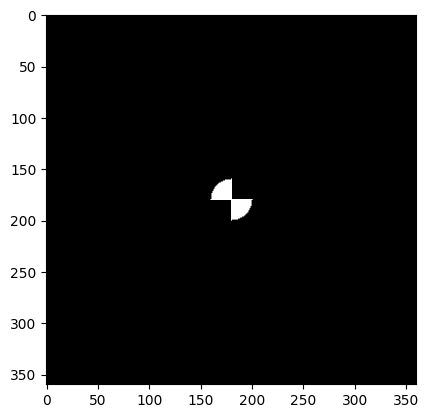

Test image with radius  20  being sharp with rest as blurred


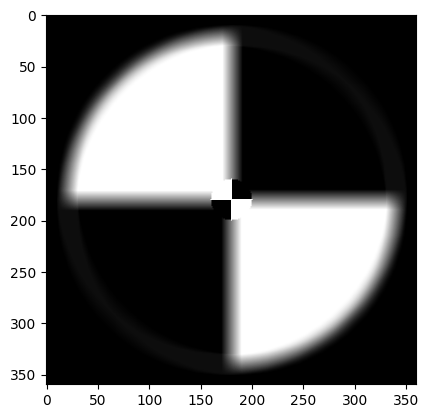

difference in test image and filtered non blurred region (in circular fasion)


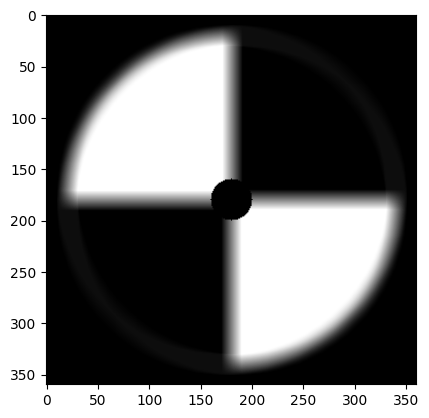

Visualization of separation of non blurred and blurred parts (radius = fr)


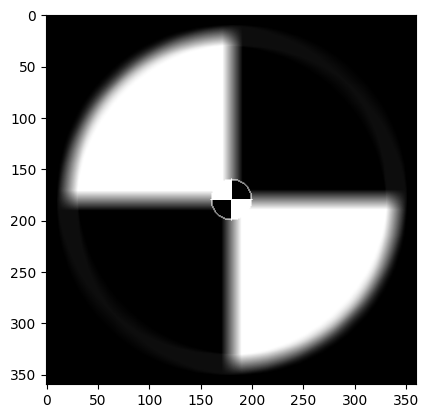

Laplacian Edge Mask


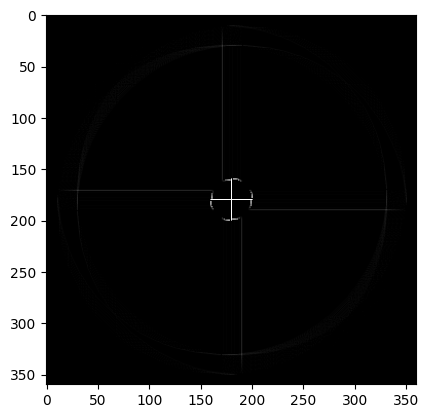

L O G edge mask


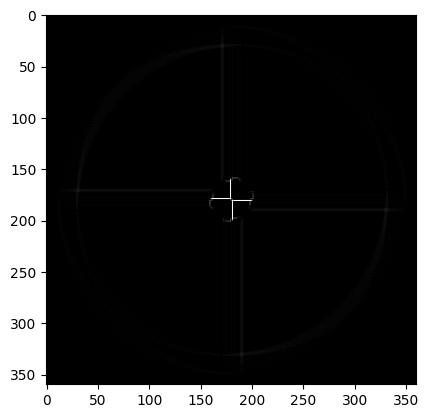

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


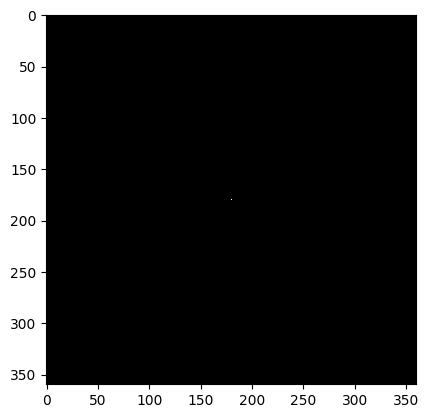

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


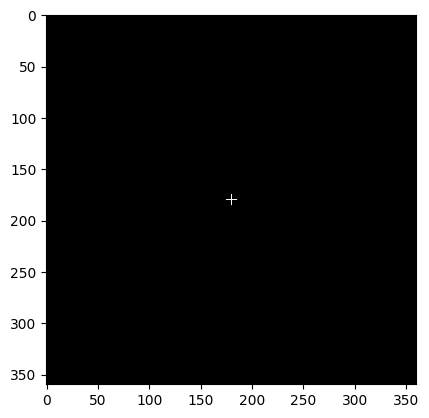

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


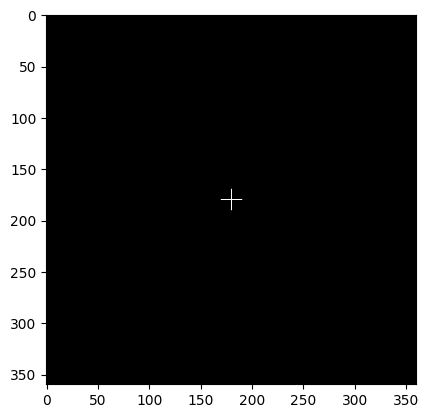

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


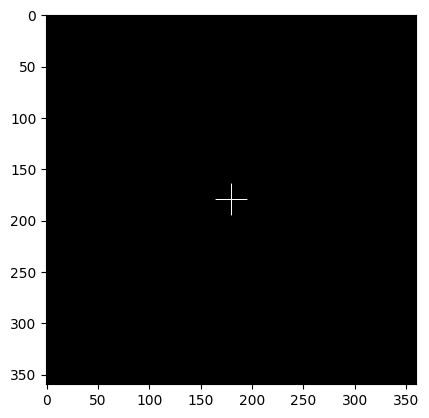

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


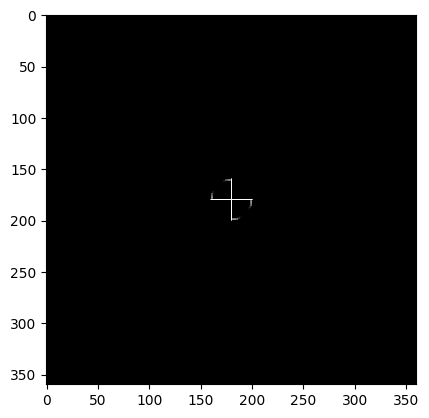

variance difference;  -12.248778334512153
25   32
Currently checking region with radius :  25


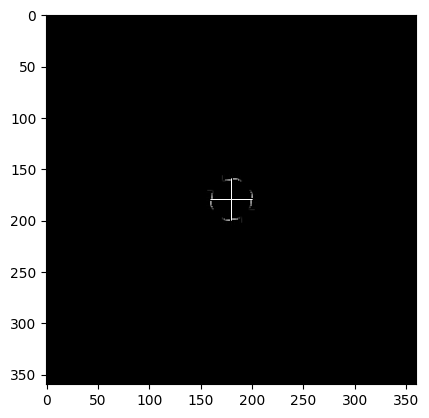

variance difference;  -11.875056894849784
30   32
Currently checking region with radius :  30


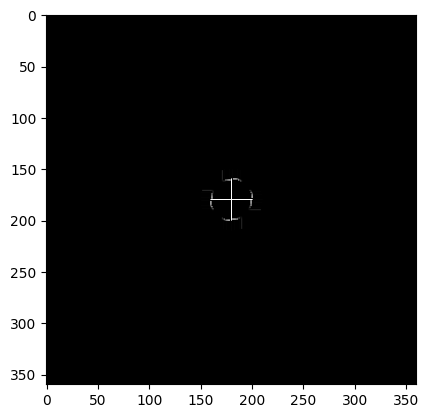

variance difference;  -2.1170375475703977
35   32
Currently checking region with radius :  35


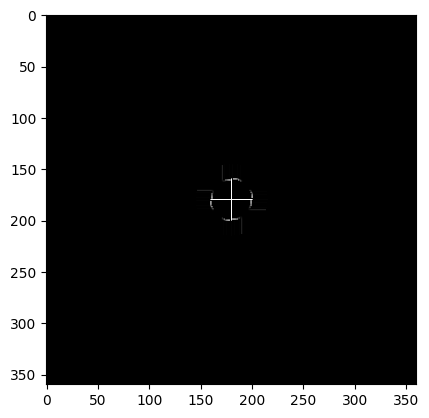

BLUR DETECTED AT RADIUS :  35
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  20
Differnece in variance :  7.660957086917485
Region with focal radius : 30




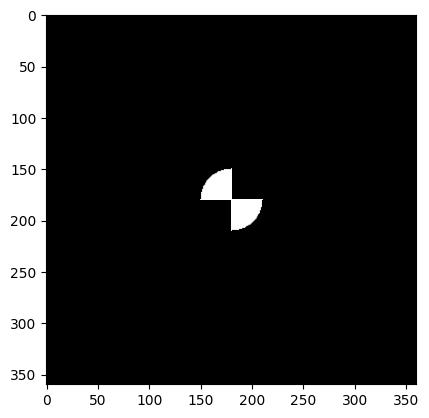

Test image with radius  30  being sharp with rest as blurred


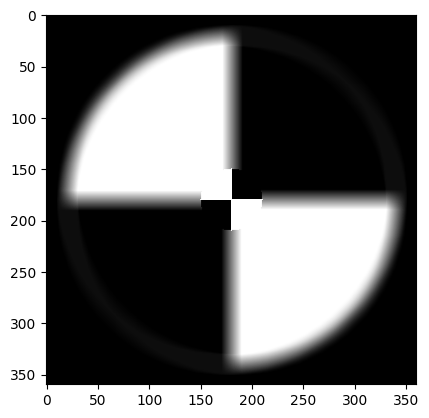

difference in test image and filtered non blurred region (in circular fasion)


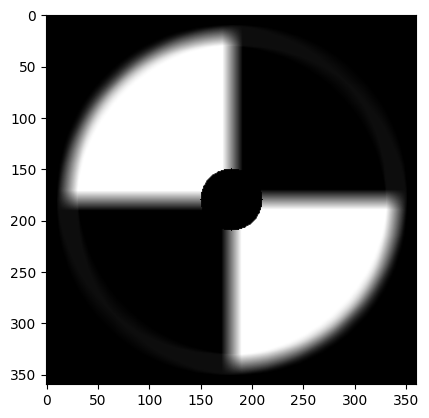

Visualization of separation of non blurred and blurred parts (radius = fr)


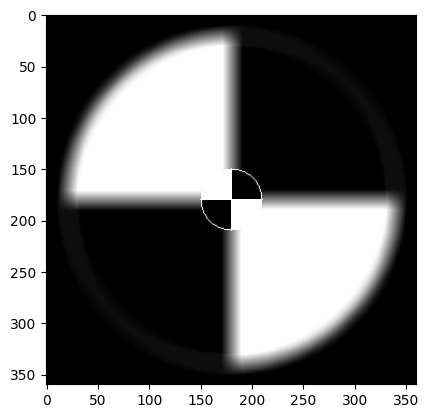

Laplacian Edge Mask


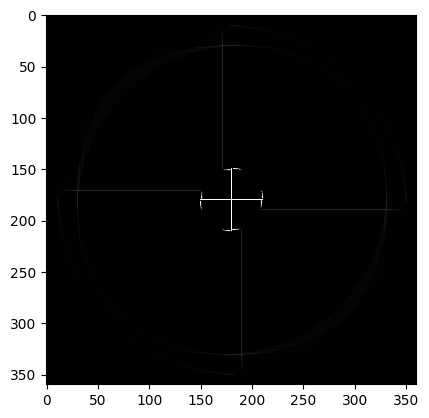

L O G edge mask


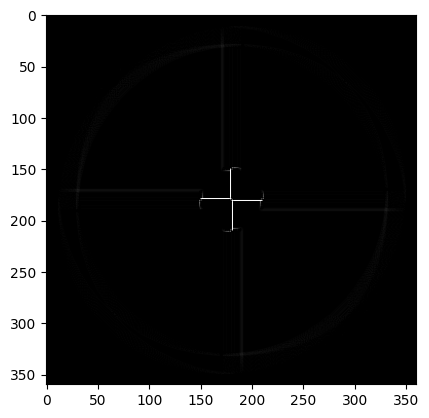

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


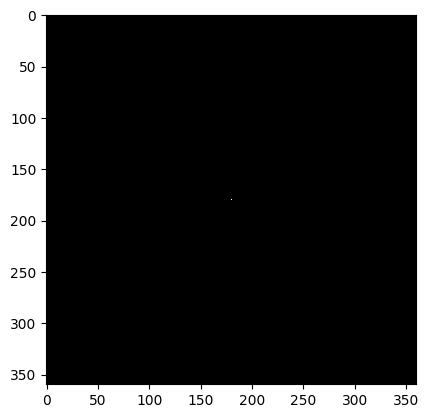

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


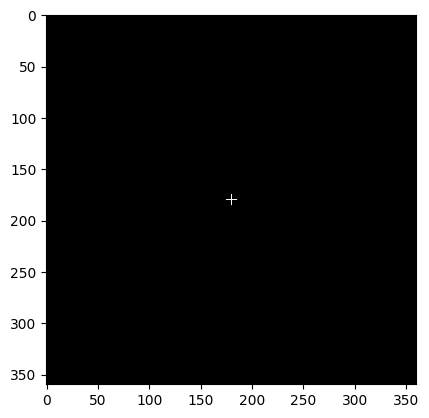

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


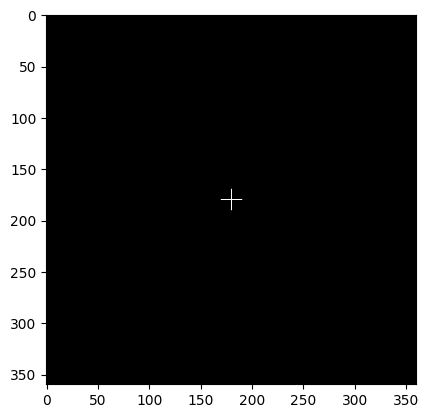

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


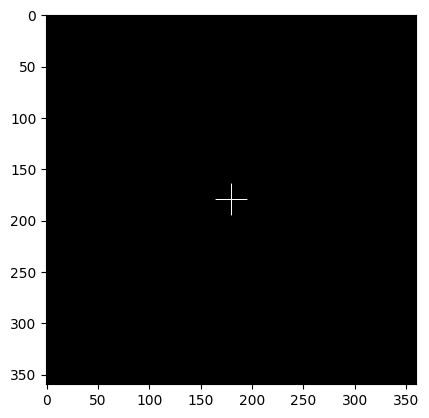

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


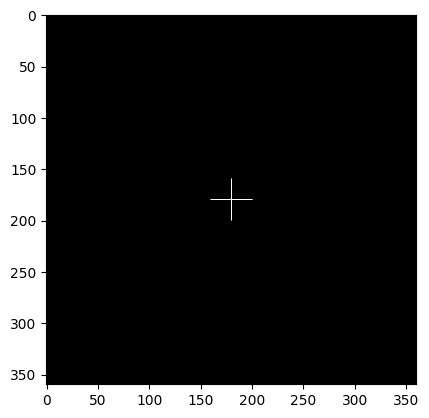

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


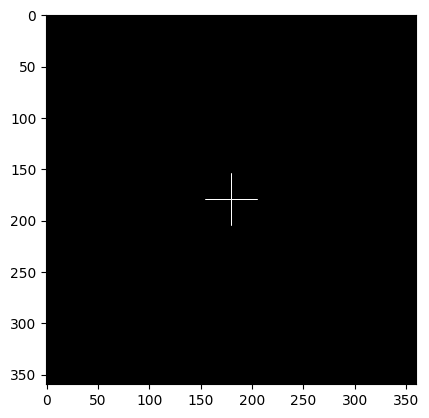

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


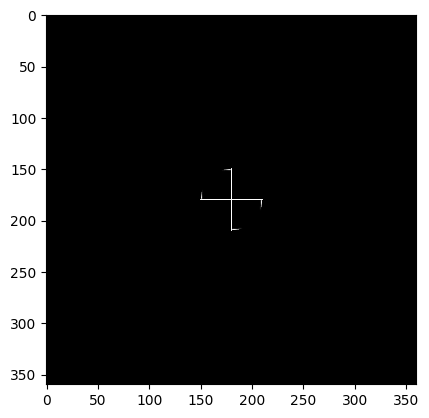

variance difference;  -12.158074253579393
35   32
Currently checking region with radius :  35


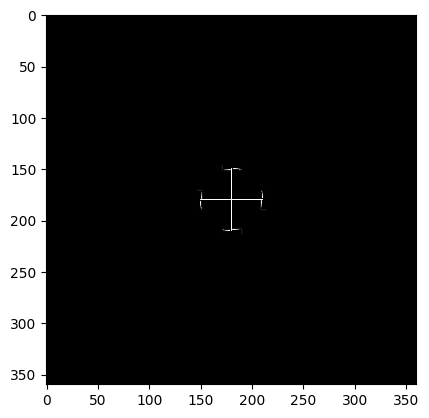

variance difference;  -11.5944184917862
40   32
Currently checking region with radius :  40


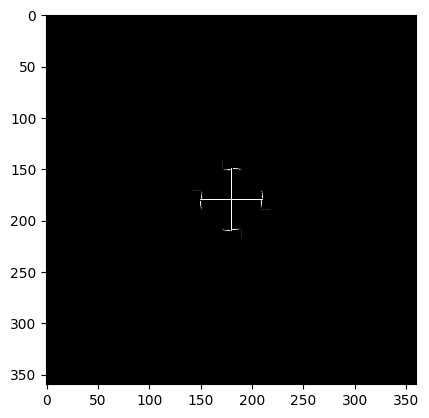

variance difference;  -1.81816783449311
45   32
Currently checking region with radius :  45


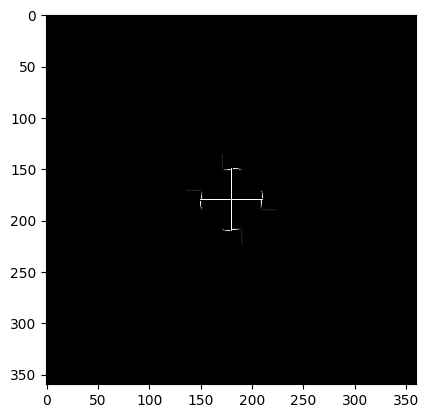

BLUR DETECTED AT RADIUS :  45
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  30
Differnece in variance :  7.9319703785269695
Region with focal radius : 50




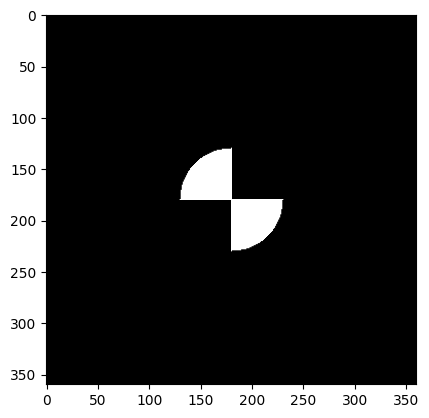

Test image with radius  50  being sharp with rest as blurred


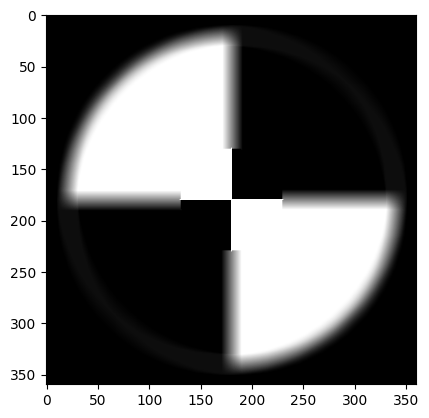

difference in test image and filtered non blurred region (in circular fasion)


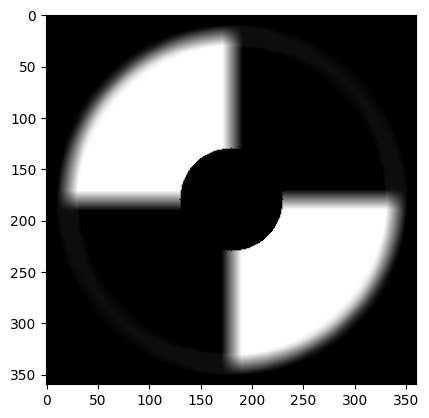

Visualization of separation of non blurred and blurred parts (radius = fr)


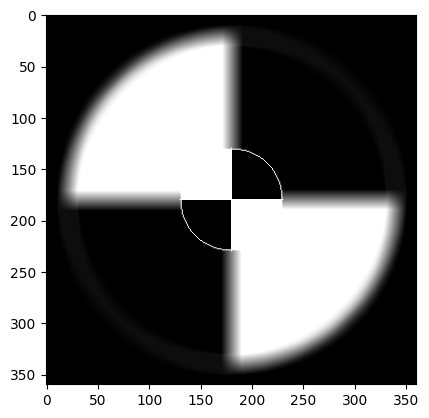

Laplacian Edge Mask


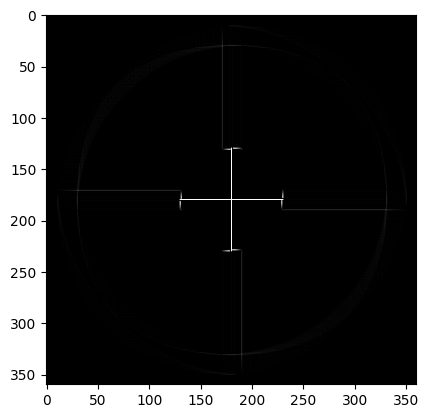

L O G edge mask


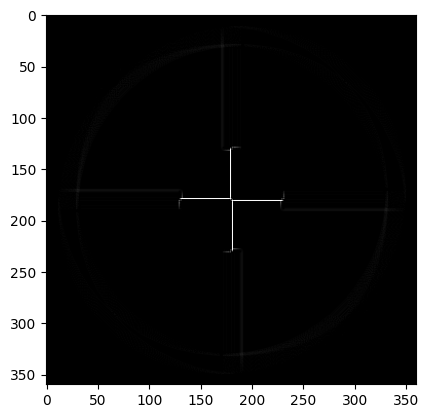

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


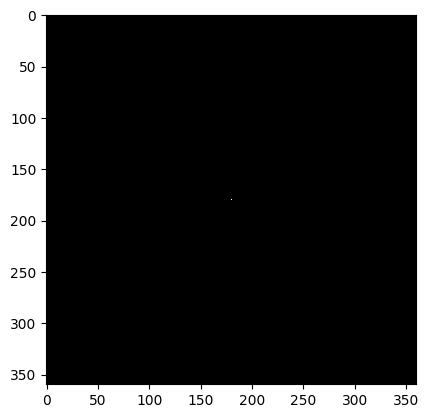

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


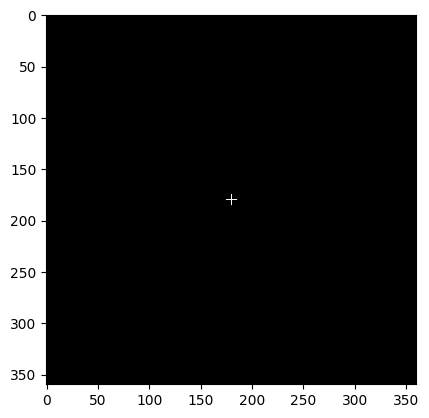

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


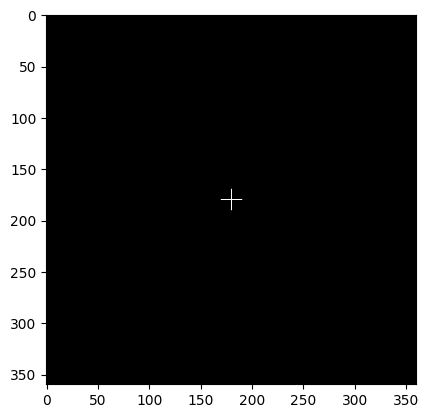

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


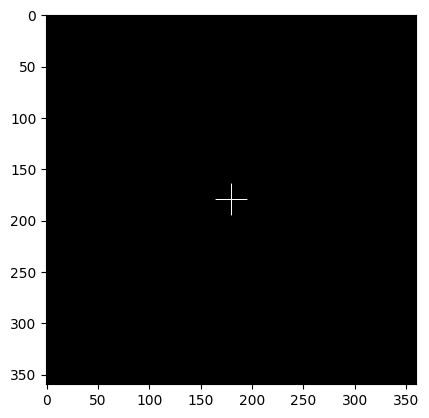

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


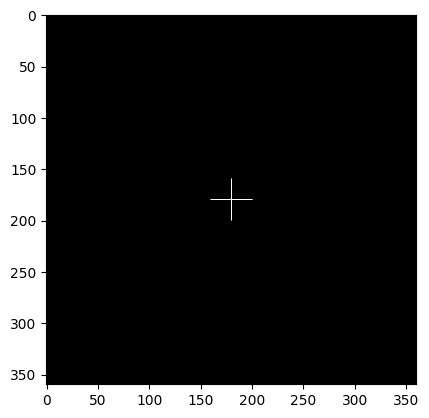

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


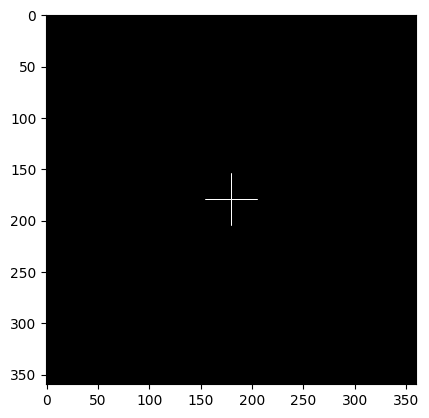

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


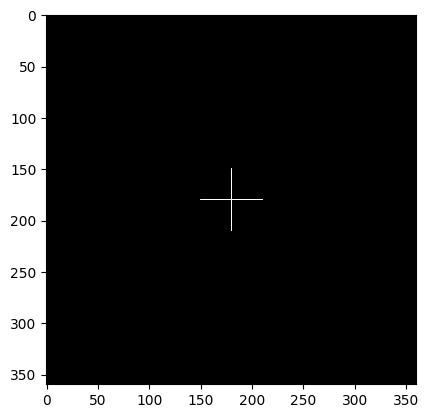

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


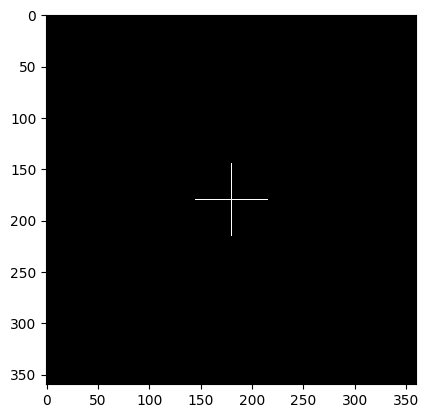

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


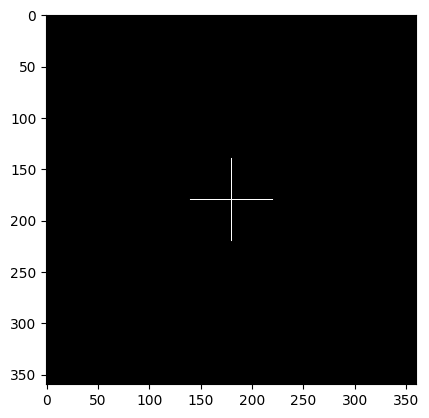

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


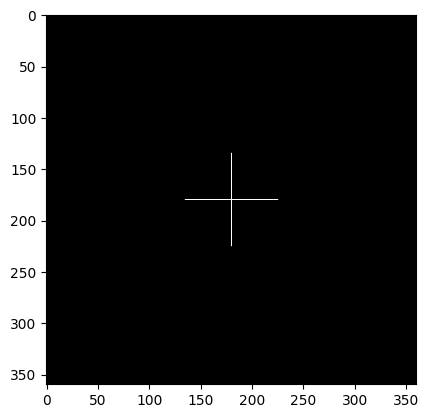

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


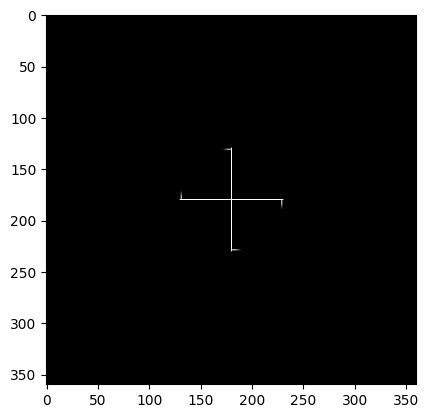

variance difference;  -12.08202217739057
55   32
Currently checking region with radius :  55


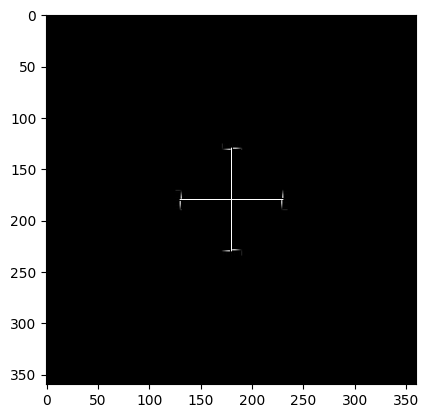

variance difference;  -11.38260450763741
60   32
Currently checking region with radius :  60


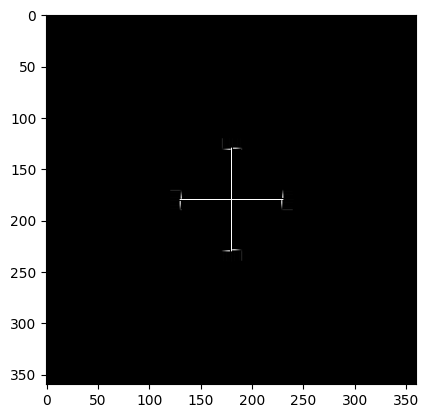

variance difference;  -1.6161415732524915
65   32
Currently checking region with radius :  65


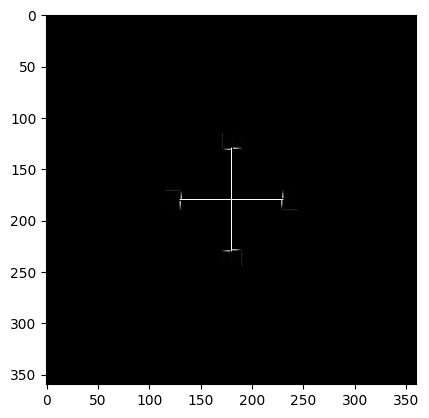

BLUR DETECTED AT RADIUS :  65
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  50
Differnece in variance :  8.147363113533103
Region with focal radius : 70




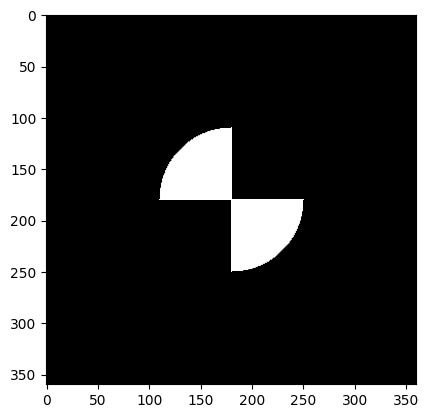

Test image with radius  70  being sharp with rest as blurred


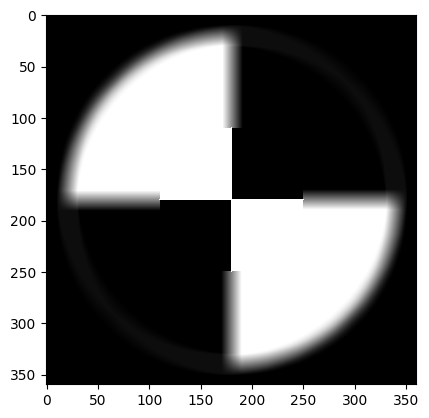

difference in test image and filtered non blurred region (in circular fasion)


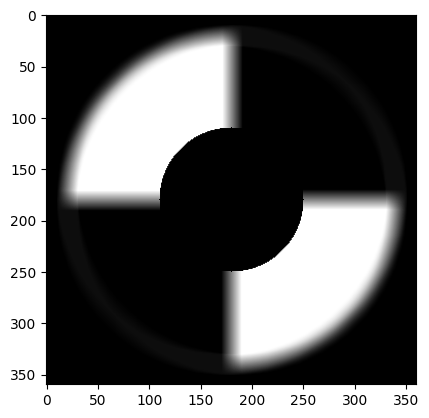

Visualization of separation of non blurred and blurred parts (radius = fr)


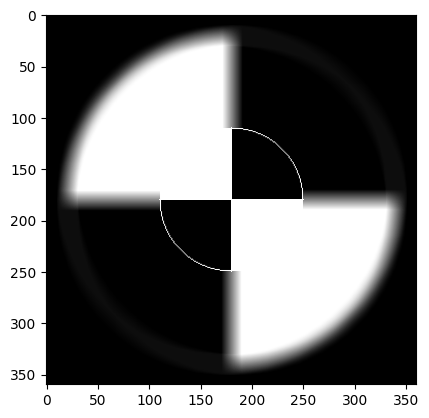

Laplacian Edge Mask


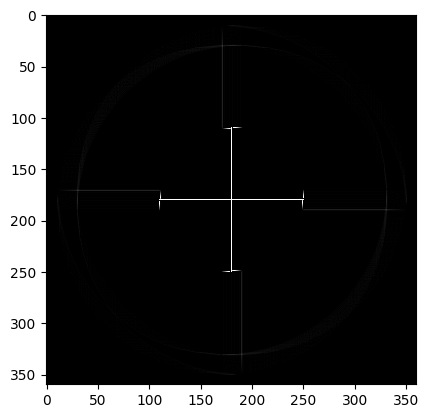

L O G edge mask


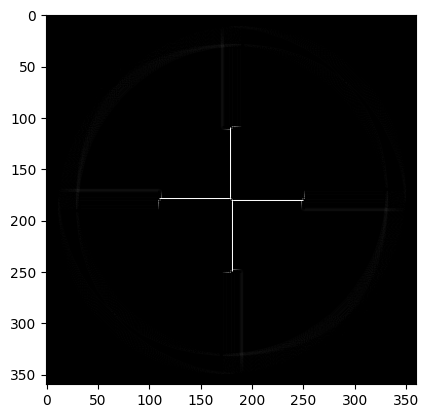

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


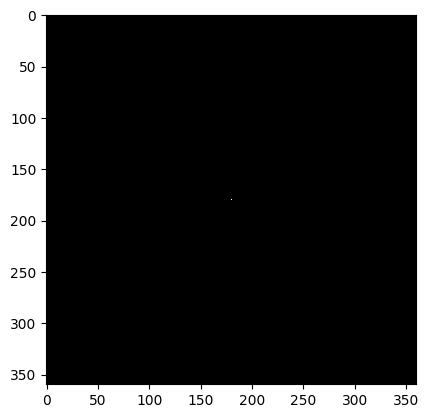

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


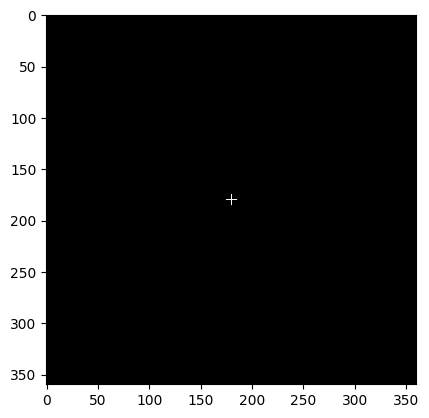

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


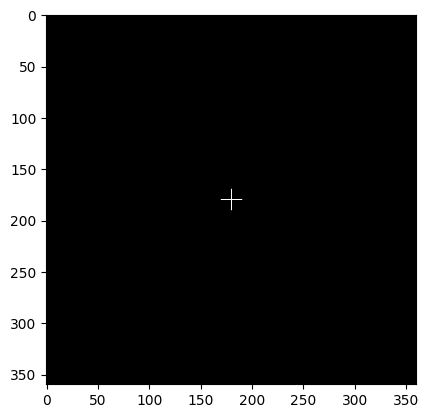

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


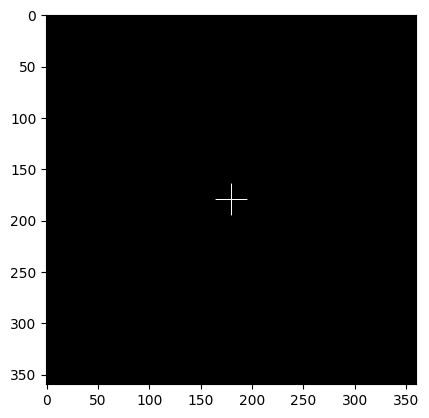

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


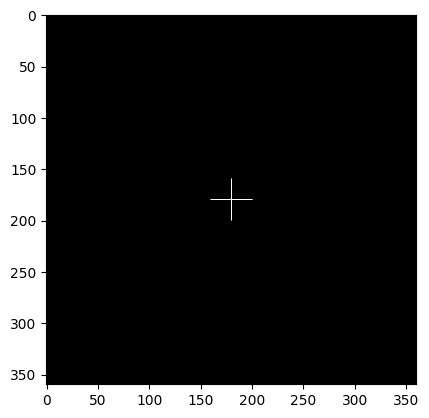

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


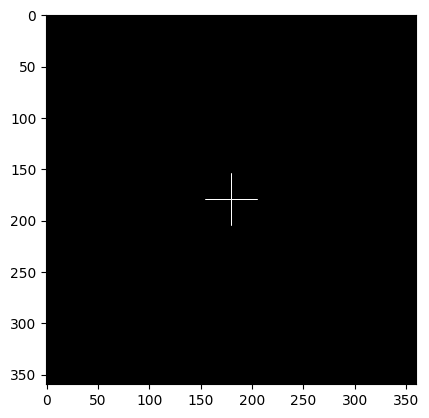

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


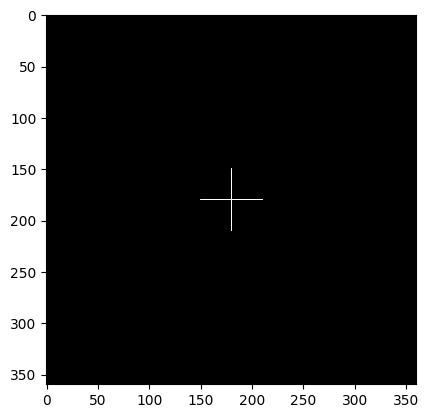

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


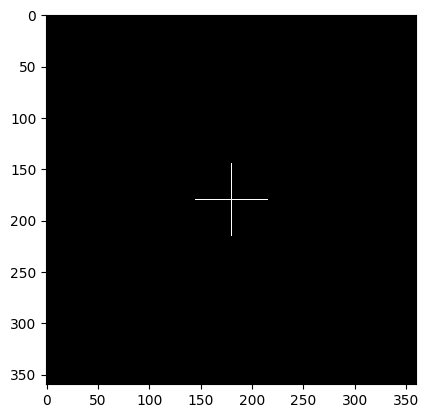

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


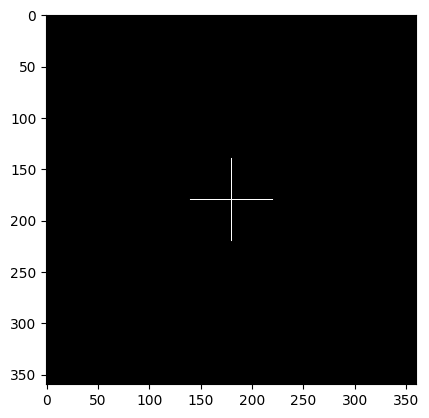

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


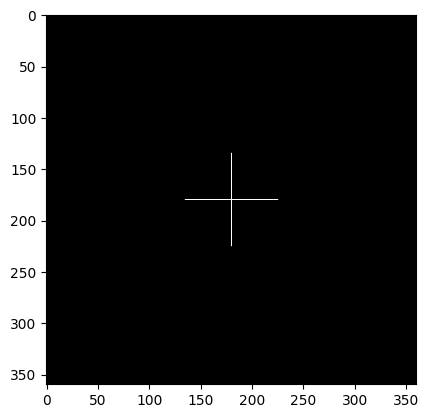

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


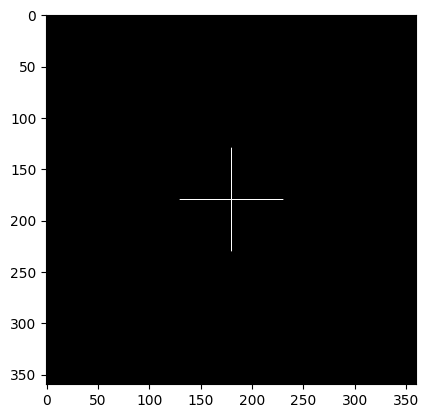

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


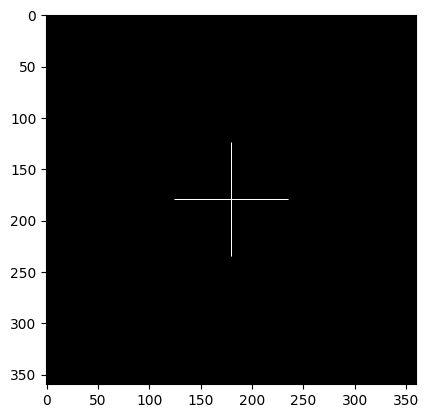

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


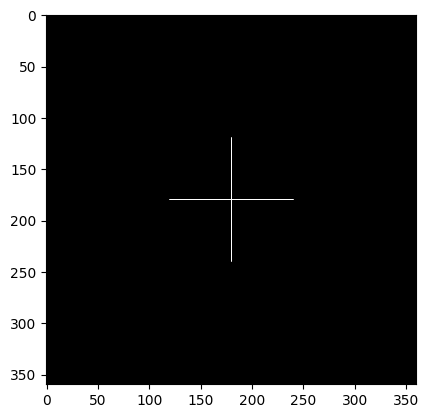

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


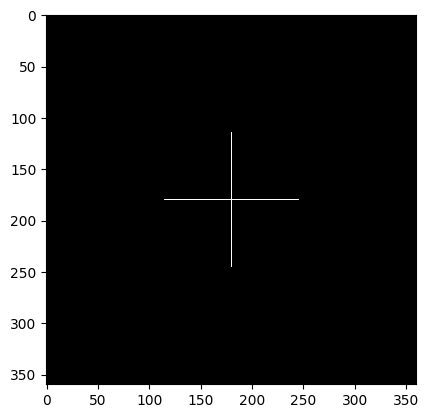

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


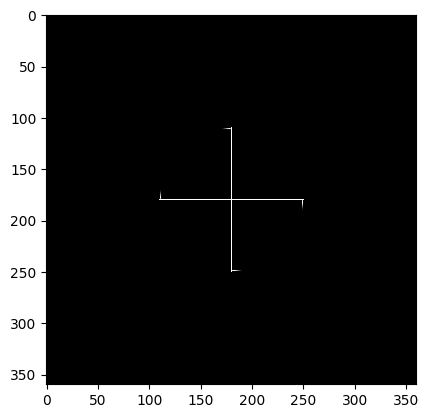

variance difference;  -12.067156380446477
75   32
Currently checking region with radius :  75


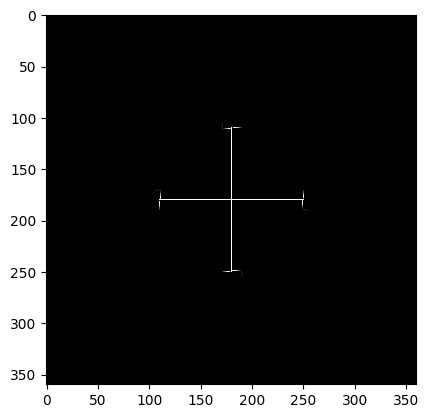

variance difference;  -11.339195894240078
80   32
Currently checking region with radius :  80


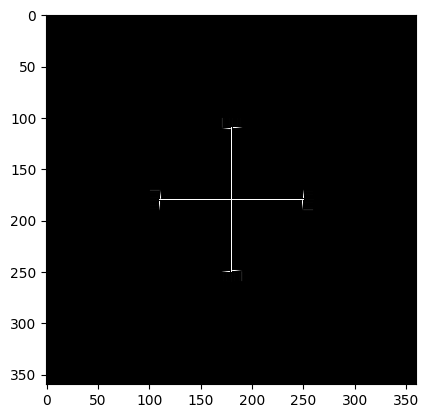

variance difference;  -1.5825080798824729
85   32
Currently checking region with radius :  85


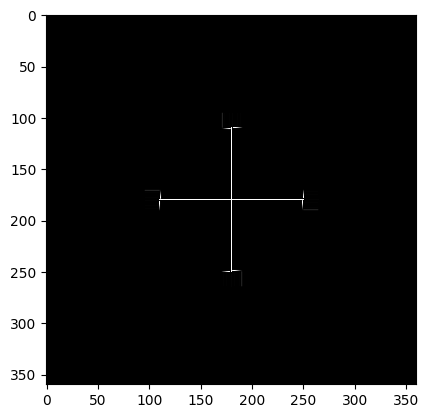

BLUR DETECTED AT RADIUS :  85
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  70
Differnece in variance :  8.17122148687568
Region with focal radius : 90




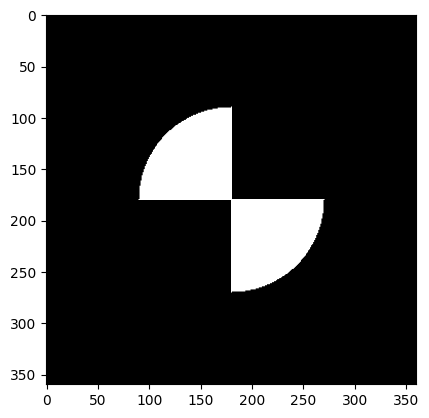

Test image with radius  90  being sharp with rest as blurred


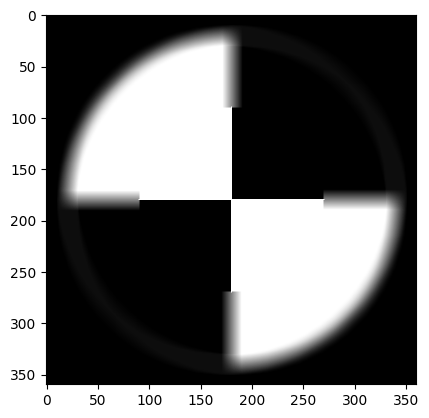

difference in test image and filtered non blurred region (in circular fasion)


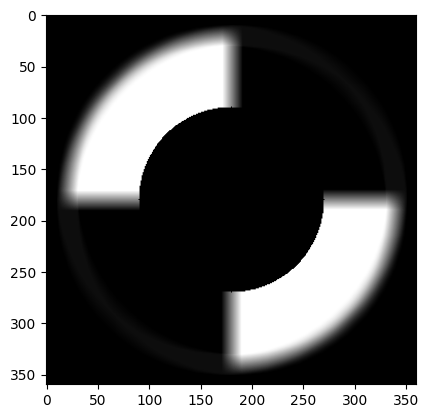

Visualization of separation of non blurred and blurred parts (radius = fr)


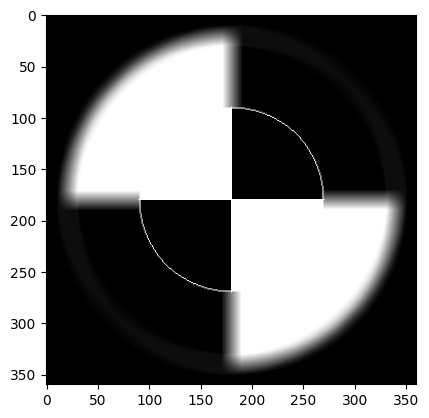

Laplacian Edge Mask


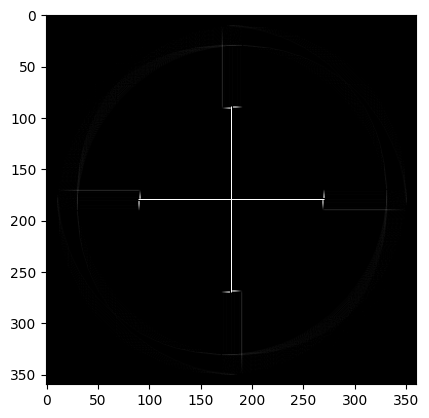

L O G edge mask


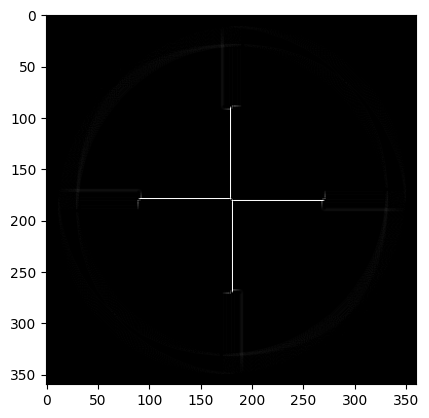

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


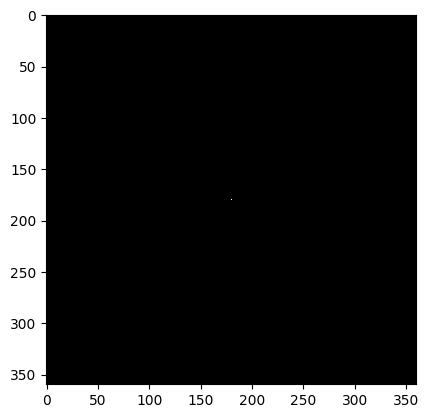

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


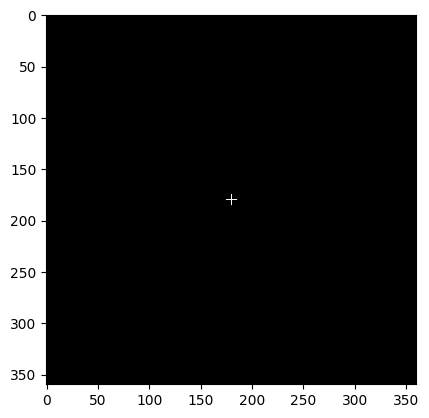

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


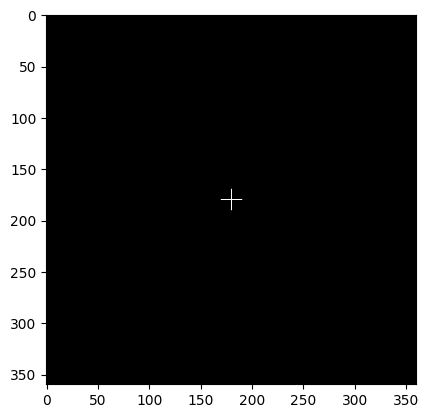

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


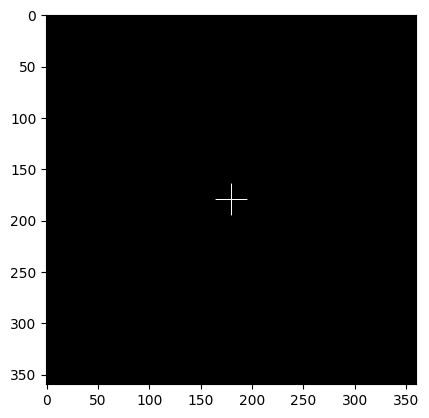

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


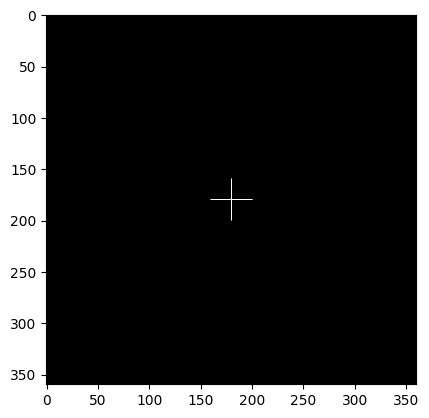

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


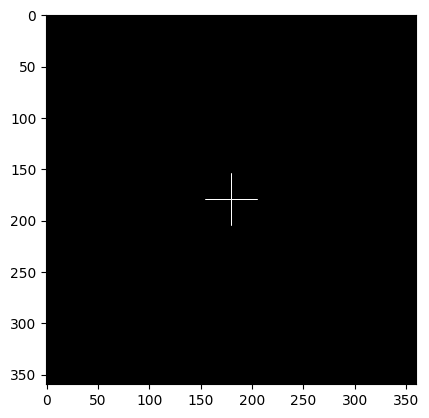

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


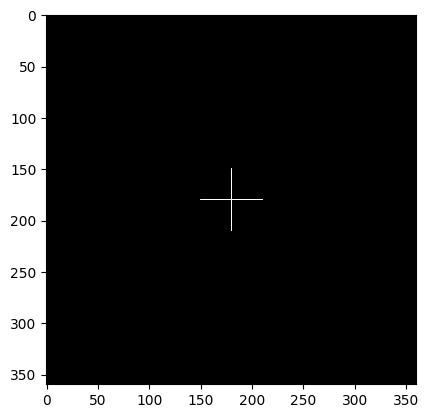

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


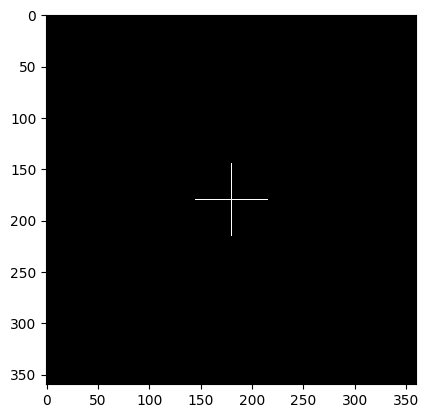

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


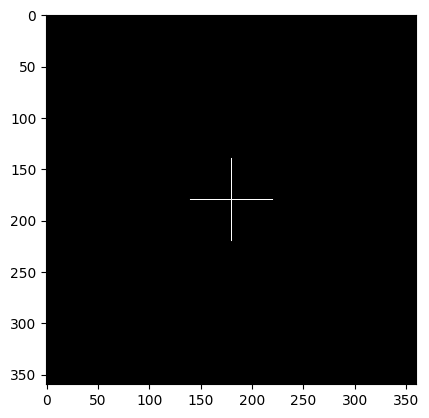

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


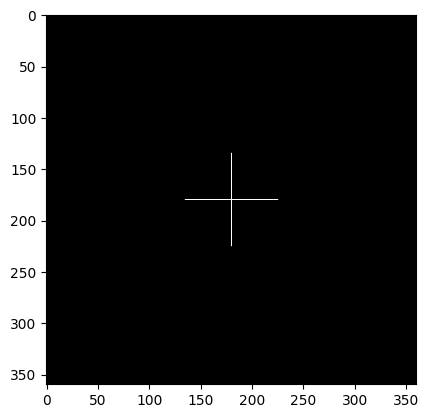

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


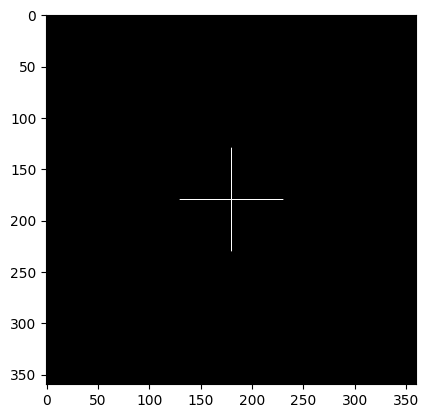

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


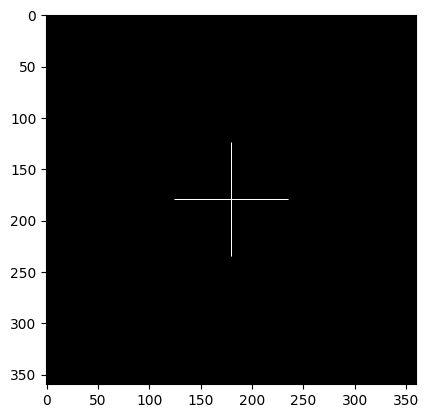

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


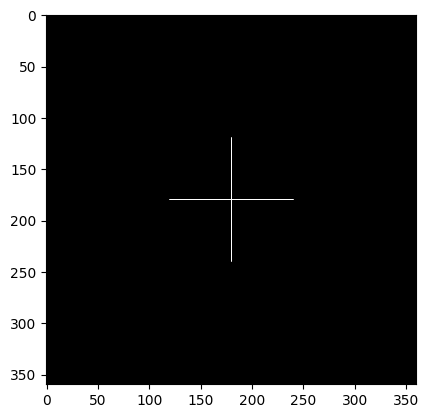

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


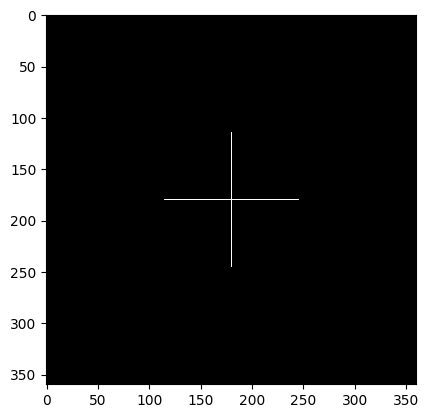

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


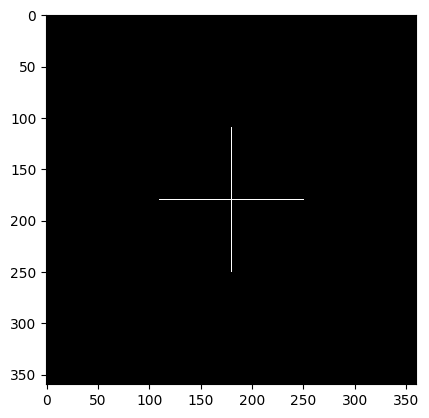

variance difference;  -3.694658738128254
75   32
Currently checking region with radius :  75


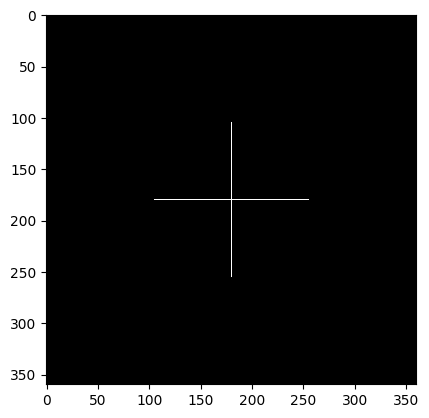

variance difference;  -3.6937411355333154
80   32
Currently checking region with radius :  80


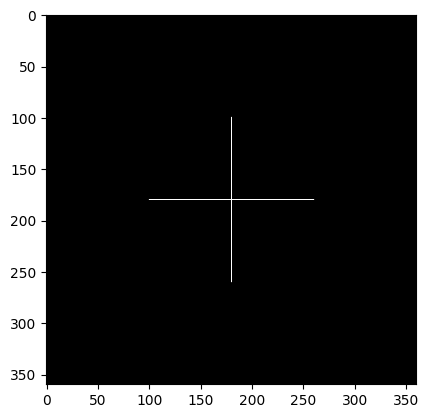

variance difference;  -3.692823532938462
85   32
Currently checking region with radius :  85


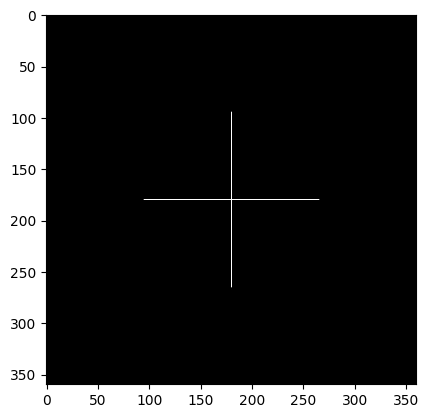

variance difference;  -3.691905930343495
90   32
Currently checking region with radius :  90


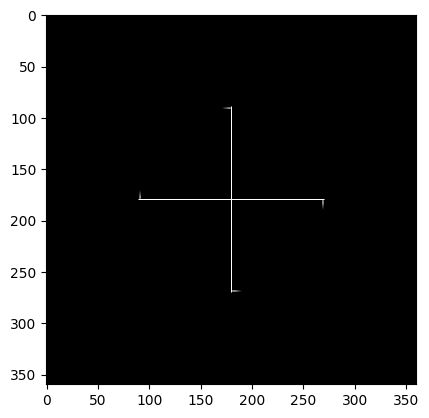

variance difference;  -12.049858569518221
95   32
Currently checking region with radius :  95


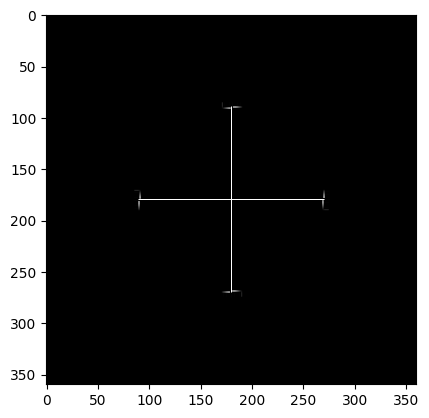

variance difference;  -11.317865733060415
100   32
Currently checking region with radius :  100


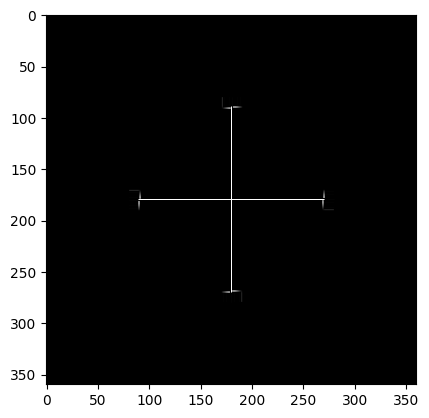

variance difference;  -1.5709430078661626
105   32
Currently checking region with radius :  105


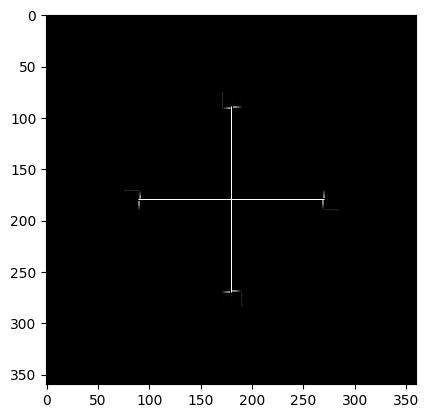

BLUR DETECTED AT RADIUS :  105
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  90
Differnece in variance :  8.17302146972878
Region with focal radius : 100




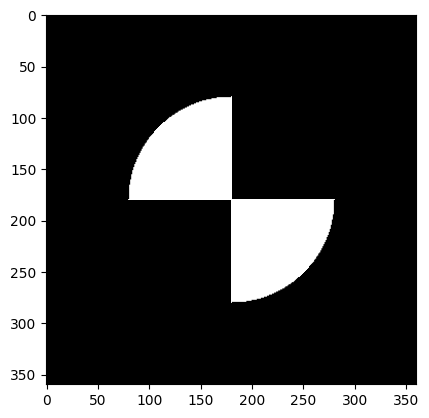

Test image with radius  100  being sharp with rest as blurred


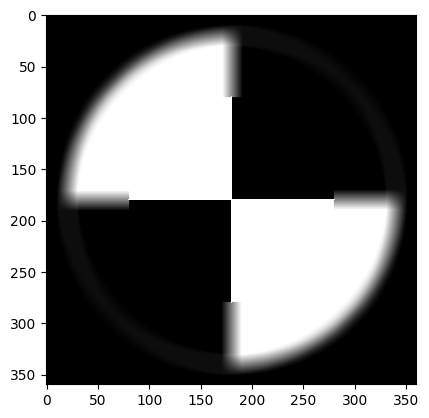

difference in test image and filtered non blurred region (in circular fasion)


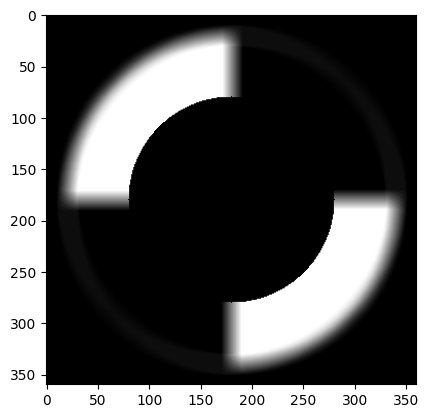

Visualization of separation of non blurred and blurred parts (radius = fr)


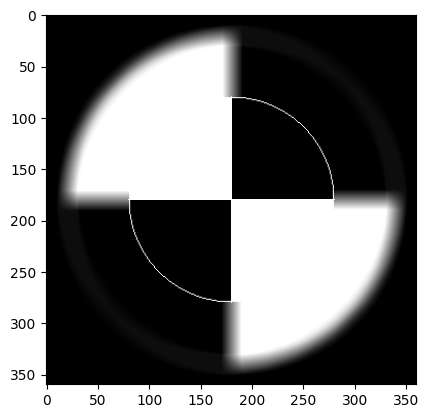

Laplacian Edge Mask


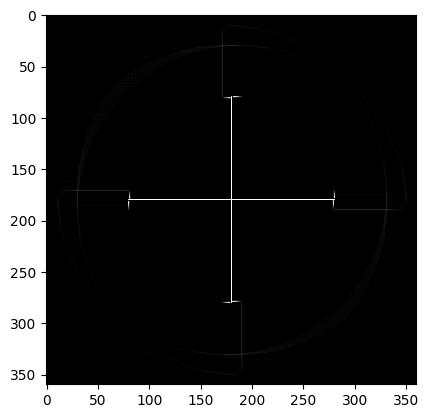

L O G edge mask


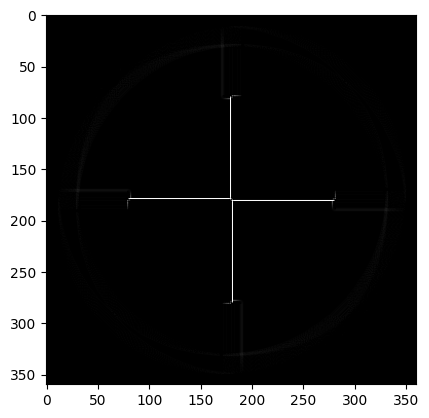

Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask
0   32
Currently checking region with radius :  0


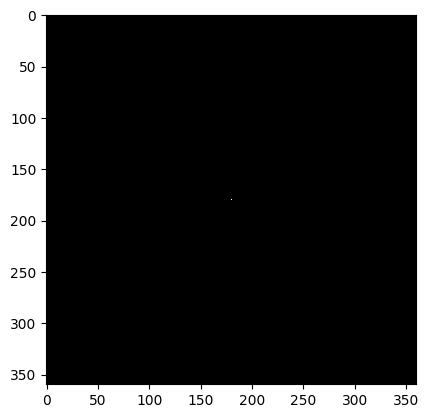

variance difference;  -0.5012384163404018
5   32
Currently checking region with radius :  5


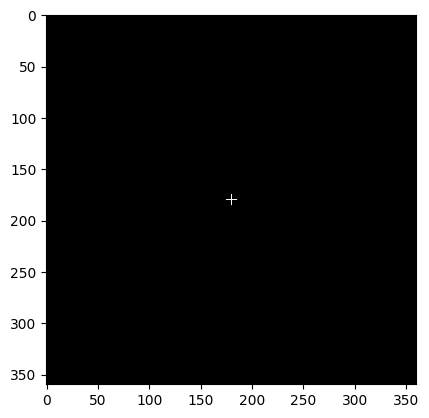

variance difference;  -3.7065875718616708
10   32
Currently checking region with radius :  10


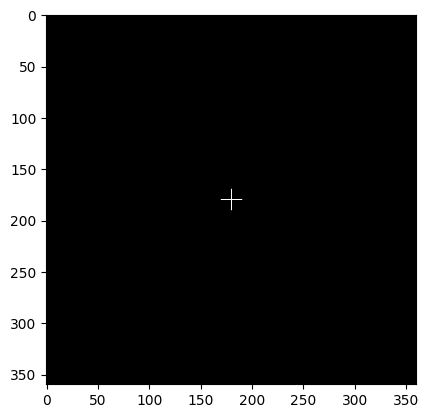

variance difference;  -3.7056699692667934
15   32
Currently checking region with radius :  15


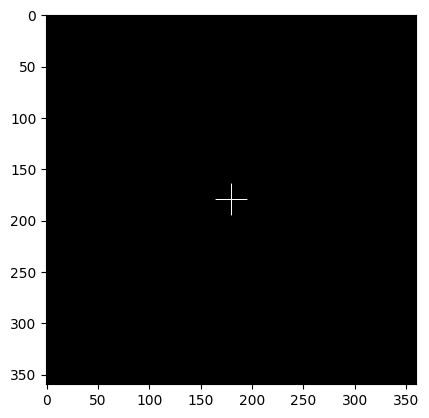

variance difference;  -3.704752366671908
20   32
Currently checking region with radius :  20


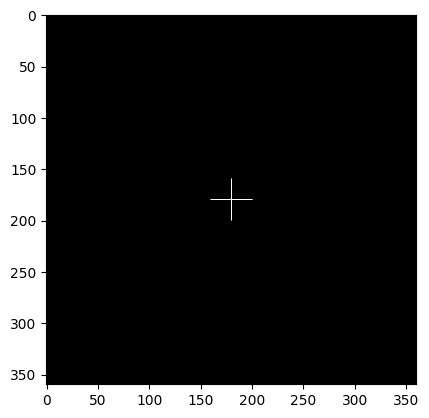

variance difference;  -3.7038347640770013
25   32
Currently checking region with radius :  25


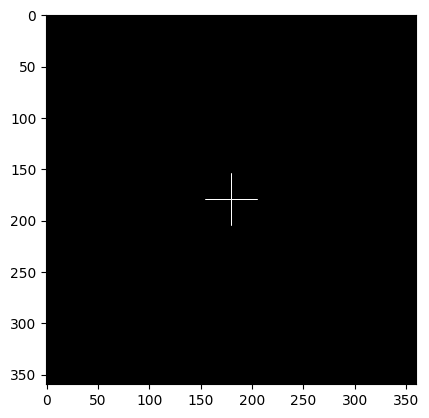

variance difference;  -3.702917161482155
30   32
Currently checking region with radius :  30


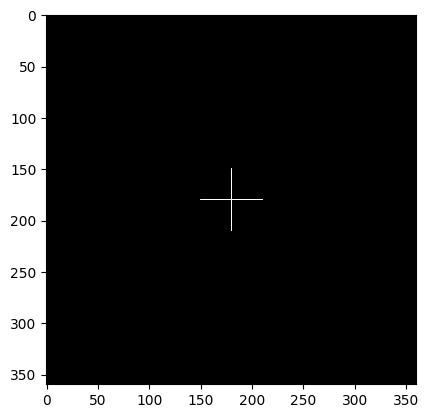

variance difference;  -3.701999558887252
35   32
Currently checking region with radius :  35


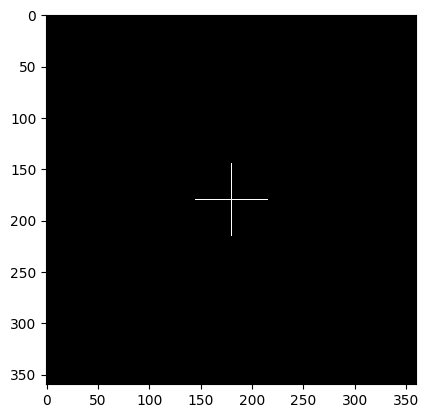

variance difference;  -3.7010819562923984
40   32
Currently checking region with radius :  40


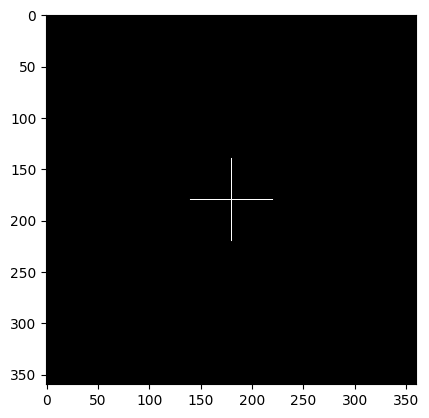

variance difference;  -3.7001643536974598
45   32
Currently checking region with radius :  45


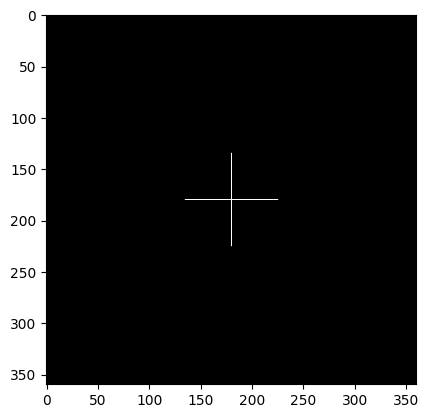

variance difference;  -3.699246751102706
50   32
Currently checking region with radius :  50


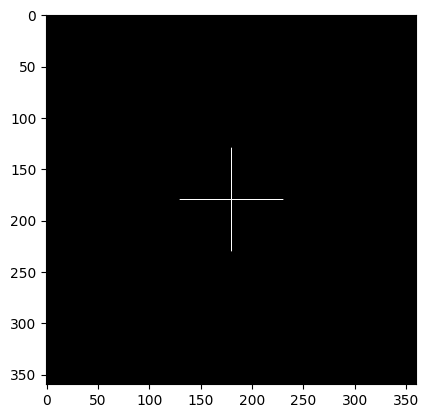

variance difference;  -3.6983291485077956
55   32
Currently checking region with radius :  55


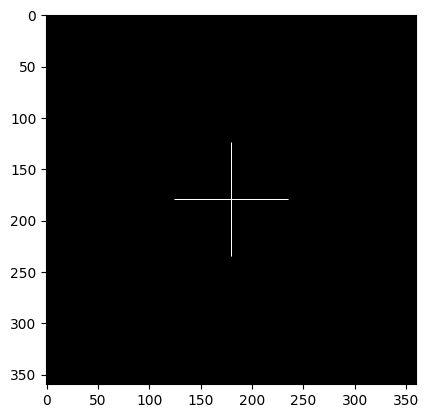

variance difference;  -3.6974115459128996
60   32
Currently checking region with radius :  60


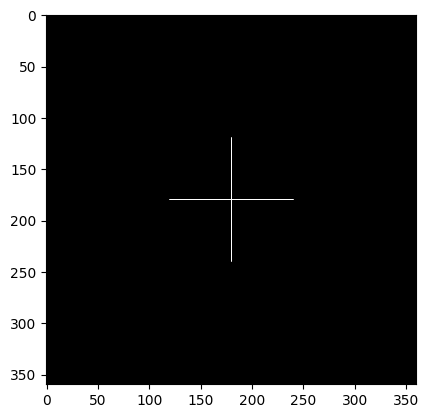

variance difference;  -3.6964939433179893
65   32
Currently checking region with radius :  65


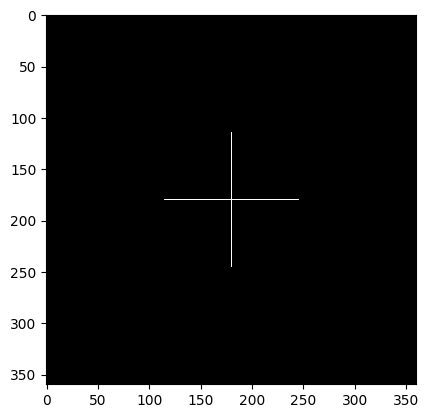

variance difference;  -3.6955763407231217
70   32
Currently checking region with radius :  70


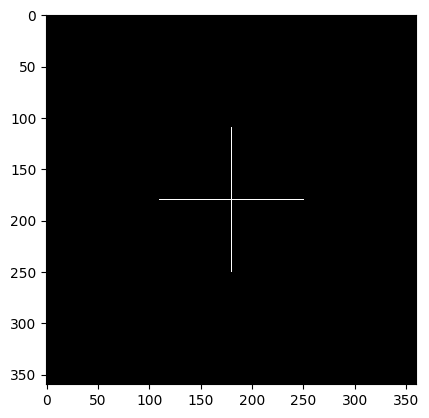

variance difference;  -3.694658738128254
75   32
Currently checking region with radius :  75


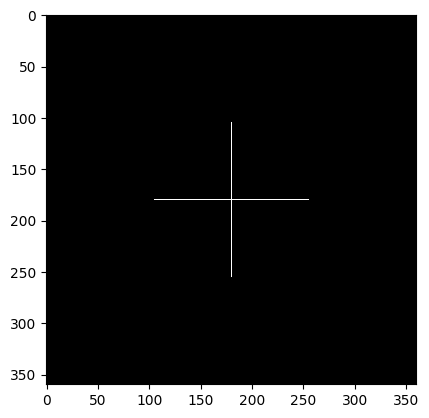

variance difference;  -3.6937411355333154
80   32
Currently checking region with radius :  80


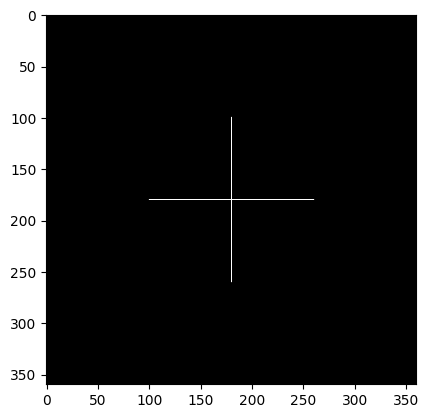

variance difference;  -3.692823532938462
85   32
Currently checking region with radius :  85


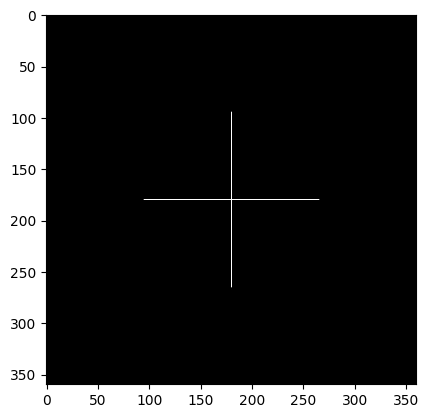

variance difference;  -3.691905930343495
90   32
Currently checking region with radius :  90


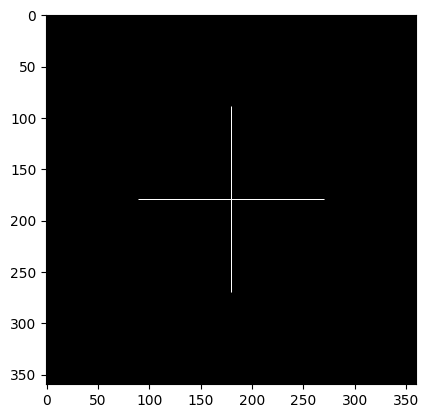

variance difference;  -3.6909883277487836
95   32
Currently checking region with radius :  95


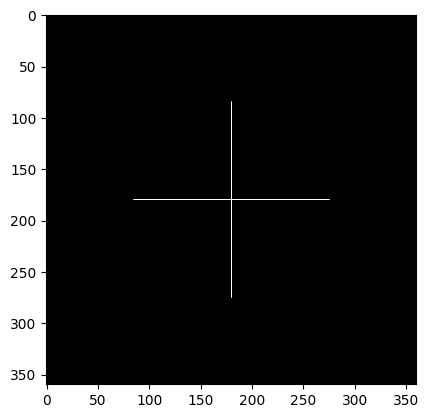

variance difference;  -3.6900707251539018
100   32
Currently checking region with radius :  100


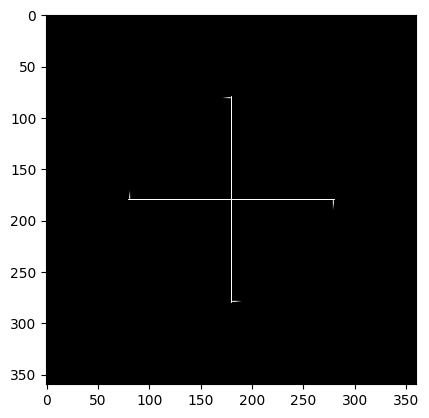

variance difference;  -12.041209664054264
105   32
Currently checking region with radius :  105


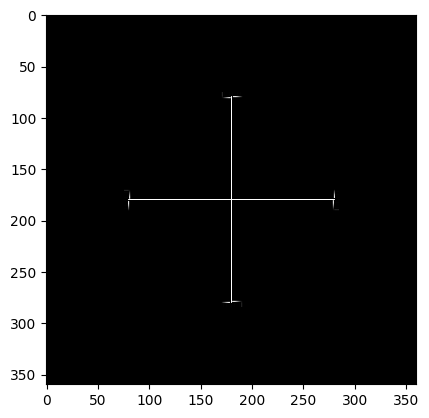

variance difference;  -11.307200652470527
110   32
Currently checking region with radius :  110


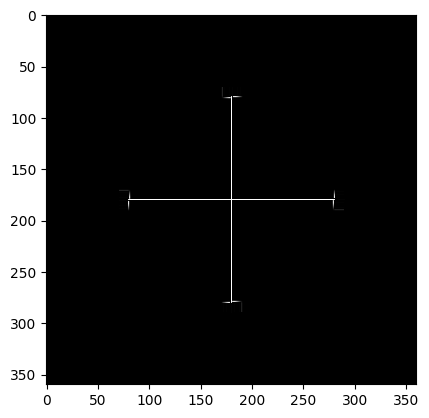

variance difference;  -1.5651604718577516
115   32
Currently checking region with radius :  115


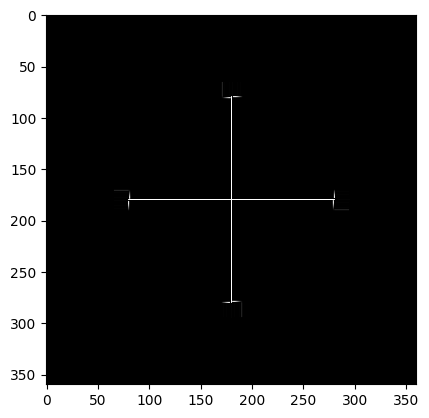

BLUR DETECTED AT RADIUS :  115
FOR VERIFICATION : CORRECT fr WAS AT RADIUS :  100
Differnece in variance :  8.173921461155516
------------------------------------------------------














In [70]:
focal_radiis = [10, 20, 30, 50, 70, 90, 100]
images = []
blur_kernels = [5, 15, 20]

for blur_kernel in blur_kernels:
    print('blurred image with box blur kernel : ', blur_kernel, ' x ', blur_kernel)
    blurred_image = cv2.blur(image, (blur_kernel,blur_kernel))
    plt.imshow(blurred_image, cmap='gray')
    plt.show()
    
    # Blur the original image using simple box blur, and create new images where from the center ro radius fr, the image is not blurred.

    for fr in focal_radiis:
        mask = np.zeros(IMG_DIMS, dtype=np.uint8)
        non_blurred_region = cv2.circle(mask, CENTER, fr, (255, 255, 255), -1)
        non_blurred_region = cv2.bitwise_and(non_blurred_region, image)
        print('Region with focal radius : ' + str(fr) + '\n\n')
        plt.imshow(non_blurred_region, cmap='gray')
        plt.show()

        blurred_image_copy = blurred_image.copy()
        blurred_image_copy = cv2.circle(blurred_image_copy, CENTER, fr, (0, 0, 0), -1)
        test_image = blurred_image_copy +  non_blurred_region
            
        print('Test image with radius ', fr, ' being sharp with rest as blurred')
        plt.imshow(test_image, cmap='gray')
        plt.show()

        print('difference in test image and filtered non blurred region (in circular fasion)')
        plt.imshow(test_image - non_blurred_region, cmap='gray')
        plt.show()

        print('Visualization of separation of non blurred and blurred parts (radius = fr)')
        test_image_copy = test_image.copy()
        plt.imshow(cv2.circle(test_image_copy, CENTER, fr, (255, 0, 0), 1), cmap='gray')
        plt.show()

        laplacian_filter_8 = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
        edge_mask = cv2.filter2D(test_image, -1, laplacian_filter_8)
        
        print('Laplacian Edge Mask')
        plt.imshow(edge_mask, cmap='gray')
        plt.show()

        gaussian_image = cv2.GaussianBlur(test_image, (3, 3), 3)
        g_edge_mask = cv2.filter2D(gaussian_image, -1, laplacian_filter_8)
        print('L O G edge mask')
        plt.imshow(g_edge_mask, cmap='gray')
        plt.show()

        print("Taking a list of radius from 1 -> IMG_DIMS in step size of 5, and comparing variances of edge mask")

        # Just using large variance for initial test case.
        variances = []
        previous_variance = 999999999999999 
        comparison_index = 0
        for i in range(0, RADIUS, 5):
            print(i, ' ', len(original_variances))
            mask = np.zeros(IMG_DIMS, dtype=np.uint8)
            curr_radius_check_range = cv2.circle(mask, CENTER, i, (255, 255, 255), -1)
            curr_region_to_check = cv2.bitwise_and(edge_mask, curr_radius_check_range)
            print('Currently checking region with radius : ', i)
            plt.imshow(curr_region_to_check, cmap='gray')
            plt.show()
            
            var = curr_region_to_check.var()
            if var < original_variances[comparison_index]:
                print('BLUR DETECTED AT RADIUS : ', i)
                print('FOR VERIFICATION : CORRECT fr WAS AT RADIUS : ', fr)
                print('Differnece in variance : ', original_variances[comparison_index] - var)
                break
            print('variance difference; ', original_variances[comparison_index] - var)
            variances.append(var)
            comparison_index += 1

        #print(variances)
        
    print('------------------------------------------------------\n\n\n\n\n\n\n\n\n\n\n\n')

#print(original_variances)